## E-Commerce Capstone Project - Market Mix Modelling

### Problem Statement

ElecKart is an e-commerce firm based out of Ontario, Canada specialising in electronic products. Over the last one year, they had spent a significant amount of money on marketing. Occasionally, they had also offered big-ticket promotions (similar to the Big Billion Day). They are about to create a marketing budget for the next year, which includes spending on commercials, online campaigns, and pricing & promotion strategies. The CFO feels that the money spent over the last 12 months on marketing was not sufficiently impactful, and, that they can either cut on the budget or reallocate it optimally across marketing levers to improve the revenue response.

Imagine that you are a part of the marketing team working on budget optimisation. You need to develop a market mix model to observe the actual impact of different marketing variables over the last year. Using your understanding of the model, you have to recommend the optimal budget allocation for different marketing levers for the next year.

### Project Objectives

**Exploratory Data Analysis**<br>
Perform Univariates, Bivariates, Correlation, Cross-tabs and visualizations on the pre-analytical dataset. Obtain insights and shortlist variables for modelling. Create the KPIs as required for modelling and write appropriate comments for choosing those KPIs.
 
**Modelling**<br>
Build basic, logarithmic and multiplicative models or any other model that are possible with the available dataset. Analyse the impact of various attributes on the target variable through appropriate metrics. 

**Presentation of Results**<br>
Choose the best ones for each of the three product sub-categories and explain them to the CMO,  CFO etc.<br>
Create a powerpoint presentation explaining the best models. The audience should be able to intuitively understand the variables and their importance in predicting future sales. Point out any surprising or unexpected trends you notice.

### Importing the Basic EDA Libraries

In [1]:
# Supress Warnings
import warnings
warnings.filterwarnings('ignore')

In [2]:
#import all the necessary libraries

import pandas as pd
import numpy as np
import pandas as pd

# Reading the doc file
# pip install --pre python-docx
import io
import csv
from docx import Document


# For Visualisation
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

# For Modelling
import statsmodels.api as sm 
import sklearn

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler

from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression


from sklearn.model_selection import KFold
from sklearn.preprocessing import scale
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score

# Check for the VIF values of the feature variables. 
from statsmodels.stats.outliers_influence import variance_inflation_factor

import holidays # Has dataset for holidays by country

import datetime


### Reading and Understanding the Different Datasets

### 1. The Consumer Electronics dataset

**Reading the dataset**

In [3]:
# Importing the dataset
consumer_electronics = pd.read_csv('ConsumerElectronics.csv')

In [4]:
# Shape of the dataset
consumer_electronics.shape

(1648824, 20)

In [5]:
# Looking at the columns in the data
consumer_electronics.dtypes

fsn_id                              object
order_date                          object
Year                                 int64
Month                                int64
order_id                           float64
order_item_id                      float64
gmv                                 object
units                                int64
deliverybdays                       object
deliverycdays                       object
s1_fact.order_payment_type          object
sla                                  int64
cust_id                             object
pincode                             object
product_analytic_super_category     object
product_analytic_category           object
product_analytic_sub_category       object
product_analytic_vertical           object
product_mrp                          int64
product_procurement_sla              int64
dtype: object

In [6]:
consumer_electronics.head()

,fsn_id,order_date,Year,Month,order_id,order_item_id,gmv,units,deliverybdays,deliverycdays,s1_fact.order_payment_type,sla,cust_id,pincode,product_analytic_super_category,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla
0,ACCCX3S58G7B5F6P,2015-10-17 15:11:54,2015,10,3.419301e+15,3.419301e+15,6400,1,\N,\N,COD,5,-1.01299130778588E+018,-7.79175582905735E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,7190,0
1,ACCCX3S58G7B5F6P,2015-10-19 10:07:22,2015,10,1.420831e+15,1.420831e+15,6900,1,\N,\N,COD,7,-8.99032457905512E+018,7.33541149097431E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,7190,0
2,ACCCX3S5AHMF55FV,2015-10-20 15:45:56,2015,10,2.421913e+15,2.421913e+15,1990,1,\N,\N,COD,10,-1.0404429420466E+018,-7.47768776228657E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3
3,ACCCX3S5AHMF55FV,2015-10-14 12:05:15,2015,10,4.416592e+15,4.416592e+15,1690,1,\N,\N,Prepaid,4,-7.60496084352714E+018,-5.83593163877661E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3
4,ACCCX3S5AHMF55FV,2015-10-17 21:25:03,2015,10,4.419525e+15,4.419525e+15,1618,1,\N,\N,Prepaid,6,2.8945572083453E+018,5.34735360997242E+017,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3


In [7]:
# Looking at the topline distributions for all the numerical columns
consumer_electronics.describe()

,Year,Month,order_id,order_item_id,units,sla,product_mrp,product_procurement_sla
count,1.648824e+06,1.648824e+06,1.648824e+06,1.648824e+06,1.648824e+06,1.648824e+06,1.648824e+06,1.648824e+06
mean,2.015519e+03,6.585650e+00,2.842445e+15,1.375628e+16,1.022087e+00,5.687832e+00,4.108309e+03,5.403451e+00
std,4.996557e-01,3.623351e+00,1.269134e+15,5.594598e+16,2.535318e-01,2.983336e+00,8.510918e+03,5.346618e+01
min,2.015000e+03,1.000000e+00,7.633152e+07,1.080165e+08,1.000000e+00,0.000000e+00,0.000000e+00,-1.000000e+00
25%,2.015000e+03,3.000000e+00,1.602589e+15,1.606725e+15,1.000000e+00,4.000000e+00,7.990000e+02,1.000000e+00
50%,2.016000e+03,6.000000e+00,2.611825e+15,2.619185e+15,1.000000e+00,6.000000e+00,1.599000e+03,2.000000e+00
75%,2.016000e+03,1.000000e+01,3.610614e+15,4.397706e+15,1.000000e+00,7.000000e+00,3.499000e+03,3.000000e+00
max,2.016000e+03,1.200000e+01,5.395077e+15,3.000373e+17,5.000000e+01,1.006000e+03,2.999990e+05,1.000000e+03


**Cleaning and pre-processing the data**

In [8]:
# Let's ensure that we don't have any duplicate rows in the data
consumer_electronics2 = consumer_electronics.drop_duplicates()
consumer_electronics2.shape

(1543981, 20)

In [9]:
# Converting the order to Date format
consumer_electronics2['order_date'] = consumer_electronics2['order_date'].astype(str)
consumer_electronics2['order_date'] = pd.to_datetime(consumer_electronics2['order_date'] , dayfirst=True)

In [10]:
# Converting all the id columns to object format
consumer_electronics2['order_id'] = consumer_electronics2['order_id'].astype('str')
consumer_electronics2['order_item_id'] = consumer_electronics2['order_item_id'].astype('str')
consumer_electronics2['cust_id'] = consumer_electronics2['cust_id'].astype('str')

In [11]:
consumer_electronics2.dtypes

fsn_id                                     object
order_date                         datetime64[ns]
Year                                        int64
Month                                       int64
order_id                                   object
order_item_id                              object
gmv                                        object
units                                       int64
deliverybdays                              object
deliverycdays                              object
s1_fact.order_payment_type                 object
sla                                         int64
cust_id                                    object
pincode                                    object
product_analytic_super_category            object
product_analytic_category                  object
product_analytic_sub_category              object
product_analytic_vertical                  object
product_mrp                                 int64
product_procurement_sla                     int64


In [12]:
# Filtering the data for only the required dates
import datetime
start = datetime.datetime.strptime("01-07-2015", "%d-%m-%Y")
end = datetime.datetime.strptime("01-07-2016", "%d-%m-%Y")
consumer_electronics2=consumer_electronics2[(consumer_electronics2['order_date']>=start) & (consumer_electronics2['order_date']<end)]
consumer_electronics2.shape

(1543372, 20)

In [13]:
# Removing observations with 0's for units and mrp values
consumer_electronics2=consumer_electronics2[consumer_electronics2['units']!=0]
consumer_electronics2=consumer_electronics2[consumer_electronics2['product_mrp']!=0]
consumer_electronics2.shape

(1538445, 20)

In [14]:
# Checking for any null values in the respective columns
consumer_electronics2.isnull().sum()

fsn_id                             0
order_date                         0
Year                               0
Month                              0
order_id                           0
order_item_id                      0
gmv                                0
units                              0
deliverybdays                      0
deliverycdays                      0
s1_fact.order_payment_type         0
sla                                0
cust_id                            0
pincode                            0
product_analytic_super_category    0
product_analytic_category          0
product_analytic_sub_category      0
product_analytic_vertical          0
product_mrp                        0
product_procurement_sla            0
dtype: int64

In [15]:
# We see that there are no null values in the data present explicitly
# However, on observing the first few rows of the data, it's seen that the missing data is presented as '\N' or empty spaces
# Identifying the percentage of observations with these nulls
for i in range(len(consumer_electronics2.columns)):
    a = consumer_electronics2[consumer_electronics2.columns[i]].astype('str').str.contains('\\', regex=False).sum()
    b = (consumer_electronics2[consumer_electronics2.columns[i]].astype('str')==' ').sum()
    print(consumer_electronics2.columns[i], '  ' , round((a+b)*100/consumer_electronics2.count()[i], 2), '%', sep = '')

fsn_id  0.0%
order_date  0.0%
Year  0.0%
Month  0.0%
order_id  0.0%
order_item_id  0.0%
gmv  0.26%
units  0.0%
deliverybdays  78.26%
deliverycdays  78.26%
s1_fact.order_payment_type  0.0%
sla  0.0%
cust_id  0.26%
pincode  0.26%
product_analytic_super_category  0.0%
product_analytic_category  0.0%
product_analytic_sub_category  0.0%
product_analytic_vertical  0.38%
product_mrp  0.0%
product_procurement_sla  0.0%


In [16]:
# There is significant share of missing values for the columns "deliverybdays" and "deliverycdays"
# Hence, it's safe to drop these columns from the data
consumer_electronics2 = consumer_electronics2.drop(['deliverybdays', "deliverycdays"], axis = 1)

Treating the remaining missing values in the dataset. We have missing values in the columns: "gmv", "cust_id", "pincode", "product_analytic_vertical". Let's look at each of them individually

In [17]:
# Missing value treatment for 'gmv' column
# GMV = Product Value * Quantity Purchased
# We can identify the product price from the existing datapoints, and multiply with the qty to identify missing gmv values

# First, Creating a product to gmv lookup where we'll consider the most frequent gmv value for any product
product_prices = consumer_electronics2.loc[consumer_electronics2['gmv'].astype('str')!=' ', ['fsn_id', 'gmv', 'units']]
product_prices['product_price'] = pd.to_numeric(product_prices['gmv'])/pd.to_numeric(product_prices['units'])
product_prices = pd.DataFrame(product_prices.groupby(['fsn_id', 'product_price'])['gmv'].count()).reset_index()
product_prices.columns = ['fsn_id', 'product_price', 'cnt']
product_prices = product_prices.loc[product_prices.groupby(['fsn_id'])['cnt'].idxmax()]

# Replacing the missing gmv values based on the new fsn-product price lu created above and multiplying the units
tmp = consumer_electronics2.copy()
tmp = pd.merge(consumer_electronics2, product_prices, on='fsn_id', how='left').copy()
tmp.loc[tmp['gmv'].astype('str')==' ', 'gmv'] = tmp['product_price']*tmp['units'] # Replace gmv missing values

# Finally, removing the additional merged columns, so that we get our initial columns back - without the missing values
consumer_electronics2 = tmp[consumer_electronics2.columns]

In [18]:
# Converting gmv column to numeric format
consumer_electronics2['gmv'] = pd.to_numeric(consumer_electronics2['gmv'])

In [19]:
# Missing value treatment for "cust_id" column
# We know that the orderid will be the same for any particular customer
# Let's identify the order id's for each cust_id and impute missing values based on that

# Creating cust_id to orderid lu for existing cust_id data
cust_order_ids = consumer_electronics2.loc[consumer_electronics2['cust_id']!=' ', ['order_id', 'cust_id']].drop_duplicates()
cust_order_ids.columns = ['order_id', 'cust_id2']

# Imputing blank cust_id values based on above lu
tmp = consumer_electronics2.copy()
tmp = pd.merge(consumer_electronics2, cust_order_ids, on='order_id', how='left').copy()
tmp.loc[tmp['cust_id']==' ', 'cust_id'] = tmp['cust_id2']

# Finally, removing the additional merged columns, so that we get our initial columns back - without the missing values
consumer_electronics2 = tmp[consumer_electronics2.columns]

In [20]:
# dealing with the pincode variable
# getting the distinct values in the pincode variable
print('distinct pincodes = ', consumer_electronics2['pincode'].nunique())

# Given that we have a very large no. of categories in the pincode variable, let's omit this variable for now  from our data
# Also, since this variable doesn't provide any major business context in our case, it's safe to omit it from the data
consumer_electronics2 = consumer_electronics2.drop('pincode', axis =1)


distinct pincodes =  12966


In [21]:
# Missing value treatment for "product_analytic_vertical" column
# We know that the product_analytic_vertical will be the same for any particular product
# Let's identify the product_analytic_vertical for each fsn_id and impute missing values based on that

# Creating fsn_id to product_analytic_vertical lu for existing fsn_id data
fsn_prodvert_lu = consumer_electronics2.loc[~consumer_electronics2['product_analytic_vertical'].astype('str').str.contains('\\', regex=False), ['fsn_id', 'product_analytic_vertical']].drop_duplicates()
fsn_prodvert_lu.columns = ['fsn_id', 'product_analytic_vertical2']

# Imputing blank product_analytic_vertical values based on above lu
tmp = consumer_electronics2.copy()
tmp = pd.merge(consumer_electronics2, fsn_prodvert_lu, on='fsn_id', how='left').copy()
tmp.loc[tmp['product_analytic_vertical'].astype('str').str.contains('\\', regex=False), 'product_analytic_vertical'] = tmp['product_analytic_vertical2']

# Finally, removing the additional merged columns, so that we get our initial columns back - without the missing values
consumer_electronics2 = tmp[consumer_electronics2.columns]

In [22]:
# Finally, let's check whether all missing values have been treated

for i in range(len(consumer_electronics2.columns)):
    a = consumer_electronics2[consumer_electronics2.columns[i]].astype('str').str.contains('\\', regex=False).sum()
    b = (consumer_electronics2[consumer_electronics2.columns[i]].astype('str')==' ').sum()
    print(consumer_electronics2.columns[i], '  ' , round((a+b)*100/consumer_electronics2.count()[i], 2), '%', sep = '')

fsn_id  0.0%
order_date  0.0%
Year  0.0%
Month  0.0%
order_id  0.0%
order_item_id  0.0%
gmv  0.0%
units  0.0%
s1_fact.order_payment_type  0.0%
sla  0.0%
cust_id  0.0%
product_analytic_super_category  0.0%
product_analytic_category  0.0%
product_analytic_sub_category  0.0%
product_analytic_vertical  0.0%
product_mrp  0.0%
product_procurement_sla  0.0%


In [23]:
# treating -ve values in 'product_procurement_sla' appropriately
# We'll replace any -ve values with 0
def replace_negvalues(x):
    if x<0:
        return 0
    else:
        return x

consumer_electronics2['product_procurement_sla'] = consumer_electronics2['product_procurement_sla'].apply(replace_negvalues)

### 2. The Product List dataset

In [24]:
#Productlist Data imported
product_list = pd.read_excel('Media data and other information.xlsx', sheet_name=0,header=1).reset_index()
product_list = product_list[['Unnamed: 1', 'Frequency', 'Percent']]
product_list.columns = ['Product', 'Frequency', 'Percent']
product_list.head()

,Product,Frequency,Percent
0,\N,5828,0.353464
1,AmplifierReceiver,4056,0.245994
2,AudioMP3Player,112892,6.846819
3,Binoculars,14599,0.885419
4,BoomBox,2879,0.174609


### 3. The Media Investment dataset

In [25]:
#Import Media_Investments Data
media_investment= pd.read_excel('Media data and other information.xlsx', sheet_name=1, index_col=0,header=2).reset_index()
media_investment = media_investment[['Year', 'Month', 'Total Investment', 'TV', 'Digital',
       'Sponsorship', 'Content Marketing', 'Online marketing', ' Affiliates',
       'SEM', 'Radio', 'Other']]
media_investment.head()

,Year,Month,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other
0,2015.0,7.0,17.061775,0.215330,2.533014,7.414270,0.000933,1.327278,0.547254,5.023697,NaN,NaN
1,2015.0,8.0,5.064306,0.006438,1.278074,1.063332,0.000006,0.129244,0.073684,2.513528,NaN,NaN
2,2015.0,9.0,96.254380,3.879504,1.356528,62.787651,0.610292,16.379990,5.038266,6.202149,NaN,NaN
3,2015.0,10.0,170.156297,6.144711,12.622480,84.672532,3.444075,24.371778,6.973711,31.927011,NaN,NaN
4,2015.0,11.0,51.216220,4.220630,1.275469,14.172116,0.168633,19.561574,6.595767,5.222032,NaN,NaN


In [26]:
media_investment = media_investment.iloc[:,:][:12]

In [27]:
# Converting all currency values into crores
currency_cols = ['Total Investment', 'TV', 'Digital', 'Sponsorship','Content Marketing', 'Online marketing', ' Affiliates', 
                  'SEM', 'Radio', 'Other']
media_investment[currency_cols]=media_investment[currency_cols].multiply(10000000, axis=1)

In [28]:
# Replacing all null values with 0
media_investment = media_investment.fillna(0)

In [29]:
media_investment.head()

,Year,Month,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other
0,2015.0,7.0,1.706178e+08,2.153302e+06,2.533014e+07,7.414270e+07,9.328975e+03,1.327278e+07,5.472539e+06,5.023697e+07,0.0,0.0
1,2015.0,8.0,5.064306e+07,6.438073e+04,1.278074e+07,1.063332e+07,6.325130e+01,1.292443e+06,7.368398e+05,2.513528e+07,0.0,0.0
2,2015.0,9.0,9.625438e+08,3.879504e+07,1.356528e+07,6.278765e+08,6.102921e+06,1.637999e+08,5.038266e+07,6.202149e+07,0.0,0.0
3,2015.0,10.0,1.701563e+09,6.144711e+07,1.262248e+08,8.467253e+08,3.444075e+07,2.437178e+08,6.973711e+07,3.192701e+08,0.0,0.0
4,2015.0,11.0,5.121622e+08,4.220630e+07,1.275469e+07,1.417212e+08,1.686332e+06,1.956157e+08,6.595767e+07,5.222032e+07,0.0,0.0


### 4. The Special Sale Calendar dataset

In [30]:
#Special Sales Dates have been imported
special_sale_calendar = pd.read_excel('Media data and other information.xlsx', sheet_name=2, index_col=0,header=1).reset_index()
special_sale_calendar = special_sale_calendar[['Unnamed: 1', 'Sales Calendar']]
special_sale_calendar.columns = ['Year', 'Sales Calendar']
special_sale_calendar


,Year,Sales Calendar
0,2015.0,(18-19th July)
1,NaN,(15-17th Aug)
2,NaN,(28-30th Aug)
3,NaN,(17-15th Oct)
4,NaN,(7-14th Nov)
5,NaN,(25th Dec'15 - 3rd Jan'16)
6,2016.0,(20-22 Jan)
7,NaN,(1-2 Feb)
8,NaN,(20-21 Feb)
9,NaN,(14-15 Feb)


In [31]:
# Creating a series for the dates with sales from above data
sale_dates = pd.Series(["2015-07-18","2015-07-19","2015-08-15","2015-08-16","2015-09-17","2015-08-28","2015-08-29",
                        "2015-08-30","2015-10-15","2015-10-16","2015-10-17","2015-11-07","2015-11-08","2015-11-09",
                        "2015-11-10","2015-11-11","2015-11-12","2015-11-13","2015-11-14","2015-12-25","2015-12-26",
                        "2015-12-27","2015-12-28","2015-12-29","2015-12-30","2015-12-31","2016-01-01","2016-01-02",
                        "2016-01-03","2016-01-20","2016-01-21","2016-01-22","2016-02-01","2016-02-02","2016-02-14",
                        "2016-02-15","2016-02-20","2016-02-21","2016-03-07","2016-03-08","2016-03-09","2016-05-25",
                        "2016-05-26","2016-05-27"])

# Converting series to dataframe
special_sale_calendar = pd.DataFrame(sale_dates)
special_sale_calendar.columns = ['sale_dates']

In [32]:
#Converting Special Sale Date converted from object to Date Format
special_sale_calendar['sale_dates'] = special_sale_calendar['sale_dates'].astype(str)
special_sale_calendar['sale_dates']  = pd.to_datetime(special_sale_calendar['sale_dates'] , dayfirst=True)
special_sale_calendar.dtypes

sale_dates    datetime64[ns]
dtype: object

In [33]:
special_sale_calendar.head()

,sale_dates
0,2015-07-18
1,2015-07-19
2,2015-08-15
3,2015-08-16
4,2015-09-17


### 5. The Monthly NPS Score dataset

In [34]:
# Importing the dataset
nps_stock = pd.read_excel('Media data and other information.xlsx', sheet_name=3, index_col=0,header=1)
nps_stock.head()

,July'15,Aug'15,Sept'15,Oct'15,Nov'15,Dec'15,Jan'16,Feb'16,Mar'16,Apr'16,May'16,June'16
NPS,54.599588,59.987101,46.925419,44.398389,47.0,45.8,47.093031,50.327406,49.02055,51.827605,47.306951,50.516687
Stock Index,1177.000000,1206.000000,1101.000000,1210.000000,1233.0,1038.0,1052.000000,1222.000000,1015.00000,1242.000000,1228.000000,1194.000000


In [35]:
# Transposing the dataframe
nps_stock = nps_stock.transpose().reset_index()
nps_stock.columns = ['Date', 'NPS', 'Stock Index']
nps_stock.head()

,Date,NPS,Stock Index
0,July'15,54.599588,1177.0
1,Aug'15,59.987101,1206.0
2,Sept'15,46.925419,1101.0
3,Oct'15,44.398389,1210.0
4,Nov'15,47.000000,1233.0


In [36]:
nps_stock.dtypes

Date            object
NPS            float64
Stock Index    float64
dtype: object

In [37]:
# Splitting the month and years into separate columns
nps_stock['Month'] = nps_stock['Date'].str.split("'").str[0]
nps_stock['Year'] = nps_stock['Date'].str.split("'").str[1]

# Mapping {Year=15 to 2015; Year=16 to 2016}
nps_stock['Year'] = nps_stock['Year'].map({'15':'2015', '16':'2016'})

In [38]:
nps_stock = nps_stock[['Year', 'Month', 'NPS', 'Stock Index']]
nps_stock.head()

,Year,Month,NPS,Stock Index
0,2015,July,54.599588,1177.0
1,2015,Aug,59.987101,1206.0
2,2015,Sept,46.925419,1101.0
3,2015,Oct,44.398389,1210.0
4,2015,Nov,47.000000,1233.0


In [39]:
def month_converter(month):
    months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'June', 'July', 'Aug', 'Sept', 'Oct', 'Nov', 'Dec']
    return months.index(month) + 1

nps_stock['Month'] = nps_stock['Month'].apply(lambda x: month_converter(x))
nps_stock

,Year,Month,NPS,Stock Index
0,2015,7,54.599588,1177.0
1,2015,8,59.987101,1206.0
2,2015,9,46.925419,1101.0
3,2015,10,44.398389,1210.0
4,2015,11,47.000000,1233.0
5,2015,12,45.800000,1038.0
6,2016,1,47.093031,1052.0
7,2016,2,50.327406,1222.0
8,2016,3,49.020550,1015.0
9,2016,4,51.827605,1242.0


### 6. Product Details word file

In [40]:
def read_docx_table(file, tab_id=None, **kwargs):
    def read_docx_tab(tab, **kwargs):
        strio = io.StringIO()
        writer = csv.writer(strio)
        for row in tab.rows:
            writer.writerow(cell.text for cell in row.cells)
        strio.seek(0)
        return pd.read_csv(strio, **kwargs)

    doc = Document(file)
    if tab_id is None:
        return [read_docx_tab(tab, **kwargs) for tab in doc.tables]
    else:
        try:
            return read_docx_tab(doc.tables[tab_id], **kwargs)
        except IndexError:
            print('Error: specified [tab_id]: {}  does not exist.'.format(tab_id))
            raise

product_details = read_docx_table('Product Details.docx')
product_details = pd.DataFrame(product_details[0])
product_details = product_details.drop(product_details.columns[0], axis=1)
product_details.head()

,category,sub_category,vertical
0,Camera,Camera,Camcorders
1,Camera,Camera,DSLR
2,Camera,Camera,Instant Cameras
3,Camera,Camera,Point & Shoot
4,Camera,Camera,SportsAndAction


### 7. Additional datasets

**The holidays dataset**

In [41]:
import holidays

# Importing Holidays for Canada ontario State for 2015-2016 Years
holidays = pd.DataFrame(pd.Series(holidays.CA(prov='ON',years=[2015,2016]))).reset_index()
holidays.columns = ['Date', 'Holiday_Flag']

In [42]:
holidays.head()

,Date,Holiday_Flag
0,2016-01-01,New Year's Day
1,2016-02-15,Family Day
2,2016-03-25,Good Friday
3,2016-05-23,Victoria Day
4,2016-07-01,Canada Day


**The weather dataset**

In [43]:
# Importing the dataset
weather2015 = pd.read_excel('ONTARIO-2015.xlsx', index_col=0,header=24)
weather2016 = pd.read_excel('ONTARIO-2016.xlsx', index_col=0,header=24)

In [44]:
# Append the 2 datasets
weather = pd.concat([weather2015, weather2016], ignore_index=True)

In [45]:
weather.dtypes

Year                           int64
Month                          int64
Day                            int64
Data Quality                  object
Max Temp (°C)                float64
Max Temp Flag                 object
Min Temp (°C)                float64
Min Temp Flag                 object
Mean Temp (°C)               float64
Mean Temp Flag                object
Heat Deg Days (°C)           float64
Heat Deg Days Flag            object
Cool Deg Days (°C)           float64
Cool Deg Days Flag            object
Total Rain (mm)              float64
Total Rain Flag               object
Total Snow (cm)              float64
Total Snow Flag               object
Total Precip (mm)            float64
Total Precip Flag             object
Snow on Grnd (cm)            float64
Snow on Grnd Flag             object
Dir of Max Gust (10s deg)    float64
Dir of Max Gust Flag         float64
Spd of Max Gust (km/h)       float64
Spd of Max Gust Flag         float64
dtype: object

In [46]:
weather.shape

(731, 26)

In [47]:
weather.head()

,Year,Month,Day,Data Quality,Max Temp (°C),Max Temp Flag,Min Temp (°C),Min Temp Flag,Mean Temp (°C),Mean Temp Flag,...,Total Snow (cm),Total Snow Flag,Total Precip (mm),Total Precip Flag,Snow on Grnd (cm),Snow on Grnd Flag,Dir of Max Gust (10s deg),Dir of Max Gust Flag,Spd of Max Gust (km/h),Spd of Max Gust Flag
0,2015,1,1,†,0.0,NaN,-8.5,NaN,-4.3,NaN,...,0.0,NaN,0.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN
1,2015,1,2,†,3.0,NaN,-3.0,NaN,0.0,NaN,...,0.0,NaN,0.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN
2,2015,1,3,†,2.5,NaN,-4.0,NaN,-0.8,NaN,...,0.0,NaN,24.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN
3,2015,1,4,†,2.5,NaN,0.0,NaN,1.3,NaN,...,1.0,NaN,1.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN
4,2015,1,5,†,-10.0,NaN,-13.5,NaN,-11.8,NaN,...,3.0,NaN,3.0,NaN,1.0,NaN,NaN,NaN,NaN,NaN


### Engineering New Features

Now that we have imported all our dataset, and performed a top level data cleaning on all of them, let's go ahead and derive business related features that would be essential for our model building process

Creating the **Listed Product Price** feature

In [48]:
# List Price = GMV / Quantity 
consumer_electronics2['list_price']=consumer_electronics2['gmv']/consumer_electronics2['units']
consumer_electronics2.head()

,fsn_id,order_date,Year,Month,order_id,order_item_id,gmv,units,s1_fact.order_payment_type,sla,cust_id,product_analytic_super_category,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla,list_price
0,ACCCX3S58G7B5F6P,2015-10-17 15:11:54,2015,10,3419300926147000.0,3419300926147000.0,6400.0,1,COD,5,-1.01299130778588E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,7190,0,6400.0
1,ACCCX3S58G7B5F6P,2015-10-19 10:07:22,2015,10,1420830839915200.0,1420830839915200.0,6900.0,1,COD,7,-8.99032457905512E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,7190,0,6900.0
2,ACCCX3S5AHMF55FV,2015-10-20 15:45:56,2015,10,2421912925714800.0,2421912925714800.0,1990.0,1,COD,10,-1.0404429420466E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3,1990.0
3,ACCCX3S5AHMF55FV,2015-10-14 12:05:15,2015,10,4416592101738400.0,4416592101738400.0,1690.0,1,Prepaid,4,-7.60496084352714E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3,1690.0
4,ACCCX3S5AHMF55FV,2015-10-17 21:25:03,2015,10,4419525153426400.0,4419525153426400.0,1618.0,1,Prepaid,6,2.8945572083453E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3,1618.0


Creating a **Discount** feature

In [49]:
# Total Discount = (MRP*Units) - GMV
consumer_electronics2['discount'] = (consumer_electronics2['product_mrp']*consumer_electronics2['units']) - consumer_electronics2['gmv']
consumer_electronics2.head()

,fsn_id,order_date,Year,Month,order_id,order_item_id,gmv,units,s1_fact.order_payment_type,sla,cust_id,product_analytic_super_category,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla,list_price,discount
0,ACCCX3S58G7B5F6P,2015-10-17 15:11:54,2015,10,3419300926147000.0,3419300926147000.0,6400.0,1,COD,5,-1.01299130778588E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,7190,0,6400.0,790.0
1,ACCCX3S58G7B5F6P,2015-10-19 10:07:22,2015,10,1420830839915200.0,1420830839915200.0,6900.0,1,COD,7,-8.99032457905512E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,7190,0,6900.0,290.0
2,ACCCX3S5AHMF55FV,2015-10-20 15:45:56,2015,10,2421912925714800.0,2421912925714800.0,1990.0,1,COD,10,-1.0404429420466E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3,1990.0,109.0
3,ACCCX3S5AHMF55FV,2015-10-14 12:05:15,2015,10,4416592101738400.0,4416592101738400.0,1690.0,1,Prepaid,4,-7.60496084352714E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3,1690.0,409.0
4,ACCCX3S5AHMF55FV,2015-10-17 21:25:03,2015,10,4419525153426400.0,4419525153426400.0,1618.0,1,Prepaid,6,2.8945572083453E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3,1618.0,481.0


In [50]:
# Let's get rid of all the observations that may have a negative discount
# We can consider these values as erroneous data points as products can't be legally charged over mrp
consumer_electronics2 = consumer_electronics2.loc[consumer_electronics2['discount']>=0,:]

Creating the **Holiday Flag** feature

In [51]:
# Using our holiday dataset to mark every observation on a holiday as 1 and the rest 0

#Converting the date columns into date type objects
holidays['Date'] = pd.to_datetime(holidays['Date'], dayfirst=True).dt.date
consumer_electronics2['order_date'] = pd.to_datetime(consumer_electronics2['order_date'], dayfirst=True).dt.date

# Joining the 2 dataframes
consumer_electronics2 = pd.merge(consumer_electronics2,holidays,how='left',left_on='order_date',right_on='Date').fillna(0)

# Dropping the additional date column
consumer_electronics2 = consumer_electronics2.drop('Date', axis = 1)

# Flagging the holidays
def holiday_flag(x):
    if x == 0:
        return 0
    else:
        return 1
consumer_electronics2['Holiday_Flag']=consumer_electronics2['Holiday_Flag'].apply(holiday_flag)

In [52]:
consumer_electronics2['Holiday_Flag'].value_counts()

0    1480933
1      31185
Name: Holiday_Flag, dtype: int64

Creating the **Payday Flag** feature

In [53]:
# We're defining payday as the 1st and 15th of every month

# Creating a date of month column first
consumer_electronics2['order_day'] = pd.to_datetime(consumer_electronics2['order_date'],  dayfirst=True).dt.day

# Flagging the pay days
def payday_flag(x):
    if x == 1 or x==15:
        return 1
    else:
        return 0
consumer_electronics2['Payday_Flag']=consumer_electronics2['order_day'].apply(payday_flag)

In [54]:
consumer_electronics2['Payday_Flag'].value_counts()

0    1412269
1      99849
Name: Payday_Flag, dtype: int64

Creating the **SpecialSaleDay_Flag** feature

In [55]:
# Using our holiday dataset to mark every observation on a holiday as 1 and the rest 0

#Converting the date column into date type object
special_sale_calendar['sale_dates'] = pd.to_datetime(special_sale_calendar['sale_dates'], dayfirst=True).dt.date

# Joining the 2 dataframes
consumer_electronics2 = pd.merge(consumer_electronics2,special_sale_calendar,how='left',left_on='order_date',right_on='sale_dates').fillna(0)

# Flagging the Special Sale Days
def SpecialSaleDay_flag(x):
    if x == 0:
        return 0
    else:
        return 1
consumer_electronics2['SpecialSaleDay_Flag']=consumer_electronics2['sale_dates'].apply(SpecialSaleDay_flag)

In [56]:
consumer_electronics2['SpecialSaleDay_Flag'].value_counts()

0    1219177
1     292941
Name: SpecialSaleDay_Flag, dtype: int64

Creating a **Product Class** feature to classify goods bought as luxury/mass-market. We'll define all goods priced above the 0.8 percentile revenue as luxury goods.

In [57]:
pd.DataFrame(consumer_electronics2['gmv']).describe(percentiles=[.70,.80,.90]).T

,count,mean,std,min,50%,70%,80%,90%,max
gmv,1512118.0,2498.763354,5670.220686,0.0,759.0,1590.0,2490.0,4463.0,226947.0


In [58]:
# Classifying all the products above the 0.8 percentile as luxury products and the rest as mass-market
threshold = pd.DataFrame(consumer_electronics2['gmv']).describe(percentiles=[.70,.80,.90]).T['80%'][0]

consumer_electronics2['product_type'] = consumer_electronics2['gmv'].apply(lambda x:'luxury' if x >= threshold else 'mass_market')
consumer_electronics2.head()


,fsn_id,order_date,Year,Month,order_id,order_item_id,gmv,units,s1_fact.order_payment_type,sla,...,product_mrp,product_procurement_sla,list_price,discount,Holiday_Flag,order_day,Payday_Flag,sale_dates,SpecialSaleDay_Flag,product_type
0,ACCCX3S58G7B5F6P,2015-10-17,2015,10,3419300926147000.0,3419300926147000.0,6400.0,1,COD,5,...,7190,0,6400.0,790.0,0,17,0,2015-10-17,1,luxury
1,ACCCX3S58G7B5F6P,2015-10-19,2015,10,1420830839915200.0,1420830839915200.0,6900.0,1,COD,7,...,7190,0,6900.0,290.0,0,19,0,0,0,luxury
2,ACCCX3S5AHMF55FV,2015-10-20,2015,10,2421912925714800.0,2421912925714800.0,1990.0,1,COD,10,...,2099,3,1990.0,109.0,0,20,0,0,0,mass_market
3,ACCCX3S5AHMF55FV,2015-10-14,2015,10,4416592101738400.0,4416592101738400.0,1690.0,1,Prepaid,4,...,2099,3,1690.0,409.0,0,14,0,0,0,mass_market
4,ACCCX3S5AHMF55FV,2015-10-17,2015,10,4419525153426400.0,4419525153426400.0,1618.0,1,Prepaid,6,...,2099,3,1618.0,481.0,0,17,0,2015-10-17,1,mass_market


### Exploratory Data Analysis for Consumer Electronics Dataset

Let's try and further understand the data in our main table to see if we can draw any insights out of it beforehand. The analysis would also be helpful in ensuring that we have a clean and better distributed dataset before we go ahead with modelling

**Visualizing the distribution of all numerical variables**

In [59]:
num_vars = ['gmv', 'units', 'sla', 'product_mrp', 'product_procurement_sla', 'list_price', 'discount']

gmv


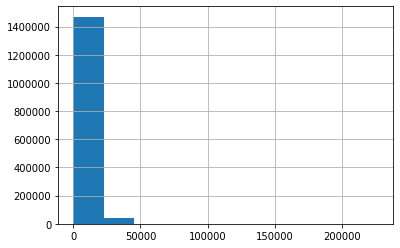

units


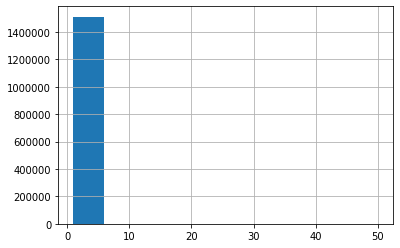

sla


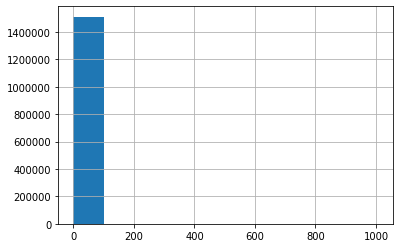

product_mrp


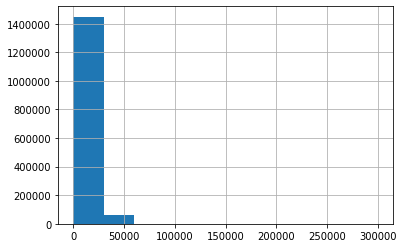

product_procurement_sla


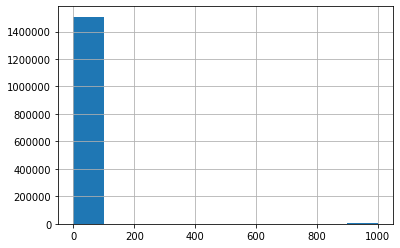

list_price


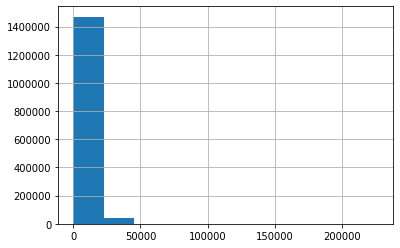

discount


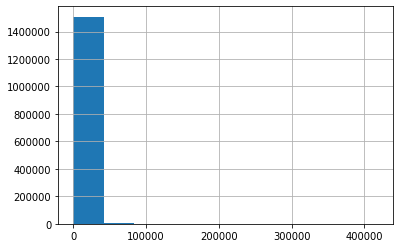

In [60]:
for i in range(len(num_vars)):
    print(num_vars[i])
    consumer_electronics2[num_vars[i]].hist()
    plt.show()

**Checking for outliers in the numerical variables**

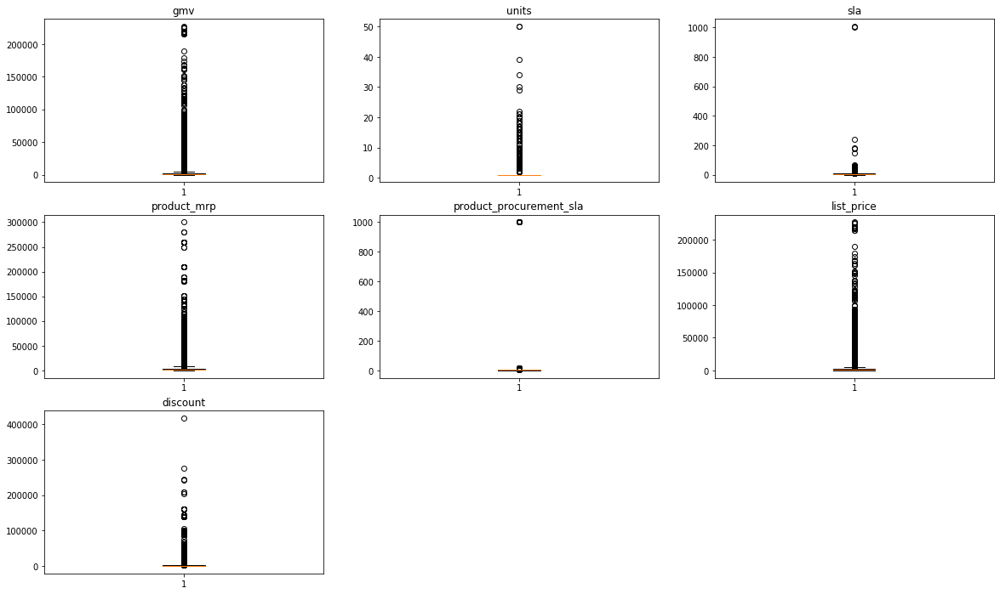

In [61]:
#Plotting boxplots for outlier identification for each variable

plt.figure(figsize=(20,12))

for i in range(0,7):
    plt.subplot(3,3,i+1)
    plt.boxplot(consumer_electronics2[num_vars[i]])
    plt.title(num_vars[i])

We need to be really careful before dropping any of the observations based on just individual variable outliers as it may not be representative of the entire observation

In [62]:
# Looking at the different percentiles: 25%,50%,75%,90%,95% and 99%
print(consumer_electronics2.shape)
consumer_electronics2[num_vars].describe(percentiles=[.25,.5,.75,.90,.95,.99]).T

(1512118, 25)


,count,mean,std,min,25%,50%,75%,90%,95%,99%,max
gmv,1512118.0,2498.763354,5670.220686,0.0,339.0,759.0,1999.0,4463.0,11675.0,31107.0,226947.0
units,1512118.0,1.021623,0.250248,1.0,1.0,1.0,1.0,1.0,1.0,2.0,50.0
sla,1512118.0,5.673952,2.996523,0.0,4.0,6.0,7.0,9.0,10.0,13.0,1006.0
product_mrp,1512118.0,4231.978369,8678.901824,49.0,800.0,1599.0,3499.0,7490.0,17995.0,46950.0,299999.0
product_procurement_sla,1512118.0,5.339381,52.369181,0.0,1.0,2.0,3.0,5.0,5.0,13.0,1000.0
list_price,1512118.0,2466.378985,5590.507146,0.0,339.0,749.0,1999.0,4399.0,11099.0,30057.0,226947.0
discount,1512118.0,1792.954959,4275.057951,0.0,301.0,695.0,1525.0,3299.0,7351.0,18911.0,418353.0


Instead of eliminating an observation based on outlier analysis for just 1 feature, let's identify those observations that are outliers across all of the numerical variable and remove them

In [63]:
# Outliers across all the raw (non-derived) numerical variables can be removed 
outlier_index = consumer_electronics2.loc[(consumer_electronics2['units']>consumer_electronics2['units'].quantile(0.8))&
                          (consumer_electronics2['sla']>consumer_electronics2['sla'].quantile(0.8))&
                          (consumer_electronics2['product_mrp']>consumer_electronics2['product_mrp'].quantile(0.8))&
                          (consumer_electronics2['product_procurement_sla']>consumer_electronics2['product_procurement_sla'].quantile(0.8)),:].index

consumer_electronics2 = consumer_electronics2[~consumer_electronics2.index.isin(outlier_index)]

In [64]:
consumer_electronics2 = consumer_electronics2.loc[consumer_electronics2['product_procurement_sla']<=15,:]
consumer_electronics2 = consumer_electronics2.loc[consumer_electronics2['product_mrp']<=consumer_electronics2['product_mrp'].quantile(0.99),:]
consumer_electronics2 = consumer_electronics2.loc[consumer_electronics2['sla']<=15,:]
consumer_electronics2 = consumer_electronics2.loc[consumer_electronics2['discount']<=100000,:]

print(consumer_electronics2.shape)
consumer_electronics2[num_vars].describe(percentiles=[.25,.5,.75,.90,.95,.99]).T

(1497340, 25)


,count,mean,std,min,25%,50%,75%,90%,95%,99%,max
gmv,1497340.0,2431.391990,5343.577974,0.0,339.0,750.0,1999.0,4399.0,10990.0,27990.0,145876.0
units,1497340.0,1.021662,0.248707,1.0,1.0,1.0,1.0,1.0,1.0,2.0,50.0
sla,1497340.0,5.647848,2.665236,0.0,4.0,6.0,7.0,9.0,10.0,13.0,15.0
product_mrp,1497340.0,4010.558084,7870.505433,49.0,800.0,1599.0,3499.0,7003.0,15990.0,44995.0,46950.0
product_procurement_sla,1497340.0,2.555405,1.735106,0.0,1.0,2.0,3.0,5.0,5.0,7.0,15.0
list_price,1497340.0,2398.990687,5258.785615,0.0,339.0,749.0,1999.0,4300.0,10450.0,27459.0,46700.0
discount,1497340.0,1637.476969,3143.145999,0.0,301.0,693.0,1502.0,3199.0,6541.0,17010.0,99216.0


In [65]:
consumer_electronics2.shape

(1497340, 25)

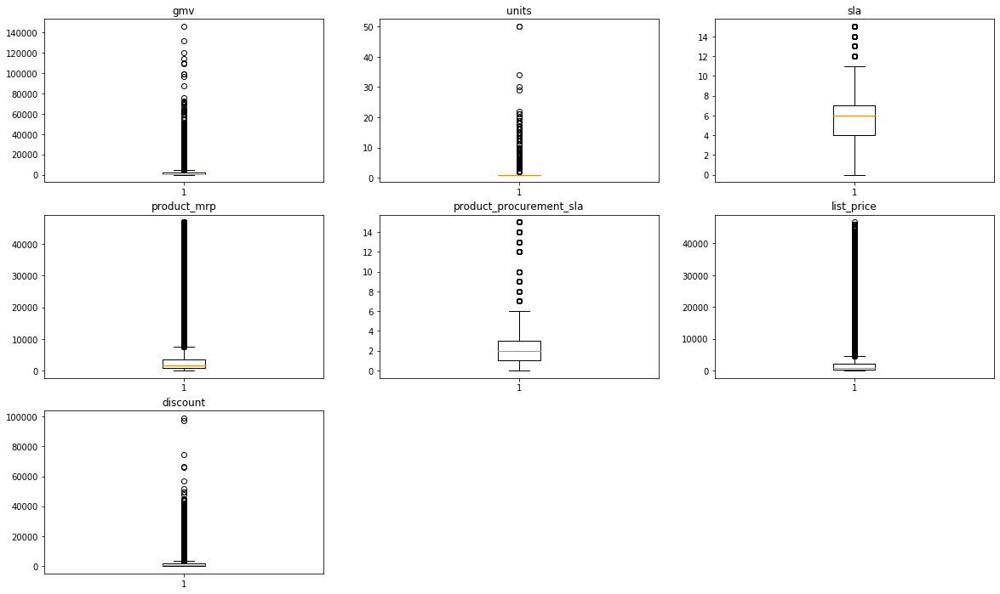

In [66]:
#Plotting boxplots for outlier identification for each variable

plt.figure(figsize=(20,12))

for i in range(0,7):
    plt.subplot(3,3,i+1)
    plt.boxplot(consumer_electronics2[num_vars[i]])
    plt.title(num_vars[i])

In [67]:
consumer_electronics2.describe()

,Year,Month,gmv,units,sla,product_mrp,product_procurement_sla,list_price,discount,Holiday_Flag,order_day,Payday_Flag,SpecialSaleDay_Flag
count,1.497340e+06,1.497340e+06,1.497340e+06,1.497340e+06,1.497340e+06,1.497340e+06,1.497340e+06,1.497340e+06,1.497340e+06,1.497340e+06,1.497340e+06,1.497340e+06,1.497340e+06
mean,2.015554e+03,6.422028e+00,2.431392e+03,1.021662e+00,5.647848e+00,4.010558e+03,2.555405e+00,2.398991e+03,1.637477e+03,2.062391e-02,1.586043e+01,6.587348e-02,1.936461e-01
std,4.970796e-01,3.691134e+00,5.343578e+03,2.487073e-01,2.665236e+00,7.870505e+03,1.735106e+00,5.258786e+03,3.143146e+03,1.421217e-01,8.557759e+00,2.480609e-01,3.951549e-01
min,2.015000e+03,1.000000e+00,0.000000e+00,1.000000e+00,0.000000e+00,4.900000e+01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00
25%,2.015000e+03,3.000000e+00,3.390000e+02,1.000000e+00,4.000000e+00,8.000000e+02,1.000000e+00,3.390000e+02,3.010000e+02,0.000000e+00,9.000000e+00,0.000000e+00,0.000000e+00
50%,2.016000e+03,6.000000e+00,7.500000e+02,1.000000e+00,6.000000e+00,1.599000e+03,2.000000e+00,7.490000e+02,6.930000e+02,0.000000e+00,1.600000e+01,0.000000e+00,0.000000e+00
75%,2.016000e+03,1.000000e+01,1.999000e+03,1.000000e+00,7.000000e+00,3.499000e+03,3.000000e+00,1.999000e+03,1.502000e+03,0.000000e+00,2.300000e+01,0.000000e+00,0.000000e+00
max,2.016000e+03,1.200000e+01,1.458760e+05,5.000000e+01,1.500000e+01,4.695000e+04,1.500000e+01,4.670000e+04,9.921600e+04,1.000000e+00,3.100000e+01,1.000000e+00,1.000000e+00


**Checking the skewness in the numerical variables**

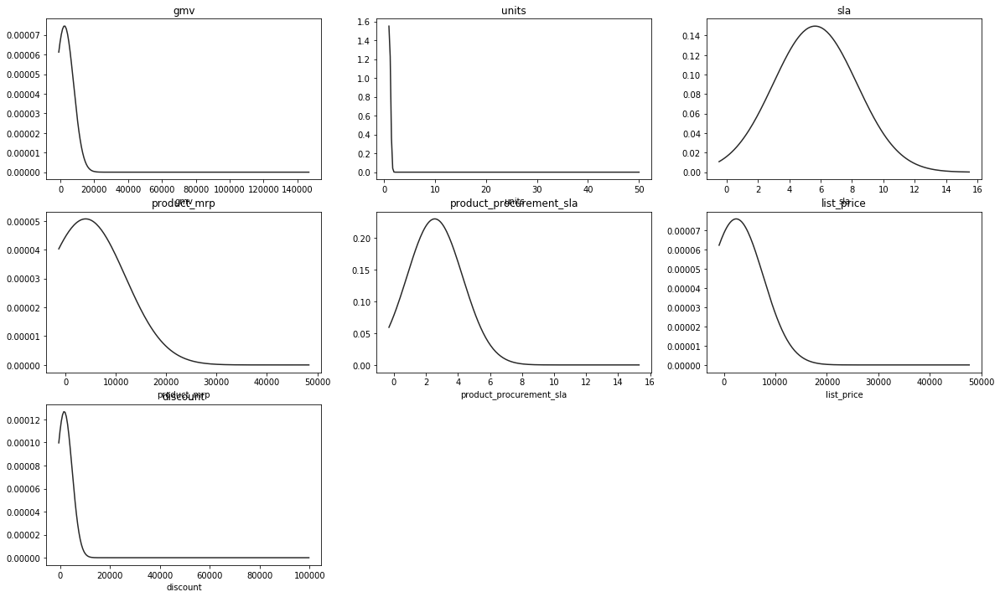

In [68]:
from scipy.stats import norm
plt.figure(figsize=(20,12))

for i in range(0,7):
    plt.subplot(3,3,i+1)
    sns.distplot(consumer_electronics2[num_vars[i]],fit=norm, kde=False, hist=False)
    plt.title(num_vars[i])
plt.show()

We see that the distribution across all the numerical variables follow more or less a loose gaussian distribution with a positive skew

### Converting to Week Level Granularity

In the problem statement, we've been asked to build all the models at a weekly level, hence we'll need to incorporate week number into every dataset of ours to allow for merging all the datasets together

**The Consumer Electronics Dataset**

In [69]:
# Creating Week column in the Consumer Electronics Dataset
consumer_electronics2['Week'] = pd.to_datetime(consumer_electronics2['order_date'], dayfirst=True).dt.week
consumer_electronics2.head()

,fsn_id,order_date,Year,Month,order_id,order_item_id,gmv,units,s1_fact.order_payment_type,sla,...,product_procurement_sla,list_price,discount,Holiday_Flag,order_day,Payday_Flag,sale_dates,SpecialSaleDay_Flag,product_type,Week
0,ACCCX3S58G7B5F6P,2015-10-17,2015,10,3419300926147000.0,3419300926147000.0,6400.0,1,COD,5,...,0,6400.0,790.0,0,17,0,2015-10-17,1,luxury,42
1,ACCCX3S58G7B5F6P,2015-10-19,2015,10,1420830839915200.0,1420830839915200.0,6900.0,1,COD,7,...,0,6900.0,290.0,0,19,0,0,0,luxury,43
2,ACCCX3S5AHMF55FV,2015-10-20,2015,10,2421912925714800.0,2421912925714800.0,1990.0,1,COD,10,...,3,1990.0,109.0,0,20,0,0,0,mass_market,43
3,ACCCX3S5AHMF55FV,2015-10-14,2015,10,4416592101738400.0,4416592101738400.0,1690.0,1,Prepaid,4,...,3,1690.0,409.0,0,14,0,0,0,mass_market,42
4,ACCCX3S5AHMF55FV,2015-10-17,2015,10,4419525153426400.0,4419525153426400.0,1618.0,1,Prepaid,6,...,3,1618.0,481.0,0,17,0,2015-10-17,1,mass_market,42


In [70]:
# We see that our data begins from week 27 of 2015, upto week 26 of 2016
# Let's re-map these week numbers with a reference beginning from week 27 of 2015
# Therefore, the final week numbers will range from 27 - 79

def referenced_week(x):
    if x >=1 and x<=26:
        return x+53
    else:
        return x
    
consumer_electronics2['Week']=consumer_electronics2['Week'].apply(referenced_week)

In [71]:
# Checking the range of the newly referenced week numbers
consumer_electronics2[['order_date', 'Week']].sort_values(by = 'order_date')['Week'].unique()

array([27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43,
       44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60,
       61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77,
       78, 79], dtype=int64)

**The Media Investment Dataset**

In [72]:
media_investment.head()

,Year,Month,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other
0,2015.0,7.0,1.706178e+08,2.153302e+06,2.533014e+07,7.414270e+07,9.328975e+03,1.327278e+07,5.472539e+06,5.023697e+07,0.0,0.0
1,2015.0,8.0,5.064306e+07,6.438073e+04,1.278074e+07,1.063332e+07,6.325130e+01,1.292443e+06,7.368398e+05,2.513528e+07,0.0,0.0
2,2015.0,9.0,9.625438e+08,3.879504e+07,1.356528e+07,6.278765e+08,6.102921e+06,1.637999e+08,5.038266e+07,6.202149e+07,0.0,0.0
3,2015.0,10.0,1.701563e+09,6.144711e+07,1.262248e+08,8.467253e+08,3.444075e+07,2.437178e+08,6.973711e+07,3.192701e+08,0.0,0.0
4,2015.0,11.0,5.121622e+08,4.220630e+07,1.275469e+07,1.417212e+08,1.686332e+06,1.956157e+08,6.595767e+07,5.222032e+07,0.0,0.0


In [73]:
media_investment.shape

(12, 12)

For the media investment dataset, we see that the data is at a year and month level. Let's change this to a week level by dividing all the investments equally across any given month by the number of weeks that it encompasses

In [74]:
# Extracting the year, month and week from our consumer electronics dataset
ymw = consumer_electronics2[['Year', 'Month', 'Week']].drop_duplicates().reset_index()[['Year', 'Month', 'Week']]
print(ymw.shape)

# Extracting the count of weeks in a year+month combination from our consumer electronics dataset
ymw_cnt = pd.DataFrame(ymw.groupby(['Year', 'Month'])['Week'].count()).reset_index()
ymw_cnt.shape

(63, 3)


(12, 3)

In [75]:
# Creating a dataset from the above with year, month, week number and count of weeks
media_investment_weekly = pd.merge(ymw, ymw_cnt, on=['Year', 'Month'], how = 'left')
media_investment_weekly.columns = ['Year', 'Month', 'Week', 'Week_Count']

# Merging with the media investment dataset on year and month
media_investment_weekly = pd.merge(media_investment_weekly, media_investment, on=['Year', 'Month'], how = 'left')

media_investment_weekly.columns = ['Year', 'Month', 'Week', 'Week_Count', 'Total Investment', 'TV',
       'Digital', 'Sponsorship', 'Content Marketing', 'Online marketing',
       'Affiliates', 'SEM', 'Radio', 'Other']

In [76]:
# Dividing all the investments by the number of weeks so that the investments are uniformly distributed across a month
media_investment_weekly['Total Investment'] = media_investment_weekly['Total Investment'] / media_investment_weekly['Week_Count']
media_investment_weekly['TV'] = media_investment_weekly['TV'] / media_investment_weekly['Week_Count']
media_investment_weekly['Digital'] = media_investment_weekly['Digital'] / media_investment_weekly['Week_Count']
media_investment_weekly['Sponsorship'] = media_investment_weekly['Sponsorship'] / media_investment_weekly['Week_Count']
media_investment_weekly['Content Marketing'] = media_investment_weekly['Content Marketing'] / media_investment_weekly['Week_Count']
media_investment_weekly['Online marketing'] = media_investment_weekly['Online marketing'] / media_investment_weekly['Week_Count']
media_investment_weekly['Affiliates'] = media_investment_weekly['Affiliates'] / media_investment_weekly['Week_Count']
media_investment_weekly['SEM'] = media_investment_weekly['SEM'] / media_investment_weekly['Week_Count']
media_investment_weekly['Radio'] = media_investment_weekly['Radio'] / media_investment_weekly['Week_Count']
media_investment_weekly['Other'] = media_investment_weekly['Other'] / media_investment_weekly['Week_Count']

In [77]:
# Since we have common week numbers present across different months in some cases, let aggregate by week number
media_investment_weekly = media_investment_weekly.groupby('Week')['Total Investment', 'TV',
       'Digital', 'Sponsorship', 'Content Marketing', 'Online marketing',
       'Affiliates', 'SEM', 'Radio', 'Other'].mean()

# Ensuring that the total investment is a sum of all the investments
media_investment_weekly['Total Investment'] = media_investment_weekly['TV'] + media_investment_weekly['Digital'] + media_investment_weekly['Sponsorship'] + media_investment_weekly['Content Marketing'] + media_investment_weekly['Online marketing'] + media_investment_weekly['Affiliates'] + media_investment_weekly['SEM'] + media_investment_weekly['Radio'] + media_investment_weekly['Other'] 

In [78]:
print(media_investment_weekly.shape)
media_investment_weekly.head()

(53, 10)


,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other
Week,,,,,,,,,,
27,3.412355e+07,430660.407924,5.066027e+06,1.482854e+07,1865.795074,2.654555e+06,1.094508e+06,1.004739e+07,0.0,0.0
28,3.412355e+07,430660.407924,5.066027e+06,1.482854e+07,1865.795074,2.654555e+06,1.094508e+06,1.004739e+07,0.0,0.0
29,3.412355e+07,430660.407924,5.066027e+06,1.482854e+07,1865.795074,2.654555e+06,1.094508e+06,1.004739e+07,0.0,0.0
30,3.412355e+07,430660.407924,5.066027e+06,1.482854e+07,1865.795074,2.654555e+06,1.094508e+06,1.004739e+07,0.0,0.0
31,2.128203e+07,220695.264920,3.598075e+06,8.300380e+06,938.168479,1.434981e+06,6.086572e+05,7.118304e+06,0.0,0.0


**Deriving New Features based on Moving Averages**

3-week and 5-week moving average for all the media investments

In [79]:
media_inv_weekly_col = media_investment_weekly.columns
media_inv_weekly_col

Index(['Total Investment', 'TV', 'Digital', 'Sponsorship', 'Content Marketing',
       'Online marketing', 'Affiliates', 'SEM', 'Radio', 'Other'],
      dtype='object')

In [80]:
def moving_average(data,col,n):
    for i in col:
        loc_index = data.columns.get_loc(i) + 1
        data.insert(loc=loc_index,column= i+'_MA_'+np.str(n),value=data[i].rolling(window=n).mean())
    return data

#The 5 week moving average
media_investment_weekly = moving_average(media_investment_weekly,media_inv_weekly_col,5) 

#The 3-week moving average
media_investment_weekly = moving_average(media_investment_weekly,media_inv_weekly_col,3) 

media_investment_weekly.head()

,Total Investment,Total Investment_MA_3,Total Investment_MA_5,TV,TV_MA_3,TV_MA_5,Digital,Digital_MA_3,Digital_MA_5,Sponsorship,...,Affiliates_MA_5,SEM,SEM_MA_3,SEM_MA_5,Radio,Radio_MA_3,Radio_MA_5,Other,Other_MA_3,Other_MA_5
Week,,,,,,,,,,,,,,,,,,,,,
27,3.412355e+07,NaN,NaN,430660.407924,NaN,NaN,5.066027e+06,NaN,NaN,1.482854e+07,...,NaN,1.004739e+07,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN
28,3.412355e+07,NaN,NaN,430660.407924,NaN,NaN,5.066027e+06,NaN,NaN,1.482854e+07,...,NaN,1.004739e+07,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN
29,3.412355e+07,3.412355e+07,NaN,430660.407924,430660.407924,NaN,5.066027e+06,5.066027e+06,NaN,1.482854e+07,...,NaN,1.004739e+07,1.004739e+07,NaN,0.0,0.0,NaN,0.0,0.0,NaN
30,3.412355e+07,3.412355e+07,NaN,430660.407924,430660.407924,NaN,5.066027e+06,5.066027e+06,NaN,1.482854e+07,...,NaN,1.004739e+07,1.004739e+07,NaN,0.0,0.0,NaN,0.0,0.0,NaN
31,2.128203e+07,2.984304e+07,3.155525e+07,220695.264920,360672.026923,388667.379324,3.598075e+06,4.576710e+06,4.772437e+06,8.300380e+06,...,997337.609503,7.118304e+06,9.071031e+06,9.461577e+06,0.0,0.0,0.0,0.0,0.0,0.0


In [81]:
# Fill the missing values with 0
media_investment_weekly = media_investment_weekly.fillna(0)

**Calculating Adstock value for all Media Investments**

Adstocks are one way in which we can identify the memory quotient that any type of advertisement has on a user. Having captured this KPI, it can be a very useful variable in our final modelling process

In [82]:
def ad_stock(data, adstock_rate):
    
    #initializing ad stock vectors
    TV_ad_stock_vector = []                     
    Digital_ad_stock_vector = []
    Sponsorship_ad_stock_vector = []
    Content_Marketing_ad_stock_vector = []
    Online_marketing_ad_stock_vector = []
    Affiliates_ad_stock_vector = []
    SEM_ad_stock_vector = []
    Radio_ad_stock_vector = []
    Other_ad_stock_vector = []
    Total_Investment_ad_stock_vector = []
    
    #initialize ad_stock_value
    TV_ad_stock_value = 0 
    Digital_ad_stock_value = 0
    Sponsorship_ad_stock_value = 0
    Content_Marketing_ad_stock_value = 0
    Online_marketing_ad_stock_value = 0
    Affiliates_ad_stock_value = 0
    SEM_ad_stock_value = 0
    Radio_ad_stock_value = 0
    Other_ad_stock_value = 0
    Total_Investment_ad_stock_value = 0
    
    # loopING through THE DATAdataset to calculate adstock values. 
    # The formula for adstock is: At = Xt + adstock rate * At-1
    for index, row in data.iterrows():
        TV_ad_stock_value = row['TV'] + adstock_rate * TV_ad_stock_value
        TV_ad_stock_vector.append(TV_ad_stock_value)
        Digital_ad_stock_value = row['Digital'] + adstock_rate * Digital_ad_stock_value
        Digital_ad_stock_vector.append(Digital_ad_stock_value)
        Sponsorship_ad_stock_value = row['Sponsorship'] + adstock_rate * Sponsorship_ad_stock_value
        Sponsorship_ad_stock_vector.append(Sponsorship_ad_stock_value)
        Content_Marketing_ad_stock_value = row['Content Marketing'] + adstock_rate * Content_Marketing_ad_stock_value
        Content_Marketing_ad_stock_vector.append(Content_Marketing_ad_stock_value)    
        Online_marketing_ad_stock_value = row['Online marketing'] + adstock_rate * Online_marketing_ad_stock_value
        Online_marketing_ad_stock_vector.append(Online_marketing_ad_stock_value)
        Affiliates_ad_stock_value = row['Affiliates'] + adstock_rate * Affiliates_ad_stock_value
        Affiliates_ad_stock_vector.append(Affiliates_ad_stock_value)
        SEM_ad_stock_value = row['SEM'] + adstock_rate * SEM_ad_stock_value
        SEM_ad_stock_vector.append(SEM_ad_stock_value)
        Radio_ad_stock_value = row['Radio'] + adstock_rate * Radio_ad_stock_value
        Radio_ad_stock_vector.append(Radio_ad_stock_value)
        Other_ad_stock_value = row['Other'] + adstock_rate * Other_ad_stock_value
        Other_ad_stock_vector.append(Other_ad_stock_value)
        Total_Investment_ad_stock_value = row['Total Investment'] + adstock_rate * Total_Investment_ad_stock_value
        Total_Investment_ad_stock_vector.append(Total_Investment_ad_stock_value)
    
    """add ad stock vector to dataset"""
    loc_index = data.columns.get_loc('TV_MA_5') + 1
    data.insert(loc=loc_index,column='TV_Ad_Stock',value=TV_ad_stock_vector)
    loc_index = data.columns.get_loc('Digital_MA_5') + 1
    data.insert(loc=loc_index,column='Digital_Ad_Stock',value=Digital_ad_stock_vector)
    loc_index = data.columns.get_loc('Sponsorship_MA_5') + 1
    data.insert(loc=loc_index,column='Sponsorship_Ad_Stock',value=Sponsorship_ad_stock_vector)
    loc_index = data.columns.get_loc('Content Marketing_MA_5') + 1
    data.insert(loc=loc_index,column='Content_Marketing_Ad_Stock',value=Content_Marketing_ad_stock_vector)
    loc_index = data.columns.get_loc('Online marketing_MA_5') + 1
    data.insert(loc=loc_index,column='Online_marketing_Ad_Stock',value=Online_marketing_ad_stock_vector)
    loc_index = data.columns.get_loc('Affiliates_MA_5') + 1
    data.insert(loc=loc_index,column='Affiliates_Ad_Stock',value=Affiliates_ad_stock_vector)
    loc_index = data.columns.get_loc('SEM_MA_5') + 1
    data.insert(loc=loc_index,column='SEM_Ad_Stock',value=SEM_ad_stock_vector)
    loc_index = data.columns.get_loc('Radio_MA_5') + 1
    data.insert(loc=loc_index,column='Radio_Ad_Stock',value=Radio_ad_stock_vector)
    loc_index = data.columns.get_loc('Other_MA_5') + 1
    data.insert(loc=loc_index,column='Other_Ad_Stock',value=Other_ad_stock_vector)
    loc_index = data.columns.get_loc('Total Investment_MA_5') + 1
    data.insert(loc=loc_index,column='Total_Investment_Ad_Stock',value=Total_Investment_ad_stock_vector)
    
    return data

In [83]:
# Assuming an adstock rate (engagement rate) for a user with any media as 0.5
media_investment_weekly = ad_stock(data=media_investment_weekly, adstock_rate=0.5)
media_investment_weekly.head()

,Total Investment,Total Investment_MA_3,Total Investment_MA_5,Total_Investment_Ad_Stock,TV,TV_MA_3,TV_MA_5,TV_Ad_Stock,Digital,Digital_MA_3,...,SEM_MA_5,SEM_Ad_Stock,Radio,Radio_MA_3,Radio_MA_5,Radio_Ad_Stock,Other,Other_MA_3,Other_MA_5,Other_Ad_Stock
Week,,,,,,,,,,,,,,,,,,,,,
27,3.412355e+07,0.000000e+00,0.000000e+00,3.412355e+07,430660.407924,0.000000,0.000000,430660.407924,5.066027e+06,0.000000e+00,...,0.000000e+00,1.004739e+07,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
28,3.412355e+07,0.000000e+00,0.000000e+00,5.118533e+07,430660.407924,0.000000,0.000000,645990.611887,5.066027e+06,0.000000e+00,...,0.000000e+00,1.507109e+07,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
29,3.412355e+07,3.412355e+07,0.000000e+00,5.971621e+07,430660.407924,430660.407924,0.000000,753655.713868,5.066027e+06,5.066027e+06,...,0.000000e+00,1.758294e+07,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
30,3.412355e+07,3.412355e+07,0.000000e+00,6.398166e+07,430660.407924,430660.407924,0.000000,807488.264858,5.066027e+06,5.066027e+06,...,0.000000e+00,1.883887e+07,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
31,2.128203e+07,2.984304e+07,3.155525e+07,5.327286e+07,220695.264920,360672.026923,388667.379324,624439.397349,3.598075e+06,4.576710e+06,...,9.461577e+06,1.653774e+07,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


**The NPS Stock Dataset**

In [84]:
nps_stock.head()

,Year,Month,NPS,Stock Index
0,2015,7,54.599588,1177.0
1,2015,8,59.987101,1206.0
2,2015,9,46.925419,1101.0
3,2015,10,44.398389,1210.0
4,2015,11,47.000000,1233.0


In [85]:
# Converting the above data to a weekly format
nps_stock_weekly = pd.merge(ymw, ymw_cnt, on=['Year', 'Month'], how = 'left')
nps_stock_weekly.columns = ['Year', 'Month', 'Week', 'Week_Count']
nps_stock_weekly = nps_stock_weekly[['Year', 'Month', 'Week']]

nps_stock['Year'] = nps_stock['Year'].astype('int')

# Merging with the nps stock dataset on year and month
nps_stock_weekly = pd.merge(nps_stock_weekly, nps_stock, on=['Year', 'Month'], how = 'left')

In [86]:
# Since we have common week numbers present across different months in some cases, let aggregate by week number
nps_stock_weekly = nps_stock_weekly.groupby('Week')['NPS', 'Stock Index'].mean()

In [87]:
nps_stock_weekly.head()

,NPS,Stock Index
Week,,
27,54.599588,1177.0
28,54.599588,1177.0
29,54.599588,1177.0
30,54.599588,1177.0
31,57.293345,1191.5


Calculating 3-week and 5-week moving average for all NPS, snad Stock index

In [88]:
nps_stock_weekly_col = nps_stock_weekly.columns

In [89]:
# using the moving_Average function defined earlier

#The 5 week moving average
nps_stock_weekly = moving_average(nps_stock_weekly,nps_stock_weekly_col,5) 

#The 3-week moving average
nps_stock_weekly = moving_average(nps_stock_weekly,nps_stock_weekly_col,3) 

# Fill the missing values with 0
nps_stock_weekly = nps_stock_weekly.fillna(0)

nps_stock_weekly.head()

,NPS,NPS_MA_3,NPS_MA_5,Stock Index,Stock Index_MA_3,Stock Index_MA_5
Week,,,,,,
27,54.599588,0.000000,0.000000,1177.0,0.000000,0.0
28,54.599588,0.000000,0.000000,1177.0,0.000000,0.0
29,54.599588,54.599588,0.000000,1177.0,1177.000000,0.0
30,54.599588,54.599588,0.000000,1177.0,1177.000000,0.0
31,57.293345,55.497507,55.138339,1191.5,1181.833333,1179.9


**The Sale Calendar Dataset**

Here, we'll aggregate the sale dates at a week level to get the number of sale days in any particular week

In [90]:
sale_dates = special_sale_calendar.copy()
sale_dates.columns = ['sale_date']

In [91]:
from datetime import datetime

sale_dates['Week'] = 0

# Extracting week number from the dates
for i in range(len(sale_dates)):
    sale_dates['Week'][i] = sale_dates['sale_date'][i].isocalendar()[1]
    
# Referncing the week numbers using the function created before
sale_dates['Week']=sale_dates['Week'].apply(referenced_week)

In [92]:
# Aggregating by week to get count of dates with sales
sale_dates_weekly = pd.DataFrame(sale_dates.groupby('Week')['sale_date'].count()).reset_index()

In [93]:
# Creating the final dataset with all weeks and corresponding sale date counts within them
sale_dates_weekly = pd.merge(pd.DataFrame(nps_stock_weekly.index), sale_dates_weekly, how = 'left', on='Week').set_index('Week')
sale_dates_weekly = sale_dates_weekly.fillna(0)
sale_dates_weekly.columns = ['sale_days']
sale_dates_weekly.head()

,sale_days
Week,
27,0.0
28,0.0
29,2.0
30,0.0
31,0.0


In [94]:
sale_dates_weekly.head()

,sale_days
Week,
27,0.0
28,0.0
29,2.0
30,0.0
31,0.0


**The Weather Dataset**

In [95]:
from datetime import datetime

# Extractin the date from the date parts
weather['date'] = weather['Year'].astype(str) + '-' + weather['Month'].astype(str) + '-' + weather['Day'].astype(str)
weather['date'] = pd.to_datetime(weather['date'] , dayfirst=True)

# Filtering the date period for the dates we're concerned about
start = datetime.strptime("01-07-2015", "%d-%m-%Y")
end = datetime.strptime("01-07-2016", "%d-%m-%Y")
weather=weather[(weather['date']>=start) & (weather['date']<end)]

# Extract week number
weather['Week']=weather['date'].dt.week

# Reference the week number
weather['Week']=weather['Week'].apply(referenced_week)

In [96]:
weather.dtypes

Year                                  int64
Month                                 int64
Day                                   int64
Data Quality                         object
Max Temp (°C)                       float64
Max Temp Flag                        object
Min Temp (°C)                       float64
Min Temp Flag                        object
Mean Temp (°C)                      float64
Mean Temp Flag                       object
Heat Deg Days (°C)                  float64
Heat Deg Days Flag                   object
Cool Deg Days (°C)                  float64
Cool Deg Days Flag                   object
Total Rain (mm)                     float64
Total Rain Flag                      object
Total Snow (cm)                     float64
Total Snow Flag                      object
Total Precip (mm)                   float64
Total Precip Flag                    object
Snow on Grnd (cm)                   float64
Snow on Grnd Flag                    object
Dir of Max Gust (10s deg)       

In [97]:
# Aggregating the entire data at week level
weather_weekly = pd.DataFrame(weather.groupby('Week',as_index = False).agg({'Max Temp (°C)':'mean',
                                                               'Min Temp (°C)':'mean',
                                                               'Mean Temp (°C)':'mean',
                                                               'Heat Deg Days (°C)':'mean',
                                                               'Cool Deg Days (°C)':'mean',
                                                               'Total Rain (mm)':'mean',
                                                               'Total Snow (cm)':'mean',
                                                               'Total Precip (mm)':'mean',
                                                               'Snow on Grnd (cm)':'mean',
                                                               'Dir of Max Gust (10s deg)':'mean',
                                                               'Spd of Max Gust (km/h)':'mean'}))

In [98]:
# Checking the count of missing values
weather_weekly.isnull().sum()

Week                          0
Max Temp (°C)                 0
Min Temp (°C)                 1
Mean Temp (°C)                1
Heat Deg Days (°C)            1
Cool Deg Days (°C)            1
Total Rain (mm)               0
Total Snow (cm)               0
Total Precip (mm)             0
Snow on Grnd (cm)             0
Dir of Max Gust (10s deg)    53
Spd of Max Gust (km/h)       53
dtype: int64

In [99]:
# Dropping the last 2 columns with high number of missing values
weather_weekly = weather_weekly.drop(['Dir of Max Gust (10s deg)','Spd of Max Gust (km/h)'], axis = 1)

# Imputing the missing value in the remaining columns with mean column value
weather_weekly.loc[weather_weekly['Min Temp (°C)'].isnull(),'Min Temp (°C)'] = weather_weekly.loc[~weather_weekly['Min Temp (°C)'].isnull(),'Min Temp (°C)'].mean()
weather_weekly.loc[weather_weekly['Mean Temp (°C)'].isnull(),'Mean Temp (°C)'] = weather_weekly.loc[~weather_weekly['Mean Temp (°C)'].isnull(),'Mean Temp (°C)'].mean()
weather_weekly.loc[weather_weekly['Heat Deg Days (°C)'].isnull(),'Heat Deg Days (°C)'] = weather_weekly.loc[~weather_weekly['Heat Deg Days (°C)'].isnull(),'Heat Deg Days (°C)'].mean()
weather_weekly.loc[weather_weekly['Cool Deg Days (°C)'].isnull(),'Cool Deg Days (°C)'] = weather_weekly.loc[~weather_weekly['Cool Deg Days (°C)'].isnull(),'Cool Deg Days (°C)'].mean()

In [100]:
weather_weekly.head()

,Week,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
0,27,25.500000,13.200000,19.360000,0.100000,1.460000,0.000000,0.0,0.000000,0.0
1,28,24.833333,15.333333,20.100000,0.283333,2.383333,4.416667,0.0,4.416667,0.0
2,29,28.750000,17.583333,23.183333,0.000000,5.183333,1.400000,0.0,1.400000,0.0
3,30,29.750000,16.600000,23.060000,0.000000,5.060000,0.900000,0.0,0.900000,0.0
4,31,31.583333,17.500000,24.566667,0.000000,6.566667,4.633333,0.0,4.633333,0.0


### Exploratory Data Analysis for the concerned Sub-Categories

Let's first look at how NPS and Stock index varies with every week

In [101]:
nps_stock_weekly = nps_stock_weekly.reset_index()

In [102]:
nps_stock_weekly.head()

,Week,NPS,NPS_MA_3,NPS_MA_5,Stock Index,Stock Index_MA_3,Stock Index_MA_5
0,27,54.599588,0.000000,0.000000,1177.0,0.000000,0.0
1,28,54.599588,0.000000,0.000000,1177.0,0.000000,0.0
2,29,54.599588,54.599588,0.000000,1177.0,1177.000000,0.0
3,30,54.599588,54.599588,0.000000,1177.0,1177.000000,0.0
4,31,57.293345,55.497507,55.138339,1191.5,1181.833333,1179.9


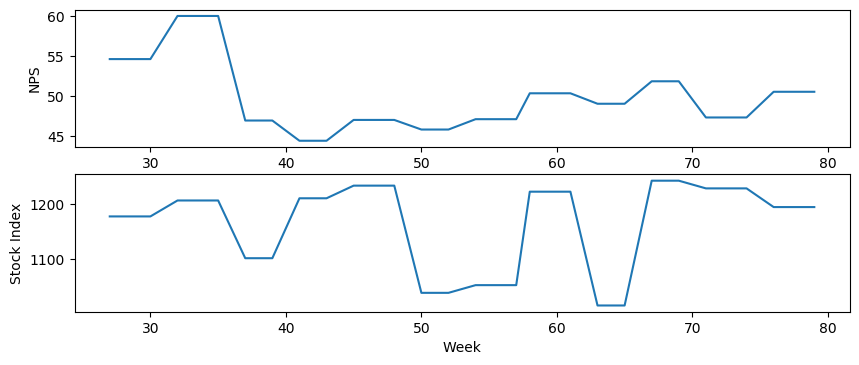

In [103]:
plt.figure(figsize=(10, 4), dpi=100, facecolor='w', edgecolor='k', frameon='True')

plt.subplot(2, 1, 1)
sns.lineplot(x='Week',y= "NPS", palette='cool', data=nps_stock_weekly, ci=None, sort= False)
plt.xlabel('Week', fontsize=10);
plt.ylabel('NPS', fontsize=10);

plt.subplot(2, 1, 2)
sns.lineplot(x='Week',y= "Stock Index", data=nps_stock_weekly, ci=None, sort= False)
plt.xlabel('Week', fontsize=10);
plt.ylabel('Stock Index', fontsize=10);

plt.show()

We see that the NPS score is the highest in week 32-35, where as the stock index sees frequent fluctuations across the year

Looking at the investments data, visualizing how investments in the different channels have changed over time

In [104]:
media_investment_weekly.head()

,Total Investment,Total Investment_MA_3,Total Investment_MA_5,Total_Investment_Ad_Stock,TV,TV_MA_3,TV_MA_5,TV_Ad_Stock,Digital,Digital_MA_3,...,SEM_MA_5,SEM_Ad_Stock,Radio,Radio_MA_3,Radio_MA_5,Radio_Ad_Stock,Other,Other_MA_3,Other_MA_5,Other_Ad_Stock
Week,,,,,,,,,,,,,,,,,,,,,
27,3.412355e+07,0.000000e+00,0.000000e+00,3.412355e+07,430660.407924,0.000000,0.000000,430660.407924,5.066027e+06,0.000000e+00,...,0.000000e+00,1.004739e+07,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
28,3.412355e+07,0.000000e+00,0.000000e+00,5.118533e+07,430660.407924,0.000000,0.000000,645990.611887,5.066027e+06,0.000000e+00,...,0.000000e+00,1.507109e+07,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
29,3.412355e+07,3.412355e+07,0.000000e+00,5.971621e+07,430660.407924,430660.407924,0.000000,753655.713868,5.066027e+06,5.066027e+06,...,0.000000e+00,1.758294e+07,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
30,3.412355e+07,3.412355e+07,0.000000e+00,6.398166e+07,430660.407924,430660.407924,0.000000,807488.264858,5.066027e+06,5.066027e+06,...,0.000000e+00,1.883887e+07,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
31,2.128203e+07,2.984304e+07,3.155525e+07,5.327286e+07,220695.264920,360672.026923,388667.379324,624439.397349,3.598075e+06,4.576710e+06,...,9.461577e+06,1.653774e+07,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [105]:
media_investment_weekly = media_investment_weekly.reset_index()

In [106]:
media_investment_weekly.columns

Index(['Week', 'Total Investment', 'Total Investment_MA_3',
       'Total Investment_MA_5', 'Total_Investment_Ad_Stock', 'TV', 'TV_MA_3',
       'TV_MA_5', 'TV_Ad_Stock', 'Digital', 'Digital_MA_3', 'Digital_MA_5',
       'Digital_Ad_Stock', 'Sponsorship', 'Sponsorship_MA_3',
       'Sponsorship_MA_5', 'Sponsorship_Ad_Stock', 'Content Marketing',
       'Content Marketing_MA_3', 'Content Marketing_MA_5',
       'Content_Marketing_Ad_Stock', 'Online marketing',
       'Online marketing_MA_3', 'Online marketing_MA_5',
       'Online_marketing_Ad_Stock', 'Affiliates', 'Affiliates_MA_3',
       'Affiliates_MA_5', 'Affiliates_Ad_Stock', 'SEM', 'SEM_MA_3', 'SEM_MA_5',
       'SEM_Ad_Stock', 'Radio', 'Radio_MA_3', 'Radio_MA_5', 'Radio_Ad_Stock',
       'Other', 'Other_MA_3', 'Other_MA_5', 'Other_Ad_Stock'],
      dtype='object')

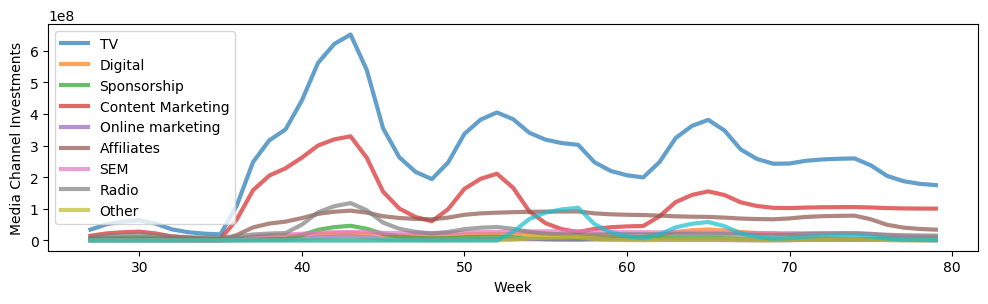

In [107]:
plt.figure(figsize=(12, 3), dpi=100, facecolor='w', edgecolor='k', frameon='True')

plt.plot(media_investment_weekly.iloc[:,0], media_investment_weekly.iloc[:,4::4], linewidth=3, alpha = 0.7)
plt.xlabel('Week', fontsize=10)
plt.ylabel('Media Channel Investments', fontsize=10)
plt.legend(media_investment_weekly.iloc[:,5::4])

plt.show()

From the above visualization, we can infer that over the course of the year, majority of the investment was done in sponsorships. A significant amount was also spent on online marketing and search engine marketing.

Keeping this in mind for later, let's look at our orders dataset to identify any trends that we can observe. We'll be filtering out the data and performing EDA on the 3 categories that we're particularly interested in

In [108]:
consumer_electronics2['product_analytic_sub_category'].value_counts()

Speaker                501213
CameraAccessory        215179
GamingAccessory        183955
TVVideoSmall           132526
HomeAudio              110576
AudioMP3Player         102226
Game                    97847
Camera                  93242
GamingConsole           26790
CameraStorage           16539
AudioAccessory           9522
HomeTheatre              4177
AmplifierReceiver        3451
GameMembershipCards        97
Name: product_analytic_sub_category, dtype: int64

In [109]:
# Creating a subset of the data just for the 3 product sub-categories that we're interested in
product_orders = consumer_electronics2.loc[(consumer_electronics2['product_analytic_sub_category']=='CameraAccessory') | \
                                           (consumer_electronics2['product_analytic_sub_category']=='GamingAccessory') | \
                                           (consumer_electronics2['product_analytic_sub_category']=='HomeAudio'), :]
print(product_orders.shape)
product_orders.head()

(509710, 26)


,fsn_id,order_date,Year,Month,order_id,order_item_id,gmv,units,s1_fact.order_payment_type,sla,...,product_procurement_sla,list_price,discount,Holiday_Flag,order_day,Payday_Flag,sale_dates,SpecialSaleDay_Flag,product_type,Week
0,ACCCX3S58G7B5F6P,2015-10-17,2015,10,3419300926147000.0,3419300926147000.0,6400.0,1,COD,5,...,0,6400.0,790.0,0,17,0,2015-10-17,1,luxury,42
1,ACCCX3S58G7B5F6P,2015-10-19,2015,10,1420830839915200.0,1420830839915200.0,6900.0,1,COD,7,...,0,6900.0,290.0,0,19,0,0,0,luxury,43
2,ACCCX3S5AHMF55FV,2015-10-20,2015,10,2421912925714800.0,2421912925714800.0,1990.0,1,COD,10,...,3,1990.0,109.0,0,20,0,0,0,mass_market,43
3,ACCCX3S5AHMF55FV,2015-10-14,2015,10,4416592101738400.0,4416592101738400.0,1690.0,1,Prepaid,4,...,3,1690.0,409.0,0,14,0,0,0,mass_market,42
4,ACCCX3S5AHMF55FV,2015-10-17,2015,10,4419525153426400.0,4419525153426400.0,1618.0,1,Prepaid,6,...,3,1618.0,481.0,0,17,0,2015-10-17,1,mass_market,42


Let's look to understand the trends that are being shown in the data for the categories.<br>
First, let's look at the distribution and average revenue generated from each of the categories to figure out which of the categories is more important to the company

In [110]:
cat_performance = pd.DataFrame(product_orders.groupby(['product_analytic_sub_category']).agg({'gmv':'mean',
                                                              'units':'sum'})).reset_index()

cat_performance

,product_analytic_sub_category,gmv,units
0,CameraAccessory,1140.269527,220796
1,GamingAccessory,844.252884,190263
2,HomeAudio,2187.765770,111698


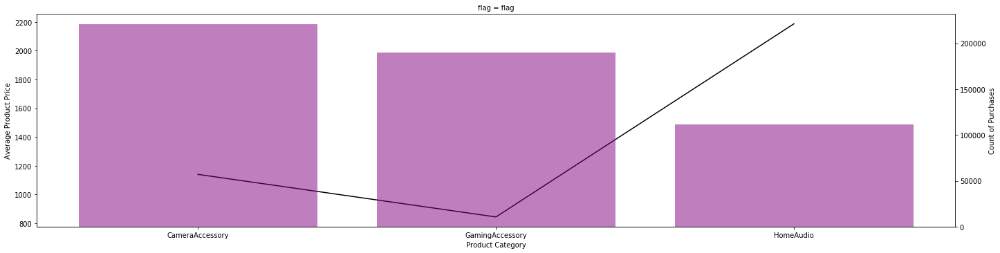

In [111]:
# Defining a function to plot secondary axis on the same graph
def facetgrid_two_axes(*args, **kwargs):
    data = kwargs.pop('data')
    dual_axis = kwargs.pop('dual_axis')
    alpha = kwargs.pop('alpha', 0.5)
    kwargs.pop('color')
    ax = plt.gca()
    if dual_axis:
        ax2 = ax.twinx()
        ax2.set_ylabel('Count of Purchases')

    ax.plot(data['x'],data['y1'], **kwargs, color='black')
    if dual_axis:
        ax2.bar(df['x'],df['y2'], **kwargs, color='purple',alpha=alpha)


df = cat_performance.copy()
df.columns = ['x', 'y1', 'y2']
df['flag'] = 'flag'


win_plot = sns.FacetGrid(df, col='flag', size=5, aspect = 4)
(win_plot.map_dataframe(facetgrid_two_axes, dual_axis=True)
         .set_axis_labels("Product Category", "Average Product Price"))
plt.show()

We can see that the Home Audio category was the one with the greater average product price among the 3 categories, and the Camera Accessory Products were the most sought after among the 3 categories

Next, it would be helpful to understand the distribution of the luxury v. Mass Market goods within each category

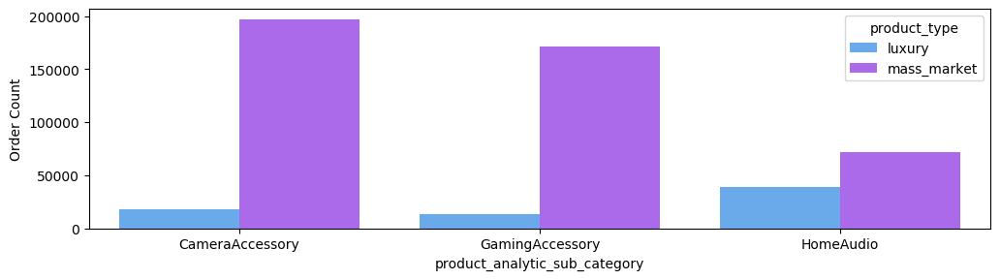

In [112]:
plt.figure(figsize=(12, 3), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(x='product_analytic_sub_category',y= "order_id", hue = "product_type", palette='cool', estimator=lambda x: len(x), data=product_orders, ci=None)
plt.ylabel("Order Count")
plt.show()


Drilling further into each category to understand the distribution of discount percentages

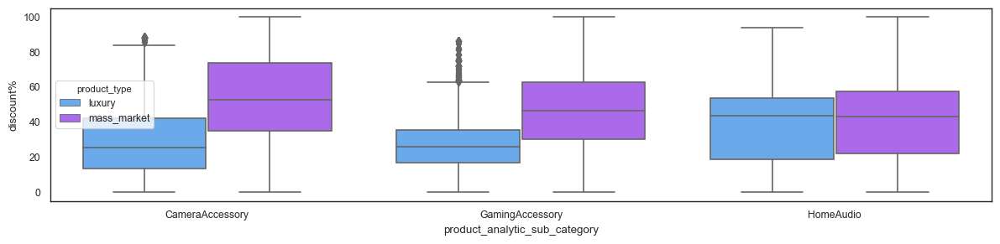

In [113]:
# Calculating the discount percentage
product_orders['discount%'] = round(100*((product_orders['product_mrp'] - product_orders['list_price']) / product_orders['product_mrp']),2)

# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(12, 3), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.set_style("white") # white/whitegrid/dark/ticks
sns.set_context("paper") # talk/poster

sns.boxplot(x='product_analytic_sub_category', y='discount%', hue = "product_type", palette='cool', data=product_orders)
# plot legend

# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

From the above, it's evident that the discounts on the mass-market products is usually higher than the luxury goods. This trend stands for the Camera Accessory and Gaming Accessory Products. However, for the Home Audio category (which is relative expensive compared to the other 2 categories as seen previously), the discounts are almost similar for both the product types

Next, let's look at the average sla for each product category. This will give us an indication on how easy is it for the company to transport the goods to the consumer

In [114]:
sla_product = pd.DataFrame(product_orders.groupby(['product_type', 'product_analytic_sub_category'])['sla'].mean()).reset_index()

In [115]:
sla_product.columns

Index(['product_type', 'product_analytic_sub_category', 'sla'], dtype='object')

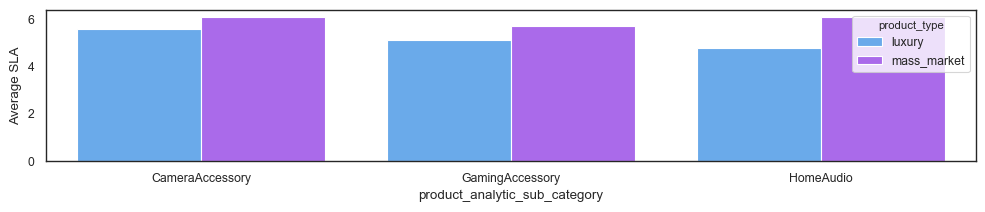

In [116]:
plt.figure(figsize=(12, 2), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(x='product_analytic_sub_category',y= "sla", hue = "product_type", palette='cool', data=sla_product, ci=None)
plt.ylabel("Average SLA")
plt.show()


In contrary to what we would expect, the luxury goods tend to get delivered a lot quicker than the mass market products in each of the categories

Delving into each of the categories, let's see what are the highest revenue generating products and most purchased products in each category.

In [117]:
prod_cat_perf = pd.DataFrame(product_orders.groupby(['product_analytic_sub_category','product_analytic_vertical']).agg({'gmv':'sum',
                                                              'units':'sum'})).reset_index().sort_values(['units'], ascending = False)

prod_cat_perf.head()

,product_analytic_sub_category,product_analytic_vertical,gmv,units
44,HomeAudio,HomeAudioSpeaker,1.948031e+08,79757
29,GamingAccessory,GamingHeadset,2.964330e+07,58160
25,GamingAccessory,GamePad,6.227154e+07,55355
15,CameraAccessory,Flash,2.212802e+07,48147
3,CameraAccessory,CameraBattery,2.297576e+07,36780


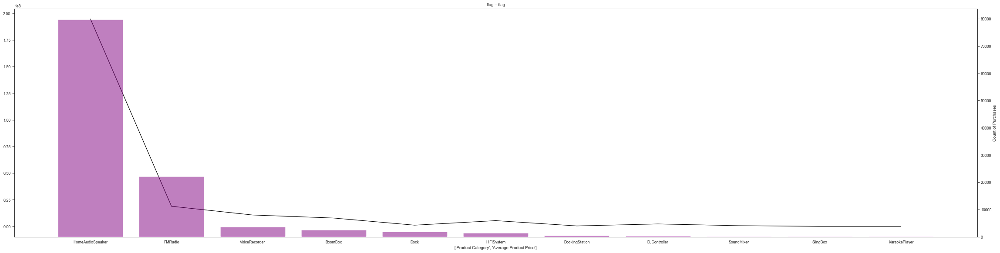

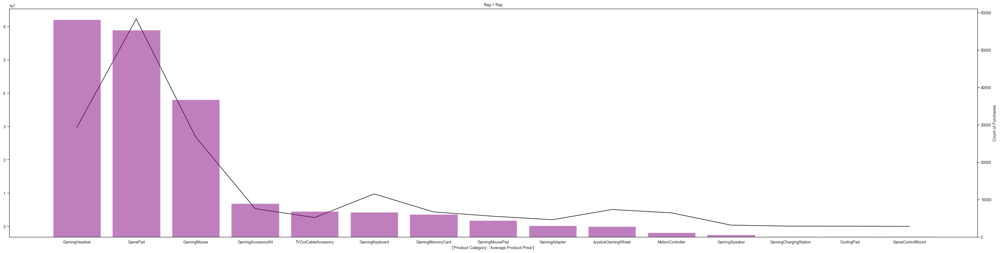

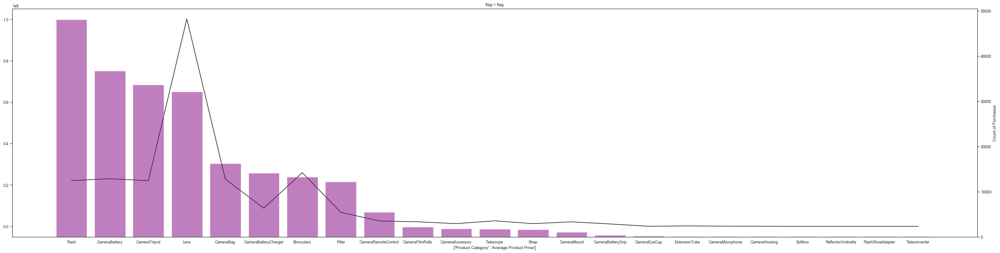

In [118]:
# Defining a function to plot secondary axis on the same graph
def facetgrid_two_axes(*args, **kwargs):
    data = kwargs.pop('data')
    dual_axis = kwargs.pop('dual_axis')
    alpha = kwargs.pop('alpha', 0.5)
    kwargs.pop('color')
    ax = plt.gca()
    if dual_axis:
        ax2 = ax.twinx()
        ax2.set_ylabel('Count of Purchases')

    ax.plot(data['x'],data['y1'], **kwargs, color='black')
    if dual_axis:
        ax2.bar(df['x'],df['y2'], **kwargs, color='purple',alpha=alpha)

for i in range(prod_cat_perf['product_analytic_sub_category'].nunique()):
    df = prod_cat_perf.loc[prod_cat_perf['product_analytic_sub_category']==prod_cat_perf['product_analytic_sub_category'].unique()[i],
                           ['product_analytic_vertical','gmv','units']].copy()
    df.columns = ['x', 'y1', 'y2']
    df['flag'] = 'flag'
    win_plot = sns.FacetGrid(df, col='flag',size=8, aspect=4)
    (win_plot.map_dataframe(facetgrid_two_axes, dual_axis=True)
         .set_axis_labels(["Product Category", "Average Product Price"]))
    plt.show()

From the above analysis. it's evident that the highest revenue generating product in each of the category is as follows:
- Camera Accessory: Lens
- Gaming Accessory: Game Pad
- Home Audio: Home Audio Speaker

Also, the most sought after product in each of the category is as follows:
- Camera Accessory: Flash
- Gaming Accessory: Gaming Headset
- Home Audio: Home Audio Speaker


Let's study the temporal sections of the data to understand if there's any pattern in the sales for the company

In [119]:
month_perf = pd.DataFrame(product_orders.groupby(['product_analytic_sub_category','Month']).agg({'gmv':'sum'})).reset_index()

month_perf['Month2'] = month_perf['Month'].map({1:'Jan, 16', 2:'Feb, 16', 3:'Mar, 16', 4:'Apr, 16', 5:'May, 16', 6:'June, 16', 
                                               7:'July, 15', 8:'Aug, 15', 9:'Sept, 15', 10:'Oct, 15', 11:'Nov, 15', 
                                               12:'Dec, 15'})

month_perf['flag'] = month_perf['Month'].map({1:7, 2:8, 3:9, 4:10, 5:11, 6:12, 7:1, 8:2, 9:3, 10:4, 11:5, 12:6})

month_perf = month_perf.sort_values(['flag'], ascending = True)

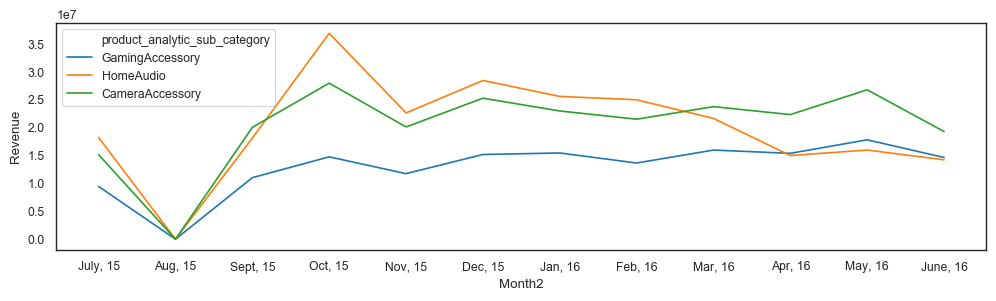

In [120]:
plt.figure(figsize=(12, 3), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.lineplot(x='Month2',y= "gmv", hue = "product_analytic_sub_category", data=month_perf, ci=None, sort= False)
plt.ylabel("Revenue")
plt.show()


From the above analysis, we see that the month of August sees a massive dip in revenue numbers. However, this is followed by a significant increase in sales in the next couple of months. This trend is consistent with all the products. As for the rest of the year, The trends seems to be relatively consistent with occasional peaks in months like December and May.<br>
The likely reason for the surge in sales towards the last quarter of the year is because of the shopping season that in Canada towards the year end. Due to occasions like Black friday, christmas, hanukkah, halloween etc. the sales would expectedly rise at this time of the year

Let's deep-dive into day-level data and try to understand what does the trend for sales looks like within the different days of a month

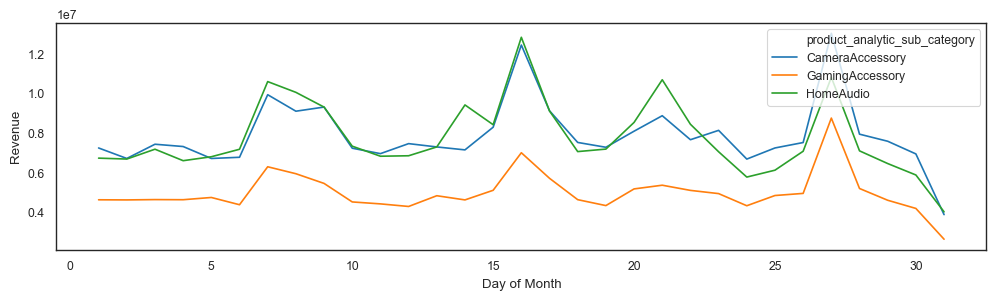

In [121]:
# Aggregating data by category and day of month
dayofmonth_perf = pd.DataFrame(product_orders.groupby(['product_analytic_sub_category','order_day']).agg({'gmv':'sum'})).reset_index()

plt.figure(figsize=(12, 3), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.lineplot(x='order_day',y= "gmv", hue = "product_analytic_sub_category", data=dayofmonth_perf, ci=None, sort= False)
plt.ylabel("Revenue")
plt.xlabel("Day of Month")
plt.show()


Looking at the day-wise trends, there are distinct spikes at certain sections of the day. Clearly, middle of the month sees a massive spike in sales for all the categories. This could directly be linked to paydays for customers. The daywise trend is pretty similar across all the categories 

Looking at the above pattern, there is some sort of repetitve trend that we observe in terms of the peaks. Let's further drill this down to a day of week level to see if thereare certain parts of the week that see massive sales.

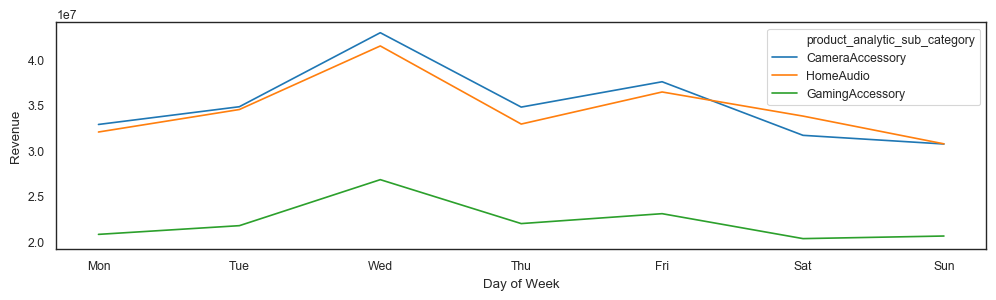

In [122]:
from datetime import datetime

# Function to extract day of week from date
def wday(x):
    return(datetime.strptime(x, '%Y-%m-%d').date().weekday())

product_orders['weekday'] = product_orders['order_date'].astype('str').apply(wday)

# Mapping the days of week
product_orders['weekday2'] = product_orders['weekday'].map({0:'Mon', 1:'Tue', 2:'Wed', 3:'Thu', 4:'Fri', 5:'Sat', 6:'Sun'})

# Aggregating data by category and day of month
dayofweek_perf = pd.DataFrame(product_orders.groupby(['product_analytic_sub_category','weekday','weekday2']).agg({'gmv':'sum'})).reset_index().sort_values('weekday')

plt.figure(figsize=(12, 3), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.lineplot(x='weekday2',y= "gmv", hue = "product_analytic_sub_category", data=dayofweek_perf, ci=None, sort= False)
plt.ylabel("Revenue")
plt.xlabel("Day of Week")
plt.show()


Looking at the day of week sales numbers, we see that Wednesdays outperform all other days with the greatest revenue generated. This trend is consistent across all the 3 categories. Surprisingly, weekdays are seeing greater sales than the weekends across all the categories.

Another really important piece of analysis would be tagging new v. repeat customers. Being an e-commerce company, ElecKart would be keen to identify those customers that are loyal to them and those that are new. Segmenting customers in such a manner would allow for generating dsome really interesting insights, which can be actioned upon separately

In [123]:
# In case a user appears for more than 1 order id, we'll consider them as repeat customers
new_repeat = pd.DataFrame(product_orders.groupby(['cust_id', 'order_id']).agg({'units':'sum','gmv':'sum'})).reset_index()
new_repeat = new_repeat.loc[new_repeat['cust_id']!=0,:]

new_repeat.head()

,cust_id,order_id,units,gmv
1250,-1.00001305484472e+18,3633443827142500.0,1,2999.0
1251,-1.00001970033366E+018,3440896337930200.0,1,699.0
1252,-1.00006306129316e+18,1639911281591300.0,1,2500.0
1253,-1.00006810093158e+18,3552241447884400.0,1,223.0
1254,-1.00012404949138e+17,2566393434203700.0,1,9690.0


In [124]:
new_repeat = pd.DataFrame(new_repeat.groupby(['cust_id']).agg({'order_id':'count', 'units':'mean', 'gmv':'mean'})).reset_index()
new_repeat.columns = ['cust_id', 'orders', 'cart_items', 'gmv']

In [125]:
def repeat_new_flag(x):
    if x==1:
        return("new")
    else:
        return('existing')
new_repeat['flag'] = new_repeat['orders'].apply(repeat_new_flag)

In [126]:
new_repeat = pd.DataFrame(new_repeat.groupby('flag').agg({'cart_items':'mean', 'gmv':'mean'})).reset_index()
new_repeat.head()

,flag,cart_items,gmv
0,existing,1.074585,1409.216141
1,new,1.053778,1263.948604


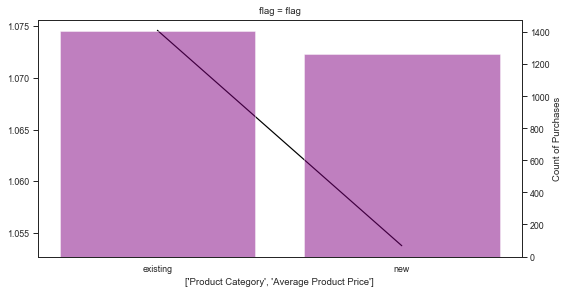

In [127]:
# Function for plotting secondary graph defined above as facetgrid_two_axes

df = new_repeat.copy()
df.columns = ['x', 'y1', 'y2']
df['flag'] = 'flag'
win_plot = sns.FacetGrid(df, col='flag',size=4, aspect=2)
(win_plot.map_dataframe(facetgrid_two_axes, dual_axis=True)
         .set_axis_labels(["Product Category", "Average Product Price"]))
plt.show()

We see that the existing customers are clearly more valuable than the new customers. They tend to have a greater number of items in their cart, and also tend to have a greater cart value compared to the new customers. The new vs. existing customer analysis can be fed into another model to understand the lifetime value of a customer based on their historical purchases

Next, let's try and understand the preferred mode of payment by the customers, and if there is any difference i them across the different product categories

In [128]:
payment_type = pd.DataFrame(product_orders.groupby(['product_analytic_sub_category', 's1_fact.order_payment_type']).agg(
                {'gmv':'mean', 'order_id':'count'})).reset_index()


In [129]:
payment_type

,product_analytic_sub_category,s1_fact.order_payment_type,gmv,order_id
0,CameraAccessory,COD,947.874894,149404
1,CameraAccessory,Prepaid,1577.282494,65775
2,GamingAccessory,COD,769.456977,138700
3,GamingAccessory,Prepaid,1073.491472,45255
4,HomeAudio,COD,2117.509084,83499
5,HomeAudio,Prepaid,2404.420609,27077


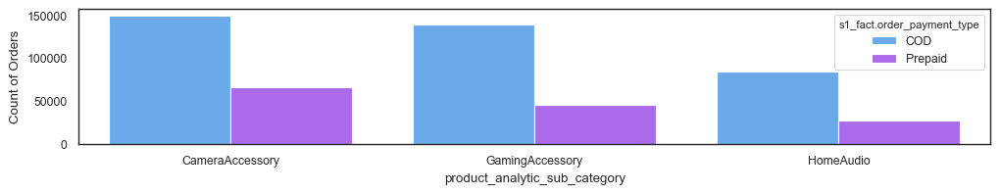

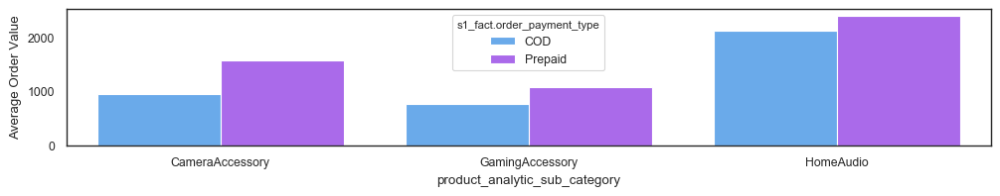

In [130]:
# Aggregating the data by payment type
payment_type = pd.DataFrame(product_orders.groupby(['product_analytic_sub_category', 's1_fact.order_payment_type']).agg(
                {'gmv':'mean', 'order_id':'count'})).reset_index()

plt.figure(figsize=(12, 4), dpi=100, facecolor='w', edgecolor='k', frameon='True')
plt.subplot(2,1,1)
sns.barplot(x='product_analytic_sub_category',y= "order_id", hue = "s1_fact.order_payment_type", palette='cool', data=payment_type, ci=None)
plt.ylabel("Count of Orders")
plt.show()

plt.figure(figsize=(12, 4), dpi=100, facecolor='w', edgecolor='k', frameon='True')
plt.subplot(2,1,2)
sns.barplot(x='product_analytic_sub_category',y= "gmv", hue = "s1_fact.order_payment_type", palette='cool', data=payment_type, ci=None)
plt.ylabel("Average Order Value")
plt.show()


We observe a very interesting trend here. Looking at the above analysis, we see that customers mostly prefer to pay via cash on delivery method for all the categories. However, when we add the cart value to the picture, we see that customers tend to prefer the prepaid method for orders which have a relativily high order value rather than the cash on delivery method.

Having analyzed the data extensively, we now have a good sense and understanding of what the data is able to convey. We've derived some really helpful insights off the back of how the features contribute to the sales for the company. The insights were derived and compared for each of the 3 categories that we're concerned about, and we've managed to get a clear indication of how the data for each of the category differs from each other.<br><br>
We'll now split the data for each of the 3 categories, and merge it with all our additional datasets, to make 3 exhaustive datasets (1 for each category), which we'll be using for the purpose of modelling

### Split on Sub-Categories: camera accessory, home audio and gaming accessory

In [131]:
# We'll be using discount as a % of list price instead of raw discount value
consumer_electronics2['discount%'] = round(100*((consumer_electronics2['product_mrp'] - consumer_electronics2['list_price']) / consumer_electronics2['product_mrp']),2)

We need to treat the categorical variables to numerical variables. The category variables that need to be considered are s1_fact.order_payment_type, product_analytic_vertical, product_type.

In [132]:
cat_vars = ['s1_fact.order_payment_type', 'product_analytic_vertical', 'product_type']

# Number of categories
for i in range(len(cat_vars)):
    print(cat_vars[i], "-",consumer_electronics2[cat_vars[i]].value_counts().count())

s1_fact.order_payment_type - 2
product_analytic_vertical - 72
product_type - 2


In [133]:
consumer_electronics2['product_type'].value_counts()

mass_market    1198912
luxury          298428
Name: product_type, dtype: int64

In [134]:
# We can use binary encoding for the 2 variables with just 2 categories
consumer_electronics2['is_cod'] = consumer_electronics2['s1_fact.order_payment_type'].apply(lambda x:1 if x=='COD' else 0)
consumer_electronics2['is_luxury'] = consumer_electronics2['product_type'].apply(lambda x:1 if x=='luxury' else 0)

In [135]:
# Creating dummy variables for the product_analytic_vertical variable
dummy = pd.get_dummies(consumer_electronics2[['product_analytic_vertical']], drop_first=True)

# Adding the results to the original dataframes
consumer_electronics2 = pd.concat([consumer_electronics2, dummy], axis=1)

### Camera Accessory Subset

In [136]:
# Filtering out the data for product subcategory 'Camera Accessory'
camaccess_orders = consumer_electronics2.loc[consumer_electronics2['product_analytic_sub_category']=='CameraAccessory', :]

print(camaccess_orders.shape)
camaccess_orders.head()

(215179, 100)


,fsn_id,order_date,Year,Month,order_id,order_item_id,gmv,units,s1_fact.order_payment_type,sla,...,product_analytic_vertical_Softbox,product_analytic_vertical_SoundMixer,product_analytic_vertical_SportsAndAction,product_analytic_vertical_Strap,product_analytic_vertical_TVOutCableAccessory,product_analytic_vertical_Teleconverter,product_analytic_vertical_Telescope,product_analytic_vertical_VideoGlasses,product_analytic_vertical_VideoPlayer,product_analytic_vertical_VoiceRecorder
0,ACCCX3S58G7B5F6P,2015-10-17,2015,10,3419300926147000.0,3419300926147000.0,6400.0,1,COD,5,...,0,0,0,0,0,0,0,0,0,0
1,ACCCX3S58G7B5F6P,2015-10-19,2015,10,1420830839915200.0,1420830839915200.0,6900.0,1,COD,7,...,0,0,0,0,0,0,0,0,0,0
2,ACCCX3S5AHMF55FV,2015-10-20,2015,10,2421912925714800.0,2421912925714800.0,1990.0,1,COD,10,...,0,0,0,0,0,0,0,0,0,0
3,ACCCX3S5AHMF55FV,2015-10-14,2015,10,4416592101738400.0,4416592101738400.0,1690.0,1,Prepaid,4,...,0,0,0,0,0,0,0,0,0,0
4,ACCCX3S5AHMF55FV,2015-10-17,2015,10,4419525153426400.0,4419525153426400.0,1618.0,1,Prepaid,6,...,0,0,0,0,0,0,0,0,0,0


In [137]:
# Removing all columns that have only 1 unique value
ls = []
for i in range(len(camaccess_orders.columns)):
    cnt = camaccess_orders[camaccess_orders.columns[i]].nunique()
    if cnt == 1:
        ls.append(camaccess_orders.columns[i])
        
# Dropping these columns from the table
camaccess_orders = camaccess_orders.drop(ls, axis = 1)

**Rolling the data up at a weekly level**

In [138]:
camaccess_weekly = camaccess_orders.groupby(['Week']).agg({'gmv':"sum",'discount%':'mean','sla':'mean', \
                    'product_procurement_sla':'mean', 'Payday_Flag':'sum','SpecialSaleDay_Flag':'sum','is_cod':'sum', \
                    'is_luxury':'sum', 'order_id':'nunique', 'cust_id':'nunique', 'units':'sum', 'Holiday_Flag':'sum', \
                    'product_analytic_vertical_Binoculars':'sum', 'product_analytic_vertical_CameraAccessory':'sum', \
                    'product_analytic_vertical_CameraBag':'sum', 'product_analytic_vertical_CameraBattery':'sum', \
                    'product_analytic_vertical_CameraBatteryCharger':'sum', 'product_analytic_vertical_CameraBatteryGrip':'sum', \
                    'product_analytic_vertical_CameraEyeCup':'sum', 'product_analytic_vertical_CameraFilmRolls':'sum', \
                    'product_analytic_vertical_CameraHousing':'sum', 'product_analytic_vertical_CameraMicrophone':'sum', \
                    'product_analytic_vertical_CameraMount':'sum', 'product_analytic_vertical_CameraRemoteControl':'sum', \
                    'product_analytic_vertical_CameraTripod':'sum', 'product_analytic_vertical_ExtensionTube':'sum', \
                    'product_analytic_vertical_Filter':'sum', 'product_analytic_vertical_Flash':'sum', \
                    'product_analytic_vertical_FlashShoeAdapter':'sum', 'product_analytic_vertical_Lens':'sum', \
                    'product_analytic_vertical_ReflectorUmbrella':'sum', 'product_analytic_vertical_Softbox':'sum', \
                    'product_analytic_vertical_Strap':'sum', 'product_analytic_vertical_Teleconverter':'sum', \
                    'product_analytic_vertical_Telescope':'sum'}).reset_index(drop=False)
camaccess_weekly.shape

(52, 36)

In [139]:
# Renaming the columns
camaccess_weekly.columns = ['Week', 'gmv', 'mean_discount%', 'mean_sla', 'mean_product_procurement_sla', 'total_paydays',
       'total_saledays', 'total_cod_payments', 'total_luxury_products', 'total_orders','total_customers', 'total_quantity',
       'total_holidays', 'product_analytic_vertical_Binoculars', 'product_analytic_vertical_CameraAccessory',
       'product_analytic_vertical_CameraBag', 'product_analytic_vertical_CameraBattery',
       'product_analytic_vertical_CameraBatteryCharger', 'product_analytic_vertical_CameraBatteryGrip',
       'product_analytic_vertical_CameraEyeCup', 'product_analytic_vertical_CameraFilmRolls',
       'product_analytic_vertical_CameraHousing', 'product_analytic_vertical_CameraMicrophone',
       'product_analytic_vertical_CameraMount', 'product_analytic_vertical_CameraRemoteControl',
       'product_analytic_vertical_CameraTripod', 'product_analytic_vertical_ExtensionTube',
       'product_analytic_vertical_Filter', 'product_analytic_vertical_Flash',
       'product_analytic_vertical_FlashShoeAdapter', 'product_analytic_vertical_Lens',
       'product_analytic_vertical_ReflectorUmbrella', 'product_analytic_vertical_Softbox', 'product_analytic_vertical_Strap',
       'product_analytic_vertical_Teleconverter', 'product_analytic_vertical_Telescope']

**Merging Media Investment Dataset**

In [140]:
#media_investment_weekly = media_investment_weekly.reset_index() # Already added week index to column previously

In [141]:
# Taking an left join on Week column
camaccess_weekly = pd.merge(camaccess_weekly, media_investment_weekly, how='left', on='Week')

In [142]:
print(camaccess_weekly.shape)
camaccess_weekly.head()

(52, 76)


,Week,gmv,mean_discount%,mean_sla,mean_product_procurement_sla,total_paydays,total_saledays,total_cod_payments,total_luxury_products,total_orders,...,SEM_MA_5,SEM_Ad_Stock,Radio,Radio_MA_3,Radio_MA_5,Radio_Ad_Stock,Other,Other_MA_3,Other_MA_5,Other_Ad_Stock
0,27,17520.0,51.612308,2.384615,2.846154,0,0,0,1,26,...,0.000000e+00,1.004739e+07,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,28,3777564.0,45.244225,6.865495,2.755739,0,0,1846,315,2742,...,0.000000e+00,1.507109e+07,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,29,4384840.0,45.507691,6.323423,2.786257,498,854,1983,352,2993,...,0.000000e+00,1.758294e+07,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,30,4204242.0,44.661596,6.387965,2.841755,0,0,2016,335,2970,...,0.000000e+00,1.883887e+07,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,31,2784580.0,43.813689,6.344845,2.803303,0,0,1381,227,1961,...,9.461577e+06,1.653774e+07,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


**Merging NPS Dataset**

In [143]:
# Taking an left join on Week column
camaccess_weekly = pd.merge(camaccess_weekly, nps_stock_weekly, how='left', on='Week')

In [144]:
print(camaccess_weekly.shape)
camaccess_weekly.head()

(52, 82)


,Week,gmv,mean_discount%,mean_sla,mean_product_procurement_sla,total_paydays,total_saledays,total_cod_payments,total_luxury_products,total_orders,...,Other,Other_MA_3,Other_MA_5,Other_Ad_Stock,NPS,NPS_MA_3,NPS_MA_5,Stock Index,Stock Index_MA_3,Stock Index_MA_5
0,27,17520.0,51.612308,2.384615,2.846154,0,0,0,1,26,...,0.0,0.0,0.0,0.0,54.599588,0.000000,0.000000,1177.0,0.000000,0.0
1,28,3777564.0,45.244225,6.865495,2.755739,0,0,1846,315,2742,...,0.0,0.0,0.0,0.0,54.599588,0.000000,0.000000,1177.0,0.000000,0.0
2,29,4384840.0,45.507691,6.323423,2.786257,498,854,1983,352,2993,...,0.0,0.0,0.0,0.0,54.599588,54.599588,0.000000,1177.0,1177.000000,0.0
3,30,4204242.0,44.661596,6.387965,2.841755,0,0,2016,335,2970,...,0.0,0.0,0.0,0.0,54.599588,54.599588,0.000000,1177.0,1177.000000,0.0
4,31,2784580.0,43.813689,6.344845,2.803303,0,0,1381,227,1961,...,0.0,0.0,0.0,0.0,57.293345,55.497507,55.138339,1191.5,1181.833333,1179.9


**Merging Weather Dataset**

In [145]:
# Taking an left join on Week column
camaccess_weekly = pd.merge(camaccess_weekly, weather_weekly, how='left', on='Week')

In [146]:
camaccess_weekly.columns

Index(['Week', 'gmv', 'mean_discount%', 'mean_sla',
       'mean_product_procurement_sla', 'total_paydays', 'total_saledays',
       'total_cod_payments', 'total_luxury_products', 'total_orders',
       'total_customers', 'total_quantity', 'total_holidays',
       'product_analytic_vertical_Binoculars',
       'product_analytic_vertical_CameraAccessory',
       'product_analytic_vertical_CameraBag',
       'product_analytic_vertical_CameraBattery',
       'product_analytic_vertical_CameraBatteryCharger',
       'product_analytic_vertical_CameraBatteryGrip',
       'product_analytic_vertical_CameraEyeCup',
       'product_analytic_vertical_CameraFilmRolls',
       'product_analytic_vertical_CameraHousing',
       'product_analytic_vertical_CameraMicrophone',
       'product_analytic_vertical_CameraMount',
       'product_analytic_vertical_CameraRemoteControl',
       'product_analytic_vertical_CameraTripod',
       'product_analytic_vertical_ExtensionTube',
       'product_analytic_vert

In [147]:
print(camaccess_weekly.shape)
camaccess_weekly.head()

(52, 91)


,Week,gmv,mean_discount%,mean_sla,mean_product_procurement_sla,total_paydays,total_saledays,total_cod_payments,total_luxury_products,total_orders,...,Stock Index_MA_5,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
0,27,17520.0,51.612308,2.384615,2.846154,0,0,0,1,26,...,0.0,25.500000,13.200000,19.360000,0.100000,1.460000,0.000000,0.0,0.000000,0.0
1,28,3777564.0,45.244225,6.865495,2.755739,0,0,1846,315,2742,...,0.0,24.833333,15.333333,20.100000,0.283333,2.383333,4.416667,0.0,4.416667,0.0
2,29,4384840.0,45.507691,6.323423,2.786257,498,854,1983,352,2993,...,0.0,28.750000,17.583333,23.183333,0.000000,5.183333,1.400000,0.0,1.400000,0.0
3,30,4204242.0,44.661596,6.387965,2.841755,0,0,2016,335,2970,...,0.0,29.750000,16.600000,23.060000,0.000000,5.060000,0.900000,0.0,0.900000,0.0
4,31,2784580.0,43.813689,6.344845,2.803303,0,0,1381,227,1961,...,1179.9,31.583333,17.500000,24.566667,0.000000,6.566667,4.633333,0.0,4.633333,0.0


### EDA on the Camera Accessory Merged Dataset to check Impact of Advertising on Revenue

Let's visualize the impact that advertising spend had on revenue for camera accessory products

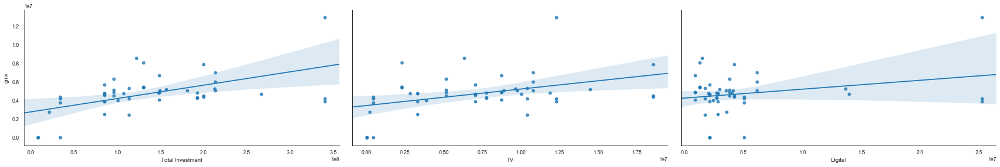

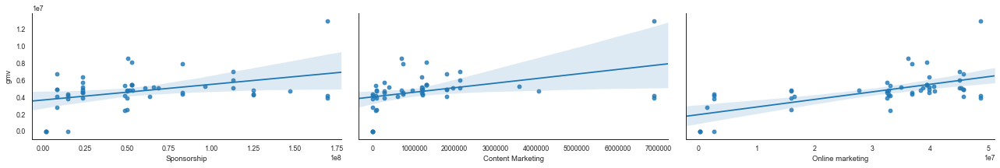

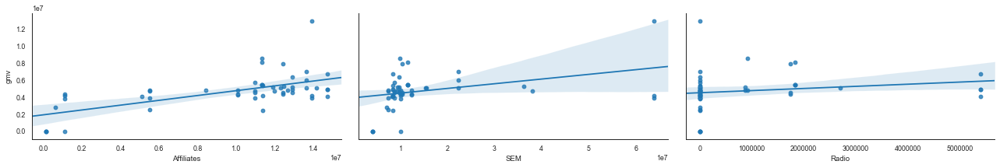

In [148]:
sns.pairplot(camaccess_weekly, x_vars=['Total Investment', 'TV', 'Digital'], \
             y_vars='gmv',size=4, aspect=2, kind='reg')
plt.show()

sns.pairplot(camaccess_weekly, x_vars=['Sponsorship', 'Content Marketing', 'Online marketing'], \
             y_vars='gmv',size=3, aspect=2, kind='reg')
plt.show()

sns.pairplot(camaccess_weekly, x_vars=['Affiliates', 'SEM', 'Radio'], \
             y_vars='gmv',size=3, aspect=2, kind='reg')
plt.show()


From the above, we see that there does seem to be a positive relationship between ad money spent and the revenue. Let's run a pearson correlation test to check if indeed that is the case

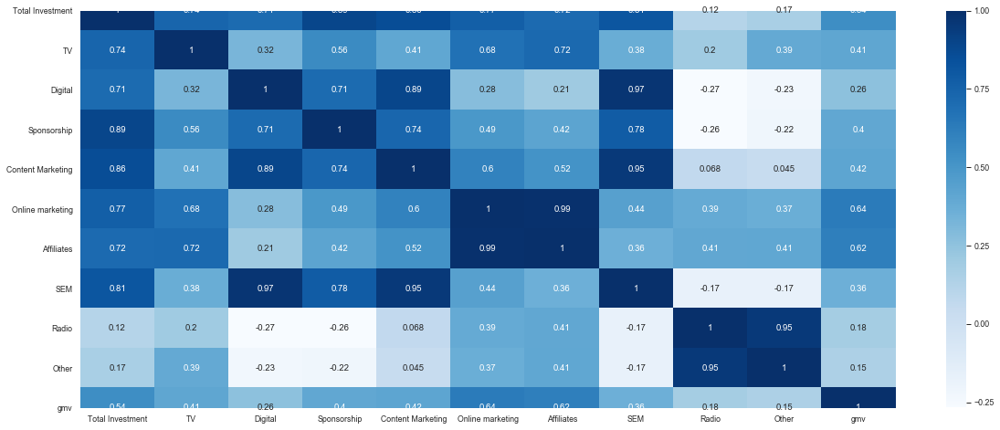

In [149]:
plt.figure(figsize=(20, 8))
camaccess_corr = camaccess_weekly[['Total Investment', 'TV', 'Digital', 'Sponsorship', 'Content Marketing', \
                                      'Online marketing', 'Affiliates', 'SEM', 'Radio', 'Other', 'gmv']].corr()
sns.heatmap(camaccess_corr, 
            xticklabels=camaccess_corr.columns.values,
            yticklabels=camaccess_corr.columns.values,
            annot=True,
            cmap="Blues")
plt.show()

We can verify using the correlation matrix (referring to the final column of the heatmap) that all the spends are positively correlated with the revenue generated from the camera accessory orders

Theoretically, we know that there are different types of effects that advertising can have on revenue i.e.:
- **Current Effect**: effect on revenue at the same time the ad is aired
- **Carry Over Effect**: effect on revenue that follows even after the day of the ad exposure
- **Dynamic Effect**: effect on revenue that changes with time. Broadly includes the wear-in effect, wear-out effect and hysterical effect
- **Shape Effect**: effect on revenue with increasing intensity of advertisement
- **Media Effect**: effect on revenue due to change in advertising media channels

Let's try and understand each of the above effects in context with the Camera Accessory Dataset to see if we are able to capture any of these effects

**Current Effect**

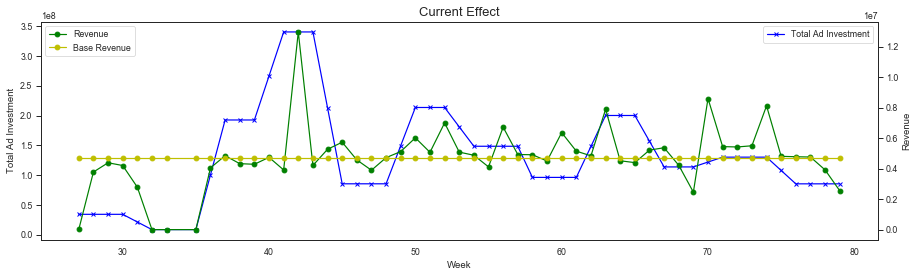

Correlation Coefficient: 0.54


In [150]:
base_revenue = [np.mean(camaccess_weekly['gmv'])]*len(camaccess_weekly['Week'])

fig, ax1 = plt.subplots()

ax2 = ax1.twinx()

ax1.plot(camaccess_weekly['Week'],camaccess_weekly['Total Investment'],'b', marker = 'x', label = 'Total Ad Investment')
ax2.plot(camaccess_weekly['Week'],camaccess_weekly['gmv'],label='Revenue',marker = 'o',color='g')
ax2.plot(camaccess_weekly['Week'],base_revenue,marker = 'o',color='y', Label = 'Base Revenue')


ax1.set_xlabel('Week')
ax1.set_ylabel('Total Ad Investment')
ax2.set_ylabel('Revenue')
fig.set_size_inches(15, 4)
plt.title("Current Effect", size = 13)
ax1.legend(loc="upper right")
ax2.legend(loc="upper left")
plt.show()

# Printing the correlation with the data
print("Correlation Coefficient:", round(camaccess_weekly['Total Investment'].corr(camaccess_weekly['gmv']),2))

Here we can clearly see that there is an impact on the revenue on the days when the advertisement is being aired. This is pretty evident at the beginning of the chart, when the spend on advertisement increases, the revenue goes above the base revenue

**Carry-Over Effect**

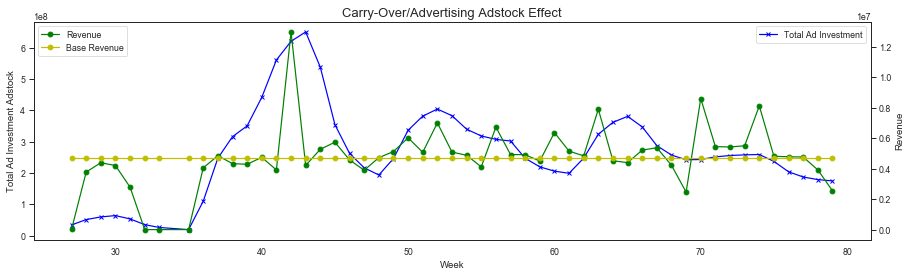

Correlation Coefficient: 0.57


In [151]:
base_revenue = [np.mean(camaccess_weekly['gmv'])]*len(camaccess_weekly['Week'])

fig, ax1 = plt.subplots()

ax2 = ax1.twinx()

ax1.plot(camaccess_weekly['Week'],camaccess_weekly['Total_Investment_Ad_Stock'],'b', marker = 'x', label = 'Total Ad Investment')
ax2.plot(camaccess_weekly['Week'],camaccess_weekly['gmv'],label='Revenue',marker = 'o',color='g')
ax2.plot(camaccess_weekly['Week'],base_revenue,marker = 'o',color='y', Label = 'Base Revenue')


ax1.set_xlabel('Week')
ax1.set_ylabel('Total Ad Investment Adstock')
ax2.set_ylabel('Revenue')
fig.set_size_inches(15, 4)
plt.title("Carry-Over/Advertising Adstock Effect", size = 13)
ax1.legend(loc="upper right")
ax2.legend(loc="upper left")
plt.show()

# Printing the correlation with the data
print("Correlation Coefficient:", round(camaccess_weekly['Total_Investment_Ad_Stock'].corr(camaccess_weekly['gmv']),2))

The carry over effect, or the advertising adstock, is the prolonged impact of advertising on a customers purchase behaviour. Here in the above chart, when we take the advertising ad stock into account, we observe that there is a carry-over effect causing the revenue to up-scale over the base revenue. The correlation coefficient value here is higher than the current effect, suggesting that there is a clear impact of carry-over happening

**Dynamic Effect**

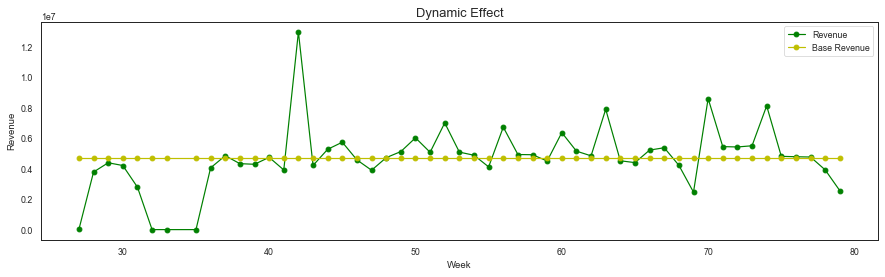

In [152]:
base_revenue = [np.mean(camaccess_weekly['gmv'])]*len(camaccess_weekly['Week'])

fig, ax1 = plt.subplots()

ax1.plot(camaccess_weekly['Week'],camaccess_weekly['gmv'],label='Revenue',marker = 'o',color='g')
ax1.plot(camaccess_weekly['Week'],base_revenue,marker = 'o',color='y', Label = 'Base Revenue')


ax1.set_xlabel('Week')
ax1.set_ylabel('Revenue')
fig.set_size_inches(15, 4)
plt.title("Dynamic Effect", size = 13)
ax1.legend(loc="upper right")
plt.show()

In the above chart, we clearly see the wear-in effect and wear-out effect at certain sections of the entire duration. However, what is important to notice is that on the whole, the Revenue after the duration of advertisement was well above where we had started with, which is the hysterical effect that we notice

**Shape Effect**

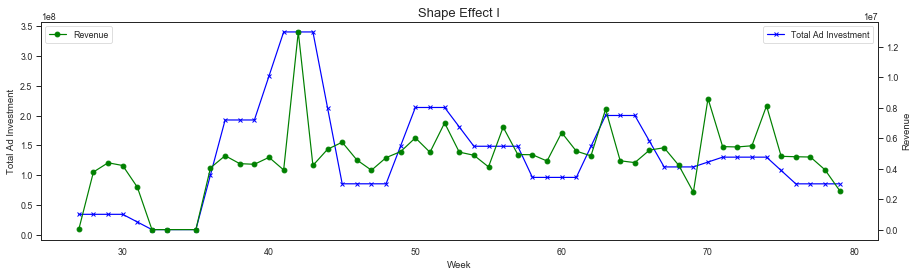

Line of Best Fit:
y = 2785722.97 + 0.01x


Text(0, 0.5, 'Revenue')

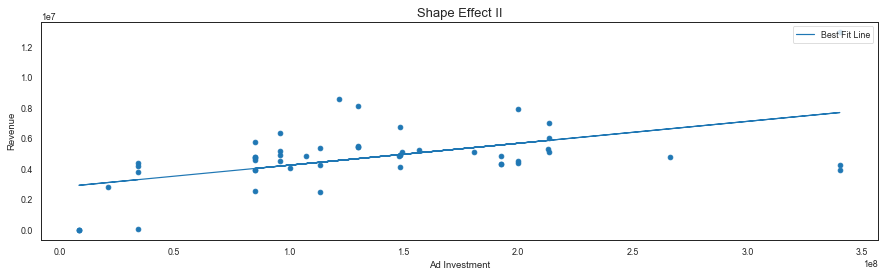

In [153]:
base_revenue = [np.mean(camaccess_weekly['gmv'])]*len(camaccess_weekly['Week'])

fig, ax1 = plt.subplots()

ax2 = ax1.twinx()

ax1.plot(camaccess_weekly['Week'],camaccess_weekly['Total Investment'],'b', marker = 'x', label = 'Total Ad Investment')
ax2.plot(camaccess_weekly['Week'],camaccess_weekly['gmv'],label='Revenue',marker = 'o',color='g')


ax1.set_xlabel('Week')
ax1.set_ylabel('Total Ad Investment')
ax2.set_ylabel('Revenue')
fig.set_size_inches(15, 4)
plt.title("Shape Effect I", size = 13)
ax1.legend(loc="upper right")
ax2.legend(loc="upper left")
plt.show()

# Defining he function for line of best fit
def best_fit(X, Y):

    xbar = sum(X)/len(X)
    ybar = sum(Y)/len(Y)
    n = len(X) 

    num = sum([xi*yi for xi,yi in zip(X, Y)]) - n * xbar * ybar
    denum = sum([xi**2 for xi in X]) - n * xbar**2

    b = num / denum
    a = ybar - b * xbar

    print('Line of Best Fit:\ny = {:.2f} + {:.2f}x'.format(a, b))

    return a, b

a, b = best_fit(camaccess_weekly['Total Investment'],camaccess_weekly['gmv'])

# plot points and fit line
import matplotlib.pyplot as plt

plt.figure(figsize=(15,4))

plt.scatter(camaccess_weekly['Total Investment'],camaccess_weekly['gmv'])

yfit = [a + b * xi for xi in camaccess_weekly['Total Investment']]
plt.plot(camaccess_weekly['Total Investment'], yfit, label = 'Best Fit Line')

plt.legend(loc="upper right")
plt.title("Shape Effect II", size = 13)
plt.xlabel('Ad Investment')
plt.ylabel('Revenue')

The above charts help explain the shape effect in our data. We see that as the intensity of ads increase, there is a relatively linear increase in the revenue for the company.

**Media Effect**

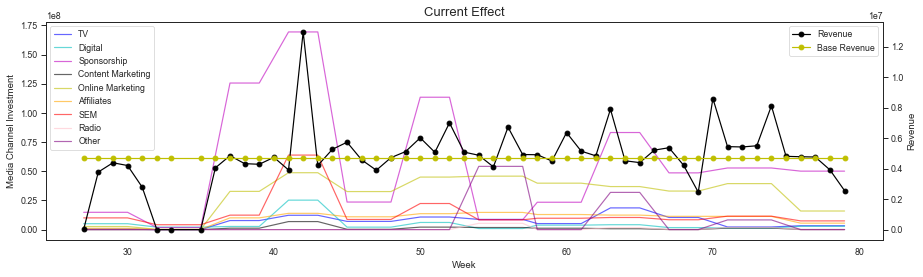

In [154]:
base_revenue = [np.mean(camaccess_weekly['gmv'])]*len(camaccess_weekly['Week'])

fig, ax1 = plt.subplots()

ax2 = ax1.twinx()

ax1.plot(camaccess_weekly['Week'],camaccess_weekly['TV'],label='TV',color='b', alpha=0.6)
ax1.plot(camaccess_weekly['Week'],camaccess_weekly['Digital'],label='Digital',color='c', alpha=0.6)
ax1.plot(camaccess_weekly['Week'],camaccess_weekly['Sponsorship'],label='Sponsorship',color='m', alpha=0.6)
ax1.plot(camaccess_weekly['Week'],camaccess_weekly['Content Marketing'],label='Content Marketing',color='k', alpha=0.6)
ax1.plot(camaccess_weekly['Week'],camaccess_weekly['Online marketing'],label='Online Marketing',color='y', alpha=0.6)
ax1.plot(camaccess_weekly['Week'],camaccess_weekly['Affiliates'],label='Affiliates',color='orange', alpha=0.6)
ax1.plot(camaccess_weekly['Week'],camaccess_weekly['SEM'],label='SEM',color='red', alpha=0.6)
ax1.plot(camaccess_weekly['Week'],camaccess_weekly['Radio'],label='Radio',color='pink', alpha=0.6)
ax1.plot(camaccess_weekly['Week'],camaccess_weekly['Other'],label='Other',color='purple', alpha=0.6)
ax2.plot(camaccess_weekly['Week'],camaccess_weekly['gmv'],label='Revenue',marker = 'o',color='black')
ax2.plot(camaccess_weekly['Week'],base_revenue,marker = 'o',color='y', Label = 'Base Revenue')


ax1.set_xlabel('Week')
ax1.set_ylabel('Media Channel Investment')
ax2.set_ylabel('Revenue')
fig.set_size_inches(15, 4)
plt.title("Current Effect", size = 13)
ax1.legend(loc="upper left")
ax2.legend(loc="upper right")
plt.show()


The media effect can be clearly observed in the above chart. We see that in the period between weeks 40-45, there is a significant increase in spend across several media channels, which is resulting in peaks for the revenue generated. This is also evident in other sections of the chart, such as weeks 49-53, 63-67.

Next, we'll proceed with creating the Gaming Accessory Category dataset and performing the above analysis to identify how advertising impacts revenue for products in this category

### Gaming Accessory Subset

In [155]:
# Filtering out the data for product subcategory 'Camera Accessory'
gameaccess_orders = consumer_electronics2.loc[consumer_electronics2['product_analytic_sub_category']=='GamingAccessory', :]

print(gameaccess_orders.shape)
gameaccess_orders.head()

(183955, 100)


,fsn_id,order_date,Year,Month,order_id,order_item_id,gmv,units,s1_fact.order_payment_type,sla,...,product_analytic_vertical_Softbox,product_analytic_vertical_SoundMixer,product_analytic_vertical_SportsAndAction,product_analytic_vertical_Strap,product_analytic_vertical_TVOutCableAccessory,product_analytic_vertical_Teleconverter,product_analytic_vertical_Telescope,product_analytic_vertical_VideoGlasses,product_analytic_vertical_VideoPlayer,product_analytic_vertical_VoiceRecorder
1590,ACCCZ34CBVZJTVQF,2015-10-04,2015,10,1408216975064600.0,1408216975064600.0,3075.0,1,COD,9,...,0,0,0,0,0,0,0,0,0,0
1591,ACCCZ34CBVZJTVQF,2015-10-14,2015,10,1416985339691600.0,1416985339691600.0,2750.0,1,COD,7,...,0,0,0,0,0,0,0,0,0,0
1592,ACCCZ34CBVZJTVQF,2015-10-15,2015,10,1417669228375400.0,1417669228375400.0,2899.0,1,Prepaid,5,...,0,0,0,0,0,0,0,0,0,0
1593,ACCCZ34CBVZJTVQF,2015-10-17,2015,10,1419414998353400.0,1419414998353400.0,2609.0,1,Prepaid,5,...,0,0,0,0,0,0,0,0,0,0
1594,ACCCZ34CBVZJTVQF,2015-10-26,2015,10,1427167582532600.0,1427167582532600.0,2772.0,1,Prepaid,5,...,0,0,0,0,0,0,0,0,0,0


In [156]:
# Removing all columns that have only 1 unique value
ls = []
for i in range(len(gameaccess_orders.columns)):
    cnt = gameaccess_orders[gameaccess_orders.columns[i]].nunique()
    if cnt == 1:
        ls.append(gameaccess_orders.columns[i])
        
# Dropping these columns from the table
gameaccess_orders = gameaccess_orders.drop(ls, axis = 1)

**Rolling the data up at a weekly level**

In [157]:
gameaccess_weekly = gameaccess_orders.groupby(['Week']).agg({'gmv':"sum",'discount%':'mean','sla':'mean', \
                    'product_procurement_sla':'mean', 'Payday_Flag':'sum','SpecialSaleDay_Flag':'sum','is_cod':'sum', \
                    'is_luxury':'sum', 'order_id':'nunique', 'cust_id':'nunique', 'units':'sum', 'Holiday_Flag':'sum', \
                    'product_analytic_vertical_CoolingPad':'sum', 'product_analytic_vertical_GameControlMount':'sum', \
                    'product_analytic_vertical_GamePad':'sum', 'product_analytic_vertical_GamingAccessoryKit':'sum', \
                    'product_analytic_vertical_GamingAdapter':'sum', 'product_analytic_vertical_GamingChargingStation':'sum', \
                    'product_analytic_vertical_GamingHeadset':'sum', 'product_analytic_vertical_GamingKeyboard':'sum', \
                    'product_analytic_vertical_GamingMemoryCard':'sum', 'product_analytic_vertical_GamingMouse':'sum', \
                    'product_analytic_vertical_GamingMousePad':'sum', 'product_analytic_vertical_GamingSpeaker':'sum', \
                    'product_analytic_vertical_JoystickGamingWheel':'sum', 'product_analytic_vertical_MotionController':'sum', \
                    'product_analytic_vertical_TVOutCableAccessory':'sum'}).reset_index(drop=False)
gameaccess_weekly.shape

(53, 28)

In [158]:
# Renaming the columns
gameaccess_weekly.columns = ['Week', 'gmv', 'mean_discount%', 'mean_sla', 'mean_product_procurement_sla', 'total_paydays',
       'total_saledays', 'total_cod_payments', 'total_luxury_products', 'total_orders','total_customers', 'total_quantity',
       'total_holidays', 'product_analytic_vertical_CoolingPad', 'product_analytic_vertical_GameControlMount',
       'product_analytic_vertical_GamePad', 'product_analytic_vertical_GamingAccessoryKit',
       'product_analytic_vertical_GamingAdapter', 'product_analytic_vertical_GamingChargingStation',
       'product_analytic_vertical_GamingHeadset', 'product_analytic_vertical_GamingKeyboard',
       'product_analytic_vertical_GamingMemoryCard', 'product_analytic_vertical_GamingMouse',
       'product_analytic_vertical_GamingMousePad', 'product_analytic_vertical_GamingSpeaker',
       'product_analytic_vertical_JoystickGamingWheel', 'product_analytic_vertical_MotionController',
       'product_analytic_vertical_TVOutCableAccessory']

**Merging Media Investment Dataset**

In [159]:
# Taking an left join on Week column
gameaccess_weekly = pd.merge(gameaccess_weekly, media_investment_weekly, how='left', on='Week')

In [160]:
print(gameaccess_weekly.shape)
gameaccess_weekly.head()

(53, 68)


,Week,gmv,mean_discount%,mean_sla,mean_product_procurement_sla,total_paydays,total_saledays,total_cod_payments,total_luxury_products,total_orders,...,SEM_MA_5,SEM_Ad_Stock,Radio,Radio_MA_3,Radio_MA_5,Radio_Ad_Stock,Other,Other_MA_3,Other_MA_5,Other_Ad_Stock
0,27,4.035900e+04,26.106786,3.000000,2.785714,3,0,0,4,28,...,0.000000e+00,1.004739e+07,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,28,2.713578e+06,40.072949,5.222445,2.952906,0,0,2188,251,2847,...,0.000000e+00,1.507109e+07,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,29,2.292193e+06,42.438119,5.223435,2.474163,319,748,2070,232,2707,...,0.000000e+00,1.758294e+07,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,30,2.628684e+06,37.051430,5.330929,2.295673,0,0,1898,269,2453,...,0.000000e+00,1.883887e+07,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,31,1.802954e+06,39.901294,5.736499,2.232641,1,0,1318,163,1663,...,9.461577e+06,1.653774e+07,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


**Merging NPS Dataset**

In [161]:
# Taking an left join on Week column
gameaccess_weekly = pd.merge(gameaccess_weekly, nps_stock_weekly, how='left', on='Week')

In [162]:
print(gameaccess_weekly.shape)
gameaccess_weekly.head()

(53, 74)


,Week,gmv,mean_discount%,mean_sla,mean_product_procurement_sla,total_paydays,total_saledays,total_cod_payments,total_luxury_products,total_orders,...,Other,Other_MA_3,Other_MA_5,Other_Ad_Stock,NPS,NPS_MA_3,NPS_MA_5,Stock Index,Stock Index_MA_3,Stock Index_MA_5
0,27,4.035900e+04,26.106786,3.000000,2.785714,3,0,0,4,28,...,0.0,0.0,0.0,0.0,54.599588,0.000000,0.000000,1177.0,0.000000,0.0
1,28,2.713578e+06,40.072949,5.222445,2.952906,0,0,2188,251,2847,...,0.0,0.0,0.0,0.0,54.599588,0.000000,0.000000,1177.0,0.000000,0.0
2,29,2.292193e+06,42.438119,5.223435,2.474163,319,748,2070,232,2707,...,0.0,0.0,0.0,0.0,54.599588,54.599588,0.000000,1177.0,1177.000000,0.0
3,30,2.628684e+06,37.051430,5.330929,2.295673,0,0,1898,269,2453,...,0.0,0.0,0.0,0.0,54.599588,54.599588,0.000000,1177.0,1177.000000,0.0
4,31,1.802954e+06,39.901294,5.736499,2.232641,1,0,1318,163,1663,...,0.0,0.0,0.0,0.0,57.293345,55.497507,55.138339,1191.5,1181.833333,1179.9


**Merging Weather Dataset**

In [163]:
# Taking an left join on Week column
gameaccess_weekly = pd.merge(gameaccess_weekly, weather_weekly, how='left', on='Week')

In [164]:
print(gameaccess_weekly.shape)
gameaccess_weekly.head()

(53, 83)


,Week,gmv,mean_discount%,mean_sla,mean_product_procurement_sla,total_paydays,total_saledays,total_cod_payments,total_luxury_products,total_orders,...,Stock Index_MA_5,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
0,27,4.035900e+04,26.106786,3.000000,2.785714,3,0,0,4,28,...,0.0,25.500000,13.200000,19.360000,0.100000,1.460000,0.000000,0.0,0.000000,0.0
1,28,2.713578e+06,40.072949,5.222445,2.952906,0,0,2188,251,2847,...,0.0,24.833333,15.333333,20.100000,0.283333,2.383333,4.416667,0.0,4.416667,0.0
2,29,2.292193e+06,42.438119,5.223435,2.474163,319,748,2070,232,2707,...,0.0,28.750000,17.583333,23.183333,0.000000,5.183333,1.400000,0.0,1.400000,0.0
3,30,2.628684e+06,37.051430,5.330929,2.295673,0,0,1898,269,2453,...,0.0,29.750000,16.600000,23.060000,0.000000,5.060000,0.900000,0.0,0.900000,0.0
4,31,1.802954e+06,39.901294,5.736499,2.232641,1,0,1318,163,1663,...,1179.9,31.583333,17.500000,24.566667,0.000000,6.566667,4.633333,0.0,4.633333,0.0


### EDA on the Game Accessory Merged Dataset to check Impact of Advertising on Revenue

Let's visualize the impact that advertising spend had on revenue for game accessory products

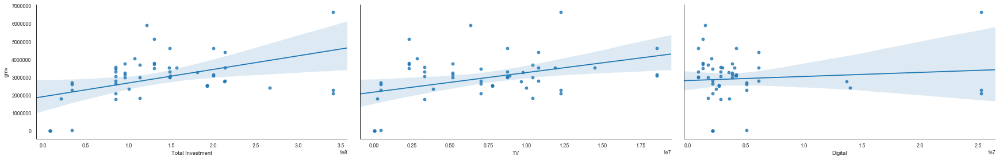

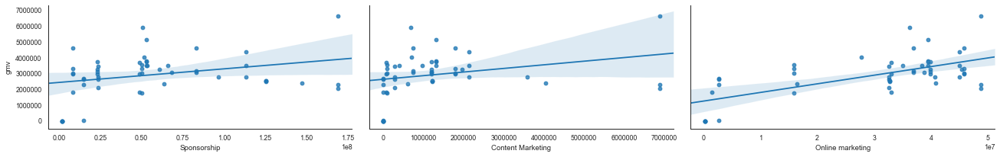

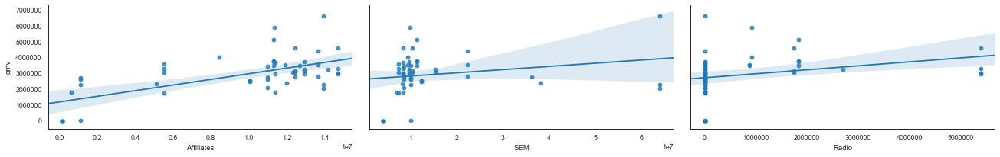

In [165]:
sns.pairplot(gameaccess_weekly, x_vars=['Total Investment', 'TV', 'Digital'], \
             y_vars='gmv',size=4, aspect=2, kind='reg')
plt.show()

sns.pairplot(gameaccess_weekly, x_vars=['Sponsorship', 'Content Marketing', 'Online marketing'], \
             y_vars='gmv',size=3, aspect=2, kind='reg')
plt.show()

sns.pairplot(gameaccess_weekly, x_vars=['Affiliates', 'SEM', 'Radio'], \
             y_vars='gmv',size=3, aspect=2, kind='reg')
plt.show()


From the above, we see that there does seem to be a positive relationship between ad money spent and the revenue. Let's run a pearson correlation test to check if indeed that is the case

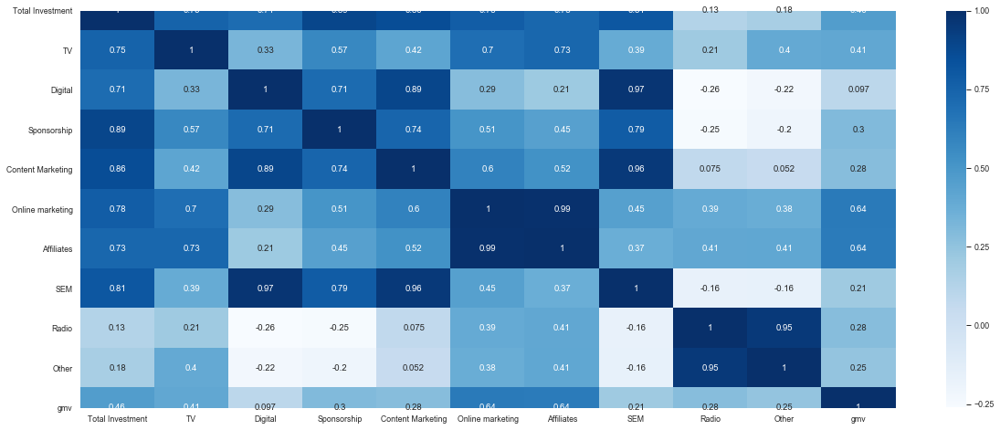

In [166]:
plt.figure(figsize=(20, 8))
gameaccess_corr = gameaccess_weekly[['Total Investment', 'TV', 'Digital', 'Sponsorship', 'Content Marketing', \
                                      'Online marketing', 'Affiliates', 'SEM', 'Radio', 'Other', 'gmv']].corr()
sns.heatmap(gameaccess_corr, 
            xticklabels=gameaccess_corr.columns.values,
            yticklabels=gameaccess_corr.columns.values,
            annot=True,
            cmap="Blues")
plt.show()

We can verify using the correlation matrix (referring to the final column of the heatmap) that all the spends are positively correlated with the revenue generated from the game accessory orders

Theoretically, we know that there are different types of effects that advertising can have on revenue i.e.:
- **Current Effect**: effect on revenue at the same time the ad is aired
- **Carry Over Effect**: effect on revenue that follows even after the day of the ad exposure
- **Dynamic Effect**: effect on revenue that changes with time. Broadly includes the wear-in effect, wear-out effect and hysterical effect
- **Shape Effect**: effect on revenue with increasing intensity of advertisement
- **Media Effect**: effect on revenue due to change in advertising media channels

Let's try and understand each of the above effects in context with the Game Accessory Dataset to see if we are able to capture any of these effects

**Current Effect**

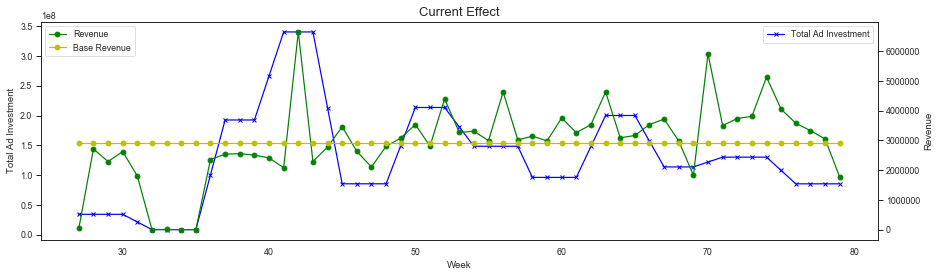

Correlation Coefficient: 0.46


In [167]:
base_revenue = [np.mean(gameaccess_weekly['gmv'])]*len(gameaccess_weekly['Week'])

fig, ax1 = plt.subplots()

ax2 = ax1.twinx()

ax1.plot(gameaccess_weekly['Week'],gameaccess_weekly['Total Investment'],'b', marker = 'x', label = 'Total Ad Investment')
ax2.plot(gameaccess_weekly['Week'],gameaccess_weekly['gmv'],label='Revenue',marker = 'o',color='g')
ax2.plot(gameaccess_weekly['Week'],base_revenue,marker = 'o',color='y', Label = 'Base Revenue')


ax1.set_xlabel('Week')
ax1.set_ylabel('Total Ad Investment')
ax2.set_ylabel('Revenue')
fig.set_size_inches(15, 4)
plt.title("Current Effect", size = 13)
ax1.legend(loc="upper right")
ax2.legend(loc="upper left")
plt.show()

# Printing the correlation with the data
print("Correlation Coefficient:", round(gameaccess_weekly['Total Investment'].corr(gameaccess_weekly['gmv']),2))

Here we can clearly see that there is an impact on the revenue on the days when the advertisement is being aired. However, the impact of current effect is slightly lower in the Gaming Accessory products compared to the Camera Accessory products when looking at the pearson's correlation coefficient 

**Carry-Over Effect**

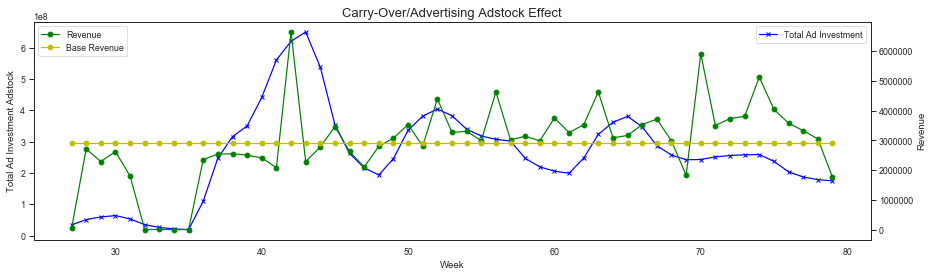

Correlation Coefficient: 0.51


In [168]:
base_revenue = [np.mean(gameaccess_weekly['gmv'])]*len(gameaccess_weekly['Week'])

fig, ax1 = plt.subplots()

ax2 = ax1.twinx()

ax1.plot(gameaccess_weekly['Week'],gameaccess_weekly['Total_Investment_Ad_Stock'],'b', marker = 'x', label = 'Total Ad Investment')
ax2.plot(gameaccess_weekly['Week'],gameaccess_weekly['gmv'],label='Revenue',marker = 'o',color='g')
ax2.plot(gameaccess_weekly['Week'],base_revenue,marker = 'o',color='y', Label = 'Base Revenue')


ax1.set_xlabel('Week')
ax1.set_ylabel('Total Ad Investment Adstock')
ax2.set_ylabel('Revenue')
fig.set_size_inches(15, 4)
plt.title("Carry-Over/Advertising Adstock Effect", size = 13)
ax1.legend(loc="upper right")
ax2.legend(loc="upper left")
plt.show()

# Printing the correlation with the data
print("Correlation Coefficient:", round(gameaccess_weekly['Total_Investment_Ad_Stock'].corr(gameaccess_weekly['gmv']),2))

In the above chart, when we take the advertising ad stock into account, we observe that there is a carry-over effect causing the revenue to up-scale over the base revenue. The correlation coefficient value here is higher than the current effect, suggesting that there is a clear impact of carry-over happening, This trend was consistent in the Camera Accessory Products too

**Dynamic Effect**

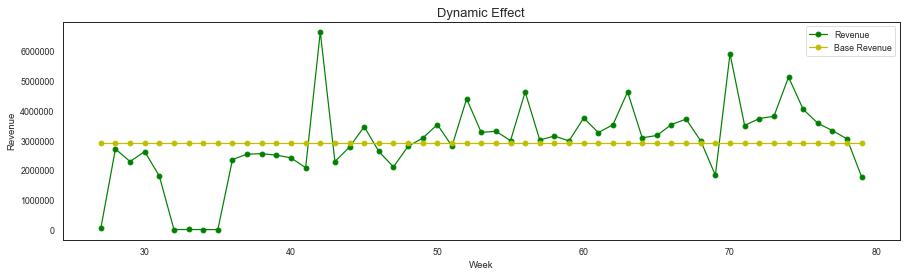

In [169]:
base_revenue = [np.mean(gameaccess_weekly['gmv'])]*len(gameaccess_weekly['Week'])

fig, ax1 = plt.subplots()

ax1.plot(gameaccess_weekly['Week'],gameaccess_weekly['gmv'],label='Revenue',marker = 'o',color='g')
ax1.plot(gameaccess_weekly['Week'],base_revenue,marker = 'o',color='y', Label = 'Base Revenue')


ax1.set_xlabel('Week')
ax1.set_ylabel('Revenue')
fig.set_size_inches(15, 4)
plt.title("Dynamic Effect", size = 13)
ax1.legend(loc="upper right")
plt.show()

In the above chart, we observe the wear-in effect and wear-out effect at certain sections over the entire duration. Also notice that the revenue after the duration of advertisement was well above where we had started with, which is the hysterical effect that we notice

**Shape Effect**

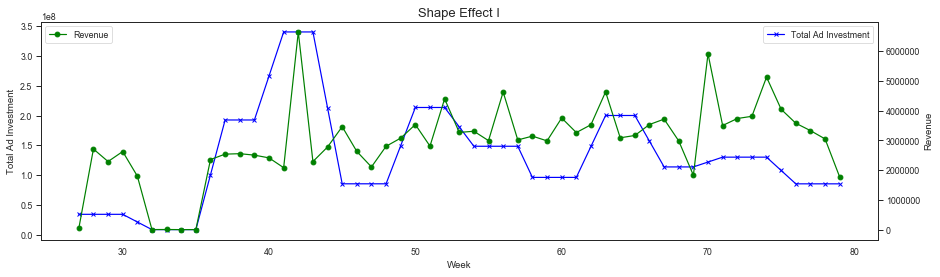

Line of Best Fit:
y = 1923238.63 + 0.01x


Text(0, 0.5, 'Revenue')

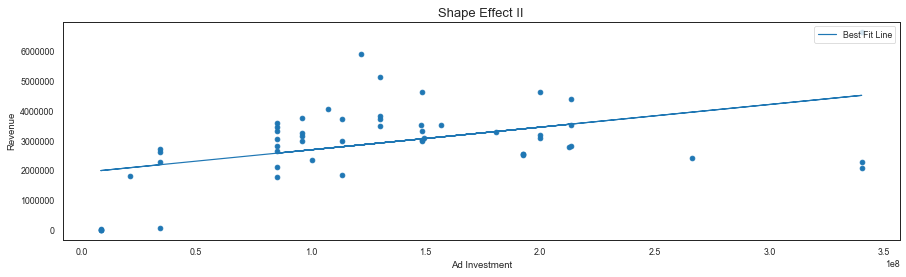

In [170]:
base_revenue = [np.mean(gameaccess_weekly['gmv'])]*len(gameaccess_weekly['Week'])

fig, ax1 = plt.subplots()

ax2 = ax1.twinx()

ax1.plot(gameaccess_weekly['Week'],gameaccess_weekly['Total Investment'],'b', marker = 'x', label = 'Total Ad Investment')
ax2.plot(gameaccess_weekly['Week'],gameaccess_weekly['gmv'],label='Revenue',marker = 'o',color='g')


ax1.set_xlabel('Week')
ax1.set_ylabel('Total Ad Investment')
ax2.set_ylabel('Revenue')
fig.set_size_inches(15, 4)
plt.title("Shape Effect I", size = 13)
ax1.legend(loc="upper right")
ax2.legend(loc="upper left")
plt.show()

# Defining he function for line of best fit
def best_fit(X, Y):

    xbar = sum(X)/len(X)
    ybar = sum(Y)/len(Y)
    n = len(X) 

    num = sum([xi*yi for xi,yi in zip(X, Y)]) - n * xbar * ybar
    denum = sum([xi**2 for xi in X]) - n * xbar**2

    b = num / denum
    a = ybar - b * xbar

    print('Line of Best Fit:\ny = {:.2f} + {:.2f}x'.format(a, b))

    return a, b

a, b = best_fit(gameaccess_weekly['Total Investment'],gameaccess_weekly['gmv'])

# plot points and fit line
import matplotlib.pyplot as plt

plt.figure(figsize=(15,4))

plt.scatter(gameaccess_weekly['Total Investment'],gameaccess_weekly['gmv'])

yfit = [a + b * xi for xi in gameaccess_weekly['Total Investment']]
plt.plot(gameaccess_weekly['Total Investment'], yfit, label = 'Best Fit Line')

plt.legend(loc="upper right")
plt.title("Shape Effect II", size = 13)
plt.xlabel('Ad Investment')
plt.ylabel('Revenue')

The above charts help explain the shape effect in our data. We see that as the intensity of ads increase, there is a relatively linear increase in the revenue for the company. This is evident from our scatter plot looking at the growing line of best fit

**Media Effect**

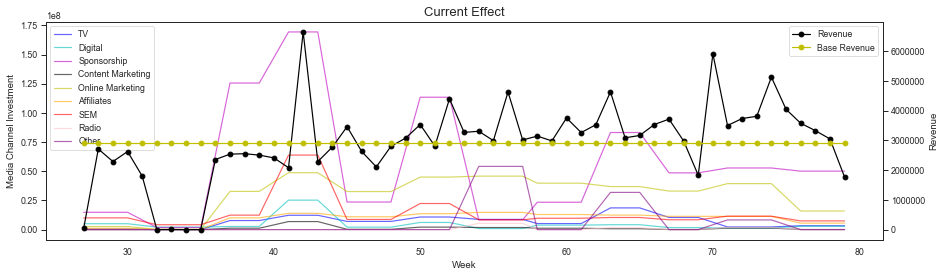

In [171]:
base_revenue = [np.mean(gameaccess_weekly['gmv'])]*len(gameaccess_weekly['Week'])

fig, ax1 = plt.subplots()

ax2 = ax1.twinx()

ax1.plot(gameaccess_weekly['Week'],gameaccess_weekly['TV'],label='TV',color='b', alpha=0.6)
ax1.plot(gameaccess_weekly['Week'],gameaccess_weekly['Digital'],label='Digital',color='c', alpha=0.6)
ax1.plot(gameaccess_weekly['Week'],gameaccess_weekly['Sponsorship'],label='Sponsorship',color='m', alpha=0.6)
ax1.plot(gameaccess_weekly['Week'],gameaccess_weekly['Content Marketing'],label='Content Marketing',color='k', alpha=0.6)
ax1.plot(gameaccess_weekly['Week'],gameaccess_weekly['Online marketing'],label='Online Marketing',color='y', alpha=0.6)
ax1.plot(gameaccess_weekly['Week'],gameaccess_weekly['Affiliates'],label='Affiliates',color='orange', alpha=0.6)
ax1.plot(gameaccess_weekly['Week'],gameaccess_weekly['SEM'],label='SEM',color='red', alpha=0.6)
ax1.plot(gameaccess_weekly['Week'],gameaccess_weekly['Radio'],label='Radio',color='pink', alpha=0.6)
ax1.plot(gameaccess_weekly['Week'],gameaccess_weekly['Other'],label='Other',color='purple', alpha=0.6)
ax2.plot(gameaccess_weekly['Week'],gameaccess_weekly['gmv'],label='Revenue',marker = 'o',color='black')
ax2.plot(gameaccess_weekly['Week'],base_revenue,marker = 'o',color='y', Label = 'Base Revenue')


ax1.set_xlabel('Week')
ax1.set_ylabel('Media Channel Investment')
ax2.set_ylabel('Revenue')
fig.set_size_inches(15, 4)
plt.title("Current Effect", size = 13)
ax1.legend(loc="upper left")
ax2.legend(loc="upper right")
plt.show()


The media effect can be clearly observed in the above chart. We see that in the period between weeks 40-45, there is a significant increase in spend across several media channels, which is resulting in peaks for the revenue generated. This is also evident in other sections of the chart, such as weeks 49-53, 63-67.

Next, we'll proceed with creating the Home Audio Category dataset and performing the above analysis to identify how advertising impacts revenue for products in this category

### Home Audio Subset

In [172]:
# Filtering out the data for product subcategory 'Camera Accessory'
homeaud_orders = consumer_electronics2.loc[consumer_electronics2['product_analytic_sub_category']=='HomeAudio', :]

print(homeaud_orders.shape)
homeaud_orders.head()

(110576, 100)


,fsn_id,order_date,Year,Month,order_id,order_item_id,gmv,units,s1_fact.order_payment_type,sla,...,product_analytic_vertical_Softbox,product_analytic_vertical_SoundMixer,product_analytic_vertical_SportsAndAction,product_analytic_vertical_Strap,product_analytic_vertical_TVOutCableAccessory,product_analytic_vertical_Teleconverter,product_analytic_vertical_Telescope,product_analytic_vertical_VideoGlasses,product_analytic_vertical_VideoPlayer,product_analytic_vertical_VoiceRecorder
2818,ACCCZZC9XHZZ49FS,2015-10-03,2015,10,1407395732747800.0,1407395732747800.0,7049.0,1,Prepaid,5,...,0,0,0,0,0,0,0,0,0,0
2819,ACCCZZC9XHZZ49FS,2015-10-16,2015,10,2418213882235600.0,2418213882235600.0,5489.0,1,Prepaid,2,...,0,0,0,0,0,0,0,0,0,0
2820,ACCCZZC9XHZZ49FS,2015-10-16,2015,10,2418675653264600.0,2418675653264600.0,6255.0,1,Prepaid,9,...,0,0,0,0,0,0,0,0,0,0
2821,ACCCZZC9XHZZ49FS,2015-10-16,2015,10,1418727172944200.0,1418727172944200.0,6099.0,1,Prepaid,3,...,0,0,0,0,0,0,0,0,0,0
2822,ACCCZZC9XHZZ49FS,2015-10-20,2015,10,2421983590777500.0,2421983590777500.0,6850.0,1,COD,9,...,0,0,0,0,0,0,0,0,0,0


In [173]:
# Removing all columns that have only 1 unique value
ls = []
for i in range(len(homeaud_orders.columns)):
    cnt = homeaud_orders[homeaud_orders.columns[i]].nunique()
    if cnt == 1:
        ls.append(homeaud_orders.columns[i])
        
# Dropping these columns from the table
homeaud_orders = homeaud_orders.drop(ls, axis = 1)

**Rolling the data up at a weekly level**

In [174]:
homeaud_weekly = homeaud_orders.groupby(['Week']).agg({'gmv':"sum",'discount%':'mean','sla':'mean', \
                    'product_procurement_sla':'mean', 'Payday_Flag':'sum','SpecialSaleDay_Flag':'sum','is_cod':'sum', \
                    'is_luxury':'sum', 'order_id':'nunique', 'cust_id':'nunique', 'units':'sum', 'Holiday_Flag':'sum', \
                    'product_analytic_vertical_BoomBox':'sum', 'product_analytic_vertical_DJController':'sum', \
                    'product_analytic_vertical_Dock':'sum', 'product_analytic_vertical_DockingStation':'sum', \
                    'product_analytic_vertical_FMRadio':'sum', 'product_analytic_vertical_HiFiSystem':'sum', \
                    'product_analytic_vertical_HomeAudioSpeaker':'sum', 'product_analytic_vertical_KaraokePlayer':'sum', \
                    'product_analytic_vertical_SlingBox':'sum', 'product_analytic_vertical_SoundMixer':'sum', \
                    'product_analytic_vertical_VoiceRecorder':'sum'}).reset_index(drop=False)
homeaud_weekly.shape

(50, 24)

In [175]:
# Renaming the columns
homeaud_weekly.columns = ['Week', 'gmv', 'mean_discount%', 'mean_sla', 'mean_product_procurement_sla', 'total_paydays',
       'total_saledays', 'total_cod_payments', 'total_luxury_products', 'total_orders','total_customers', 'total_quantity',
       'total_holidays', 'product_analytic_vertical_BoomBox', 'product_analytic_vertical_DJController',
       'product_analytic_vertical_Dock', 'product_analytic_vertical_DockingStation',
       'product_analytic_vertical_FMRadio', 'product_analytic_vertical_HiFiSystem',
       'product_analytic_vertical_HomeAudioSpeaker', 'product_analytic_vertical_KaraokePlayer',
       'product_analytic_vertical_SlingBox', 'product_analytic_vertical_SoundMixer',
       'product_analytic_vertical_VoiceRecorder']

**Merging Media Investment Dataset**

In [176]:
# Taking an left join on Week column
homeaud_weekly = pd.merge(homeaud_weekly, media_investment_weekly, how='left', on='Week')

In [177]:
print(homeaud_weekly.shape)
homeaud_weekly.head()

(50, 64)


,Week,gmv,mean_discount%,mean_sla,mean_product_procurement_sla,total_paydays,total_saledays,total_cod_payments,total_luxury_products,total_orders,...,SEM_MA_5,SEM_Ad_Stock,Radio,Radio_MA_3,Radio_MA_5,Radio_Ad_Stock,Other,Other_MA_3,Other_MA_5,Other_Ad_Stock
0,27,1.147430e+05,36.795122,2.707317,3.341463,3,0,1,24,40,...,0.000000e+00,1.004739e+07,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,28,4.599818e+06,32.379463,7.178711,2.753418,0,0,1534,757,2044,...,0.000000e+00,1.507109e+07,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,29,5.385425e+06,33.801071,6.926139,2.673779,347,670,1845,858,2428,...,0.000000e+00,1.758294e+07,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,30,4.722155e+06,33.586682,7.048438,2.739249,0,0,1722,685,2199,...,0.000000e+00,1.883887e+07,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,31,3.421038e+06,33.208560,7.163882,2.670308,0,0,1192,520,1554,...,9.461577e+06,1.653774e+07,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


**Merging NPS Dataset**

In [178]:
# Taking an left join on Week column
homeaud_weekly = pd.merge(homeaud_weekly, nps_stock_weekly, how='left', on='Week')

In [179]:
print(homeaud_weekly.shape)
homeaud_weekly.head()

(50, 70)


,Week,gmv,mean_discount%,mean_sla,mean_product_procurement_sla,total_paydays,total_saledays,total_cod_payments,total_luxury_products,total_orders,...,Other,Other_MA_3,Other_MA_5,Other_Ad_Stock,NPS,NPS_MA_3,NPS_MA_5,Stock Index,Stock Index_MA_3,Stock Index_MA_5
0,27,1.147430e+05,36.795122,2.707317,3.341463,3,0,1,24,40,...,0.0,0.0,0.0,0.0,54.599588,0.000000,0.000000,1177.0,0.000000,0.0
1,28,4.599818e+06,32.379463,7.178711,2.753418,0,0,1534,757,2044,...,0.0,0.0,0.0,0.0,54.599588,0.000000,0.000000,1177.0,0.000000,0.0
2,29,5.385425e+06,33.801071,6.926139,2.673779,347,670,1845,858,2428,...,0.0,0.0,0.0,0.0,54.599588,54.599588,0.000000,1177.0,1177.000000,0.0
3,30,4.722155e+06,33.586682,7.048438,2.739249,0,0,1722,685,2199,...,0.0,0.0,0.0,0.0,54.599588,54.599588,0.000000,1177.0,1177.000000,0.0
4,31,3.421038e+06,33.208560,7.163882,2.670308,0,0,1192,520,1554,...,0.0,0.0,0.0,0.0,57.293345,55.497507,55.138339,1191.5,1181.833333,1179.9


**Merging Weather Dataset**

In [180]:
# Taking an left join on Week column
homeaud_weekly = pd.merge(homeaud_weekly, weather_weekly, how='left', on='Week')

In [181]:
print(homeaud_weekly.shape)
homeaud_weekly.head()

(50, 79)


,Week,gmv,mean_discount%,mean_sla,mean_product_procurement_sla,total_paydays,total_saledays,total_cod_payments,total_luxury_products,total_orders,...,Stock Index_MA_5,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
0,27,1.147430e+05,36.795122,2.707317,3.341463,3,0,1,24,40,...,0.0,25.500000,13.200000,19.360000,0.100000,1.460000,0.000000,0.0,0.000000,0.0
1,28,4.599818e+06,32.379463,7.178711,2.753418,0,0,1534,757,2044,...,0.0,24.833333,15.333333,20.100000,0.283333,2.383333,4.416667,0.0,4.416667,0.0
2,29,5.385425e+06,33.801071,6.926139,2.673779,347,670,1845,858,2428,...,0.0,28.750000,17.583333,23.183333,0.000000,5.183333,1.400000,0.0,1.400000,0.0
3,30,4.722155e+06,33.586682,7.048438,2.739249,0,0,1722,685,2199,...,0.0,29.750000,16.600000,23.060000,0.000000,5.060000,0.900000,0.0,0.900000,0.0
4,31,3.421038e+06,33.208560,7.163882,2.670308,0,0,1192,520,1554,...,1179.9,31.583333,17.500000,24.566667,0.000000,6.566667,4.633333,0.0,4.633333,0.0


### EDA on the Home Audio Merged Dataset to check Impact of Advertising on Revenue

Let's visualize the impact that advertising spend had on revenue for home audio products

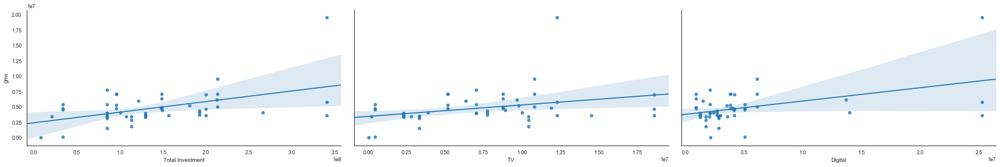

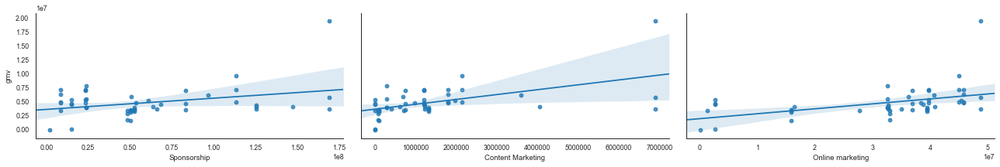

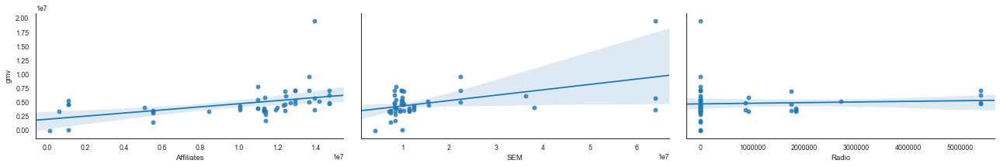

In [182]:
sns.pairplot(homeaud_weekly, x_vars=['Total Investment', 'TV', 'Digital'], \
             y_vars='gmv',size=4, aspect=2, kind='reg')
plt.show()

sns.pairplot(homeaud_weekly, x_vars=['Sponsorship', 'Content Marketing', 'Online marketing'], \
             y_vars='gmv',size=3, aspect=2, kind='reg')
plt.show()

sns.pairplot(homeaud_weekly, x_vars=['Affiliates', 'SEM', 'Radio'], \
             y_vars='gmv',size=3, aspect=2, kind='reg')
plt.show()


From the above, we see that there does seem to be a positive relationship between ad money spent and the revenue. Let's run a pearson correlation test to check if indeed that is the case

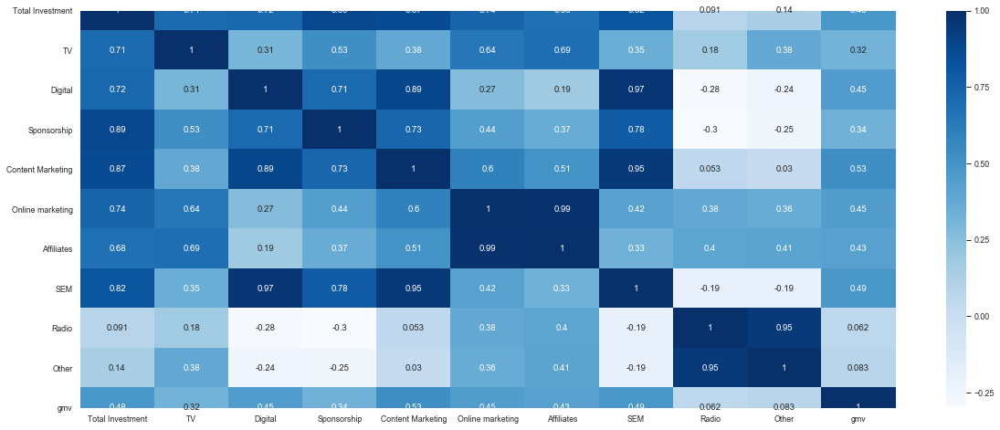

In [183]:
plt.figure(figsize=(20, 8))
homeaud_corr = homeaud_weekly[['Total Investment', 'TV', 'Digital', 'Sponsorship', 'Content Marketing', \
                                      'Online marketing', 'Affiliates', 'SEM', 'Radio', 'Other', 'gmv']].corr()
sns.heatmap(homeaud_corr, 
            xticklabels=homeaud_corr.columns.values,
            yticklabels=homeaud_corr.columns.values,
            annot=True,
            cmap="Blues")
plt.show()

We can verify using the correlation matrix (referring to the final column of the heatmap) that all the spends are positively correlated with the revenue generated from the home audio orders

As mentioned previously, there are different types of effects that advertising can have on revenue i.e.:
- **Current Effect**: effect on revenue at the same time the ad is aired
- **Carry Over Effect**: effect on revenue that follows even after the day of the ad exposure
- **Dynamic Effect**: effect on revenue that changes with time. Broadly includes the wear-in effect, wear-out effect and hysterical effect
- **Shape Effect**: effect on revenue with increasing intensity of advertisement
- **Media Effect**: effect on revenue due to change in advertising media channels

Let's try and understand each of the above effects in context with the Home Audio Dataset to see if we are able to capture any of these effects

**Current-Effect**

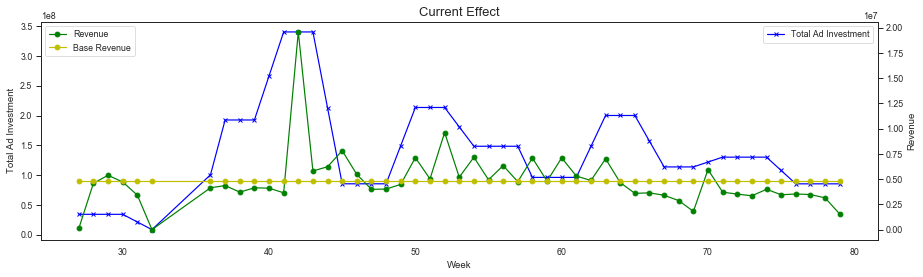

Correlation Coefficient: 0.48


In [184]:
base_revenue = [np.mean(homeaud_weekly['gmv'])]*len(homeaud_weekly['Week'])

fig, ax1 = plt.subplots()

ax2 = ax1.twinx()

ax1.plot(homeaud_weekly['Week'],homeaud_weekly['Total Investment'],'b', marker = 'x', label = 'Total Ad Investment')
ax2.plot(homeaud_weekly['Week'],homeaud_weekly['gmv'],label='Revenue',marker = 'o',color='g')
ax2.plot(homeaud_weekly['Week'],base_revenue,marker = 'o',color='y', Label = 'Base Revenue')


ax1.set_xlabel('Week')
ax1.set_ylabel('Total Ad Investment')
ax2.set_ylabel('Revenue')
fig.set_size_inches(15, 4)
plt.title("Current Effect", size = 13)
ax1.legend(loc="upper right")
ax2.legend(loc="upper left")
plt.show()

# Printing the correlation with the data
print("Correlation Coefficient:", round(homeaud_weekly['Total Investment'].corr(homeaud_weekly['gmv']),2))

Here we can clearly see that there is an impact on the revenue on the days when the advertisement is being aired.

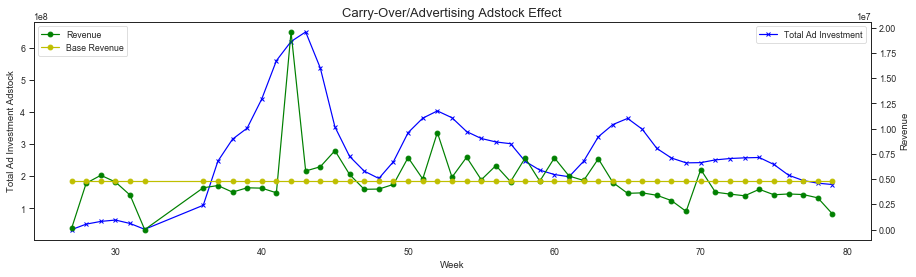

Correlation Coefficient: 0.53


In [185]:
base_revenue = [np.mean(homeaud_weekly['gmv'])]*len(homeaud_weekly['Week'])

fig, ax1 = plt.subplots()

ax2 = ax1.twinx()

ax1.plot(homeaud_weekly['Week'],homeaud_weekly['Total_Investment_Ad_Stock'],'b', marker = 'x', label = 'Total Ad Investment')
ax2.plot(homeaud_weekly['Week'],homeaud_weekly['gmv'],label='Revenue',marker = 'o',color='g')
ax2.plot(homeaud_weekly['Week'],base_revenue,marker = 'o',color='y', Label = 'Base Revenue')


ax1.set_xlabel('Week')
ax1.set_ylabel('Total Ad Investment Adstock')
ax2.set_ylabel('Revenue')
fig.set_size_inches(15, 4)
plt.title("Carry-Over/Advertising Adstock Effect", size = 13)
ax1.legend(loc="upper right")
ax2.legend(loc="upper left")
plt.show()

# Printing the correlation with the data
print("Correlation Coefficient:", round(homeaud_weekly['Total_Investment_Ad_Stock'].corr(homeaud_weekly['gmv']),2))

In the above chart, when we take the advertising ad stock into account, we observe that there is a carry-over effect causing the revenue to up-scale over the base revenue. The correlation coefficient value here is higher than the current effect, suggesting that there is a clear impact of carry-over happening,

**Dynamic Effect**

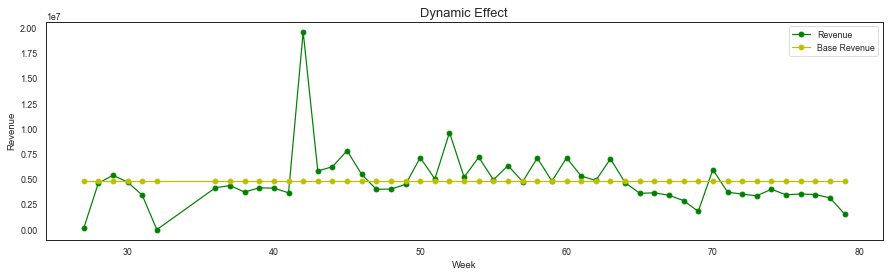

In [186]:
base_revenue = [np.mean(homeaud_weekly['gmv'])]*len(homeaud_weekly['Week'])

fig, ax1 = plt.subplots()

ax1.plot(homeaud_weekly['Week'],homeaud_weekly['gmv'],label='Revenue',marker = 'o',color='g')
ax1.plot(homeaud_weekly['Week'],base_revenue,marker = 'o',color='y', Label = 'Base Revenue')


ax1.set_xlabel('Week')
ax1.set_ylabel('Revenue')
fig.set_size_inches(15, 4)
plt.title("Dynamic Effect", size = 13)
ax1.legend(loc="upper right")
plt.show()

In the above chart, we observe the wear-in effect and wear-out effect at certain sections over the entire duration. 

**Shape Effect**

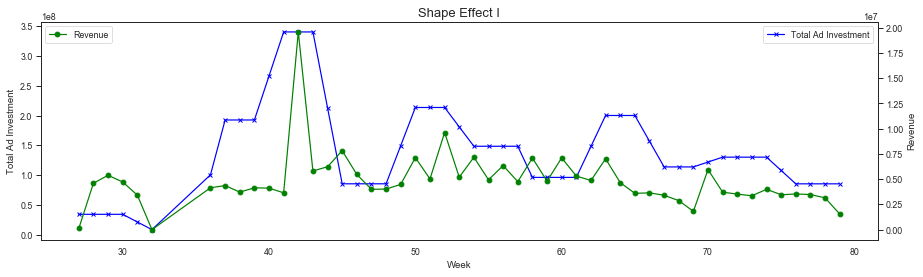

Line of Best Fit:
y = 2431798.96 + 0.02x


Text(0, 0.5, 'Revenue')

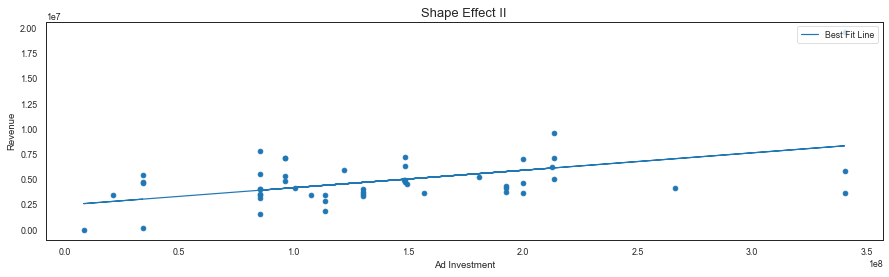

In [187]:
base_revenue = [np.mean(homeaud_weekly['gmv'])]*len(homeaud_weekly['Week'])

fig, ax1 = plt.subplots()

ax2 = ax1.twinx()

ax1.plot(homeaud_weekly['Week'],homeaud_weekly['Total Investment'],'b', marker = 'x', label = 'Total Ad Investment')
ax2.plot(homeaud_weekly['Week'],homeaud_weekly['gmv'],label='Revenue',marker = 'o',color='g')


ax1.set_xlabel('Week')
ax1.set_ylabel('Total Ad Investment')
ax2.set_ylabel('Revenue')
fig.set_size_inches(15, 4)
plt.title("Shape Effect I", size = 13)
ax1.legend(loc="upper right")
ax2.legend(loc="upper left")
plt.show()

# Defining he function for line of best fit
def best_fit(X, Y):

    xbar = sum(X)/len(X)
    ybar = sum(Y)/len(Y)
    n = len(X) 

    num = sum([xi*yi for xi,yi in zip(X, Y)]) - n * xbar * ybar
    denum = sum([xi**2 for xi in X]) - n * xbar**2

    b = num / denum
    a = ybar - b * xbar

    print('Line of Best Fit:\ny = {:.2f} + {:.2f}x'.format(a, b))

    return a, b

a, b = best_fit(homeaud_weekly['Total Investment'],homeaud_weekly['gmv'])

# plot points and fit line
import matplotlib.pyplot as plt

plt.figure(figsize=(15,4))

plt.scatter(homeaud_weekly['Total Investment'],homeaud_weekly['gmv'])

yfit = [a + b * xi for xi in homeaud_weekly['Total Investment']]
plt.plot(homeaud_weekly['Total Investment'], yfit, label = 'Best Fit Line')

plt.legend(loc="upper right")
plt.title("Shape Effect II", size = 13)
plt.xlabel('Ad Investment')
plt.ylabel('Revenue')

The above charts help explain the shape effect in our data. We see that as the intensity of ads increase, there is a relatively linear increase in the revenue for the company. This is evident from our scatter plot looking at the growing line of best fit

**Media Effect**

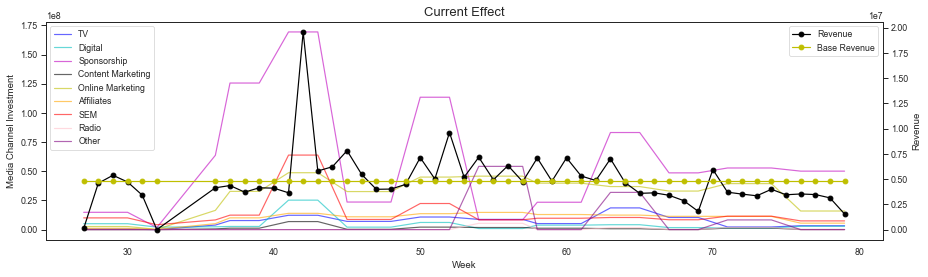

In [188]:
base_revenue = [np.mean(homeaud_weekly['gmv'])]*len(homeaud_weekly['Week'])

fig, ax1 = plt.subplots()

ax2 = ax1.twinx()

ax1.plot(homeaud_weekly['Week'],homeaud_weekly['TV'],label='TV',color='b', alpha=0.6)
ax1.plot(homeaud_weekly['Week'],homeaud_weekly['Digital'],label='Digital',color='c', alpha=0.6)
ax1.plot(homeaud_weekly['Week'],homeaud_weekly['Sponsorship'],label='Sponsorship',color='m', alpha=0.6)
ax1.plot(homeaud_weekly['Week'],homeaud_weekly['Content Marketing'],label='Content Marketing',color='k', alpha=0.6)
ax1.plot(homeaud_weekly['Week'],homeaud_weekly['Online marketing'],label='Online Marketing',color='y', alpha=0.6)
ax1.plot(homeaud_weekly['Week'],homeaud_weekly['Affiliates'],label='Affiliates',color='orange', alpha=0.6)
ax1.plot(homeaud_weekly['Week'],homeaud_weekly['SEM'],label='SEM',color='red', alpha=0.6)
ax1.plot(homeaud_weekly['Week'],homeaud_weekly['Radio'],label='Radio',color='pink', alpha=0.6)
ax1.plot(homeaud_weekly['Week'],homeaud_weekly['Other'],label='Other',color='purple', alpha=0.6)
ax2.plot(homeaud_weekly['Week'],homeaud_weekly['gmv'],label='Revenue',marker = 'o',color='black')
ax2.plot(homeaud_weekly['Week'],base_revenue,marker = 'o',color='y', Label = 'Base Revenue')


ax1.set_xlabel('Week')
ax1.set_ylabel('Media Channel Investment')
ax2.set_ylabel('Revenue')
fig.set_size_inches(15, 4)
plt.title("Current Effect", size = 13)
ax1.legend(loc="upper left")
ax2.legend(loc="upper right")
plt.show()


The media effect can be clearly observed in the above chart. We see that in the period between weeks 40-45, there is a significant increase in spend across several media channels, which is resulting in peaks for the revenue generated. This is also evident in other sections of the chart, such as weeks 49-53, 63-67.

Now that we have engineered all our new KPI's, identified the trends & drawn business-related insights from the dataset, explored the impact that advertising across the different channels has had on each of the products that we're concerned about, let's go ahead and build the Market-Mix-Models for each of the categories separately

------
<br>

### Building the Regression Models for Marketing Mix

## Camera Accessory Models

Let's begin the process of creating the marketing mix models for the camera accessory dataset. Before we jump into the different models, we first need to ensure that the data is prepared for modelling

In [189]:
camaccess_weekly.head()

,Week,gmv,mean_discount%,mean_sla,mean_product_procurement_sla,total_paydays,total_saledays,total_cod_payments,total_luxury_products,total_orders,...,Stock Index_MA_5,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
0,27,17520.0,51.612308,2.384615,2.846154,0,0,0,1,26,...,0.0,25.500000,13.200000,19.360000,0.100000,1.460000,0.000000,0.0,0.000000,0.0
1,28,3777564.0,45.244225,6.865495,2.755739,0,0,1846,315,2742,...,0.0,24.833333,15.333333,20.100000,0.283333,2.383333,4.416667,0.0,4.416667,0.0
2,29,4384840.0,45.507691,6.323423,2.786257,498,854,1983,352,2993,...,0.0,28.750000,17.583333,23.183333,0.000000,5.183333,1.400000,0.0,1.400000,0.0
3,30,4204242.0,44.661596,6.387965,2.841755,0,0,2016,335,2970,...,0.0,29.750000,16.600000,23.060000,0.000000,5.060000,0.900000,0.0,0.900000,0.0
4,31,2784580.0,43.813689,6.344845,2.803303,0,0,1381,227,1961,...,1179.9,31.583333,17.500000,24.566667,0.000000,6.566667,4.633333,0.0,4.633333,0.0


In [190]:
camaccess_weekly.describe()

,Week,gmv,mean_discount%,mean_sla,mean_product_procurement_sla,total_paydays,total_saledays,total_cod_payments,total_luxury_products,total_orders,...,Stock Index_MA_5,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
count,52.000000,5.200000e+01,52.000000,52.000000,52.000000,52.000000,52.000000,52.000000,52.000000,52.000000,...,52.000000,52.000000,52.000000,52.000000,52.000000,52.000000,52.000000,52.000000,52.000000,52.000000
mean,53.365385,4.718501e+06,50.361464,6.011404,2.623673,256.038462,650.884615,2873.153846,349.750000,3972.153846,...,1071.580769,17.241667,6.859621,12.319832,7.190710,1.510542,2.550614,0.256593,2.807207,0.392628
std,15.361052,2.124522e+06,6.265456,0.694986,0.389352,334.887863,1502.883485,1533.743254,169.167729,1860.743741,...,317.659888,9.627047,8.407996,8.734591,7.093642,2.201809,3.236939,0.741508,3.520348,1.537772
min,27.000000,2.990000e+02,43.813689,2.384615,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,...,0.000000,-2.833333,-11.666667,-7.266667,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,40.750000,4.182089e+06,46.112688,5.741461,2.480080,0.000000,0.000000,2208.000000,298.250000,3061.500000,...,1093.875000,8.437500,0.525000,5.986250,0.237500,0.000000,0.247500,0.000000,0.295000,0.000000
50%,53.500000,4.770480e+06,49.264714,6.073730,2.664214,0.000000,0.000000,2953.500000,341.000000,3981.000000,...,1174.200000,17.425000,6.100000,12.464918,5.840000,0.000000,1.050000,0.000000,1.560000,0.000000
75%,66.250000,5.294556e+06,53.321881,6.329679,2.807481,526.500000,109.250000,3920.250000,383.000000,5079.500000,...,1205.900000,25.625000,15.008333,20.325000,12.013750,2.662500,3.840000,0.000000,4.212500,0.000000
max,79.000000,1.296471e+07,84.970000,7.500000,4.000000,1070.000000,8022.000000,7496.000000,1043.000000,10102.000000,...,1237.800000,32.250000,18.700000,24.566667,25.266667,6.566667,12.800000,3.000000,15.700000,10.333333


In [191]:
# Checking for any null values in the dataset
sum(camaccess_weekly.isnull().sum()!=0)

0

Plotting the correlation heatmap for all variables to check for any one-to-one variable collinearity

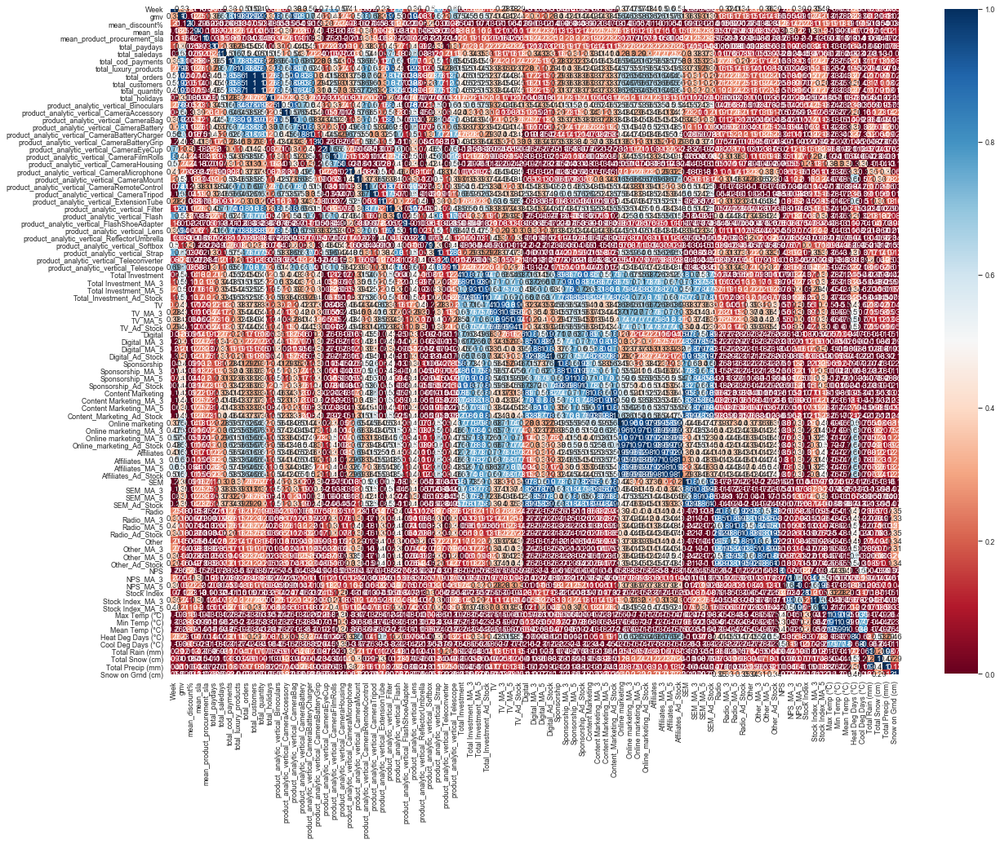

In [192]:
camaccess_corr = camaccess_weekly.corr()

plt.figure(figsize=(20,15))
sns.heatmap(camaccess_corr,vmin=0,vmax=1,annot=True,cmap='RdBu')

Considering we have over 90 variables, it won't be feasible to start looking at multicollinearity for each variable. Let's go ahead with building the model using Recursive Feature Elimination, and using the VIF metric to identify the variables show high multi-collinearity

**Splitting the data into Test and Train**

In [193]:
from sklearn.model_selection import train_test_split

# We specify this so that the train and test data set always have the same rows, respectively
np.random.seed(1)
camdf_train, camdf_test = train_test_split(camaccess_weekly, train_size = 0.7, test_size = 0.3, random_state = 100)

In [194]:
print(camdf_train.shape)
print(camdf_test.shape)

(36, 91)
(16, 91)


**Scaling the Features**

For all the non-binary features, let's use standard scaling to bring them to follow a gaussian distribution (mean-0, sigma-1). This is done to ensure all the variables will have a comparable scale, and hence the gradient descent procedure for the model will be a lot more optimized.

In [195]:
# Dropping the week variable
camdf_train = camdf_train.drop('Week', axis=1)
camdf_test = camdf_test.drop('Week', axis=1)

# Splitting the data into predictor and dependent variables
y_train = camdf_train[['gmv']]
X_train = camdf_train.drop('gmv', axis=1)

In [196]:
# Identifying all the non-binary variables
ls = []

for i in range(len(X_train.columns)):
    if X_train[X_train.columns[i]].nunique()>=3:
        ls.append(X_train.columns[i])

# Applying Standard Scaling to these features
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train[ls]=scaler.fit_transform(X_train[ls])

X_train.describe()

,mean_discount%,mean_sla,mean_product_procurement_sla,total_paydays,total_saledays,total_cod_payments,total_luxury_products,total_orders,total_customers,total_quantity,...,Stock Index_MA_5,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
count,3.600000e+01,3.600000e+01,3.600000e+01,3.600000e+01,3.600000e+01,3.600000e+01,3.600000e+01,3.600000e+01,3.600000e+01,3.600000e+01,...,3.600000e+01,3.600000e+01,3.600000e+01,3.600000e+01,3.600000e+01,3.600000e+01,3.600000e+01,3.600000e+01,3.600000e+01,3.600000e+01
mean,6.537980e-16,5.150201e-16,4.564250e-16,2.775558e-17,-1.233581e-17,-5.551115e-17,7.709882e-18,-2.775558e-17,3.700743e-17,-5.551115e-17,...,-3.546546e-17,3.824102e-16,-2.467162e-17,1.665335e-16,4.317534e-17,-9.868649e-17,-8.635068e-17,3.083953e-18,-7.401487e-17,4.471732e-17
std,1.014185e+00,1.014185e+00,1.014185e+00,1.014185e+00,1.014185e+00,1.014185e+00,1.014185e+00,1.014185e+00,1.014185e+00,1.014185e+00,...,1.014185e+00,1.014185e+00,1.014185e+00,1.014185e+00,1.014185e+00,1.014185e+00,1.014185e+00,1.014185e+00,1.014185e+00,1.014185e+00
min,-1.404875e+00,-2.982548e+00,-4.246219e+00,-8.888937e-01,-3.789592e-01,-1.977660e+00,-2.321261e+00,-2.398958e+00,-2.419437e+00,-2.397616e+00,...,-3.267515e+00,-1.958322e+00,-2.053433e+00,-2.034240e+00,-1.013084e+00,-7.076418e-01,-8.286626e-01,-2.670378e-01,-8.636702e-01,-2.255164e-01
25%,-9.448384e-01,-5.607520e-01,-4.526921e-01,-8.888937e-01,-3.789592e-01,-4.845534e-01,-3.866170e-01,-6.285638e-01,-6.487062e-01,-6.268791e-01,...,8.933530e-02,-7.439921e-01,-6.668666e-01,-6.546484e-01,-9.536184e-01,-7.076418e-01,-7.026389e-01,-2.670378e-01,-7.393572e-01,-2.255164e-01
50%,-1.786620e-01,1.182388e-01,1.701875e-01,-8.888937e-01,-3.789592e-01,-4.297791e-02,-1.792780e-01,-3.370664e-02,6.492029e-03,-5.837925e-03,...,3.358342e-01,5.677151e-02,2.191954e-02,-2.149766e-02,-2.041036e-01,-7.076418e-01,-3.890451e-01,-2.670378e-01,-3.224750e-01,-2.255164e-01
75%,9.437325e-01,5.087786e-01,6.417000e-01,8.213096e-01,-3.787947e-01,5.723876e-01,6.859333e-02,4.433942e-01,4.657474e-01,4.059834e-01,...,4.331142e-01,7.918457e-01,9.829188e-01,9.056978e-01,5.810266e-01,5.074352e-01,3.688553e-01,-2.670378e-01,4.685026e-01,-2.255164e-01
max,2.136603e+00,2.859033e+00,1.507245e+00,2.270724e+00,4.899092e+00,3.091329e+00,4.182634e+00,3.445455e+00,3.343841e+00,3.550764e+00,...,5.310080e-01,1.561152e+00,1.391220e+00,1.424031e+00,2.304243e+00,2.289168e+00,3.673020e+00,4.739921e+00,3.576906e+00,5.731320e+00


### 1. Basic Linear Additive Model

The linear model assumes that all the different KPI's are additive in nature and contribute linearly to the revenue generated by the company. The equation that the linear model follows is: <br><br>
Y = α + β1At + β2Pt + β3Dt + β4Qt + β5Tt + ϵ<br><br>
Where:<br> A - KPI's related to advertisement<br>
P - KPI's related to pricing<br>
D - KPI's related to promotion/discounts<br>
Q - KPI's related to product assortment/quality<br>
T - KPI's related to industry trends, seasonality etc.



Let's first create a vanilla model using all the variables as it is. This will give us an idea on what the base statistics of our basic model looks like.

In [197]:
# Fitting a regression line using statsmodels.api
import statsmodels.api as sm

# Add a constant
X_train_lm = sm.add_constant(X_train)

# Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

In [198]:
# Check the summary
print(lr.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                     0.000
Date:                Sun, 22 Dec 2019   Prob (F-statistic):                nan
Time:                        15:48:27   Log-Likelihood:                 611.71
No. Observations:                  36   AIC:                            -1151.
Df Residuals:                       0   BIC:                            -1094.
Df Model:                          35                                         
Covariance Type:            nonrobust                                         
                                                     coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------

**Making the Predictions**

In [199]:
# Splitting the data into predictor and dependent variables
y_test = camdf_test[['gmv']]
X_test = camdf_test.drop('gmv', axis=1)

# Scaling the test variables
X_test[ls]=scaler.transform(X_test[ls])

# Now let's use our model to make predictions.

# Creating X_test_new dataframe by dropping variables from X_test
X_test_new = X_test[X_train.columns[:]]

# Adding a constant variable 
X_test_new = sm.add_constant(X_test_new, has_constant='add')

# Making predictions
y_pred = lr.predict(X_test_new)
y_pred.head()

6    -1.426833e+06
32    6.212599e+06
38    4.258697e+06
35    6.358773e+06
33    5.585773e+06
dtype: float64

**Evaluating the model**

Text(0, 0.5, 'y_pred')

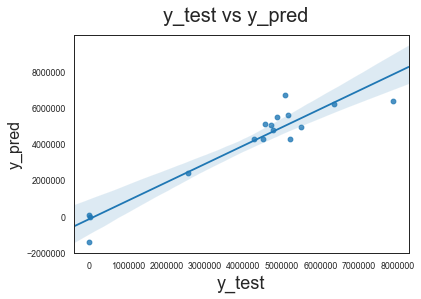

In [200]:
# plot points and fit line
# Plotting y_test and y_pred to understand the spread.
fig = plt.figure()
sns.regplot(y_test,y_pred)
fig.suptitle('y_test vs y_pred', fontsize=20)              # Plot heading 
plt.xlabel('y_test', fontsize=18)                          # X-label
plt.ylabel('y_pred', fontsize=16)                          # Y-label

In [201]:
# Evaluation metrics
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from statistics import stdev

#Returns the mean squared error; we'll take a square root
print('RMSE:', np.sqrt(mean_squared_error(y_test, y_pred)))
print('R-Squared:', round(r2_score(y_test, y_pred),2))

# Since RMSE is relative to the scale of our y-variable, let's normalize the RMSE by dividing it with the standard deviation
print('Normalized RMSE:', np.sqrt(mean_squared_error(y_test, y_pred))/stdev(y_train['gmv']))

RMSE: 759405.6877256043
R-Squared: 0.88
Normalized RMSE: 0.37718414956451174


Plotting the most important features off our most basic model

Text(0.5, 0, 'Coefficient')

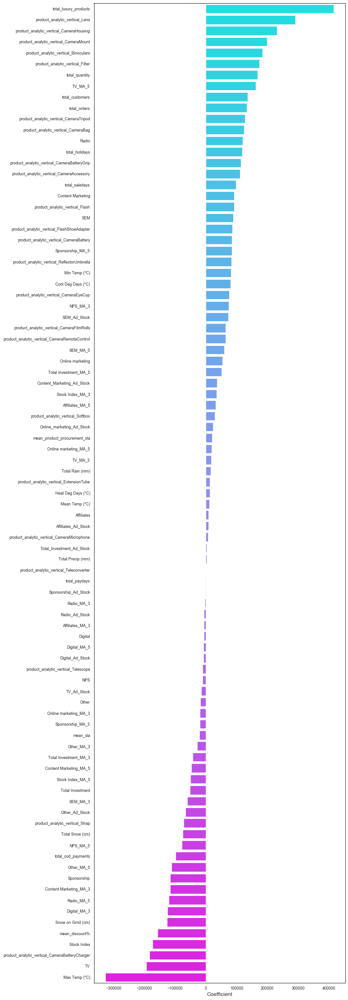

In [202]:
# Getting the coefficients from the model
# The lr_3.summary() is a set of tables, which we can export as html and then use Pandas to convert to a dataframe
df = pd.read_html(lr.summary().tables[1].as_html(),header=0,index_col=0)[0]
features = df.reset_index()[['index', 'coef']].sort_values('coef', ascending=False)
features = features.loc[features['index']!='const',:]

plt.figure(figsize=(10,40))
sns.barplot(y = features['index'], x = features['coef'], orient='h', palette='cool')
plt.ylabel('', size=12)
plt.xlabel('Coefficient', size=12)

Based on the above summary of our model, we see that the R-squared value is pretty high. However, there may be massive multi-collinearity present in the data. Also, it is not recommended to have a model with such a large number of predictors

Let's **check the VIF**
Variance Inflation Factor or VIF, gives a basic quantitative idea about how much the feature variables are correlated with each other. It is an extremely important parameter to test our linear model. The formula for calculating `VIF` is:

### $ VIF_i = \frac{1}{1 - {R_i}^2} $

In [203]:
# Check for the VIF values of the feature variables. 
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [204]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train.columns
vif['VIF'] = [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,mean_discount%,inf
1,mean_sla,inf
65,SEM_Ad_Stock,inf
64,SEM_MA_5,inf
63,SEM_MA_3,inf
...,...,...
26,product_analytic_vertical_Flash,inf
25,product_analytic_vertical_Filter,inf
24,product_analytic_vertical_ExtensionTube,inf
88,Snow on Grnd (cm),inf


As we see, there is very high multi-collinearity in our data, evident from the massively inflated VIF values for the features. We generally want a VIF that is less than 5. So there are clearly some variables we need to drop. 

Considering we're dealing with a really large set of data, it wouldn't be feasible of treating them 1 at a time. In that case, we'll opt for **Recursive Feature Elimination** to come down to about a smaller number of variables that explain the highest variance in the data and exhibit the least multicollinearity. Post that, we'll go into fine-tuning the model manually to end up with the final set of variables

In [205]:
# Importing RFE and LinearRegression
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression

In [206]:
lm = LinearRegression()
lm.fit(X_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

Let's perform RFE using 15 variables and then later fine-tune the model using other features such as the VIF, P-values and adjusted R-squared to identify the final set of variables

In [207]:
# running RFE
rfe = RFE(lm, 15)
rfe = rfe.fit(X_train, y_train)

In [208]:
zip(X_train.columns,rfe.support_,rfe.ranking_)

In [209]:
# Identify all the columns that were returned by our RFE model
col = X_train.columns[rfe.support_]
col

Index(['total_luxury_products', 'total_customers',
       'product_analytic_vertical_CameraBag',
       'product_analytic_vertical_CameraBatteryGrip',
       'product_analytic_vertical_CameraHousing',
       'product_analytic_vertical_ReflectorUmbrella',
       'product_analytic_vertical_Strap', 'TV_MA_5', 'Content Marketing',
       'SEM_Ad_Stock', 'Radio', 'Other_MA_3', 'Other_MA_5', 'NPS_MA_3',
       'Max Temp (°C)'],
      dtype='object')

Let's now build the model using the above features and check its performance

In [210]:
# Creating X_test dataframe with RFE selected variables
X_train_rfe = X_train[col]

In [211]:
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.997
Method:                 Least Squares   F-statistic:                     830.1
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           1.40e-24
Time:                        15:48:50   Log-Likelihood:                -457.29
No. Observations:                  36   AIC:                             946.6
Df Residuals:                      20   BIC:                             971.9
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                                                  coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------

In [212]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
12,Other_MA_3,51.29
3,product_analytic_vertical_CameraBag,27.40
13,Other_MA_5,26.32
1,total_luxury_products,20.76
2,total_customers,15.76
11,Radio,11.59
10,SEM_Ad_Stock,11.05
7,product_analytic_vertical_Strap,8.39
5,product_analytic_vertical_CameraHousing,7.87
9,Content Marketing,7.38


We see that even after reducing the number of vaiables to 15 using RFE, the remaining variables are still able to explain a very high amount of variance in the y variable (evident by the very high R-squared value). Now that we've used RFE to drop all the insignificant variables, let's fine-tune our model by dropping those variable with high VIF or p values 1 at a time until we have a final set of variables that are able to explain a good amount of variance in the revenue variable.

In [213]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('Other_MA_3', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.996
Method:                 Least Squares   F-statistic:                     709.5
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           7.93e-25
Time:                        15:48:53   Log-Likelihood:                -462.23
No. Observations:                  36   AIC:                             954.5
Df Residuals:                      21   BIC:                             978.2
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                                                  coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------

In [214]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('product_analytic_vertical_CameraBag', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.996
Model:                            OLS   Adj. R-squared:                  0.994
Method:                 Least Squares   F-statistic:                     417.3
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           3.41e-23
Time:                        15:49:01   Log-Likelihood:                -473.92
No. Observations:                  36   AIC:                             975.8
Df Residuals:                      22   BIC:                             998.0
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                                                  coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------

In [215]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('total_customers', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.988
Model:                            OLS   Adj. R-squared:                  0.982
Method:                 Least Squares   F-statistic:                     158.2
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           3.90e-19
Time:                        15:49:05   Log-Likelihood:                -493.47
No. Observations:                  36   AIC:                             1013.
Df Residuals:                      23   BIC:                             1034.
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                                                  coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------

In [216]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('SEM_Ad_Stock', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.988
Model:                            OLS   Adj. R-squared:                  0.982
Method:                 Least Squares   F-statistic:                     174.7
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           4.02e-20
Time:                        15:49:08   Log-Likelihood:                -494.01
No. Observations:                  36   AIC:                             1012.
Df Residuals:                      24   BIC:                             1031.
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                                                  coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------

In [217]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('product_analytic_vertical_CameraHousing', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.988
Model:                            OLS   Adj. R-squared:                  0.983
Method:                 Least Squares   F-statistic:                     200.2
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           2.74e-21
Time:                        15:49:12   Log-Likelihood:                -494.01
No. Observations:                  36   AIC:                             1010.
Df Residuals:                      25   BIC:                             1027.
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                                                  coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------

In [218]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('Other_MA_5', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.988
Model:                            OLS   Adj. R-squared:                  0.983
Method:                 Least Squares   F-statistic:                     229.7
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           1.90e-22
Time:                        15:49:20   Log-Likelihood:                -494.14
No. Observations:                  36   AIC:                             1008.
Df Residuals:                      26   BIC:                             1024.
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                                                  coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------

In [219]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('NPS_MA_3', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.987
Model:                            OLS   Adj. R-squared:                  0.984
Method:                 Least Squares   F-statistic:                     263.7
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           1.41e-23
Time:                        15:49:22   Log-Likelihood:                -494.45
No. Observations:                  36   AIC:                             1007.
Df Residuals:                      27   BIC:                             1021.
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                                                  coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------

In [220]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('product_analytic_vertical_ReflectorUmbrella', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.987
Model:                            OLS   Adj. R-squared:                  0.984
Method:                 Least Squares   F-statistic:                     304.9
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           1.07e-24
Time:                        15:49:23   Log-Likelihood:                -494.89
No. Observations:                  36   AIC:                             1006.
Df Residuals:                      28   BIC:                             1018.
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                                  coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------

In [221]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('TV_MA_5', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.987
Model:                            OLS   Adj. R-squared:                  0.984
Method:                 Least Squares   F-statistic:                     362.1
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           6.77e-26
Time:                        15:49:26   Log-Likelihood:                -495.19
No. Observations:                  36   AIC:                             1004.
Df Residuals:                      29   BIC:                             1015.
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                                                  coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------

In [222]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('product_analytic_vertical_CameraBatteryGrip', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.986
Model:                            OLS   Adj. R-squared:                  0.984
Method:                 Least Squares   F-statistic:                     438.2
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           4.39e-27
Time:                        15:49:30   Log-Likelihood:                -495.64
No. Observations:                  36   AIC:                             1003.
Df Residuals:                      30   BIC:                             1013.
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                                      coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
const     

In [223]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('Content Marketing', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.986
Model:                            OLS   Adj. R-squared:                  0.984
Method:                 Least Squares   F-statistic:                     527.7
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           5.02e-28
Time:                        15:49:36   Log-Likelihood:                -496.89
No. Observations:                  36   AIC:                             1004.
Df Residuals:                      31   BIC:                             1012.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                                      coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
const     

The above variables seem to be significant enough, and the corresponding R-squared value is also high hence we can infer that the varriance is being explained pretty well by these variables.<br>
Looking at the F-statistic, it is pretty high and the corresponding p-value is almost 0 suggesting that it is significant.<br>
We've also taken into account the multicollinearity that may exist based on the VIF values.

**Let's go ahead and perform residual analysis to ensure that the assumptions of linear regression are being satisfied**

In [224]:
y_train_gmv = lr_3.predict(X_train_rfe)

Text(0.5, 0, 'Errors')

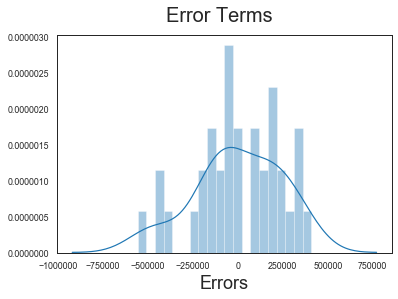

In [225]:
# Plot the histogram of the error terms
fig = plt.figure()
sns.distplot((y_train['gmv'] - y_train_gmv), bins = 20)
fig.suptitle('Error Terms', fontsize = 20)                  # Plot heading 
plt.xlabel('Errors', fontsize = 18)                         # X-label

As we can see, the error terms are following a normal distribution with mean at 0

**Making the Predictions**

In [226]:
# Splitting the data into predictor and dependent variables
y_test = camdf_test[['gmv']]
X_test = camdf_test.drop('gmv', axis=1)

# Scaling the test variables
X_test[ls]=scaler.transform(X_test[ls])

In [227]:
# Now let's use our model to make predictions.

# Creating X_test_new dataframe by dropping variables from X_test
X_test_new = X_test[X_train_rfe.columns[1:]]

# Adding a constant variable 
X_test_new = sm.add_constant(X_test_new)

In [228]:
# Making predictions
y_pred = lr_3.predict(X_test_new)

In [229]:
list(y_pred.head())

[-75924.37638456842,
 6039523.071347383,
 4734272.759641222,
 8715693.958789475,
 5740004.159362264]

**Evaluating the Model**

Text(0, 0.5, 'y_pred')

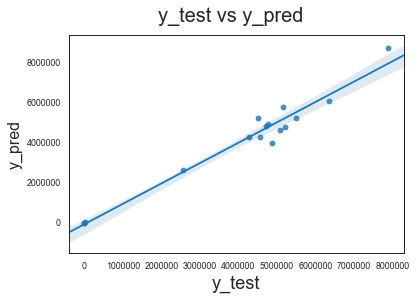

In [230]:
# plot points and fit line
# Plotting y_test and y_pred to understand the spread.
fig = plt.figure()
sns.regplot(y_test,y_pred)
fig.suptitle('y_test vs y_pred', fontsize=20)              # Plot heading 
plt.xlabel('y_test', fontsize=18)                          # X-label
plt.ylabel('y_pred', fontsize=16)                          # Y-label

Based on the above data, we can see that the model predictions seem to be pretty good

In [231]:
# Evaluation metrics
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from statistics import stdev
#Returns the mean squared error; we'll take a square root
print('RMSE:', np.sqrt(mean_squared_error(y_test, y_pred)))
print('R-Squared:', round(r2_score(y_test, y_pred),2))

# Since RMSE is relative to the scale of our y-variable, let's normalize the RMSE by dividing it with the standard deviation
print('Normalized RMSE:', round(np.sqrt(mean_squared_error(y_test, y_pred))/stdev(y_train['gmv']),2))


RMSE: 440273.60656923807
R-Squared: 0.96
Normalized RMSE: 0.22


**Plotting the most important features for the Additive Model of the Camera Accessory Dataset**

In [232]:
# Getting the coefficients from the model
# The lr_3.summary() is a set of tables, which we can export as html and then use Pandas to convert to a dataframe
df = pd.read_html(lr_3.summary().tables[1].as_html(),header=0,index_col=0)[0]
features = df.reset_index()[['index', 'coef']].sort_values('coef', ascending=False)
features = features.loc[features['index']!='const',:]

Text(0.5, 0, 'Coefficient')

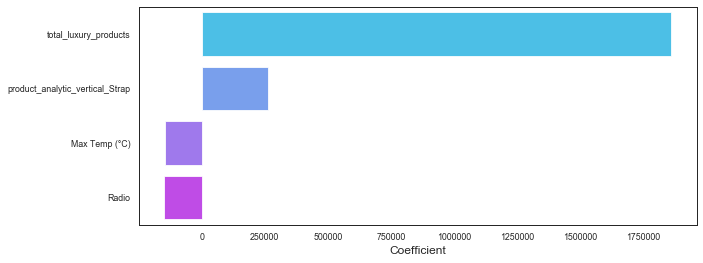

In [233]:
plt.figure(figsize=(10,4))
sns.barplot(y = features['index'], x = features['coef'], orient='h', palette='cool')
plt.ylabel('')
plt.xlabel('Coefficient', size=12)

### 2. Multiplicative Model

The linear additive model created above assumes that all the predictor variables contribute linearly to the revenue variable and all the KPI;s affect the revenue additively.

However, this may not be entirely true - hence we go ahead for a multiplicative model. The equation that the multiplicative model follows is: <br><br>
ln(Y) = α + β1ln(At) + β2ln(Pt) + β3ln(Dt) + β4ln(Qt) + β5ln(Tt) + ϵ'<br><br>
Where:<br> A - KPI's related to advertisement<br>
P - KPI's related to pricing<br>
D - KPI's related to promotion/discounts<br>
Q - KPI's related to product assortment/quality<br>
T - KPI's related to industry trends, seasonality etc.

In [234]:
camaccess_weekly_mul = camaccess_weekly.copy()

In [235]:
# Setting week number as index
camaccess_weekly_mul = camaccess_weekly_mul.set_index('Week')

In [236]:
# Applying log (ln) transform to each of the variables
# We'll exclude the binary categorical variables in this case as a log transform on those would result in loss of variance
# This is because ln(1) = 0, and ln(0)= inf

# Identifying all the non-binary variables
ls = []

for i in range(len(camaccess_weekly_mul.columns)):
    if camaccess_weekly_mul[camaccess_weekly_mul.columns[i]].nunique()>=3:
        ls.append(camaccess_weekly_mul.columns[i])

camaccess_weekly_mul[ls] = camaccess_weekly_mul[ls].applymap(lambda x:np.log(x))

# After applying log transformation to values, all the 0 values become infinity. Converting these back to 0
camaccess_weekly_mul = camaccess_weekly_mul.replace([np.inf, -np.inf], 0)
camaccess_weekly_mul = camaccess_weekly_mul.replace(np.nan, 0)

In [237]:
camaccess_weekly_mul.head()

,gmv,mean_discount%,mean_sla,mean_product_procurement_sla,total_paydays,total_saledays,total_cod_payments,total_luxury_products,total_orders,total_customers,...,Stock Index_MA_5,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
Week,,,,,,,,,,,,,,,,,,,,,
27,9.771098,3.943760,0.869038,1.045969,0.0000,0.000000,0.000000,0.000000,3.258097,3.258097,...,0.000000,3.238678,2.580217,2.963209,-2.302585,0.378436,0.000000,0.0,0.000000,0.0
28,15.144590,3.812075,1.926508,1.013686,0.0000,0.000000,7.520776,5.752573,7.916443,7.809135,...,0.000000,3.212187,2.730029,3.000720,-1.261131,0.868500,1.485385,0.0,1.485385,0.0
29,15.293664,3.817881,1.844261,1.024699,6.2106,6.749931,7.592366,5.863631,8.004032,7.903227,...,0.000000,3.358638,2.866951,3.143434,0.000000,1.645448,0.336472,0.0,0.336472,0.0
30,15.251605,3.799114,1.854416,1.044422,0.0000,0.000000,7.608871,5.814131,7.996317,7.901377,...,0.000000,3.392829,2.809403,3.138100,0.000000,1.621366,-0.105361,0.0,-0.105361,0.0
31,14.839608,3.779946,1.847643,1.030798,0.0000,0.000000,7.230563,5.424950,7.581210,7.495542,...,7.073185,3.452630,2.862201,3.201391,0.000000,1.882006,1.533277,0.0,1.533277,0.0


Now that we've performed the log transform for each of the variables, we can go ahead and perform a linear regression on the transformed variables which is effectively performing a multiplicative model on the actual variables

**Splitting the data into test and train**

In [238]:
from sklearn.model_selection import train_test_split

# We specify this so that the train and test data set always have the same rows, respectively
np.random.seed(1)
camdfmul_train, camdfmul_test = train_test_split(camaccess_weekly_mul, train_size = 0.7, test_size = 0.3, random_state = 100)

In [239]:
print(camdfmul_train.shape)
print(camdfmul_test.shape)

(36, 90)
(16, 90)


**Scaling the features** - Using Standard Scaling as explained in the previous model

In [240]:
# Splitting the data into predictor and dependent variables
y_train = camdfmul_train[['gmv']]
X_train = camdfmul_train.drop('gmv', axis=1)

# Identifying all the non-binary variables
ls = []

for i in range(len(X_train.columns)):
    if X_train[X_train.columns[i]].nunique()>=3:
        ls.append(X_train.columns[i])

# Applying Standard Scaling to these features
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train[ls]=scaler.fit_transform(X_train[ls])

X_train.describe()

,mean_discount%,mean_sla,mean_product_procurement_sla,total_paydays,total_saledays,total_cod_payments,total_luxury_products,total_orders,total_customers,total_quantity,...,Stock Index_MA_5,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
count,3.600000e+01,3.600000e+01,3.600000e+01,3.600000e+01,3.600000e+01,3.600000e+01,3.600000e+01,3.600000e+01,3.600000e+01,3.600000e+01,...,3.600000e+01,3.600000e+01,3.600000e+01,3.600000e+01,3.600000e+01,3.600000e+01,3.600000e+01,3.600000e+01,3.600000e+01,3.600000e+01
mean,-4.675273e-15,-1.594404e-15,-1.245917e-15,-2.775558e-17,1.171902e-16,2.262850e-16,5.894205e-16,-8.056827e-16,6.834810e-16,1.030426e-15,...,2.312965e-16,8.018277e-16,-4.317534e-17,-8.635068e-17,1.171902e-16,1.233581e-17,1.233581e-17,-7.247289e-17,-2.467162e-17,1.079383e-17
std,1.014185e+00,1.014185e+00,1.014185e+00,1.014185e+00,1.014185e+00,1.014185e+00,1.014185e+00,1.014185e+00,1.014185e+00,1.014185e+00,...,1.014185e+00,1.014185e+00,1.014185e+00,1.014185e+00,1.014185e+00,1.014185e+00,1.014185e+00,1.014185e+00,1.014185e+00,1.014185e+00
min,-1.471973e+00,-3.297214e+00,-4.744394e+00,-9.445549e-01,-5.302025e-01,-4.893957e+00,-5.635248e+00,-5.719007e+00,-5.711949e+00,-5.725668e+00,...,-3.315582e+00,-3.552536e+00,-1.562744e+00,-2.239006e+00,-2.081934e+00,-3.412468e+00,-2.342109e+00,-3.059776e+00,-2.365746e+00,-2.464118e-01
25%,-9.554648e-01,-5.269887e-01,-3.490527e-01,-9.445549e-01,-5.302025e-01,8.441082e-02,8.093177e-03,-4.731760e-02,-5.483904e-02,-4.550847e-02,...,2.712982e-01,-2.989046e-01,-9.164190e-01,-2.260077e-01,-1.063446e+00,-4.534320e-01,-5.496827e-01,-1.199407e-01,-5.489605e-01,-2.464118e-01
50%,-1.410255e-01,1.538545e-01,1.985458e-01,-9.445549e-01,-5.302025e-01,2.515003e-01,1.085083e-01,1.764266e-01,1.898873e-01,1.850648e-01,...,3.076255e-01,3.023824e-01,2.884820e-01,3.025997e-01,2.833100e-01,-4.534320e-01,-2.283113e-01,-1.199407e-01,-5.891135e-02,-2.464118e-01
75%,9.617466e-01,5.302802e-01,5.908169e-01,1.035623e+00,-5.302025e-01,4.304937e-01,2.163044e-01,3.186643e-01,3.248453e-01,3.069015e-01,...,3.212791e-01,6.658054e-01,9.236806e-01,7.693859e-01,8.286263e-01,6.623443e-01,7.800455e-01,-1.199407e-01,8.342614e-01,-2.464118e-01
max,2.033715e+00,2.589195e+00,1.267436e+00,1.227453e+00,2.325132e+00,8.746979e-01,1.201126e+00,8.760256e-01,8.630854e-01,8.839809e-01,...,3.346642e-01,9.536117e-01,1.099221e+00,9.587286e-01,1.423026e+00,1.696510e+00,2.106111e+00,4.385876e+00,2.024329e+00,5.527251e+00


Let's first create a vanilla model using all the variables as it is. This will give us an idea on what the base statistics of our basic model looks like.

In [241]:
# Fitting a regression line using statsmodels.api
import statsmodels.api as sm

# Add a constant
X_train_lm = sm.add_constant(X_train)

# Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

In [242]:
# Check the summary
print(lr.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                     0.000
Date:                Sun, 22 Dec 2019   Prob (F-statistic):                nan
Time:                        15:50:16   Log-Likelihood:                 1067.2
No. Observations:                  36   AIC:                            -2062.
Df Residuals:                       0   BIC:                            -2005.
Df Model:                          35                                         
Covariance Type:            nonrobust                                         
                                                     coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------

**Making the Predictions**

In [243]:
# Splitting the data into predictor and dependent variables
y_test = camdfmul_test[['gmv']]
X_test = camdfmul_test.drop('gmv', axis=1)

# Scaling the test variables
X_test[ls]=scaler.transform(X_test[ls])

# Now let's use our model to make predictions.

# Creating X_test_new dataframe by dropping variables from X_test
X_test_new = X_test[X_train.columns[:]]

# Adding a constant variable 
X_test_new = sm.add_constant(X_test_new, has_constant='add')

# Making predictions
y_pred = lr.predict(X_test_new)
y_pred.head()

Week
33     5.868624
60    15.254800
66    15.276448
63    15.623287
61    15.061673
dtype: float64

**Evaluating the model**

Text(0, 0.5, 'y_pred')

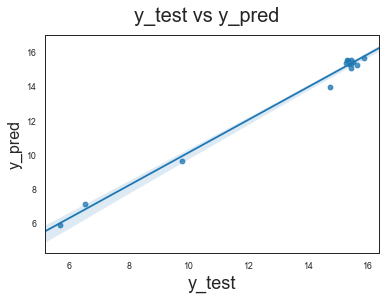

In [244]:
# plot points and fit line
# Plotting y_test and y_pred to understand the spread.
fig = plt.figure()
sns.regplot(y_test,y_pred)
fig.suptitle('y_test vs y_pred', fontsize=20)              # Plot heading 
plt.xlabel('y_test', fontsize=18)                          # X-label
plt.ylabel('y_pred', fontsize=16)                          # Y-label

In [245]:
# Evaluation metrics
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from statistics import stdev

#Returns the mean squared error; we'll take a square root
print('RMSE:', np.sqrt(mean_squared_error(y_test, y_pred)))
print('R-Squared:', round(r2_score(y_test, y_pred),2))

# Since RMSE is relative to the scale of our y-variable, let's normalize the RMSE by dividing it with the standard deviation
print('Normalized RMSE:', np.sqrt(mean_squared_error(y_test, y_pred))/stdev(y_train['gmv']))

RMSE: 0.3066527030514494
R-Squared: 0.99
Normalized RMSE: 0.20962681266668007


Plotting the most important features off the back of our vanilla model

Text(0.5, 0, 'Coefficient')

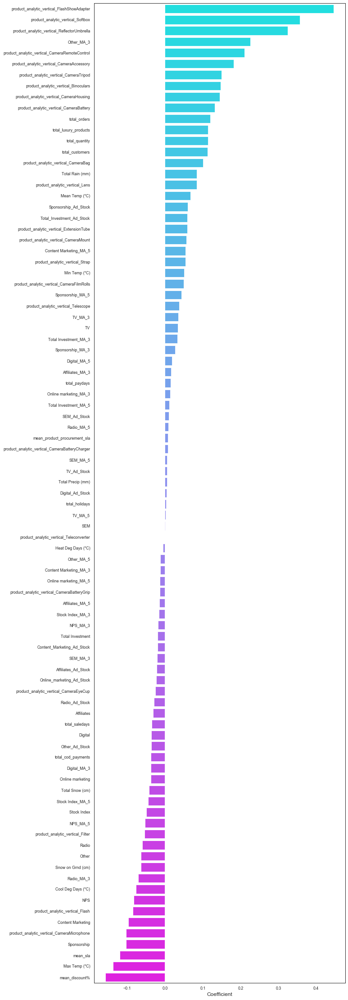

In [246]:
# Getting the coefficients from the model
# The lr_3.summary() is a set of tables, which we can export as html and then use Pandas to convert to a dataframe
df = pd.read_html(lr.summary().tables[1].as_html(),header=0,index_col=0)[0]
features = df.reset_index()[['index', 'coef']].sort_values('coef', ascending=False)
features = features.loc[features['index']!='const',:]

plt.figure(figsize=(10,40))
sns.barplot(y = features['index'], x = features['coef'], orient='h', palette='cool')
plt.ylabel('', size=12)
plt.xlabel('Coefficient', size=12)

Clearly there exists a lot of multicollinearity in our data. Let's use **VIF** to detect the correlated variables

In [247]:
# Check for the VIF values of the feature variables. 
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train.columns
vif['VIF'] = [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,mean_discount%,inf
1,mean_sla,inf
65,SEM_Ad_Stock,inf
64,SEM_MA_5,inf
63,SEM_MA_3,inf
...,...,...
26,product_analytic_vertical_Flash,inf
25,product_analytic_vertical_Filter,inf
24,product_analytic_vertical_ExtensionTube,inf
88,Snow on Grnd (cm),inf


Considering we're dealing with a really large set of data, it wouldn't be feasible of treating them 1 at a time. In that case, we'll opt for **Recursive Feature Elimination** to come down to about a smaller number of variables that explain the highest variance in the data and exhibit the least multicollinearity. Post that, we'll go into fine-tuning the model manually to end up with the final set of variables

In [248]:
# Importing RFE and LinearRegression
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression

lm = LinearRegression()
lm.fit(X_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

Let's perform RFE using 25 variables and then later fine-tune the model using other features such as the VIF, P-values and adjusted R-squared to identify the final set of variables

In [249]:
# running RFE
rfe = RFE(lm, 25)
rfe = rfe.fit(X_train, y_train)

In [250]:
zip(X_train.columns,rfe.support_,rfe.ranking_)

In [251]:
# Identify all the columns that were returned by our RFE model
col = X_train.columns[rfe.support_]
col

Index(['mean_discount%', 'mean_sla', 'total_luxury_products', 'total_orders',
       'total_customers', 'total_quantity', 'total_holidays',
       'product_analytic_vertical_Binoculars',
       'product_analytic_vertical_CameraAccessory',
       'product_analytic_vertical_CameraBag',
       'product_analytic_vertical_CameraBatteryCharger',
       'product_analytic_vertical_CameraMicrophone',
       'product_analytic_vertical_CameraRemoteControl',
       'product_analytic_vertical_CameraTripod',
       'product_analytic_vertical_ExtensionTube',
       'product_analytic_vertical_Filter',
       'product_analytic_vertical_FlashShoeAdapter',
       'product_analytic_vertical_Lens',
       'product_analytic_vertical_ReflectorUmbrella', 'Digital', 'SEM',
       'Radio', 'Stock Index', 'Cool Deg Days (°C)', 'Total Precip (mm)'],
      dtype='object')

Let's now build the model using the above features and check its performance

In [252]:
# Creating X_test dataframe with RFE selected variables
X_train_rfe = X_train[col]
X_train_rfe = sm.add_constant(X_train_rfe)

lr_3 = sm.OLS(y_train, X_train_rfe).fit()

In [253]:
# Print the summary of the model
print(lr_3.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 1.707e+04
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           3.68e-20
Time:                        15:50:34   Log-Likelihood:                 127.64
No. Observations:                  36   AIC:                            -203.3
Df Residuals:                      10   BIC:                            -162.1
Df Model:                          25                                         
Covariance Type:            nonrobust                                         
                                                     coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------

In [254]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
5,total_customers,43727.11
6,total_quantity,27528.44
4,total_orders,19358.44
18,product_analytic_vertical_Lens,422.96
16,product_analytic_vertical_Filter,333.46
10,product_analytic_vertical_CameraBag,322.38
3,total_luxury_products,276.18
11,product_analytic_vertical_CameraBatteryCharger,182.00
8,product_analytic_vertical_Binoculars,147.80
14,product_analytic_vertical_CameraTripod,119.50


We see that even after reducing the number of vaiables to 25 using RFE, the remaining variables are still able to explain a very high amount of variance in the y variable (evident by the very high R-squared value). Now that we've used RFE to drop all the insignificant variables, let's fine-tune our model by dropping those variable with high VIF or p values 1 at a time until we have a final set of variables that are able to explain a good amount of variance in the revenue variable.

In [255]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('total_customers', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 1.636e+04
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           6.81e-22
Time:                        15:50:54   Log-Likelihood:                 124.42
No. Observations:                  36   AIC:                            -198.8
Df Residuals:                      11   BIC:                            -159.2
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
                                                     coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------

In [256]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('total_quantity', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                     7577.
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           1.06e-21
Time:                        15:51:02   Log-Likelihood:                 108.24
No. Observations:                  36   AIC:                            -168.5
Df Residuals:                      12   BIC:                            -130.5
Df Model:                          23                                         
Covariance Type:            nonrobust                                         
                                                     coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------

In [257]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('product_analytic_vertical_Lens', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                     5258.
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           2.69e-22
Time:                        15:51:03   Log-Likelihood:                 99.419
No. Observations:                  36   AIC:                            -152.8
Df Residuals:                      13   BIC:                            -116.4
Df Model:                          22                                         
Covariance Type:            nonrobust                                         
                                                     coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------

In [258]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('total_orders', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.998
Method:                 Least Squares   F-statistic:                     706.6
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           9.83e-18
Time:                        15:51:03   Log-Likelihood:                 61.136
No. Observations:                  36   AIC:                            -78.27
Df Residuals:                      14   BIC:                            -43.43
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
                                                     coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------

In [259]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('product_analytic_vertical_CameraBag', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.998
Method:                 Least Squares   F-statistic:                     787.3
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           3.64e-19
Time:                        15:51:04   Log-Likelihood:                 60.961
No. Observations:                  36   AIC:                            -79.92
Df Residuals:                      15   BIC:                            -46.67
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                                                     coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------

In [260]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('total_luxury_products', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.996
Method:                 Least Squares   F-statistic:                     493.8
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           1.24e-18
Time:                        15:51:05   Log-Likelihood:                 50.495
No. Observations:                  36   AIC:                            -60.99
Df Residuals:                      16   BIC:                            -29.32
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                                                     coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------

In [261]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('product_analytic_vertical_Filter', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.994
Method:                 Least Squares   F-statistic:                     345.8
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           2.76e-18
Time:                        15:51:09   Log-Likelihood:                 42.036
No. Observations:                  36   AIC:                            -46.07
Df Residuals:                      17   BIC:                            -15.99
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                                     coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------

In [262]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('product_analytic_vertical_CameraBatteryCharger', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.995
Model:                            OLS   Adj. R-squared:                  0.990
Method:                 Least Squares   F-statistic:                     210.3
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           3.22e-17
Time:                        15:51:09   Log-Likelihood:                 31.070
No. Observations:                  36   AIC:                            -26.14
Df Residuals:                      18   BIC:                             2.363
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                                                    coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------

In [263]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('product_analytic_vertical_CameraRemoteControl', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.993
Model:                            OLS   Adj. R-squared:                  0.986
Method:                 Least Squares   F-statistic:                     158.8
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           8.41e-17
Time:                        15:51:10   Log-Likelihood:                 23.993
No. Observations:                  36   AIC:                            -13.99
Df Residuals:                      19   BIC:                             12.93
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                                                  coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------

In [264]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('product_analytic_vertical_CameraTripod', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.993
Model:                            OLS   Adj. R-squared:                  0.987
Method:                 Least Squares   F-statistic:                     178.3
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           6.11e-18
Time:                        15:51:10   Log-Likelihood:                 23.993
No. Observations:                  36   AIC:                            -15.99
Df Residuals:                      20   BIC:                             9.350
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                                                  coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------

In [265]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('SEM', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.993
Model:                            OLS   Adj. R-squared:                  0.988
Method:                 Least Squares   F-statistic:                     200.4
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           4.24e-19
Time:                        15:51:11   Log-Likelihood:                 23.974
No. Observations:                  36   AIC:                            -17.95
Df Residuals:                      21   BIC:                             5.806
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                                                  coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------

In [266]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('product_analytic_vertical_ReflectorUmbrella', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.993
Model:                            OLS   Adj. R-squared:                  0.988
Method:                 Least Squares   F-statistic:                     225.7
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           2.78e-20
Time:                        15:51:19   Log-Likelihood:                 23.943
No. Observations:                  36   AIC:                            -19.89
Df Residuals:                      22   BIC:                             2.283
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                                                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------

In [267]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('Digital', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.993
Model:                            OLS   Adj. R-squared:                  0.989
Method:                 Least Squares   F-statistic:                     255.6
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           1.69e-21
Time:                        15:51:19   Log-Likelihood:                 23.943
No. Observations:                  36   AIC:                            -21.89
Df Residuals:                      23   BIC:                            -1.300
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                                                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------

In [268]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('Cool Deg Days (°C)', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.992
Model:                            OLS   Adj. R-squared:                  0.989
Method:                 Least Squares   F-statistic:                     286.2
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           1.16e-22
Time:                        15:51:20   Log-Likelihood:                 23.646
No. Observations:                  36   AIC:                            -23.29
Df Residuals:                      24   BIC:                            -4.290
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                                                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------

In [269]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('product_analytic_vertical_CameraMicrophone', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.992
Model:                            OLS   Adj. R-squared:                  0.989
Method:                 Least Squares   F-statistic:                     318.3
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           8.97e-24
Time:                        15:51:20   Log-Likelihood:                 23.114
No. Observations:                  36   AIC:                            -24.23
Df Residuals:                      25   BIC:                            -6.810
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                                                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------

In [270]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('Total Precip (mm)', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.992
Model:                            OLS   Adj. R-squared:                  0.989
Method:                 Least Squares   F-statistic:                     363.0
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           5.34e-25
Time:                        15:51:21   Log-Likelihood:                 22.879
No. Observations:                  36   AIC:                            -25.76
Df Residuals:                      26   BIC:                            -9.922
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                                                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------

In [271]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('product_analytic_vertical_ExtensionTube', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.992
Model:                            OLS   Adj. R-squared:                  0.990
Method:                 Least Squares   F-statistic:                     417.5
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           3.07e-26
Time:                        15:51:23   Log-Likelihood:                 22.598
No. Observations:                  36   AIC:                            -27.20
Df Residuals:                      27   BIC:                            -12.94
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                                                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------

In [272]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('Radio', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.992
Model:                            OLS   Adj. R-squared:                  0.990
Method:                 Least Squares   F-statistic:                     475.7
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           2.28e-27
Time:                        15:51:27   Log-Likelihood:                 21.896
No. Observations:                  36   AIC:                            -27.79
Df Residuals:                      28   BIC:                            -15.12
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------

In [273]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('product_analytic_vertical_FlashShoeAdapter', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.991
Model:                            OLS   Adj. R-squared:                  0.989
Method:                 Least Squares   F-statistic:                     529.7
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           2.92e-28
Time:                        15:51:31   Log-Likelihood:                 20.437
No. Observations:                  36   AIC:                            -26.87
Df Residuals:                      29   BIC:                            -15.79
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

In [274]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('mean_discount%', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.990
Model:                            OLS   Adj. R-squared:                  0.988
Method:                 Least Squares   F-statistic:                     601.4
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           4.05e-29
Time:                        15:51:35   Log-Likelihood:                 18.844
No. Observations:                  36   AIC:                            -25.69
Df Residuals:                      30   BIC:                            -16.19
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

The above variables seem to be significant enough, and the corresponding R-squared value is also high hence we can infer that the variance is being explained pretty well by these variables.<br>
Looking at the F-statistic, it is pretty high and the corresponding p-value is almost 0 suggesting that it is significant.<br>
We've also taken into account the multicollinearity that may exist based on the VIF values.

**Let's go ahead and perform residual analysis to ensure that the assumptions of linear regression are being satisfied**

In [275]:
y_train_gmv = lr_3.predict(X_train_rfe)

Text(0.5, 0, 'Errors')

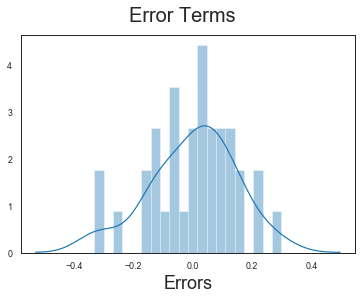

In [276]:
# Plot the histogram of the error terms
fig = plt.figure()
sns.distplot((y_train['gmv'] - y_train_gmv), bins = 20)
fig.suptitle('Error Terms', fontsize = 20)                  # Plot heading 
plt.xlabel('Errors', fontsize = 18)                         # X-label

As we can see, the error terms are following a normal distribution with mean at 0

**Making the Predictions**

In [277]:
# Splitting the data into predictor and dependent variables
y_test = camdfmul_test[['gmv']]
X_test = camdfmul_test.drop('gmv', axis=1)

# Scaling the test variables
X_test[ls]=scaler.transform(X_test[ls])

# Now let's use our model to make predictions.

# Creating X_test_new dataframe by dropping variables from X_test
X_test_new = X_test[X_train_rfe.columns[1:]]

# Adding a constant variable 
X_test_new = sm.add_constant(X_test_new)

# Making predictions
y_pred = lr_3.predict(X_test_new)
y_pred.head()

Week
33     7.328356
60    15.499457
66    15.245314
63    15.810238
61    15.637176
dtype: float64

**Evaluating the Model**

Text(0, 0.5, 'y_pred')

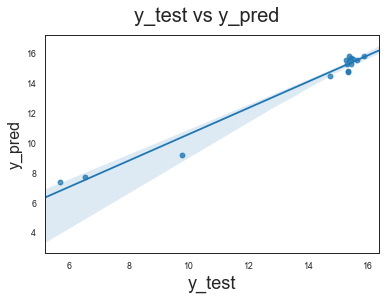

In [278]:
# plot points and fit line
# Plotting y_test and y_pred to understand the spread.
fig = plt.figure()
sns.regplot(y_test,y_pred)
fig.suptitle('y_test vs y_pred', fontsize=20)              # Plot heading 
plt.xlabel('y_test', fontsize=18)                          # X-label
plt.ylabel('y_pred', fontsize=16)                          # Y-label

Based on the above data, we can see that the model predictions seem to be pretty good

In [279]:
# Evaluation metrics
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from statistics import stdev

#Returns the mean squared error; we'll take a square root
print('RMSE:', np.sqrt(mean_squared_error(y_test, y_pred)))
print('R-Squared:', round(r2_score(y_test, y_pred),2))

# Since RMSE is relative to the scale of our y-variable, let's normalize the RMSE by dividing it with the standard deviation
print('Normalized RMSE:', np.sqrt(mean_squared_error(y_test, y_pred))/stdev(y_train['gmv']))

RMSE: 0.585852105053853
R-Squared: 0.97
Normalized RMSE: 0.40048663603627005


**Plotting the most important features for the Multiplicative Model of the Camera Accessory Dataset**

Text(0.5, 0, 'Coefficient')

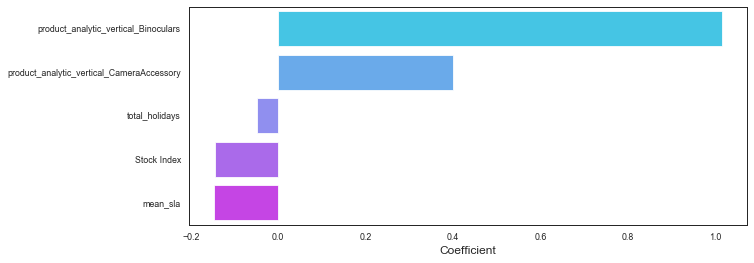

In [280]:
# Getting the coefficients from the model
# The lr_3.summary() is a set of tables, which we can export as html and then use Pandas to convert to a dataframe
df = pd.read_html(lr_3.summary().tables[1].as_html(),header=0,index_col=0)[0]
features = df.reset_index()[['index', 'coef']].sort_values('coef', ascending=False)
features = features.loc[features['index']!='const',:]

plt.figure(figsize=(10,4))
sns.barplot(y = features['index'], x = features['coef'], orient='h', palette='cool')
plt.ylabel('')
plt.xlabel('Coefficient', size=12)

### 3. Koyck Model

The additive and multiplicative models built so far all help capture the current effect of the KPI's. However, it is vital that we capture the carry-over effect too.
The Koyck model is a special type of distributed lag model taht takes into account the carry-over effect of just the dependent variable to model the final output, along with the other KPI's. Therefore, this model tells us that the revenue generated is not just dependent on the current values of the KPI's, but also on the revenue generated in previous periods. The equation that the koyck model follows is: <br><br>
Y = α + μYt-1 + β1At + β2Pt + β3Dt + β4Qt + β5Tt + ϵ<br><br>
Where:<br> A - KPI's related to advertisement<br>
P - KPI's related to pricing<br>
D - KPI's related to promotion/discounts<br>
Q - KPI's related to product assortment/quality<br>
T - KPI's related to industry trends, seasonality etc.

If X1 is the advertising effect, β1 is the current effect of advertising, carry over effect of advertising is β1 * µ/(1-µ).

Therefore the total effect of advertising  = Current effect + Carry over effect

                                            = β1 + β1 * µ/(1-µ)	

											= β1/(1-µ)

In [281]:
camaccess_weekly_koy = camaccess_weekly.copy()

**Creating a new variable which is the 1 week lag of the dependent variable (gmv)**

In [282]:
# Let's create a udf that performs the lag
# The inputs it will take is dataframe (df), column name (col), shift count (n) and create a new column in the same df
def lag_func(df,col,n):
    for i in col:
        loc_index = df.columns.get_loc(i) + 1
        df.insert(loc=loc_index,column= i+'_lag'+np.str(n),value=df[i].shift(n))
    return df

In [283]:
lag_col = ['gmv']
camaccess_weekly_koy = lag_func(camaccess_weekly_koy,lag_col,1) 

In [284]:
camaccess_weekly_koy.head()

,Week,gmv,gmv_lag1,mean_discount%,mean_sla,mean_product_procurement_sla,total_paydays,total_saledays,total_cod_payments,total_luxury_products,...,Stock Index_MA_5,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
0,27,17520.0,NaN,51.612308,2.384615,2.846154,0,0,0,1,...,0.0,25.500000,13.200000,19.360000,0.100000,1.460000,0.000000,0.0,0.000000,0.0
1,28,3777564.0,17520.0,45.244225,6.865495,2.755739,0,0,1846,315,...,0.0,24.833333,15.333333,20.100000,0.283333,2.383333,4.416667,0.0,4.416667,0.0
2,29,4384840.0,3777564.0,45.507691,6.323423,2.786257,498,854,1983,352,...,0.0,28.750000,17.583333,23.183333,0.000000,5.183333,1.400000,0.0,1.400000,0.0
3,30,4204242.0,4384840.0,44.661596,6.387965,2.841755,0,0,2016,335,...,0.0,29.750000,16.600000,23.060000,0.000000,5.060000,0.900000,0.0,0.900000,0.0
4,31,2784580.0,4204242.0,43.813689,6.344845,2.803303,0,0,1381,227,...,1179.9,31.583333,17.500000,24.566667,0.000000,6.566667,4.633333,0.0,4.633333,0.0


In [285]:
# Imputing the nan values with 0
camaccess_weekly_koy = camaccess_weekly_koy.fillna(0)

In [286]:
# Setting the week number column as index
camaccess_weekly_koy = camaccess_weekly_koy.set_index('Week')

In [287]:
camaccess_weekly_koy.head()

,gmv,gmv_lag1,mean_discount%,mean_sla,mean_product_procurement_sla,total_paydays,total_saledays,total_cod_payments,total_luxury_products,total_orders,...,Stock Index_MA_5,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
Week,,,,,,,,,,,,,,,,,,,,,
27,17520.0,0.0,51.612308,2.384615,2.846154,0,0,0,1,26,...,0.0,25.500000,13.200000,19.360000,0.100000,1.460000,0.000000,0.0,0.000000,0.0
28,3777564.0,17520.0,45.244225,6.865495,2.755739,0,0,1846,315,2742,...,0.0,24.833333,15.333333,20.100000,0.283333,2.383333,4.416667,0.0,4.416667,0.0
29,4384840.0,3777564.0,45.507691,6.323423,2.786257,498,854,1983,352,2993,...,0.0,28.750000,17.583333,23.183333,0.000000,5.183333,1.400000,0.0,1.400000,0.0
30,4204242.0,4384840.0,44.661596,6.387965,2.841755,0,0,2016,335,2970,...,0.0,29.750000,16.600000,23.060000,0.000000,5.060000,0.900000,0.0,0.900000,0.0
31,2784580.0,4204242.0,43.813689,6.344845,2.803303,0,0,1381,227,1961,...,1179.9,31.583333,17.500000,24.566667,0.000000,6.566667,4.633333,0.0,4.633333,0.0


**Splitting the data into test and train**

In [288]:
from sklearn.model_selection import train_test_split

# We specify this so that the train and test data set always have the same rows, respectively
np.random.seed(1)
camdfkoy_train, camdfkoy_test = train_test_split(camaccess_weekly_koy, train_size = 0.7, test_size = 0.3, random_state = 100)

In [289]:
print(camdfkoy_train.shape)
print(camdfkoy_test.shape)

(36, 91)
(16, 91)


**Scaling the features** - Using Standard Scaling as explained in the previous model

In [290]:
# Splitting the data into predictor and dependent variables
y_train = camdfkoy_train[['gmv']]
X_train = camdfkoy_train.drop('gmv', axis=1)

# Identifying all the non-binary variables
ls = []

for i in range(len(X_train.columns)):
    if X_train[X_train.columns[i]].nunique()>=3:
        ls.append(X_train.columns[i])

# Applying Standard Scaling to these features
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train[ls]=scaler.fit_transform(X_train[ls])

X_train.describe()

,gmv_lag1,mean_discount%,mean_sla,mean_product_procurement_sla,total_paydays,total_saledays,total_cod_payments,total_luxury_products,total_orders,total_customers,...,Stock Index_MA_5,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
count,3.600000e+01,3.600000e+01,3.600000e+01,3.600000e+01,3.600000e+01,3.600000e+01,3.600000e+01,3.600000e+01,3.600000e+01,3.600000e+01,...,3.600000e+01,3.600000e+01,3.600000e+01,3.600000e+01,3.600000e+01,3.600000e+01,3.600000e+01,3.600000e+01,3.600000e+01,3.600000e+01
mean,1.480297e-16,6.537980e-16,5.150201e-16,4.564250e-16,2.775558e-17,-1.233581e-17,-5.551115e-17,7.709882e-18,-2.775558e-17,3.700743e-17,...,-3.546546e-17,3.824102e-16,-2.467162e-17,1.665335e-16,4.317534e-17,-9.868649e-17,-8.635068e-17,3.083953e-18,-7.401487e-17,4.471732e-17
std,1.014185e+00,1.014185e+00,1.014185e+00,1.014185e+00,1.014185e+00,1.014185e+00,1.014185e+00,1.014185e+00,1.014185e+00,1.014185e+00,...,1.014185e+00,1.014185e+00,1.014185e+00,1.014185e+00,1.014185e+00,1.014185e+00,1.014185e+00,1.014185e+00,1.014185e+00,1.014185e+00
min,-2.127436e+00,-1.404875e+00,-2.982548e+00,-4.246219e+00,-8.888937e-01,-3.789592e-01,-1.977660e+00,-2.321261e+00,-2.398958e+00,-2.419437e+00,...,-3.267515e+00,-1.958322e+00,-2.053433e+00,-2.034240e+00,-1.013084e+00,-7.076418e-01,-8.286626e-01,-2.670378e-01,-8.636702e-01,-2.255164e-01
25%,-2.838974e-01,-9.448384e-01,-5.607520e-01,-4.526921e-01,-8.888937e-01,-3.789592e-01,-4.845534e-01,-3.866170e-01,-6.285638e-01,-6.487062e-01,...,8.933530e-02,-7.439921e-01,-6.668666e-01,-6.546484e-01,-9.536184e-01,-7.076418e-01,-7.026389e-01,-2.670378e-01,-7.393572e-01,-2.255164e-01
50%,-3.764250e-02,-1.786620e-01,1.182388e-01,1.701875e-01,-8.888937e-01,-3.789592e-01,-4.297791e-02,-1.792780e-01,-3.370664e-02,6.492029e-03,...,3.358342e-01,5.677151e-02,2.191954e-02,-2.149766e-02,-2.041036e-01,-7.076418e-01,-3.890451e-01,-2.670378e-01,-3.224750e-01,-2.255164e-01
75%,1.919523e-01,9.437325e-01,5.087786e-01,6.417000e-01,8.213096e-01,-3.787947e-01,5.723876e-01,6.859333e-02,4.433942e-01,4.657474e-01,...,4.331142e-01,7.918457e-01,9.829188e-01,9.056978e-01,5.810266e-01,5.074352e-01,3.688553e-01,-2.670378e-01,4.685026e-01,-2.255164e-01
max,3.552211e+00,2.136603e+00,2.859033e+00,1.507245e+00,2.270724e+00,4.899092e+00,3.091329e+00,4.182634e+00,3.445455e+00,3.343841e+00,...,5.310080e-01,1.561152e+00,1.391220e+00,1.424031e+00,2.304243e+00,2.289168e+00,3.673020e+00,4.739921e+00,3.576906e+00,5.731320e+00


**Building the koyck linear model**

In [291]:
# Fitting a regression line using statsmodels.api
import statsmodels.api as sm

# Add a constant
X_train_lm = sm.add_constant(X_train)

# Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

# Check the summary
print(lr.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                     0.000
Date:                Sun, 22 Dec 2019   Prob (F-statistic):                nan
Time:                        15:52:05   Log-Likelihood:                 595.39
No. Observations:                  36   AIC:                            -1119.
Df Residuals:                       0   BIC:                            -1062.
Df Model:                          35                                         
Covariance Type:            nonrobust                                         
                                                     coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------

**Making the predictions**

In [292]:
# Splitting the data into predictor and dependent variables
y_test = camdfkoy_test[['gmv']]
X_test = camdfkoy_test.drop('gmv', axis=1)

# Scaling the test variables
X_test[ls]=scaler.transform(X_test[ls])

# Now let's use our model to make predictions.

# Creating X_test_new dataframe by dropping variables from X_test
X_test_new = X_test[X_train.columns[:]]

# Adding a constant variable 
X_test_new = sm.add_constant(X_test_new)

# Making predictions
y_pred = lr.predict(X_test_new)
y_pred.head()

Week
33   -7.960526e+05
60    6.153011e+06
66    4.242732e+06
63    6.643378e+06
61    5.444775e+06
dtype: float64

**Evaluating the model**

Text(0, 0.5, 'y_pred')

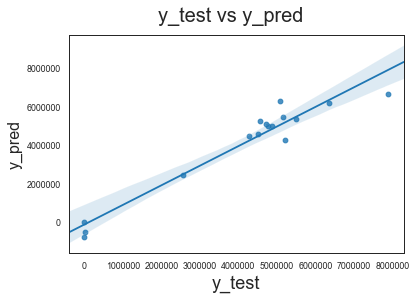

In [293]:
# plot points and fit line
# Plotting y_test and y_pred to understand the spread.
fig = plt.figure()
sns.regplot(y_test,y_pred)
fig.suptitle('y_test vs y_pred', fontsize=20)              # Plot heading 
plt.xlabel('y_test', fontsize=18)                          # X-label
plt.ylabel('y_pred', fontsize=16)                          # Y-label

In [294]:
# Evaluation metrics
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from statistics import stdev

#Returns the mean squared error; we'll take a square root
print('RMSE:', np.sqrt(mean_squared_error(y_test, y_pred)))
print('R-Squared:', round(r2_score(y_test, y_pred),2))

# Since RMSE is relative to the scale of our y-variable, let's normalize the RMSE by dividing it with the standard deviation
print('Normalized RMSE:', np.sqrt(mean_squared_error(y_test, y_pred))/stdev(y_train['gmv']))

RMSE: 593332.0427083937
R-Squared: 0.93
Normalized RMSE: 0.29469813770897635


In [295]:
# Getting the coefficients from the model
# The lr_3.summary() is a set of tables, which we can export as html and then use Pandas to convert to a dataframe
df = pd.read_html(lr.summary().tables[1].as_html(),header=0,index_col=0)[0]
features = df.reset_index()[['index', 'coef']].sort_values('coef', ascending=False)
features = features.loc[features['index']!='const',:]
features

,index,coef
8,total_luxury_products,386400.0
30,product_analytic_vertical_Lens,295300.0
6,total_saledays,214900.0
13,product_analytic_vertical_Binoculars,193800.0
20,product_analytic_vertical_CameraFilmRolls,174500.0
...,...,...
76,NPS,-111700.0
1,gmv_lag1,-116100.0
40,TV,-141400.0
79,Stock Index,-147500.0


**Determining the TOTAL EFFECT of the kpi's from Koyck model**

As mentioned earlier, the total effect of advertising under koyck model = current effect + carry-over effect
= β1 + β1 * µ/(1-µ)	
= β1/(1-µ)

where µ = coefficient of lag variable

In [296]:
# The coefficient of lag variable
lag_coef = features.loc[features['index']=='gmv_lag1', 'coef']
lag_coef

1   -116100.0
Name: coef, dtype: float64

In [297]:
features['Total Effect'] = features['coef']/(1 - (-116100))
features.columns = ['KPI', 'Coefficient', 'Total Effect']

In [298]:
features

,KPI,Coefficient,Total Effect
8,total_luxury_products,386400.0,3.328137
30,product_analytic_vertical_Lens,295300.0,2.543475
6,total_saledays,214900.0,1.850975
13,product_analytic_vertical_Binoculars,193800.0,1.669236
20,product_analytic_vertical_CameraFilmRolls,174500.0,1.503002
...,...,...,...
76,NPS,-111700.0,-0.962093
1,gmv_lag1,-116100.0,-0.999991
40,TV,-141400.0,-1.217905
79,Stock Index,-147500.0,-1.270446


Plotting the most important features off the back of our koyck model

Text(0.5, 0, 'Coefficient')

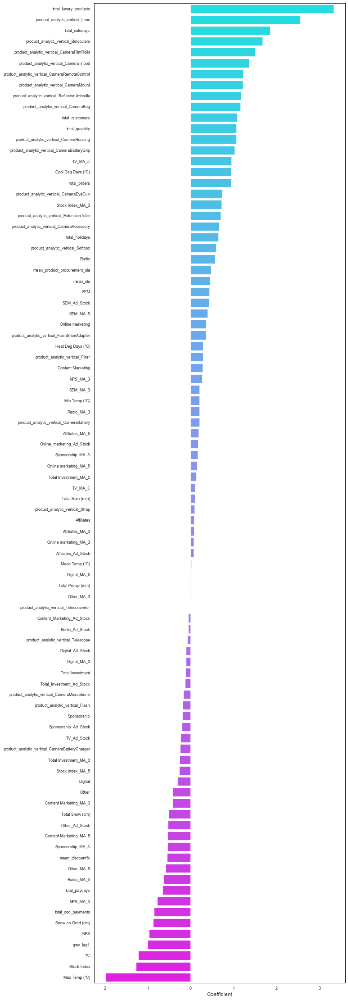

In [299]:
plt.figure(figsize=(10,40))
sns.barplot(y = features['KPI'], x = features['Total Effect'], orient='h', palette='cool')
plt.ylabel('', size=12)
plt.xlabel('Coefficient', size=12)

Clearly there exists a lot of multicollinearity in our data. Let's use **VIF** to detect the correlated variables

In [300]:
# Check for the VIF values of the feature variables. 
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train.columns
vif['VIF'] = [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,gmv_lag1,inf
46,Digital_Ad_Stock,inf
66,SEM_Ad_Stock,inf
65,SEM_MA_5,inf
64,SEM_MA_3,inf
...,...,...
27,product_analytic_vertical_Flash,inf
26,product_analytic_vertical_Filter,inf
25,product_analytic_vertical_ExtensionTube,inf
89,Snow on Grnd (cm),inf


Considering we're dealing with a really large set of data, it wouldn't be feasible of treating them 1 at a time. In that case, we'll opt for **Recursive Feature Elimination** to come down to about a smaller number of variables that explain the highest variance in the data and exhibit the least multicollinearity. Post that, we'll go into fine-tuning the model manually to end up with the final set of variables

In [301]:
# Importing RFE and LinearRegression
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression

lm = LinearRegression()
lm.fit(X_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

Let's perform RFE using 20 variables and then later fine-tune the model using other features such as the VIF, P-values and adjusted R-squared to identify the final set of variables

In [302]:
# running RFE
rfe = RFE(lm, 20)
rfe = rfe.fit(X_train, y_train)

zip(X_train.columns,rfe.support_,rfe.ranking_)

In [303]:
# Identify all the columns that were returned by our RFE model
col = X_train.columns[rfe.support_]
col

Index(['gmv_lag1', 'total_paydays', 'total_luxury_products', 'total_customers',
       'total_quantity', 'product_analytic_vertical_Binoculars',
       'product_analytic_vertical_CameraBag',
       'product_analytic_vertical_CameraBatteryGrip',
       'product_analytic_vertical_CameraHousing',
       'product_analytic_vertical_CameraMount',
       'product_analytic_vertical_CameraRemoteControl',
       'product_analytic_vertical_FlashShoeAdapter',
       'product_analytic_vertical_Lens', 'TV_MA_5', 'Radio_MA_5', 'Other',
       'Other_Ad_Stock', 'Stock Index', 'Stock Index_MA_3', 'Max Temp (°C)'],
      dtype='object')

Let's now build the model using the above features and check its performance

In [304]:
# Creating X_test dataframe with RFE selected variables
X_train_rfe = X_train[col]
X_train_rfe = sm.add_constant(X_train_rfe, has_constant='add')

lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.998
Method:                 Least Squares   F-statistic:                     745.5
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           5.48e-19
Time:                        15:52:38   Log-Likelihood:                -448.88
No. Observations:                  36   AIC:                             939.8
Df Residuals:                      15   BIC:                             973.0
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                                                    coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------

In [305]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
5,total_quantity,2216.87
4,total_customers,1914.80
17,Other_Ad_Stock,225.45
16,Other,93.93
3,total_luxury_products,71.11
13,product_analytic_vertical_Lens,55.36
15,Radio_MA_5,48.59
7,product_analytic_vertical_CameraBag,35.45
11,product_analytic_vertical_CameraRemoteControl,13.12
6,product_analytic_vertical_Binoculars,13.00


We see that even after reducing the number of vaiables to 20 using RFE, the remaining variables are still able to explain a very high amount of variance in the y variable (evident by the very high R-squared value). Now that we've used RFE to drop all the insignificant variables, let's fine-tune our model by dropping those variable with high VIF or p values 1 at a time until we have a final set of variables that are able to explain a good amount of variance in the revenue variable.

In [306]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('total_quantity', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.998
Method:                 Least Squares   F-statistic:                     781.9
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           3.17e-20
Time:                        15:52:46   Log-Likelihood:                -450.10
No. Observations:                  36   AIC:                             940.2
Df Residuals:                      16   BIC:                             971.9
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                                                    coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------

In [307]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('Other_Ad_Stock', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.998
Method:                 Least Squares   F-statistic:                     777.2
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           2.90e-21
Time:                        15:52:48   Log-Likelihood:                -452.27
No. Observations:                  36   AIC:                             942.5
Df Residuals:                      17   BIC:                             972.6
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                                    coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------

In [308]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('total_luxury_products', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.994
Model:                            OLS   Adj. R-squared:                  0.989
Method:                 Least Squares   F-statistic:                     186.0
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           9.66e-17
Time:                        15:52:51   Log-Likelihood:                -479.99
No. Observations:                  36   AIC:                             996.0
Df Residuals:                      18   BIC:                             1024.
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                                                    coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------

In [309]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('product_analytic_vertical_CameraBag', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.992
Model:                            OLS   Adj. R-squared:                  0.985
Method:                 Least Squares   F-statistic:                     142.7
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           2.29e-16
Time:                        15:52:51   Log-Likelihood:                -486.77
No. Observations:                  36   AIC:                             1008.
Df Residuals:                      19   BIC:                             1034.
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                                                    coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------

In [310]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('total_customers', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.988
Model:                            OLS   Adj. R-squared:                  0.979
Method:                 Least Squares   F-statistic:                     108.4
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           8.22e-16
Time:                        15:52:51   Log-Likelihood:                -493.74
No. Observations:                  36   AIC:                             1019.
Df Residuals:                      20   BIC:                             1045.
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                                                    coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------

In [311]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('Radio_MA_5', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.988
Model:                            OLS   Adj. R-squared:                  0.980
Method:                 Least Squares   F-statistic:                     121.9
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           7.23e-17
Time:                        15:52:52   Log-Likelihood:                -493.74
No. Observations:                  36   AIC:                             1017.
Df Residuals:                      21   BIC:                             1041.
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                                                    coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------

In [312]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('TV_MA_5', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.987
Model:                            OLS   Adj. R-squared:                  0.980
Method:                 Least Squares   F-statistic:                     132.9
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           8.67e-18
Time:                        15:52:52   Log-Likelihood:                -494.35
No. Observations:                  36   AIC:                             1017.
Df Residuals:                      22   BIC:                             1039.
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                                                    coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------

In [313]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('Other', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.986
Model:                            OLS   Adj. R-squared:                  0.978
Method:                 Least Squares   F-statistic:                     132.8
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           2.82e-18
Time:                        15:53:03   Log-Likelihood:                -496.58
No. Observations:                  36   AIC:                             1019.
Df Residuals:                      23   BIC:                             1040.
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                                                    coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------

In [314]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('product_analytic_vertical_FlashShoeAdapter', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.986
Model:                            OLS   Adj. R-squared:                  0.979
Method:                 Least Squares   F-statistic:                     150.7
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           2.31e-19
Time:                        15:53:08   Log-Likelihood:                -496.64
No. Observations:                  36   AIC:                             1017.
Df Residuals:                      24   BIC:                             1036.
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                                                    coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------

The above variables seem to be significant enough, and the corresponding R-squared value is also high hence we can infer that the variance is being explained pretty well by these variables.<br>
Looking at the F-statistic, it is pretty high and the corresponding p-value is almost 0 suggesting that it is significant.<br>
We've also taken into account the multicollinearity that may exist based on the VIF values.

**Let's go ahead and perform residual analysis to ensure that the assumptions of linear regression are being satisfied**

Text(0.5, 0, 'Errors')

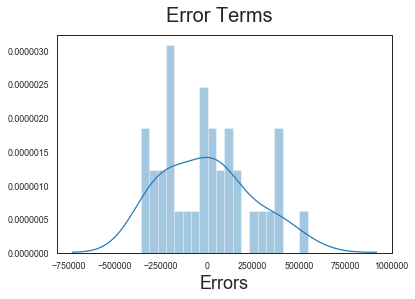

In [315]:
y_train_gmv = lr_3.predict(X_train_rfe)

# Plot the histogram of the error terms
fig = plt.figure()
sns.distplot((y_train['gmv'] - y_train_gmv), bins = 20)
fig.suptitle('Error Terms', fontsize = 20)                  # Plot heading 
plt.xlabel('Errors', fontsize = 18)                         # X-label

As we can see, the error terms are following a normal distribution with mean at 0

**Making the Predictions**

In [316]:
# Splitting the data into predictor and dependent variables
y_test = camdfkoy_test[['gmv']]
X_test = camdfkoy_test.drop('gmv', axis=1)

# Scaling the test variables
X_test[ls]=scaler.transform(X_test[ls])

# Now let's use our model to make predictions.

# Creating X_test_new dataframe by dropping variables from X_test
X_test_new = X_test[X_train_rfe.columns[1:]]

# Adding a constant variable 
X_test_new = sm.add_constant(X_test_new, has_constant='add')
# Making predictions
y_pred = lr_3.predict(X_test_new)
y_pred.head()

Week
33    1.859332e+05
60    5.183499e+06
66    4.063947e+06
63    6.385650e+06
61    5.311807e+06
dtype: float64

**Evaluating the Model**

Text(0, 0.5, 'y_pred')

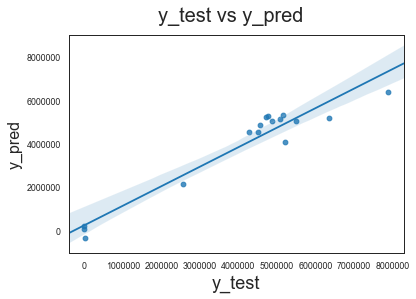

In [317]:
# plot points and fit line
# Plotting y_test and y_pred to understand the spread.
fig = plt.figure()
sns.regplot(y_test,y_pred)
fig.suptitle('y_test vs y_pred', fontsize=20)              # Plot heading 
plt.xlabel('y_test', fontsize=18)                          # X-label
plt.ylabel('y_pred', fontsize=16)                          # Y-label

Based on the above data, we can see that the model predictions seem to be pretty good

In [318]:
# Evaluation metrics
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from statistics import stdev

#Returns the mean squared error; we'll take a square root
print('RMSE:', np.sqrt(mean_squared_error(y_test, y_pred)))
print('R-Squared:', round(r2_score(y_test, y_pred),2))

# Since RMSE is relative to the scale of our y-variable, let's normalize the RMSE by dividing it with the standard deviation
print('Normalized RMSE:', round(np.sqrt(mean_squared_error(y_test, y_pred))/stdev(y_train['gmv']),2))

RMSE: 623103.7108390498
R-Squared: 0.92
Normalized RMSE: 0.31


**Plotting the most important features for the Tuned Koyck Model of the Camera Accessory Dataset**

Text(0.5, 0, 'Coefficient')

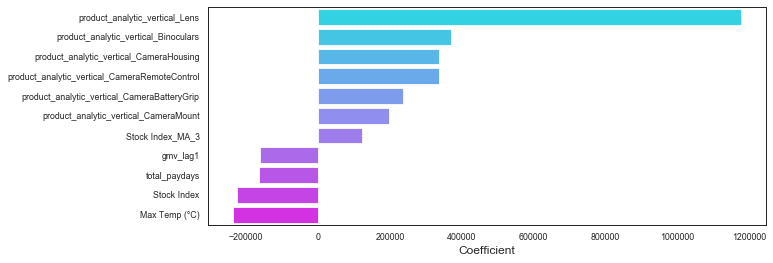

In [319]:
# Getting the coefficients from the model
# The lr_3.summary() is a set of tables, which we can export as html and then use Pandas to convert to a dataframe
df = pd.read_html(lr_3.summary().tables[1].as_html(),header=0,index_col=0)[0]
features = df.reset_index()[['index', 'coef']].sort_values('coef', ascending=False)
features = features.loc[features['index']!='const',:]

plt.figure(figsize=(10,4))
sns.barplot(y = features['index'], x = features['coef'], orient='h', palette='cool')
plt.ylabel('')
plt.xlabel('Coefficient', size=12)

### 4. Distributed Lag Model

The additive and multiplicative models built so far all help capture the current effect of the KPI's. However, it is vital that we capture the carry-over effect too.
The Koyck model that we previously built is a special type of distributed lag model that takes into account the carry-over effect of just the dependent variable to model the final output, along with the other KPI's.

In the distributed lag model, not only is the dependent variable entered in its lagged version, but the independent variables are as well. This is a more generalist model and captures the carry-over effect of all the variables. Thus as mentioned, the Koyck model is a special type of distributed lag model, which includes the lag value of only the dependent variable.

The equation of the distributed lag model is as follows: <br><br>
  __Yt__ = α+ µ1Yt-1 + µ2Yt-2 + µ3Yt-3 + ....

        + β1X1t + β1X1t-1 + β1X1t-2 + ....

        + β2X2t + β2X2t-1 + β2X2t-2 + ....

        + β3X3t + β3X3t-1 + β3X3t-2 + ....

        + β4X4t + β4X4t-1 + β4X4t-2 + ....

        + β5X5t + β5X5t-1 + β5X5t-2 + ....

        + ϵ

In [320]:
camaccess_weekly_dis = camaccess_weekly.copy()

In [321]:
# Setting the week number column as index
camaccess_weekly_dis = camaccess_weekly_dis.set_index('Week')

In order to create the ditributed lag model, we will create 3 lag variables for every variable in our dataset. This would mean we'll have a 1-week lag, 2-week lag, and 3 week-lag for every variable in our dataset.

In [322]:
# We'll be using the lag function defined earlier to create the lag columns
# The inputs it will take is dataframe (df), column name (col), shift count (n) and create a new column in the same df
def lag_func(df,col,n):
    for i in col:
        loc_index = df.columns.get_loc(i) + 1
        df.insert(loc=loc_index,column= i+'_lag'+np.str(n),value=df[i].shift(n))
    return df

In [323]:
lag_col = list(camaccess_weekly_dis.columns)

# Introducing 1-week lag
camaccess_weekly_dis = lag_func(camaccess_weekly_dis,lag_col,1)

# Introducing 2-week lag
camaccess_weekly_dis = lag_func(camaccess_weekly_dis,lag_col,2)

# Introducing 3-week lag
camaccess_weekly_dis = lag_func(camaccess_weekly_dis,lag_col,3)


In [324]:
camaccess_weekly_dis.head()

,gmv,gmv_lag3,gmv_lag2,gmv_lag1,mean_discount%,mean_discount%_lag3,mean_discount%_lag2,mean_discount%_lag1,mean_sla,mean_sla_lag3,...,Total Snow (cm)_lag2,Total Snow (cm)_lag1,Total Precip (mm),Total Precip (mm)_lag3,Total Precip (mm)_lag2,Total Precip (mm)_lag1,Snow on Grnd (cm),Snow on Grnd (cm)_lag3,Snow on Grnd (cm)_lag2,Snow on Grnd (cm)_lag1
Week,,,,,,,,,,,,,,,,,,,,,
27,17520.0,NaN,NaN,NaN,51.612308,NaN,NaN,NaN,2.384615,NaN,...,NaN,NaN,0.000000,NaN,NaN,NaN,0.0,NaN,NaN,NaN
28,3777564.0,NaN,NaN,17520.0,45.244225,NaN,NaN,51.612308,6.865495,NaN,...,NaN,0.0,4.416667,NaN,NaN,0.000000,0.0,NaN,NaN,0.0
29,4384840.0,NaN,17520.0,3777564.0,45.507691,NaN,51.612308,45.244225,6.323423,NaN,...,0.0,0.0,1.400000,NaN,0.000000,4.416667,0.0,NaN,0.0,0.0
30,4204242.0,17520.0,3777564.0,4384840.0,44.661596,51.612308,45.244225,45.507691,6.387965,2.384615,...,0.0,0.0,0.900000,0.000000,4.416667,1.400000,0.0,0.0,0.0,0.0
31,2784580.0,3777564.0,4384840.0,4204242.0,43.813689,45.244225,45.507691,44.661596,6.344845,6.865495,...,0.0,0.0,4.633333,4.416667,1.400000,0.900000,0.0,0.0,0.0,0.0


In [325]:
# Replacing all the nan values with 0
camaccess_weekly_dis = camaccess_weekly_dis.fillna(0)

In [326]:
camaccess_weekly_dis.head()

,gmv,gmv_lag3,gmv_lag2,gmv_lag1,mean_discount%,mean_discount%_lag3,mean_discount%_lag2,mean_discount%_lag1,mean_sla,mean_sla_lag3,...,Total Snow (cm)_lag2,Total Snow (cm)_lag1,Total Precip (mm),Total Precip (mm)_lag3,Total Precip (mm)_lag2,Total Precip (mm)_lag1,Snow on Grnd (cm),Snow on Grnd (cm)_lag3,Snow on Grnd (cm)_lag2,Snow on Grnd (cm)_lag1
Week,,,,,,,,,,,,,,,,,,,,,
27,17520.0,0.0,0.0,0.0,51.612308,0.000000,0.000000,0.000000,2.384615,0.000000,...,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0
28,3777564.0,0.0,0.0,17520.0,45.244225,0.000000,0.000000,51.612308,6.865495,0.000000,...,0.0,0.0,4.416667,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0
29,4384840.0,0.0,17520.0,3777564.0,45.507691,0.000000,51.612308,45.244225,6.323423,0.000000,...,0.0,0.0,1.400000,0.000000,0.000000,4.416667,0.0,0.0,0.0,0.0
30,4204242.0,17520.0,3777564.0,4384840.0,44.661596,51.612308,45.244225,45.507691,6.387965,2.384615,...,0.0,0.0,0.900000,0.000000,4.416667,1.400000,0.0,0.0,0.0,0.0
31,2784580.0,3777564.0,4384840.0,4204242.0,43.813689,45.244225,45.507691,44.661596,6.344845,6.865495,...,0.0,0.0,4.633333,4.416667,1.400000,0.900000,0.0,0.0,0.0,0.0


**Splitting the data into test and train**

In [327]:
from sklearn.model_selection import train_test_split

# We specify this so that the train and test data set always have the same rows, respectively
np.random.seed(1)
camdfdis_train, camdfdis_test = train_test_split(camaccess_weekly_dis, train_size = 0.7, test_size = 0.3, random_state = 100)

In [328]:
print(camdfdis_train.shape)
print(camdfdis_test.shape)

(36, 360)
(16, 360)


**Scaling the features** - Using Standard Scaling as explained in the previous model

In [329]:
# Splitting the data into predictor and dependent variables
y_train = camdfdis_train[['gmv']]
X_train = camdfdis_train.drop('gmv', axis=1)

# Identifying all the non-binary variables
ls = []

for i in range(len(X_train.columns)):
    if X_train[X_train.columns[i]].nunique()>=3:
        ls.append(X_train.columns[i])

# Applying Standard Scaling to these features
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train[ls]=scaler.fit_transform(X_train[ls])

X_train.describe()

,gmv_lag3,gmv_lag2,gmv_lag1,mean_discount%,mean_discount%_lag3,mean_discount%_lag2,mean_discount%_lag1,mean_sla,mean_sla_lag3,mean_sla_lag2,...,Total Snow (cm)_lag2,Total Snow (cm)_lag1,Total Precip (mm),Total Precip (mm)_lag3,Total Precip (mm)_lag2,Total Precip (mm)_lag1,Snow on Grnd (cm),Snow on Grnd (cm)_lag3,Snow on Grnd (cm)_lag2,Snow on Grnd (cm)_lag1
count,3.600000e+01,3.600000e+01,3.600000e+01,3.600000e+01,3.600000e+01,3.600000e+01,3.600000e+01,3.600000e+01,3.600000e+01,3.600000e+01,...,3.600000e+01,3.600000e+01,3.600000e+01,3.600000e+01,3.600000e+01,3.600000e+01,3.600000e+01,3.600000e+01,3.600000e+01,3.600000e+01
mean,1.480297e-16,1.233581e-16,1.480297e-16,6.537980e-16,3.346089e-16,-2.467162e-17,4.009139e-16,5.150201e-16,-2.605940e-16,-1.084009e-15,...,-9.251859e-18,4.625929e-17,-7.401487e-17,5.859510e-17,-1.189249e-16,8.018277e-17,4.471732e-17,2.158767e-17,1.696174e-17,4.163336e-17
std,1.014185e+00,1.014185e+00,1.014185e+00,1.014185e+00,1.014185e+00,1.014185e+00,1.014185e+00,1.014185e+00,1.014185e+00,1.014185e+00,...,1.014185e+00,1.014185e+00,1.014185e+00,1.014185e+00,1.014185e+00,1.014185e+00,1.014185e+00,1.014185e+00,1.014185e+00,1.014185e+00
min,-1.683416e+00,-1.814607e+00,-2.127436e+00,-1.404875e+00,-3.551272e+00,-4.580056e+00,-1.003461e+00,-2.982548e+00,-3.594238e+00,-4.636996e+00,...,-3.454293e-01,-2.873296e-01,-8.636702e-01,-8.242596e-01,-8.077464e-01,-7.396543e-01,-2.255164e-01,-2.943895e-01,-2.460901e-01,-2.110767e-01
25%,-1.295249e-01,-2.027606e-01,-2.838974e-01,-9.448384e-01,-1.521776e-01,-2.621600e-01,-6.910101e-01,-5.607520e-01,5.939740e-02,-4.997233e-02,...,-3.454293e-01,-2.873296e-01,-7.393572e-01,-7.668668e-01,-8.077464e-01,-7.081498e-01,-2.255164e-01,-2.943895e-01,-2.460901e-01,-2.110767e-01
50%,1.429532e-01,8.340620e-02,-3.764250e-02,-1.786620e-01,7.495117e-02,-1.930335e-02,-1.529542e-01,1.182388e-01,2.591159e-01,1.887152e-01,...,-3.454293e-01,-2.873296e-01,-3.224750e-01,-1.874735e-01,-3.415190e-01,-4.512129e-01,-2.255164e-01,-2.943895e-01,-2.460901e-01,-2.110767e-01
75%,3.770338e-01,3.453139e-01,1.919523e-01,9.437325e-01,3.920704e-01,3.664941e-01,3.709390e-01,5.087786e-01,4.336964e-01,3.940067e-01,...,-3.454293e-01,-2.873296e-01,4.685026e-01,3.486475e-01,4.512170e-01,2.288847e-01,-2.255164e-01,-2.943895e-01,-2.460901e-01,-2.110767e-01
max,3.528119e+00,3.387070e+00,3.552211e+00,2.136603e+00,2.712103e+00,3.274108e+00,4.827505e+00,2.859033e+00,1.197584e+00,1.373910e+00,...,3.704579e+00,4.541597e+00,3.576906e+00,3.466531e+00,3.017709e+00,3.656977e+00,5.731320e+00,5.444277e+00,5.691997e+00,5.677962e+00


**Building the distributed lag model**

In [330]:
# Fitting a regression line using statsmodels.api
import statsmodels.api as sm

# Add a constant
X_train_lm = sm.add_constant(X_train)

# Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

# Check the summary
print(lr.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                     0.000
Date:                Sun, 22 Dec 2019   Prob (F-statistic):                nan
Time:                        15:54:28   Log-Likelihood:                 613.17
No. Observations:                  36   AIC:                            -1154.
Df Residuals:                       0   BIC:                            -1097.
Df Model:                          35                                         
Covariance Type:            nonrobust                                         
                                                          coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------

**Making the Predictions**

In [331]:
# Splitting the data into predictor and dependent variables
y_test = camdfdis_test[['gmv']]
X_test = camdfdis_test.drop('gmv', axis=1)

# Scaling the test variables
X_test[ls]=scaler.transform(X_test[ls])

# Now let's use our model to make predictions.

# Creating X_test_new dataframe by dropping variables from X_test
X_test_new = X_test[X_train.columns[:]]

# Adding a constant variable 
X_test_new = sm.add_constant(X_test_new, has_constant='add')

# Making predictions
y_pred = lr.predict(X_test_new)
y_pred.head()

Week
33    3.382935e+05
60    6.761829e+06
66    5.090540e+06
63    6.386225e+06
61    4.940698e+06
dtype: float64

**Evaluating the model**

Text(0, 0.5, 'y_pred')

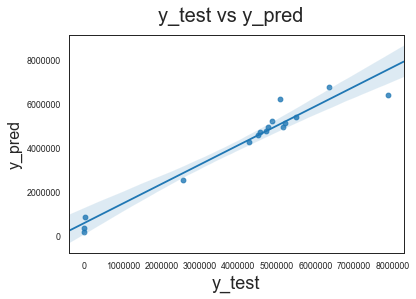

In [332]:
# plot points and fit line
# Plotting y_test and y_pred to understand the spread.
fig = plt.figure()
sns.regplot(y_test,y_pred)
fig.suptitle('y_test vs y_pred', fontsize=20)              # Plot heading 
plt.xlabel('y_test', fontsize=18)                          # X-label
plt.ylabel('y_pred', fontsize=16)                          # Y-label

In [333]:
# Evaluation metrics
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from statistics import stdev

#Returns the mean squared error; we'll take a square root
print('RMSE:', np.sqrt(mean_squared_error(y_test, y_pred)))
print('R-Squared:', round(r2_score(y_test, y_pred),2))

# Since RMSE is relative to the scale of our y-variable, let's normalize the RMSE by dividing it with the standard deviation
print('Normalized RMSE:', np.sqrt(mean_squared_error(y_test, y_pred))/stdev(y_train['gmv']))

RMSE: 544452.6818418318
R-Squared: 0.94
Normalized RMSE: 0.2704205737432286


Plotting the most important features off the back of our vanilla model

Text(0.5, 0, 'Coefficient')

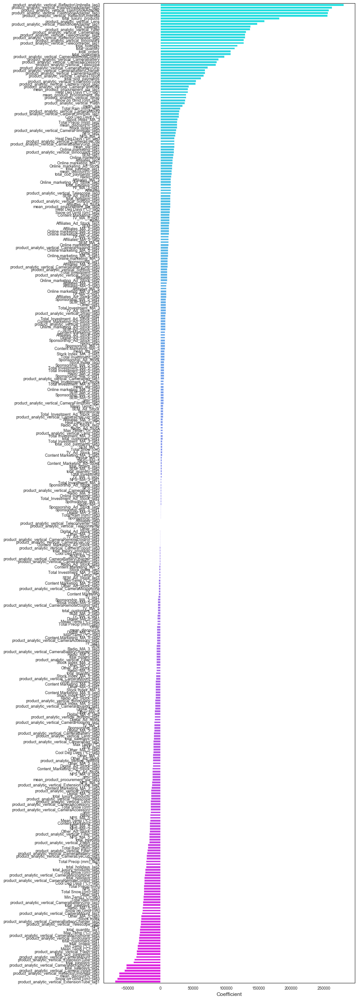

In [334]:
# Getting the coefficients from the model
# The lr_3.summary() is a set of tables, which we can export as html and then use Pandas to convert to a dataframe
df = pd.read_html(lr.summary().tables[1].as_html(),header=0,index_col=0)[0]
features = df.reset_index()[['index', 'coef']].sort_values('coef', ascending=False)
features = features.loc[features['index']!='const',:]

plt.figure(figsize=(10,40))
sns.barplot(y = features['index'], x = features['coef'], orient='h', palette='cool')
plt.ylabel('', size=12)
plt.xlabel('Coefficient', size=12)

Clearly there exists a lot of multicollinearity in our data. Let's use **VIF** to detect the correlated variables

In [335]:
# Check for the VIF values of the feature variables. 
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train.columns
vif['VIF'] = [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,gmv_lag3,inf
226,Online marketing_MA_3_lag1,inf
246,Affiliates_MA_5_lag1,inf
245,Affiliates_MA_5_lag2,inf
244,Affiliates_MA_5_lag3,inf
...,...,...
115,product_analytic_vertical_Lens,inf
114,product_analytic_vertical_FlashShoeAdapter_lag1,inf
358,Snow on Grnd (cm)_lag1,inf
131,product_analytic_vertical_Teleconverter,NaN


Considering we're dealing with a really large set of data, it wouldn't be feasible of treating them 1 at a time. In that case, we'll opt for **Recursive Feature Elimination** to come down to about a smaller number of variables that explain the highest variance in the data and exhibit the least multicollinearity. Post that, we'll go into fine-tuning the model manually to end up with the final set of variables

In [336]:
# Importing RFE and LinearRegression
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression

lm = LinearRegression()
lm.fit(X_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

Let's perform RFE using 20 variables and then later fine-tune the model using other features such as the VIF, P-values and adjusted R-squared to identify the final set of variables

In [337]:
# running RFE
rfe = RFE(lm, 20)
rfe = rfe.fit(X_train, y_train)

zip(X_train.columns,rfe.support_,rfe.ranking_)

In [338]:
# Identify all the columns that were returned by our RFE model
col = X_train.columns[rfe.support_]
col

Index(['total_saledays', 'total_cod_payments', 'total_orders',
       'total_orders_lag1', 'total_customers', 'total_quantity',
       'total_holidays_lag1', 'product_analytic_vertical_Binoculars',
       'product_analytic_vertical_CameraBag',
       'product_analytic_vertical_CameraBatteryCharger_lag2',
       'product_analytic_vertical_CameraFilmRolls',
       'product_analytic_vertical_CameraHousing',
       'product_analytic_vertical_CameraMicrophone_lag2',
       'product_analytic_vertical_CameraRemoteControl',
       'product_analytic_vertical_Lens',
       'product_analytic_vertical_ReflectorUmbrella_lag1', 'Stock Index',
       'Mean Temp (°C)_lag1', 'Cool Deg Days (°C)_lag3',
       'Total Snow (cm)_lag1'],
      dtype='object')

Let's now build the model using the above features and check its performance

In [339]:
# Creating X_test dataframe with RFE selected variables
X_train_rfe = X_train[col]
X_train_rfe = sm.add_constant(X_train_rfe)

lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.996
Method:                 Least Squares   F-statistic:                     423.3
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           3.78e-17
Time:                        15:54:56   Log-Likelihood:                -459.05
No. Observations:                  36   AIC:                             960.1
Df Residuals:                      15   BIC:                             993.4
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                                                          coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------

In [340]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
5,total_customers,5552.41
3,total_orders,4290.05
6,total_quantity,2538.33
15,product_analytic_vertical_Lens,51.27
9,product_analytic_vertical_CameraBag,38.75
2,total_cod_payments,21.33
11,product_analytic_vertical_CameraFilmRolls,18.20
8,product_analytic_vertical_Binoculars,16.34
14,product_analytic_vertical_CameraRemoteControl,13.02
13,product_analytic_vertical_CameraMicrophone_lag2,12.05


We see that even after reducing the number of vaiables to 20 using RFE, the remaining variables are still able to explain a very high amount of variance in the y variable (evident by the very high R-squared value). Now that we've used RFE to drop all the insignificant variables, let's fine-tune our model by dropping those variable with high VIF or p values 1 at a time until we have a final set of variables that are able to explain a good amount of variance in the revenue variable.

In [341]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('total_customers', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.996
Method:                 Least Squares   F-statistic:                     474.7
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           1.70e-18
Time:                        15:55:01   Log-Likelihood:                -459.07
No. Observations:                  36   AIC:                             958.1
Df Residuals:                      16   BIC:                             989.8
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                                                          coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------

In [342]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('total_quantity', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.995
Method:                 Least Squares   F-statistic:                     401.7
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           7.78e-19
Time:                        15:55:06   Log-Likelihood:                -464.13
No. Observations:                  36   AIC:                             966.3
Df Residuals:                      17   BIC:                             996.4
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                                          coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------

In [343]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('product_analytic_vertical_Lens', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.994
Method:                 Least Squares   F-statistic:                     365.7
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           2.30e-19
Time:                        15:55:10   Log-Likelihood:                -467.87
No. Observations:                  36   AIC:                             971.7
Df Residuals:                      18   BIC:                             1000.
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                                                          coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------

In [344]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('total_orders', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.986
Model:                            OLS   Adj. R-squared:                  0.974
Method:                 Least Squares   F-statistic:                     83.74
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           3.31e-14
Time:                        15:55:11   Log-Likelihood:                -496.27
No. Observations:                  36   AIC:                             1027.
Df Residuals:                      19   BIC:                             1053.
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                                                          coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------

In [345]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('product_analytic_vertical_CameraBag', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.980
Model:                            OLS   Adj. R-squared:                  0.964
Method:                 Least Squares   F-statistic:                     63.81
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           1.44e-13
Time:                        15:55:11   Log-Likelihood:                -503.13
No. Observations:                  36   AIC:                             1038.
Df Residuals:                      20   BIC:                             1064.
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                                                          coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------

In [346]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('product_analytic_vertical_CameraMicrophone_lag2', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.979
Model:                            OLS   Adj. R-squared:                  0.966
Method:                 Least Squares   F-statistic:                     71.53
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           1.71e-14
Time:                        15:55:11   Log-Likelihood:                -503.19
No. Observations:                  36   AIC:                             1036.
Df Residuals:                      21   BIC:                             1060.
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                                                          coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------

In [347]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('Cool Deg Days (°C)_lag3', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.979
Model:                            OLS   Adj. R-squared:                  0.967
Method:                 Least Squares   F-statistic:                     79.41
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           2.19e-15
Time:                        15:55:12   Log-Likelihood:                -503.47
No. Observations:                  36   AIC:                             1035.
Df Residuals:                      22   BIC:                             1057.
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                                                          coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------

In [348]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('product_analytic_vertical_CameraHousing', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.978
Model:                            OLS   Adj. R-squared:                  0.967
Method:                 Least Squares   F-statistic:                     87.00
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           3.23e-16
Time:                        15:55:12   Log-Likelihood:                -504.06
No. Observations:                  36   AIC:                             1034.
Df Residuals:                      23   BIC:                             1055.
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                                                          coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------

In [349]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('total_orders_lag1', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.978
Model:                            OLS   Adj. R-squared:                  0.968
Method:                 Least Squares   F-statistic:                     95.85
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           4.59e-17
Time:                        15:55:19   Log-Likelihood:                -504.63
No. Observations:                  36   AIC:                             1033.
Df Residuals:                      24   BIC:                             1052.
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                                                          coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------

In [350]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('total_cod_payments', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.977
Model:                            OLS   Adj. R-squared:                  0.968
Method:                 Least Squares   F-statistic:                     106.1
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           6.40e-18
Time:                        15:55:20   Log-Likelihood:                -505.24
No. Observations:                  36   AIC:                             1032.
Df Residuals:                      25   BIC:                             1050.
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                                                          coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------

In [351]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('product_analytic_vertical_CameraBatteryCharger_lag2', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.976
Model:                            OLS   Adj. R-squared:                  0.967
Method:                 Least Squares   F-statistic:                     115.3
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           1.21e-18
Time:                        15:55:21   Log-Likelihood:                -506.32
No. Observations:                  36   AIC:                             1033.
Df Residuals:                      26   BIC:                             1048.
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                                                       coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------

The above variables seem to be significant enough, and the corresponding R-squared value is also high hence we can infer that the variance is being explained pretty well by these variables.<br>
Looking at the F-statistic, it is pretty high and the corresponding p-value is almost 0 suggesting that it is significant.<br>
We've also taken into account the multicollinearity that may exist based on the VIF values.

**Let's go ahead and perform residual analysis to ensure that the assumptions of linear regression are being satisfied**

Text(0.5, 0, 'Errors')

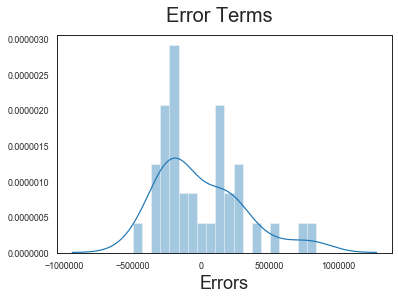

In [352]:
y_train_gmv = lr_3.predict(X_train_rfe)

# Plot the histogram of the error terms
fig = plt.figure()
sns.distplot((y_train['gmv'] - y_train_gmv), bins = 20)
fig.suptitle('Error Terms', fontsize = 20)                  # Plot heading 
plt.xlabel('Errors', fontsize = 18)                         # X-label

As we can see, the error terms are following a normal distribution with mean at 0

**Making the Predictions**

In [353]:
# Splitting the data into predictor and dependent variables
y_test = camdfdis_test[['gmv']]
X_test = camdfdis_test.drop('gmv', axis=1)

# Scaling the test variables
X_test[ls]=scaler.transform(X_test[ls])

# Now let's use our model to make predictions.

# Creating X_test_new dataframe by dropping variables from X_test
X_test_new = X_test[X_train_rfe.columns[1:]]

# Adding a constant variable 
X_test_new = sm.add_constant(X_test_new, has_constant='add')

In [354]:
# Making predictions
y_pred = lr_3.predict(X_test_new)
y_pred.head()

Week
33    9.347884e+04
60    5.493400e+06
66    4.262366e+06
63    6.840014e+06
61    4.084456e+06
dtype: float64

**Evaluating the Model**

Text(0, 0.5, 'y_pred')

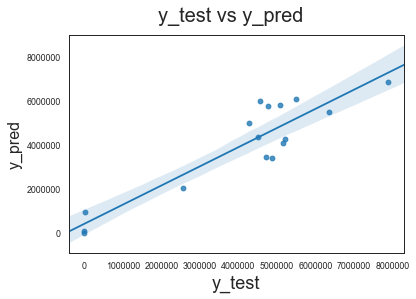

In [355]:
# plot points and fit line
# Plotting y_test and y_pred to understand the spread.
fig = plt.figure()
sns.regplot(y_test,y_pred)
fig.suptitle('y_test vs y_pred', fontsize=20)              # Plot heading 
plt.xlabel('y_test', fontsize=18)                          # X-label
plt.ylabel('y_pred', fontsize=16)                          # Y-label

Based on the above data, we can see that the model predictions seem to be pretty good

In [356]:
# Evaluation metrics
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from statistics import stdev

#Returns the mean squared error; we'll take a square root
print('RMSE:', np.sqrt(mean_squared_error(y_test, y_pred)))
print('R-Squared:', round(r2_score(y_test, y_pred),2))

# Since RMSE is relative to the scale of our y-variable, let's normalize the RMSE by dividing it with the standard deviation
print('Normalized RMSE:', np.sqrt(mean_squared_error(y_test, y_pred))/stdev(y_train['gmv']))

RMSE: 903331.014002996
R-Squared: 0.84
Normalized RMSE: 0.44866946060467366


**Plotting the most important features for the Tuned Distributed Lag Model of the Camera Accessory Dataset**

Text(0.5, 0, 'Coefficient')

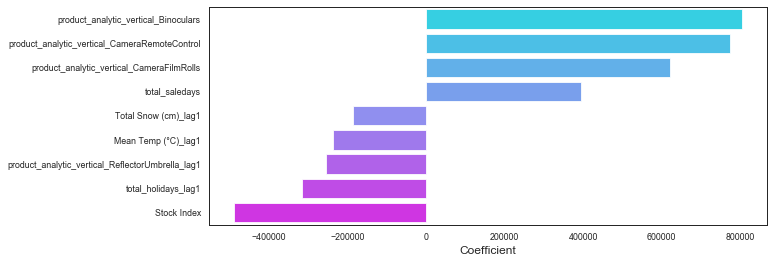

In [357]:
# Getting the coefficients from the model
# The lr_3.summary() is a set of tables, which we can export as html and then use Pandas to convert to a dataframe
df = pd.read_html(lr_3.summary().tables[1].as_html(),header=0,index_col=0)[0]
features = df.reset_index()[['index', 'coef']].sort_values('coef', ascending=False)
features = features.loc[features['index']!='const',:]

plt.figure(figsize=(10,4))
sns.barplot(y = features['index'], x = features['coef'], orient='h', palette='cool')
plt.ylabel('')
plt.xlabel('Coefficient', size=12)

---------
<br>

## Gaming Accessory Models

Let's now create the marketing mix models for the gaming accessory dataset. Before we jump into the different models, we first need to ensure that the data is prepared for modelling

In [358]:
gameaccess_weekly.head()

,Week,gmv,mean_discount%,mean_sla,mean_product_procurement_sla,total_paydays,total_saledays,total_cod_payments,total_luxury_products,total_orders,...,Stock Index_MA_5,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
0,27,4.035900e+04,26.106786,3.000000,2.785714,3,0,0,4,28,...,0.0,25.500000,13.200000,19.360000,0.100000,1.460000,0.000000,0.0,0.000000,0.0
1,28,2.713578e+06,40.072949,5.222445,2.952906,0,0,2188,251,2847,...,0.0,24.833333,15.333333,20.100000,0.283333,2.383333,4.416667,0.0,4.416667,0.0
2,29,2.292193e+06,42.438119,5.223435,2.474163,319,748,2070,232,2707,...,0.0,28.750000,17.583333,23.183333,0.000000,5.183333,1.400000,0.0,1.400000,0.0
3,30,2.628684e+06,37.051430,5.330929,2.295673,0,0,1898,269,2453,...,0.0,29.750000,16.600000,23.060000,0.000000,5.060000,0.900000,0.0,0.900000,0.0
4,31,1.802954e+06,39.901294,5.736499,2.232641,1,0,1318,163,1663,...,1179.9,31.583333,17.500000,24.566667,0.000000,6.566667,4.633333,0.0,4.633333,0.0


In [359]:
gameaccess_weekly.describe()

,Week,gmv,mean_discount%,mean_sla,mean_product_procurement_sla,total_paydays,total_saledays,total_cod_payments,total_luxury_products,total_orders,...,Stock Index_MA_5,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
count,53.000000,5.300000e+01,53.000000,53.000000,53.000000,53.000000,53.000000,53.000000,53.000000,53.000000,...,53.000000,53.000000,53.000000,53.000000,53.000000,53.000000,53.000000,53.000000,53.000000,53.000000
mean,53.000000,2.930274e+06,43.636794,5.592339,2.391166,228.415094,624.264151,2616.981132,246.396226,3382.603774,...,1073.952830,17.452516,7.077679,12.529835,7.055037,1.584872,2.599344,0.251752,2.851096,0.385220
std,15.443445,1.333454e+06,4.658081,0.654108,0.249112,335.145573,1500.094781,1535.927726,109.000413,1741.361816,...,315.064253,9.656809,8.476732,8.784263,7.094199,2.246675,3.225234,0.735189,3.500945,1.523869
min,27.000000,8.870000e+02,26.106786,2.666667,1.666667,0.000000,0.000000,0.000000,0.000000,3.000000,...,0.000000,-2.833333,-11.666667,-7.266667,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,40.000000,2.415147e+06,41.072682,5.458015,2.286224,0.000000,0.000000,1939.000000,189.000000,2524.000000,...,1096.500000,8.500000,1.100000,6.075000,0.100000,0.000000,0.280000,0.000000,0.300000,0.000000
50%,53.000000,3.018622e+06,44.206061,5.751531,2.439205,0.000000,0.000000,2851.000000,258.000000,3450.000000,...,1174.500000,17.600000,6.200000,12.529835,5.600000,0.000000,1.100000,0.000000,1.720000,0.000000
75%,66.000000,3.536786e+06,46.181258,5.917735,2.505486,517.000000,3.000000,3528.000000,305.000000,4197.000000,...,1204.200000,26.000000,15.333333,20.550000,11.925000,3.000000,4.200000,0.000000,4.250000,0.000000
max,79.000000,6.653212e+06,54.804000,6.433679,3.250000,1718.000000,8397.000000,8192.000000,518.000000,10070.000000,...,1237.800000,32.250000,18.700000,24.566667,25.266667,6.566667,12.800000,3.000000,15.700000,10.333333


In [360]:
# Checking for any null values in the dataset
sum(gameaccess_weekly.isnull().sum()!=0)

0

Plotting the correlation heatmap for all variables to check for any one-to-one variable collinearity

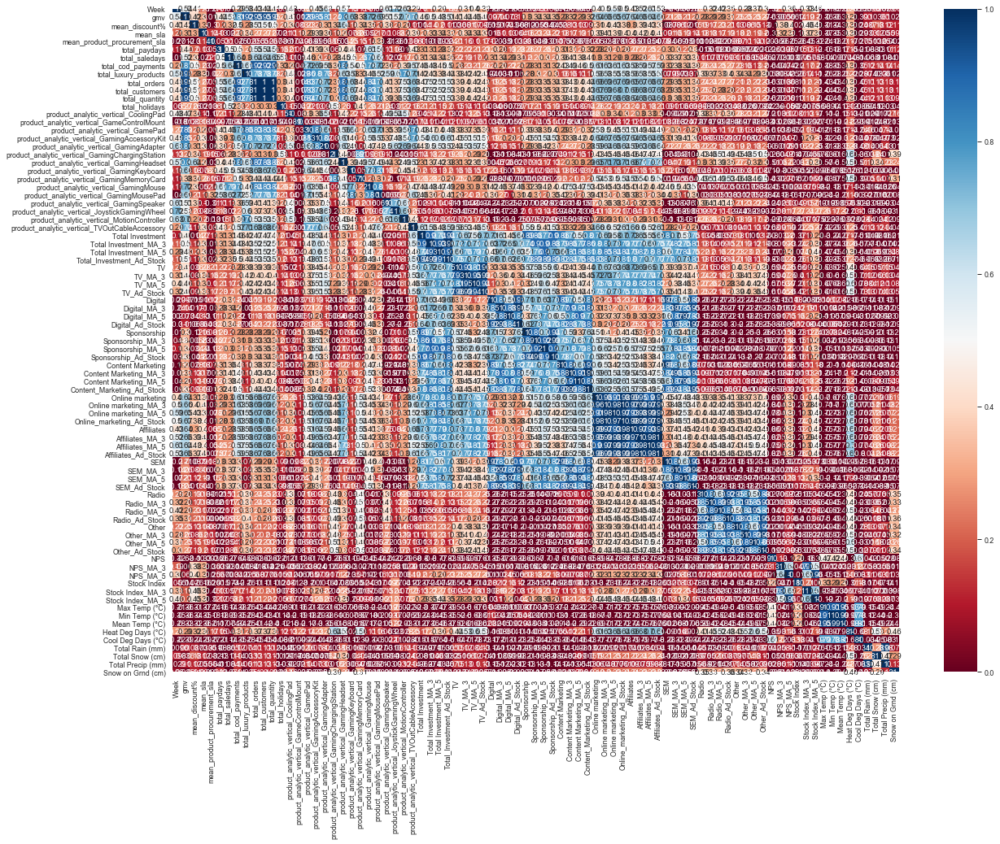

In [361]:
gameaccess_corr = gameaccess_weekly.corr()

plt.figure(figsize=(20,15))
sns.heatmap(gameaccess_corr,vmin=0,vmax=1,annot=True,cmap='RdBu')

Considering we have over 90 variables, it won't be feasible to start looking at multicollinearity for each variable. Let's go ahead with building the model using Recursive Feature Elimination, and using the VIF metric to identify the variables show high multi-collinearity

**Splitting the data into Test and Train**

In [362]:
from sklearn.model_selection import train_test_split

# We specify this so that the train and test data set always have the same rows, respectively
np.random.seed(1)
gamedf_train, gamedf_test = train_test_split(gameaccess_weekly, train_size = 0.7, test_size = 0.3, random_state = 100)

In [363]:
print(gamedf_train.shape)
print(gamedf_test.shape)

(37, 83)
(16, 83)


**Standard Scaling**

For all the non-binary features, let's use standard scaling to bring them to follow a gaussian distribution (mean-0, sigma-1). This is done to ensure all the variables will have a comparable scale, and hence the gradient descent procedure for the model will be a lot more optimized.

In [364]:
# Dropping the week variable
gamedf_train = gamedf_train.drop('Week', axis=1)
gamedf_test = gamedf_test.drop('Week', axis=1)

# Splitting the data into predictor and dependent variables
y_train = gamedf_train[['gmv']]
X_train = gamedf_train.drop('gmv', axis=1)

# Identifying all the non-binary variables
ls = []

for i in range(len(X_train.columns)):
    if X_train[X_train.columns[i]].nunique()>=3:
        ls.append(X_train.columns[i])

# Applying Standard Scaling to these features
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train[ls]=scaler.fit_transform(X_train[ls])

X_train.describe()

,mean_discount%,mean_sla,mean_product_procurement_sla,total_paydays,total_saledays,total_cod_payments,total_luxury_products,total_orders,total_customers,total_quantity,...,Stock Index_MA_5,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
count,3.700000e+01,3.700000e+01,3.700000e+01,3.700000e+01,3.700000e+01,3.700000e+01,3.700000e+01,3.700000e+01,3.700000e+01,3.700000e+01,...,3.700000e+01,3.700000e+01,3.700000e+01,3.700000e+01,3.700000e+01,3.700000e+01,3.700000e+01,3.700000e+01,3.700000e+01,3.700000e+01
mean,2.001402e-15,5.911187e-16,-1.440289e-15,8.101627e-17,-2.550512e-17,-1.680338e-16,-2.760555e-16,-7.201447e-17,-4.800964e-17,1.320265e-16,...,-4.725949e-16,-1.620325e-16,-4.200844e-17,6.001206e-17,-6.601326e-17,-6.001206e-17,6.001206e-18,-3.300663e-17,2.400482e-17,-1.500301e-17
std,1.013794e+00,1.013794e+00,1.013794e+00,1.013794e+00,1.013794e+00,1.013794e+00,1.013794e+00,1.013794e+00,1.013794e+00,1.013794e+00,...,1.013794e+00,1.013794e+00,1.013794e+00,1.013794e+00,1.013794e+00,1.013794e+00,1.013794e+00,1.013794e+00,1.013794e+00,1.013794e+00
min,-1.914893e+00,-4.855100e+00,-2.922360e+00,-6.302498e-01,-4.037029e-01,-1.717545e+00,-2.592045e+00,-2.071931e+00,-2.084938e+00,-2.081099e+00,...,-3.308219e+00,-1.804465e+00,-1.956451e+00,-1.897642e+00,-1.013686e+00,-7.278189e-01,-8.278113e-01,-2.831045e-01,-7.988661e-01,-2.080795e-01
25%,-6.576067e-01,-3.076340e-01,-4.283983e-01,-6.302498e-01,-4.037029e-01,-3.542407e-01,-6.517282e-01,-5.042467e-01,-4.943015e-01,-5.216595e-01,...,4.820800e-02,-9.467348e-01,-7.394129e-01,-6.676803e-01,-9.521974e-01,-7.278189e-01,-7.854013e-01,-2.831045e-01,-7.602309e-01,-2.080795e-01
50%,2.281114e-01,2.736343e-01,1.406958e-01,-6.302498e-01,-4.037029e-01,1.019702e-01,5.838792e-02,-7.132041e-03,9.737824e-03,-4.536904e-02,...,3.498533e-01,2.535959e-02,-1.248692e-01,-1.140708e-02,-1.340321e-01,-7.278189e-01,-4.319849e-01,-2.831045e-01,-4.382705e-01,-2.080795e-01
75%,6.913514e-01,4.952847e-01,4.034944e-01,7.212955e-01,-4.037029e-01,3.803587e-01,4.484517e-01,2.008506e-01,2.389618e-01,1.919247e-01,...,4.408455e-01,8.986850e-01,9.234702e-01,8.839929e-01,5.963952e-01,6.079626e-01,4.821855e-01,-2.831045e-01,3.945336e-01,-2.080795e-01
max,1.932597e+00,1.303162e+00,3.355434e+00,4.363201e+00,4.520179e+00,3.736339e+00,2.588802e+00,3.979403e+00,3.940105e+00,4.026659e+00,...,5.489766e-01,1.491299e+00,1.381366e+00,1.384648e+00,2.130692e+00,2.196058e+00,2.791173e+00,4.606978e+00,3.244956e+00,5.758600e+00


### 1. Basic Linear Additive Model

The linear model assumes that all the different KPI's are additive in nature and contribute linearly to the revenue generated by the company. The equation that the linear model follows is: <br><br>
Y = α + β1At + β2Pt + β3Dt + β4Qt + β5Tt + ϵ<br><br>
Where:<br> A - KPI's related to advertisement<br>
P - KPI's related to pricing<br>
D - KPI's related to promotion/discounts<br>
Q - KPI's related to product assortment/quality<br>
T - KPI's related to industry trends, seasonality etc.

In [365]:
# Fitting a regression line using statsmodels.api
import statsmodels.api as sm

# Add a constant
X_train_lm = sm.add_constant(X_train)

# Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

In [366]:
print(lr.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                     0.000
Date:                Sun, 22 Dec 2019   Prob (F-statistic):                nan
Time:                        15:56:42   Log-Likelihood:                 648.20
No. Observations:                  37   AIC:                            -1222.
Df Residuals:                       0   BIC:                            -1163.
Df Model:                          36                                         
Covariance Type:            nonrobust                                         
                                                      coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------

**Making the Predictions**

In [367]:
# Splitting the data into predictor and dependent variables
y_test = gamedf_test[['gmv']]
X_test = gamedf_test.drop('gmv', axis=1)

# Scaling the test variables
X_test[ls]=scaler.transform(X_test[ls])

# Now let's use our model to make predictions.

# Creating X_test_new dataframe by dropping variables from X_test
X_test_new = X_test[X_train.columns[:]]

# Adding a constant variable 
X_test_new = sm.add_constant(X_test_new, has_constant='add')

# Making predictions
y_pred = lr.predict(X_test_new)
y_pred.head()

25    3.862029e+06
48    3.926360e+06
52    1.905638e+06
37    3.638963e+06
6     2.622499e+05
dtype: float64

**Evaluating the model**

Text(0, 0.5, 'y_pred')

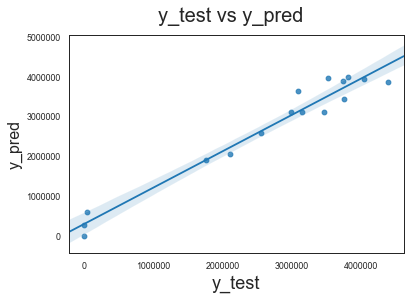

In [368]:
# plot points and fit line
# Plotting y_test and y_pred to understand the spread.
fig = plt.figure()
sns.regplot(y_test,y_pred)
fig.suptitle('y_test vs y_pred', fontsize=20)              # Plot heading 
plt.xlabel('y_test', fontsize=18)                          # X-label
plt.ylabel('y_pred', fontsize=16)                          # Y-label

In [369]:
# Evaluation metrics
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from statistics import stdev

#Returns the mean squared error; we'll take a square root
print('RMSE:', np.sqrt(mean_squared_error(y_test, y_pred)))
print('R-Squared:', round(r2_score(y_test, y_pred),2))

# Since RMSE is relative to the scale of our y-variable, let's normalize the RMSE by dividing it with the standard deviation
print('Normalized RMSE:', np.sqrt(mean_squared_error(y_test, y_pred))/stdev(y_train['gmv']))

RMSE: 303734.0117817654
R-Squared: 0.95
Normalized RMSE: 0.23923240398210632


Plotting the most important features off our most basic model

Text(0.5, 0, 'Coefficient')

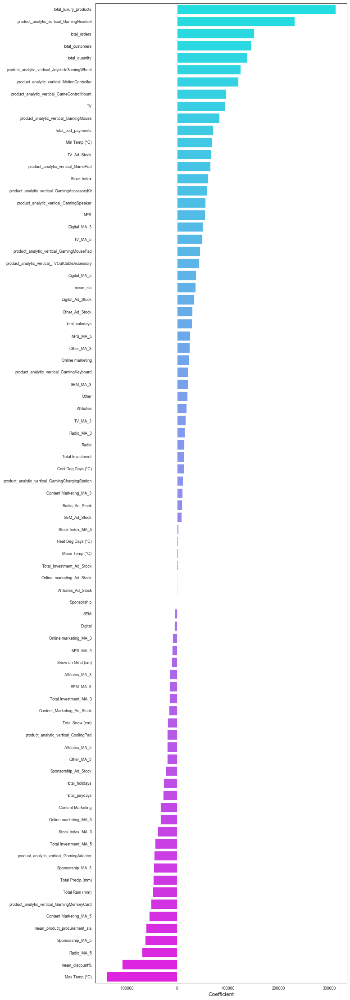

In [370]:
# Getting the coefficients from the model
# The lr_3.summary() is a set of tables, which we can export as html and then use Pandas to convert to a dataframe
df = pd.read_html(lr.summary().tables[1].as_html(),header=0,index_col=0)[0]
features = df.reset_index()[['index', 'coef']].sort_values('coef', ascending=False)
features = features.loc[features['index']!='const',:]

plt.figure(figsize=(10,40))
sns.barplot(y = features['index'], x = features['coef'], orient='h', palette='cool')
plt.ylabel('', size=12)
plt.xlabel('Coefficient', size=12)

Based on the above summary of our model, we see that the R-squared value is pretty high. However, there may be massive multi-collinearity present in the data. Also, it is not recommended to have a model with such a large number of predictors
<br>
Let's **check the VIF**
Variance Inflation Factor or VIF, gives a basic quantitative idea about how much the feature variables are correlated with each other. It is an extremely important parameter to test our linear model. The formula for calculating `VIF` is:

### $ VIF_i = \frac{1}{1 - {R_i}^2} $

In [371]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train.columns
vif['VIF'] = [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,mean_discount%,inf
41,Sponsorship_Ad_Stock,inf
59,Radio_MA_3,inf
58,Radio,inf
57,SEM_Ad_Stock,inf
...,...,...
25,product_analytic_vertical_TVOutCableAccessory,inf
24,product_analytic_vertical_MotionController,inf
23,product_analytic_vertical_JoystickGamingWheel,inf
80,Snow on Grnd (cm),inf


As we see, there is very high multi-collinearity in our data, evident from the massively inflated VIF values for the features. We generally want a VIF that is less than 5. So there are clearly some variables we need to drop. 

Considering we're dealing with a really large set of data, it wouldn't be feasible of treating them 1 at a time. In that case, we'll opt for **Recursive Feature Elimination** To come down to about a smaller number of variables that explain the highest variance in the data and exhibit the least multicollinearity. Post that, we'll go into fine-tuning the model manually to end up with the final set of variables

In [372]:
# Importing RFE and LinearRegression
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression

lm = LinearRegression()
lm.fit(X_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

Let's try using the recursive feature elimination based on mean squared error to identify the optimal number of features that we should huse in our model.

Let's perform RFE using 15 variables and then later fine-tune the model using other features such as the VIF, P-values and adjusted R-squared to identify the final set of variables

In [373]:
# running RFE
rfe = RFE(lm, 15)
rfe = rfe.fit(X_train, y_train)
zip(X_train.columns,rfe.support_,rfe.ranking_)

# Identify all the columns that were returned by our RFE model
col = X_train.columns[rfe.support_]
col

Index(['total_luxury_products', 'total_orders', 'total_customers',
       'total_quantity', 'product_analytic_vertical_GameControlMount',
       'product_analytic_vertical_GamePad',
       'product_analytic_vertical_GamingHeadset',
       'product_analytic_vertical_GamingMemoryCard',
       'product_analytic_vertical_GamingMouse', 'TV_MA_3', 'Digital_Ad_Stock',
       'Sponsorship_Ad_Stock', 'Affiliates_MA_3', 'Other_MA_5',
       'Min Temp (°C)'],
      dtype='object')

Let's now build the model using the above identified features

In [374]:
# Creating X_test dataframe with RFE selected variables
X_train_rfe = X_train[col]

In [375]:
# Build a fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.996
Model:                            OLS   Adj. R-squared:                  0.992
Method:                 Least Squares   F-statistic:                     311.6
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           3.33e-21
Time:                        15:57:26   Log-Likelihood:                -471.92
No. Observations:                  37   AIC:                             975.8
Df Residuals:                      21   BIC:                             1002.
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                                                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------

We see that even after reducing the number of vaiables to 15 using RFE, the remaining variables are still able to explain a very high amount of variance in the y variabl (evident by the very high R-squared value). Now that we've used RFE to drop all the insignificant variables, let's fine-tune our model by dropping those variable with high VIF or p values 1 at a time until we have a final set of variables that are able to explain a good amount of variance in the revenue variable.

In [376]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('total_orders', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.995
Model:                            OLS   Adj. R-squared:                  0.991
Method:                 Least Squares   F-statistic:                     294.2
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           1.14e-21
Time:                        15:57:36   Log-Likelihood:                -475.10
No. Observations:                  37   AIC:                             980.2
Df Residuals:                      22   BIC:                             1004.
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                                                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------

In [377]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('total_quantity', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.995
Model:                            OLS   Adj. R-squared:                  0.992
Method:                 Least Squares   F-statistic:                     326.3
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           7.25e-23
Time:                        15:57:45   Log-Likelihood:                -475.38
No. Observations:                  37   AIC:                             978.8
Df Residuals:                      23   BIC:                             1001.
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                                                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------

In [378]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('total_customers', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.993
Model:                            OLS   Adj. R-squared:                  0.989
Method:                 Least Squares   F-statistic:                     267.1
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           1.69e-22
Time:                        15:57:45   Log-Likelihood:                -481.31
No. Observations:                  37   AIC:                             988.6
Df Residuals:                      24   BIC:                             1010.
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                                                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------

In [379]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('Affiliates_MA_3', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.992
Model:                            OLS   Adj. R-squared:                  0.989
Method:                 Least Squares   F-statistic:                     285.5
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           2.01e-23
Time:                        15:57:46   Log-Likelihood:                -482.44
No. Observations:                  37   AIC:                             988.9
Df Residuals:                      25   BIC:                             1008.
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                                                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------

In [380]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('Sponsorship_Ad_Stock', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.991
Model:                            OLS   Adj. R-squared:                  0.988
Method:                 Least Squares   F-statistic:                     289.3
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           5.10e-24
Time:                        15:57:47   Log-Likelihood:                -484.66
No. Observations:                  37   AIC:                             991.3
Df Residuals:                      26   BIC:                             1009.
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                                                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------

In [381]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('total_luxury_products', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.938
Model:                            OLS   Adj. R-squared:                  0.917
Method:                 Least Squares   F-statistic:                     45.42
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           5.31e-14
Time:                        15:57:52   Log-Likelihood:                -520.55
No. Observations:                  37   AIC:                             1061.
Df Residuals:                      27   BIC:                             1077.
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                                                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------

In [382]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('product_analytic_vertical_GamingMemoryCard', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.938
Model:                            OLS   Adj. R-squared:                  0.920
Method:                 Least Squares   F-statistic:                     52.93
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           7.09e-15
Time:                        15:57:53   Log-Likelihood:                -520.57
No. Observations:                  37   AIC:                             1059.
Df Residuals:                      28   BIC:                             1074.
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                                                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------

In [383]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('product_analytic_vertical_GameControlMount', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.938
Model:                            OLS   Adj. R-squared:                  0.923
Method:                 Least Squares   F-statistic:                     62.49
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           8.84e-16
Time:                        15:57:53   Log-Likelihood:                -520.61
No. Observations:                  37   AIC:                             1057.
Df Residuals:                      29   BIC:                             1070.
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                              coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------

In [384]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('Other_MA_5', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.934
Model:                            OLS   Adj. R-squared:                  0.921
Method:                 Least Squares   F-statistic:                     71.13
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           2.19e-16
Time:                        15:57:57   Log-Likelihood:                -521.63
No. Observations:                  37   AIC:                             1057.
Df Residuals:                      30   BIC:                             1069.
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                                              coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------

The above variables seem to be significant enough, and the corresponding R-squared value is also high hence we can infer that the varriance is being explained pretty well by these variables.<br>
Looking at the F-statistic, it is pretty high and the corresponding p-value is almost 0 suggesting that it is significant.<br>
We've also taken into account the multicollinearity that may exist based on the VIF values.

**Let's go ahead and perform residual analysis to ensure that the assumptions of linear regression are being satisfied**

In [385]:
y_train_gmv = lr_3.predict(X_train_rfe)

Text(0.5, 0, 'Errors')

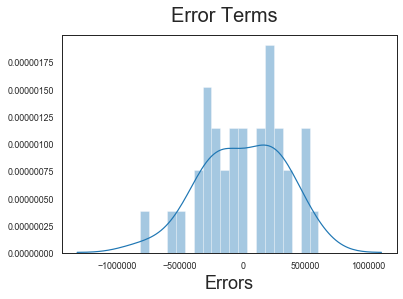

In [386]:
# Plot the histogram of the error terms
fig = plt.figure()
sns.distplot((y_train['gmv'] - y_train_gmv), bins = 20)
fig.suptitle('Error Terms', fontsize = 20)                  # Plot heading 
plt.xlabel('Errors', fontsize = 18)                         # X-label

As we can see, the error terms are following a normal distribution with mean at 0

**Making the Predictions**

In [387]:
# Splitting the data into predictor and dependent variables
y_test = gamedf_test[['gmv']]
X_test = gamedf_test.drop('gmv', axis=1)

# Scaling the test variables
X_test[ls]=scaler.transform(X_test[ls])

# Now let's use our model to make predictions.

# Creating X_test_new dataframe by dropping variables from X_test
X_test_new = X_test[X_train_rfe.columns[1:]]

# Adding a constant variable 
X_test_new = sm.add_constant(X_test_new)

# Making predictions
y_pred = lr_3.predict(X_test_new)

In [388]:
y_pred.head()

25    4.513318e+06
48    3.636059e+06
52    1.669711e+06
37    3.426811e+06
6     3.068725e+05
dtype: float64

**Evaluating the Model**

Text(0, 0.5, 'y_pred')

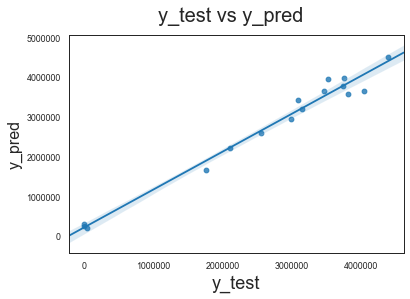

In [389]:
# plot points and fit line
# Plotting y_test and y_pred to understand the spread.
fig = plt.figure()
sns.regplot(y_test,y_pred)
fig.suptitle('y_test vs y_pred', fontsize=20)              # Plot heading 
plt.xlabel('y_test', fontsize=18)                          # X-label
plt.ylabel('y_pred', fontsize=16)                          # Y-label

Based on the above data, we can see that the model predictions seem to be pretty good

In [390]:
# Evaluation metrics
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from statistics import stdev
#Returns the mean squared error; we'll take a square root
print('RMSE:', np.sqrt(mean_squared_error(y_test, y_pred)))
print('R-Squared:', round(r2_score(y_test, y_pred),2))

# Since RMSE is relative to the scale of our y-variable, let's normalize the RMSE by dividing it with the standard deviation
print('Normalized RMSE:', np.sqrt(mean_squared_error(y_test, y_pred))/stdev(y_train['gmv']))


RMSE: 225431.32433404363
R-Squared: 0.98
Normalized RMSE: 0.17755824359918085


**Plotting the most important features for the Additive Model of the Game Accessory Dataset**

Text(0.5, 0, 'Coefficient')

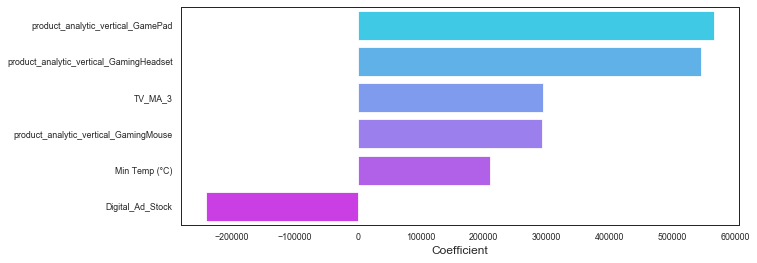

In [391]:
# Getting the coefficients from the model
# The lr_3.summary() is a set of tables, which we can export as html and then use Pandas to convert to a dataframe
df = pd.read_html(lr_3.summary().tables[1].as_html(),header=0,index_col=0)[0]
features = df.reset_index()[['index', 'coef']].sort_values('coef', ascending=False)
features = features.loc[features['index']!='const',:]

plt.figure(figsize=(10,4))
sns.barplot(y = features['index'], x = features['coef'], orient='h', palette='cool')
plt.ylabel('')
plt.xlabel('Coefficient', size=12)

### 2. Multiplicative Model

The linear additive model created above assumes that all the predictor variables contribute linearly to the revenue variable and all the KPI;s affect the revenue additively.

However, this may not be entirely true - hence we go ahead for a multiplicative model. The equation that the multiplicative model follows is: <br><br>
ln(Y) = α + β1ln(At) + β2ln(Pt) + β3ln(Dt) + β4ln(Qt) + β5ln(Tt) + ϵ'<br><br>
Where:<br> A - KPI's related to advertisement<br>
P - KPI's related to pricing<br>
D - KPI's related to promotion/discounts<br>
Q - KPI's related to product assortment/quality<br>
T - KPI's related to industry trends, seasonality etc.

In [392]:
gameaccess_weekly_mul = gameaccess_weekly.copy()

# Setting week number as index
gameaccess_weekly_mul = gameaccess_weekly_mul.set_index('Week')

In [393]:
# Applying log (ln) transform to each of the variables
# We'll exclude the binary categorical variables in this case as a log transform on those would result in loss of variance
# This is because ln(1) = 0, and ln(0)= inf

# Identifying all the non-binary variables
ls = []

for i in range(len(gameaccess_weekly_mul.columns)):
    if gameaccess_weekly_mul[gameaccess_weekly_mul.columns[i]].nunique()>=3:
        ls.append(gameaccess_weekly_mul.columns[i])

gameaccess_weekly_mul[ls] = gameaccess_weekly_mul[ls].applymap(lambda x:np.log(x))

# After applying log transformation to values, all the 0 values become infinity. Converting these back to 0
gameaccess_weekly_mul = gameaccess_weekly_mul.replace([np.inf, -np.inf], 0)
gameaccess_weekly_mul = gameaccess_weekly_mul.replace(np.nan, 0)
gameaccess_weekly_mul.head()

,gmv,mean_discount%,mean_sla,mean_product_procurement_sla,total_paydays,total_saledays,total_cod_payments,total_luxury_products,total_orders,total_customers,...,Stock Index_MA_5,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
Week,,,,,,,,,,,,,,,,,,,,,
27,10.605570,3.262195,1.098612,1.024504,1.098612,0.000000,0.000000,1.386294,3.332205,3.332205,...,0.000000,3.238678,2.580217,2.963209,-2.302585,0.378436,0.000000,0.0,0.000000,0.0
28,14.813779,3.690702,1.652966,1.082790,0.000000,0.000000,7.690743,5.525453,7.954021,7.877776,...,0.000000,3.212187,2.730029,3.000720,-1.261131,0.868500,1.485385,0.0,1.485385,0.0
29,14.645020,3.748047,1.653155,0.905902,5.765191,6.617403,7.635304,5.446737,7.903596,7.832014,...,0.000000,3.358638,2.866951,3.143434,0.000000,1.645448,0.336472,0.0,0.336472,0.0
30,14.781994,3.612307,1.673526,0.831026,0.000000,0.000000,7.548556,5.594711,7.805067,7.726213,...,0.000000,3.392829,2.809403,3.138100,0.000000,1.621366,-0.105361,0.0,-0.105361,0.0
31,14.404937,3.686409,1.746849,0.803185,0.000000,0.000000,7.183871,5.093750,7.416378,7.352441,...,7.073185,3.452630,2.862201,3.201391,0.000000,1.882006,1.533277,0.0,1.533277,0.0


Now that we've performed the log transform for each of the variables, we can go ahead and perform a linear regression on the transformed variables which is effectively performing a multiplicative model on the actual variables

**Splitting the data into test and train**

In [394]:
from sklearn.model_selection import train_test_split

# We specify this so that the train and test data set always have the same rows, respectively
np.random.seed(1)
gamedfmul_train, gamedfmul_test = train_test_split(gameaccess_weekly_mul, train_size = 0.7, test_size = 0.3, random_state = 100)

print(gamedfmul_train.shape)
print(gamedfmul_test.shape)

(37, 82)
(16, 82)


**Scaling the features** - Using Standard Scaling as explained in the previous model

In [395]:
# Splitting the data into predictor and dependent variables
y_train = gamedfmul_train[['gmv']]
X_train = gamedfmul_train.drop('gmv', axis=1)

# Identifying all the non-binary variables
ls = []

for i in range(len(X_train.columns)):
    if X_train[X_train.columns[i]].nunique()>=3:
        ls.append(X_train.columns[i])

# Applying Standard Scaling to these features
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train[ls]=scaler.fit_transform(X_train[ls])

X_train.describe()

,mean_discount%,mean_sla,mean_product_procurement_sla,total_paydays,total_saledays,total_cod_payments,total_luxury_products,total_orders,total_customers,total_quantity,...,Stock Index_MA_5,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
count,3.700000e+01,3.700000e+01,3.700000e+01,3.700000e+01,3.700000e+01,3.700000e+01,3.700000e+01,3.700000e+01,37.000000,3.700000e+01,...,3.700000e+01,3.700000e+01,3.700000e+01,3.700000e+01,3.700000e+01,3.700000e+01,3.700000e+01,3.700000e+01,3.700000e+01,3.700000e+01
mean,-1.215244e-15,1.611324e-15,-1.224246e-15,1.140229e-16,6.001206e-18,-1.440289e-16,3.600723e-16,1.512304e-15,0.000000,3.840772e-16,...,-1.200241e-16,4.530910e-16,-8.401688e-17,9.001808e-18,-3.000603e-17,-8.401688e-17,1.500301e-17,-6.076221e-17,-1.050211e-16,4.050814e-17
std,1.013794e+00,1.013794e+00,1.013794e+00,1.013794e+00,1.013794e+00,1.013794e+00,1.013794e+00,1.013794e+00,1.013794,1.013794e+00,...,1.013794e+00,1.013794e+00,1.013794e+00,1.013794e+00,1.013794e+00,1.013794e+00,1.013794e+00,1.013794e+00,1.013794e+00,1.013794e+00
min,-2.008846e+00,-5.308557e+00,-3.403029e+00,-7.777826e-01,-4.918835e-01,-3.667753e+00,-4.083664e+00,-4.181104e+00,-4.179745,-4.184642e+00,...,-3.365254e+00,-3.074425e+00,-1.477853e+00,-3.649925e+00,-1.991890e+00,-1.924450e+00,-2.396035e+00,-2.361280e+00,-2.362319e+00,-2.241699e-01
25%,-6.279718e-01,-1.850223e-01,-3.816452e-01,-7.777826e-01,-4.918835e-01,1.747351e-01,-1.863654e-03,6.396624e-02,0.068019,5.854825e-02,...,2.612952e-01,-4.690869e-01,-1.393374e+00,-1.207131e-01,-1.019375e+00,-6.742067e-01,-5.966681e-01,-7.457546e-02,-6.044028e-01,-2.241699e-01
50%,2.622457e-01,2.683208e-01,1.906072e-01,-7.777826e-01,-4.918835e-01,3.444547e-01,2.397902e-01,2.365295e-01,0.241539,2.241967e-01,...,3.059954e-01,3.156029e-01,1.393390e-01,3.366651e-01,3.725456e-01,-6.742067e-01,-2.775334e-01,-7.457546e-02,-2.926196e-01,-2.241699e-01
75%,7.042286e-01,4.339127e-01,4.435889e-01,1.240610e+00,-4.918835e-01,4.281825e-01,3.461754e-01,2.966676e-01,0.307015,2.927331e-01,...,3.187574e-01,7.197073e-01,9.165025e-01,7.021486e-01,8.387114e-01,8.248076e-01,8.576029e-01,-7.457546e-02,8.163677e-01,-2.241699e-01
max,1.818181e+00,1.007027e+00,2.898551e+00,1.670076e+00,2.384393e+00,9.902832e-01,7.591299e-01,9.105045e-01,0.907872,9.073553e-01,...,3.335264e-01,9.249921e-01,1.117848e+00,8.492701e-01,1.354863e+00,1.893719e+00,1.821411e+00,4.037660e+00,1.947205e+00,5.416582e+00


Let's first create a vanilla model using all the variables as it is. This will give us an idea on what the base statistics of our basic model looks like.

In [396]:
# Fitting a regression line using statsmodels.api
import statsmodels.api as sm

# Add a constant
X_train_lm = sm.add_constant(X_train)

# Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

In [397]:
# Check the summary
print(lr.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                     0.000
Date:                Sun, 22 Dec 2019   Prob (F-statistic):                nan
Time:                        15:59:14   Log-Likelihood:                 1096.6
No. Observations:                  37   AIC:                            -2119.
Df Residuals:                       0   BIC:                            -2060.
Df Model:                          36                                         
Covariance Type:            nonrobust                                         
                                                      coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------

**Making the Predictions**

In [398]:
# Splitting the data into predictor and dependent variables
y_test = gamedfmul_test[['gmv']]
X_test = gamedfmul_test.drop('gmv', axis=1)

# Scaling the test variables
X_test[ls]=scaler.transform(X_test[ls])

# Now let's use our model to make predictions.

# Creating X_test_new dataframe by dropping variables from X_test
X_test_new = X_test[X_train.columns[:]]

# Adding a constant variable 
X_test_new = sm.add_constant(X_test_new, has_constant='add')

# Making predictions
y_pred = lr.predict(X_test_new)
y_pred.head()

Week
52    14.710185
75    15.248791
79    14.092099
64    15.413639
33     7.788880
dtype: float64

**Evaluating the model**

Text(0, 0.5, 'y_pred')

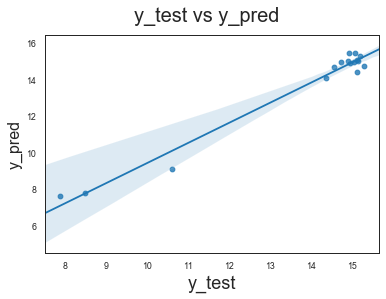

In [399]:
# plot points and fit line
# Plotting y_test and y_pred to understand the spread.
fig = plt.figure()
sns.regplot(y_test,y_pred)
fig.suptitle('y_test vs y_pred', fontsize=20)              # Plot heading 
plt.xlabel('y_test', fontsize=18)                          # X-label
plt.ylabel('y_pred', fontsize=16)                          # Y-label

In [400]:
# Evaluation metrics
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from statistics import stdev

#Returns the mean squared error; we'll take a square root
print('RMSE:', np.sqrt(mean_squared_error(y_test, y_pred)))
print('R-Squared:', round(r2_score(y_test, y_pred),2))

# Since RMSE is relative to the scale of our y-variable, let's normalize the RMSE by dividing it with the standard deviation
print('Normalized RMSE:', np.sqrt(mean_squared_error(y_test, y_pred))/stdev(y_train['gmv']))

RMSE: 0.5213125063058097
R-Squared: 0.95
Normalized RMSE: 0.2918315032160032


Plotting the most important features off the back of our vanilla model

Text(0.5, 0, 'Coefficient')

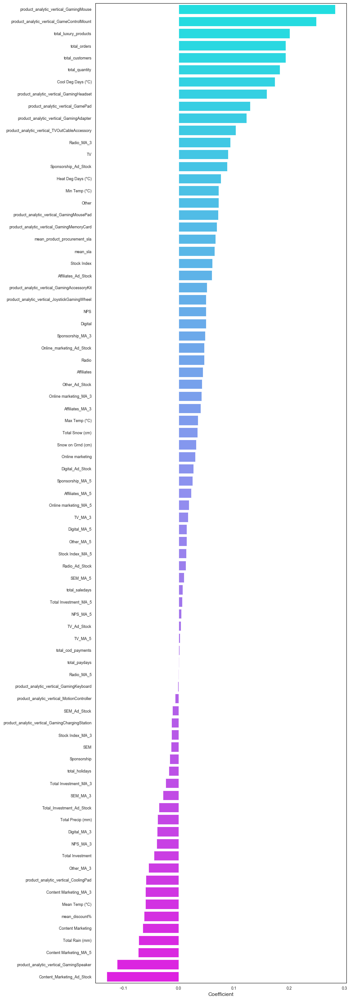

In [401]:
# Getting the coefficients from the model
# The lr_3.summary() is a set of tables, which we can export as html and then use Pandas to convert to a dataframe
df = pd.read_html(lr.summary().tables[1].as_html(),header=0,index_col=0)[0]
features = df.reset_index()[['index', 'coef']].sort_values('coef', ascending=False)
features = features.loc[features['index']!='const',:]

plt.figure(figsize=(10,40))
sns.barplot(y = features['index'], x = features['coef'], orient='h', palette='cool')
plt.ylabel('', size=12)
plt.xlabel('Coefficient', size=12)

Clearly there exists a lot of multicollinearity in our data. Let's use **VIF** to detect the correlated variables

In [402]:
# Check for the VIF values of the feature variables. 
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train.columns
vif['VIF'] = [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,mean_discount%,inf
41,Sponsorship_Ad_Stock,inf
59,Radio_MA_3,inf
58,Radio,inf
57,SEM_Ad_Stock,inf
...,...,...
25,product_analytic_vertical_TVOutCableAccessory,inf
24,product_analytic_vertical_MotionController,inf
23,product_analytic_vertical_JoystickGamingWheel,inf
80,Snow on Grnd (cm),inf


Considering we're dealing with a really large set of data, it wouldn't be feasible of treating them 1 at a time. In that case, we'll opt for **Recursive Feature Elimination** to come down to about a smaller number of variables that explain the highest variance in the data and exhibit the least multicollinearity. Post that, we'll go into fine-tuning the model manually to end up with the final set of variables

In [403]:
# Importing RFE and LinearRegression
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression

lm = LinearRegression()
lm.fit(X_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

Let's perform RFE using 25 variables and then later fine-tune the model using other features such as the VIF, P-values and adjusted R-squared to identify the final set of variables

In [404]:
# running RFE
rfe = RFE(lm, 25)
rfe = rfe.fit(X_train, y_train)

zip(X_train.columns,rfe.support_,rfe.ranking_)

In [405]:
# Identify all the columns that were returned by our RFE model
col = X_train.columns[rfe.support_]
col

Index(['mean_discount%', 'mean_sla', 'total_luxury_products', 'total_orders',
       'total_customers', 'total_quantity',
       'product_analytic_vertical_GamePad',
       'product_analytic_vertical_GamingHeadset',
       'product_analytic_vertical_GamingMouse', 'Total Investment_MA_3',
       'Total_Investment_Ad_Stock', 'TV', 'Digital_MA_3', 'Digital_MA_5',
       'Sponsorship_Ad_Stock', 'Content Marketing_MA_3',
       'Content Marketing_MA_5', 'Online marketing_MA_3',
       'Online_marketing_Ad_Stock', 'Affiliates_Ad_Stock', 'SEM_MA_5',
       'Other_MA_3', 'NPS_MA_5', 'Stock Index_MA_5', 'Cool Deg Days (°C)'],
      dtype='object')

Let's now build the model using the above features and check its performance

In [406]:
# Creating X_test dataframe with RFE selected variables
X_train_rfe = X_train[col]
X_train_rfe = sm.add_constant(X_train_rfe)

lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                     2399.
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           2.53e-17
Time:                        15:59:38   Log-Likelihood:                 85.713
No. Observations:                  37   AIC:                            -119.4
Df Residuals:                      11   BIC:                            -77.54
Df Model:                          25                                         
Covariance Type:            nonrobust                                         
                                              coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------

In [407]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
4,total_orders,273780.57
5,total_customers,121084.10
6,total_quantity,84484.63
19,Online_marketing_Ad_Stock,43412.10
20,Affiliates_Ad_Stock,34085.23
24,Stock Index_MA_5,29395.79
18,Online marketing_MA_3,23196.78
23,NPS_MA_5,22027.82
10,Total Investment_MA_3,21976.07
21,SEM_MA_5,15356.93


We see that even after reducing the number of vaiables to 25 using RFE, the remaining variables are still able to explain a very high amount of variance in the y variable (evident by the very high R-squared value). Now that we've used RFE to drop all the insignificant variables, let's fine-tune our model by dropping those variable with high VIF or p values 1 at a time until we have a final set of variables that are able to explain a good amount of variance in the revenue variable.

In [408]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('total_orders', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                     1535.
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           1.47e-17
Time:                        15:59:50   Log-Likelihood:                 75.085
No. Observations:                  37   AIC:                            -100.2
Df Residuals:                      12   BIC:                            -59.90
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
                                              coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------

In [409]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('total_customers', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                     1722.
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           3.60e-19
Time:                        15:59:58   Log-Likelihood:                 74.950
No. Observations:                  37   AIC:                            -101.9
Df Residuals:                      13   BIC:                            -63.24
Df Model:                          23                                         
Covariance Type:            nonrobust                                         
                                              coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------

In [410]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('Online_marketing_Ad_Stock', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                     1395.
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           7.95e-20
Time:                        15:59:58   Log-Likelihood:                 68.857
No. Observations:                  37   AIC:                            -91.71
Df Residuals:                      14   BIC:                            -54.66
Df Model:                          22                                         
Covariance Type:            nonrobust                                         
                                              coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------

In [411]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('Online marketing_MA_3', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                     1156.
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           1.89e-20
Time:                        15:59:59   Log-Likelihood:                 63.251
No. Observations:                  37   AIC:                            -82.50
Df Residuals:                      15   BIC:                            -47.06
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
                                              coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------

In [412]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('Stock Index_MA_5', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                     1295.
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           5.12e-22
Time:                        15:59:59   Log-Likelihood:                 63.251
No. Observations:                  37   AIC:                            -84.50
Df Residuals:                      16   BIC:                            -50.67
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                                              coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------

In [413]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('SEM_MA_5', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                     1424.
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           1.51e-23
Time:                        16:00:00   Log-Likelihood:                 62.941
No. Observations:                  37   AIC:                            -85.88
Df Residuals:                      17   BIC:                            -53.66
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                                              coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------

In [414]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('total_quantity', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.998
Method:                 Least Squares   F-statistic:                     868.5
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           8.49e-23
Time:                        16:00:00   Log-Likelihood:                 51.745
No. Observations:                  37   AIC:                            -65.49
Df Residuals:                      18   BIC:                            -34.88
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                              coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------

In [415]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('total_luxury_products', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.998
Method:                 Least Squares   F-statistic:                     890.6
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           5.99e-24
Time:                        16:00:05   Log-Likelihood:                 50.155
No. Observations:                  37   AIC:                            -64.31
Df Residuals:                      19   BIC:                            -35.31
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                                              coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------

In [416]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('Digital_MA_5', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.998
Method:                 Least Squares   F-statistic:                     908.8
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           4.61e-25
Time:                        16:00:06   Log-Likelihood:                 48.461
No. Observations:                  37   AIC:                            -62.92
Df Residuals:                      20   BIC:                            -35.54
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                                              coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------

In [417]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('Content Marketing_MA_5', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.997
Method:                 Least Squares   F-statistic:                     757.3
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           3.11e-25
Time:                        16:00:06   Log-Likelihood:                 43.000
No. Observations:                  37   AIC:                            -54.00
Df Residuals:                      21   BIC:                            -28.22
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                                              coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------

In [418]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('Affiliates_Ad_Stock', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.997
Method:                 Least Squares   F-statistic:                     826.1
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           1.42e-26
Time:                        16:00:06   Log-Likelihood:                 42.472
No. Observations:                  37   AIC:                            -54.94
Df Residuals:                      22   BIC:                            -30.78
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                                              coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------

In [419]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('product_analytic_vertical_GamePad', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.995
Model:                            OLS   Adj. R-squared:                  0.992
Method:                 Least Squares   F-statistic:                     357.9
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           2.52e-23
Time:                        16:00:08   Log-Likelihood:                 24.858
No. Observations:                  37   AIC:                            -21.72
Df Residuals:                      23   BIC:                            0.8361
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                                              coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------

In [420]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('Total_Investment_Ad_Stock', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.995
Model:                            OLS   Adj. R-squared:                  0.992
Method:                 Least Squares   F-statistic:                     374.6
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           3.04e-24
Time:                        16:00:09   Log-Likelihood:                 23.441
No. Observations:                  37   AIC:                            -20.88
Df Residuals:                      24   BIC:                           0.05923
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                                              coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------

In [421]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('Total Investment_MA_3', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.994
Model:                            OLS   Adj. R-squared:                  0.991
Method:                 Least Squares   F-statistic:                     360.4
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           1.12e-24
Time:                        16:00:13   Log-Likelihood:                 20.380
No. Observations:                  37   AIC:                            -16.76
Df Residuals:                      25   BIC:                             2.571
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                                              coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------

In [422]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('product_analytic_vertical_GamingHeadset', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.990
Model:                            OLS   Adj. R-squared:                  0.987
Method:                 Least Squares   F-statistic:                     267.4
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           1.41e-23
Time:                        16:00:13   Log-Likelihood:                 12.431
No. Observations:                  37   AIC:                            -2.861
Df Residuals:                      26   BIC:                             14.86
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                                            coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------

In [423]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('TV', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.989
Model:                            OLS   Adj. R-squared:                  0.985
Method:                 Least Squares   F-statistic:                     258.8
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           8.01e-24
Time:                        16:00:13   Log-Likelihood:                 9.2176
No. Observations:                  37   AIC:                             1.565
Df Residuals:                      27   BIC:                             17.67
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                                            coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------

In [424]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('Content Marketing_MA_3', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.989
Model:                            OLS   Adj. R-squared:                  0.985
Method:                 Least Squares   F-statistic:                     301.4
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           4.55e-25
Time:                        16:00:14   Log-Likelihood:                 9.1804
No. Observations:                  37   AIC:                           -0.3608
Df Residuals:                      28   BIC:                             14.14
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                                            coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------

In [425]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('NPS_MA_5', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.989
Model:                            OLS   Adj. R-squared:                  0.986
Method:                 Least Squares   F-statistic:                     356.7
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           2.30e-26
Time:                        16:00:14   Log-Likelihood:                 9.1803
No. Observations:                  37   AIC:                            -2.361
Df Residuals:                      29   BIC:                             10.53
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                            coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------

In [426]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('Sponsorship_Ad_Stock', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.988
Model:                            OLS   Adj. R-squared:                  0.986
Method:                 Least Squares   F-statistic:                     424.3
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           1.31e-27
Time:                        16:00:19   Log-Likelihood:                 8.9143
No. Observations:                  37   AIC:                            -3.829
Df Residuals:                      30   BIC:                             7.448
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                                            coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------

The above variables seem to be significant enough, and the corresponding R-squared value is also high hence we can infer that the variance is being explained pretty well by these variables.<br>
Looking at the F-statistic, it is pretty high and the corresponding p-value is almost 0 suggesting that it is significant.<br>
We've also taken into account the multicollinearity that may exist based on the VIF values.

**Let's go ahead and perform residual analysis to ensure that the assumptions of linear regression are being satisfied**

Text(0.5, 0, 'Errors')

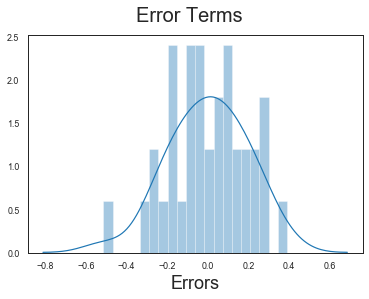

In [427]:
y_train_gmv = lr_3.predict(X_train_rfe)
# Plot the histogram of the error terms
fig = plt.figure()
sns.distplot((y_train['gmv'] - y_train_gmv), bins = 20)
fig.suptitle('Error Terms', fontsize = 20)                  # Plot heading 
plt.xlabel('Errors', fontsize = 18)                         # X-label

As we can see, the error terms are following a normal distribution with mean at 0

**Making the Predictions**

In [428]:
# Splitting the data into predictor and dependent variables
y_test = gamedfmul_test[['gmv']]
X_test = gamedfmul_test.drop('gmv', axis=1)

# Scaling the test variables
X_test[ls]=scaler.transform(X_test[ls])

# Now let's use our model to make predictions.

# Creating X_test_new dataframe by dropping variables from X_test
X_test_new = X_test[X_train_rfe.columns[1:]]

# Adding a constant variable 
X_test_new = sm.add_constant(X_test_new)

# Making predictions
y_pred = lr_3.predict(X_test_new)
y_pred.head()

Week
52    14.978161
75    15.516713
79    14.095414
64    14.965001
33     8.431464
dtype: float64

**Evaluating the Model**

Text(0, 0.5, 'y_pred')

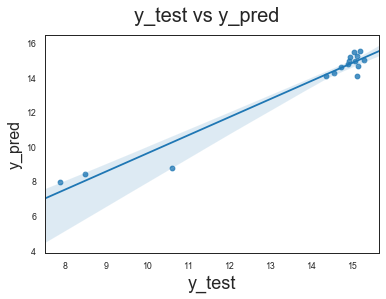

In [429]:
# plot points and fit line
# Plotting y_test and y_pred to understand the spread.
fig = plt.figure()
sns.regplot(y_test,y_pred)
fig.suptitle('y_test vs y_pred', fontsize=20)              # Plot heading 
plt.xlabel('y_test', fontsize=18)                          # X-label
plt.ylabel('y_pred', fontsize=16)                          # Y-label

Based on the above data, we can see that the model predictions seem to be pretty good

In [430]:
# Evaluation metrics
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from statistics import stdev

#Returns the mean squared error; we'll take a square root
print('RMSE:', np.sqrt(mean_squared_error(y_test, y_pred)))
print('R-Squared:', round(r2_score(y_test, y_pred),2))

# Since RMSE is relative to the scale of our y-variable, let's normalize the RMSE by dividing it with the standard deviation
print('Normalized RMSE:', np.sqrt(mean_squared_error(y_test, y_pred))/stdev(y_train['gmv']))

RMSE: 0.5851119628101173
R-Squared: 0.94
Normalized RMSE: 0.3275465322452399


**Plotting the most important features for the Multiplicative Model of the Game Accessory Dataset**

Text(0.5, 0, 'Coefficient')

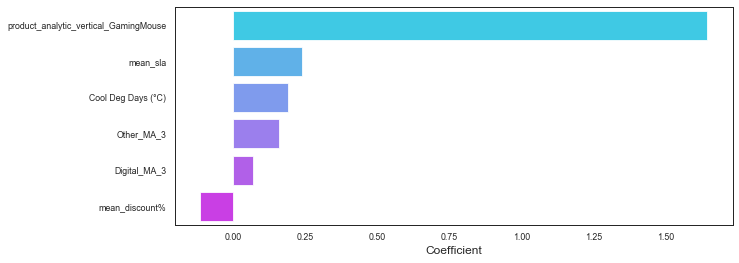

In [431]:
# Getting the coefficients from the model
# The lr_3.summary() is a set of tables, which we can export as html and then use Pandas to convert to a dataframe
df = pd.read_html(lr_3.summary().tables[1].as_html(),header=0,index_col=0)[0]
features = df.reset_index()[['index', 'coef']].sort_values('coef', ascending=False)
features = features.loc[features['index']!='const',:]

plt.figure(figsize=(10,4))
sns.barplot(y = features['index'], x = features['coef'], orient='h', palette='cool')
plt.ylabel('')
plt.xlabel('Coefficient', size=12)

### 3. Koyck Model

The additive and multiplicative models built so far all help capture the current effect of the KPI's. However, it is vital that we capture the carry-over effect too.
The Koyck model is a special type of distributed lag model taht takes into account the carry-over effect of just the dependent variable to model the final output, along with the other KPI's. Therefore, this model tells us that the revenue generated is not just dependent on the current values of the KPI's, but also on the revenue generated in previous periods. The equation that the koyck model follows is: <br><br>
Y = α + μYt-1 + β1At + β2Pt + β3Dt + β4Qt + β5Tt + ϵ<br><br>
Where:<br> A - KPI's related to advertisement<br>
P - KPI's related to pricing<br>
D - KPI's related to promotion/discounts<br>
Q - KPI's related to product assortment/quality<br>
T - KPI's related to industry trends, seasonality etc.

If X1 is the advertising effect, β1 is the current effect of advertising, carry over effect of advertising is β1 * µ/(1-µ).

Therefore the total effect of advertising  = Current effect + Carry over effect

                                            = β1 + β1 * µ/(1-µ)	

											= β1/(1-µ)
        

In [432]:
gameaccess_weekly_koy = gameaccess_weekly.copy()

**Creating a new variable which is the 1 week lag of the dependent variable (gmv)**

In [433]:
# Let's create a udf that performs the lag
# The inputs it will take is dataframe (df), column name (col), shift count (n) and create a new column in the same df
def lag_func(df,col,n):
    for i in col:
        loc_index = df.columns.get_loc(i) + 1
        df.insert(loc=loc_index,column= i+'_lag'+np.str(n),value=df[i].shift(n))
    return df

lag_col = ['gmv']

gameaccess_weekly_koy = lag_func(gameaccess_weekly_koy,lag_col,1) 

gameaccess_weekly_koy.head()

,Week,gmv,gmv_lag1,mean_discount%,mean_sla,mean_product_procurement_sla,total_paydays,total_saledays,total_cod_payments,total_luxury_products,...,Stock Index_MA_5,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
0,27,4.035900e+04,NaN,26.106786,3.000000,2.785714,3,0,0,4,...,0.0,25.500000,13.200000,19.360000,0.100000,1.460000,0.000000,0.0,0.000000,0.0
1,28,2.713578e+06,4.035900e+04,40.072949,5.222445,2.952906,0,0,2188,251,...,0.0,24.833333,15.333333,20.100000,0.283333,2.383333,4.416667,0.0,4.416667,0.0
2,29,2.292193e+06,2.713578e+06,42.438119,5.223435,2.474163,319,748,2070,232,...,0.0,28.750000,17.583333,23.183333,0.000000,5.183333,1.400000,0.0,1.400000,0.0
3,30,2.628684e+06,2.292193e+06,37.051430,5.330929,2.295673,0,0,1898,269,...,0.0,29.750000,16.600000,23.060000,0.000000,5.060000,0.900000,0.0,0.900000,0.0
4,31,1.802954e+06,2.628684e+06,39.901294,5.736499,2.232641,1,0,1318,163,...,1179.9,31.583333,17.500000,24.566667,0.000000,6.566667,4.633333,0.0,4.633333,0.0


In [434]:
# Imputing the nan values with 0
gameaccess_weekly_koy = gameaccess_weekly_koy.fillna(0)

# Setting the week number column as index
gameaccess_weekly_koy = gameaccess_weekly_koy.set_index('Week')

gameaccess_weekly_koy.head()

,gmv,gmv_lag1,mean_discount%,mean_sla,mean_product_procurement_sla,total_paydays,total_saledays,total_cod_payments,total_luxury_products,total_orders,...,Stock Index_MA_5,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
Week,,,,,,,,,,,,,,,,,,,,,
27,4.035900e+04,0.000000e+00,26.106786,3.000000,2.785714,3,0,0,4,28,...,0.0,25.500000,13.200000,19.360000,0.100000,1.460000,0.000000,0.0,0.000000,0.0
28,2.713578e+06,4.035900e+04,40.072949,5.222445,2.952906,0,0,2188,251,2847,...,0.0,24.833333,15.333333,20.100000,0.283333,2.383333,4.416667,0.0,4.416667,0.0
29,2.292193e+06,2.713578e+06,42.438119,5.223435,2.474163,319,748,2070,232,2707,...,0.0,28.750000,17.583333,23.183333,0.000000,5.183333,1.400000,0.0,1.400000,0.0
30,2.628684e+06,2.292193e+06,37.051430,5.330929,2.295673,0,0,1898,269,2453,...,0.0,29.750000,16.600000,23.060000,0.000000,5.060000,0.900000,0.0,0.900000,0.0
31,1.802954e+06,2.628684e+06,39.901294,5.736499,2.232641,1,0,1318,163,1663,...,1179.9,31.583333,17.500000,24.566667,0.000000,6.566667,4.633333,0.0,4.633333,0.0


**Splitting the data into test and train**

In [435]:
from sklearn.model_selection import train_test_split

# We specify this so that the train and test data set always have the same rows, respectively
np.random.seed(1)

gamedfkoy_train, gamedfkoy_test = train_test_split(gameaccess_weekly_koy, train_size = 0.7, test_size = 0.3, random_state = 100)

print(gamedfkoy_train.shape)
print(gamedfkoy_test.shape)

(37, 83)
(16, 83)


**Scaling the features** - Using Standard Scaling as explained in the previous model

In [436]:
# Splitting the data into predictor and dependent variables
y_train = gamedfkoy_train[['gmv']]
X_train = gamedfkoy_train.drop('gmv', axis=1)

# Identifying all the non-binary variables
ls = []

for i in range(len(X_train.columns)):
    if X_train[X_train.columns[i]].nunique()>=3:
        ls.append(X_train.columns[i])

# Applying Standard Scaling to these features
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train[ls]=scaler.fit_transform(X_train[ls])

X_train.describe()

,gmv_lag1,mean_discount%,mean_sla,mean_product_procurement_sla,total_paydays,total_saledays,total_cod_payments,total_luxury_products,total_orders,total_customers,...,Stock Index_MA_5,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
count,3.700000e+01,3.700000e+01,3.700000e+01,3.700000e+01,3.700000e+01,3.700000e+01,3.700000e+01,3.700000e+01,3.700000e+01,3.700000e+01,...,3.700000e+01,3.700000e+01,3.700000e+01,3.700000e+01,3.700000e+01,3.700000e+01,3.700000e+01,3.700000e+01,3.700000e+01,3.700000e+01
mean,-2.160434e-16,2.001402e-15,5.911187e-16,-1.440289e-15,8.101627e-17,-2.550512e-17,-1.680338e-16,-2.760555e-16,-7.201447e-17,-4.800964e-17,...,-4.725949e-16,-1.620325e-16,-4.200844e-17,6.001206e-17,-6.601326e-17,-6.001206e-17,6.001206e-18,-3.300663e-17,2.400482e-17,-1.500301e-17
std,1.013794e+00,1.013794e+00,1.013794e+00,1.013794e+00,1.013794e+00,1.013794e+00,1.013794e+00,1.013794e+00,1.013794e+00,1.013794e+00,...,1.013794e+00,1.013794e+00,1.013794e+00,1.013794e+00,1.013794e+00,1.013794e+00,1.013794e+00,1.013794e+00,1.013794e+00,1.013794e+00
min,-2.100152e+00,-1.914893e+00,-4.855100e+00,-2.922360e+00,-6.302498e-01,-4.037029e-01,-1.717545e+00,-2.592045e+00,-2.071931e+00,-2.084938e+00,...,-3.308219e+00,-1.804465e+00,-1.956451e+00,-1.897642e+00,-1.013686e+00,-7.278189e-01,-8.278113e-01,-2.831045e-01,-7.988661e-01,-2.080795e-01
25%,-4.101256e-01,-6.576067e-01,-3.076340e-01,-4.283983e-01,-6.302498e-01,-4.037029e-01,-3.542407e-01,-6.517282e-01,-5.042467e-01,-4.943015e-01,...,4.820800e-02,-9.467348e-01,-7.394129e-01,-6.676803e-01,-9.521974e-01,-7.278189e-01,-7.854013e-01,-2.831045e-01,-7.602309e-01,-2.080795e-01
50%,1.066801e-01,2.281114e-01,2.736343e-01,1.406958e-01,-6.302498e-01,-4.037029e-01,1.019702e-01,5.838792e-02,-7.132041e-03,9.737824e-03,...,3.498533e-01,2.535959e-02,-1.248692e-01,-1.140708e-02,-1.340321e-01,-7.278189e-01,-4.319849e-01,-2.831045e-01,-4.382705e-01,-2.080795e-01
75%,4.343682e-01,6.913514e-01,4.952847e-01,4.034944e-01,7.212955e-01,-4.037029e-01,3.803587e-01,4.484517e-01,2.008506e-01,2.389618e-01,...,4.408455e-01,8.986850e-01,9.234702e-01,8.839929e-01,5.963952e-01,6.079626e-01,4.821855e-01,-2.831045e-01,3.945336e-01,-2.080795e-01
max,2.666542e+00,1.932597e+00,1.303162e+00,3.355434e+00,4.363201e+00,4.520179e+00,3.736339e+00,2.588802e+00,3.979403e+00,3.940105e+00,...,5.489766e-01,1.491299e+00,1.381366e+00,1.384648e+00,2.130692e+00,2.196058e+00,2.791173e+00,4.606978e+00,3.244956e+00,5.758600e+00


**Building the koyck linear model**

In [437]:
# Fitting a regression line using statsmodels.api
import statsmodels.api as sm

# Add a constant
X_train_lm = sm.add_constant(X_train)

# Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

# Check the summary
print(lr.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                     0.000
Date:                Sun, 22 Dec 2019   Prob (F-statistic):                nan
Time:                        16:00:58   Log-Likelihood:                 649.71
No. Observations:                  37   AIC:                            -1225.
Df Residuals:                       0   BIC:                            -1166.
Df Model:                          36                                         
Covariance Type:            nonrobust                                         
                                                      coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------

**Making the predictions**

In [438]:
# Splitting the data into predictor and dependent variables
y_test = gamedfkoy_test[['gmv']]
X_test = gamedfkoy_test.drop('gmv', axis=1)

# Scaling the test variables
X_test[ls]=scaler.transform(X_test[ls])

# Now let's use our model to make predictions.

# Creating X_test_new dataframe by dropping variables from X_test
X_test_new = X_test[X_train.columns[:]]

# Adding a constant variable 
X_test_new = sm.add_constant(X_test_new)

# Making predictions
y_pred = lr.predict(X_test_new)
y_pred.head()

Week
52    3.891963e+06
75    3.873481e+06
79    1.906384e+06
64    3.586881e+06
33    2.658459e+05
dtype: float64

**Evaluating the model**

Text(0, 0.5, 'y_pred')

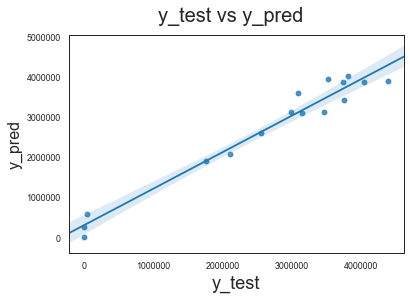

In [439]:
# plot points and fit line
# Plotting y_test and y_pred to understand the spread.
fig = plt.figure()
sns.regplot(y_test,y_pred)
fig.suptitle('y_test vs y_pred', fontsize=20)              # Plot heading 
plt.xlabel('y_test', fontsize=18)                          # X-label
plt.ylabel('y_pred', fontsize=16)                          # Y-label

In [440]:
# Evaluation metrics
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from statistics import stdev

#Returns the mean squared error; we'll take a square root
print('RMSE:', np.sqrt(mean_squared_error(y_test, y_pred)))
print('R-Squared:', round(r2_score(y_test, y_pred),2))

# Since RMSE is relative to the scale of our y-variable, let's normalize the RMSE by dividing it with the standard deviation
print('Normalized RMSE:', np.sqrt(mean_squared_error(y_test, y_pred))/stdev(y_train['gmv']))

RMSE: 293232.4574569864
R-Squared: 0.96
Normalized RMSE: 0.2309609823131012


In [441]:
# Getting the coefficients from the model
# The lr_3.summary() is a set of tables, which we can export as html and then use Pandas to convert to a dataframe
df = pd.read_html(lr.summary().tables[1].as_html(),header=0,index_col=0)[0]
features = df.reset_index()[['index', 'coef']].sort_values('coef', ascending=False)
features = features.loc[features['index']!='const',:]
features

,index,coef
8,total_luxury_products,322900.0
19,product_analytic_vertical_GamingHeadset,221500.0
9,total_orders,149400.0
10,total_customers,143800.0
25,product_analytic_vertical_JoystickGamingWheel,133800.0
...,...,...
62,Radio_MA_5,-62840.0
4,mean_product_procurement_sla,-62890.0
42,Sponsorship_MA_5,-66410.0
2,mean_discount%,-106000.0


**Determining the TOTAL EFFECT of the kpi's from Koyck model**

As mentioned earlier, the total effect of advertising under koyck model = current effect + carry-over effect
= β1 + β1 * µ/(1-µ)	
= β1/(1-µ)

where µ = coefficient of lag variable

In [442]:
# The coefficient of lag variable
lag_coef = features.loc[features['index']=='gmv_lag1', 'coef']
lag_coef

1   -11750.0
Name: coef, dtype: float64

In [443]:
features['Total Effect'] = features['coef']/(1 - (-11750))
features.columns = ['KPI', 'Coefficient', 'Total Effect']
features

,KPI,Coefficient,Total Effect
8,total_luxury_products,322900.0,27.478512
19,product_analytic_vertical_GamingHeadset,221500.0,18.849460
9,total_orders,149400.0,12.713812
10,total_customers,143800.0,12.237256
25,product_analytic_vertical_JoystickGamingWheel,133800.0,11.386265
...,...,...,...
62,Radio_MA_5,-62840.0,-5.347630
4,mean_product_procurement_sla,-62890.0,-5.351885
42,Sponsorship_MA_5,-66410.0,-5.651434
2,mean_discount%,-106000.0,-9.020509


Plotting the most important features off the back of our koyck model

Text(0.5, 0, 'Coefficient')

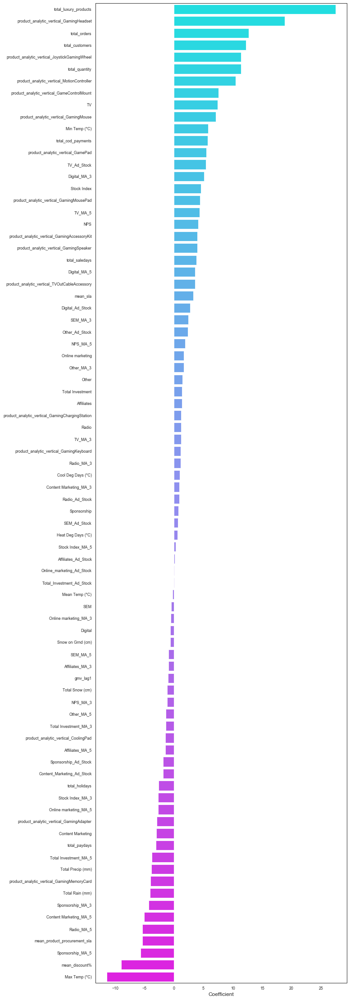

In [444]:
plt.figure(figsize=(10,40))
sns.barplot(y = features['KPI'], x = features['Total Effect'], orient='h', palette='cool')
plt.ylabel('', size=12)
plt.xlabel('Coefficient', size=12)

Clearly there exists a lot of multicollinearity in our data. Let's use **VIF** to detect the correlated variables

In [445]:
# Check for the VIF values of the feature variables. 
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train.columns
vif['VIF'] = [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,gmv_lag1,inf
61,Radio_MA_5,inf
59,Radio,inf
58,SEM_Ad_Stock,inf
57,SEM_MA_5,inf
...,...,...
25,product_analytic_vertical_MotionController,inf
24,product_analytic_vertical_JoystickGamingWheel,inf
23,product_analytic_vertical_GamingSpeaker,inf
81,Snow on Grnd (cm),inf


Considering we're dealing with a really large set of data, it wouldn't be feasible of treating them 1 at a time. In that case, we'll opt for **Recursive Feature Elimination** to come down to about a smaller number of variables that explain the highest variance in the data and exhibit the least multicollinearity. Post that, we'll go into fine-tuning the model manually to end up with the final set of variables

In [446]:
# Importing RFE and LinearRegression
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression

lm = LinearRegression()
lm.fit(X_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

Let's perform RFE using 20 variables and then later fine-tune the model using other features such as the VIF, P-values and adjusted R-squared to identify the final set of variables

In [447]:
# running RFE
rfe = RFE(lm, 20)
rfe = rfe.fit(X_train, y_train)

zip(X_train.columns,rfe.support_,rfe.ranking_)

In [448]:
# Identify all the columns that were returned by our RFE model
col = X_train.columns[rfe.support_]
col

Index(['mean_discount%', 'total_paydays', 'total_cod_payments',
       'total_luxury_products', 'total_orders', 'total_quantity',
       'product_analytic_vertical_GameControlMount',
       'product_analytic_vertical_GamingHeadset',
       'product_analytic_vertical_GamingMemoryCard',
       'product_analytic_vertical_JoystickGamingWheel',
       'product_analytic_vertical_MotionController', 'TV_Ad_Stock',
       'Digital_MA_5', 'Sponsorship_MA_3', 'Sponsorship_MA_5', 'Radio_MA_5',
       'NPS', 'Max Temp (°C)', 'Min Temp (°C)', 'Total Precip (mm)'],
      dtype='object')

Let's now build the model using the above features and check its performance

In [449]:
# Creating X_test dataframe with RFE selected variables
X_train_rfe = X_train[col]
X_train_rfe = sm.add_constant(X_train_rfe)

lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.998
Method:                 Least Squares   F-statistic:                     1024.
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           3.34e-21
Time:                        16:01:32   Log-Likelihood:                -439.63
No. Observations:                  37   AIC:                             921.3
Df Residuals:                      16   BIC:                             955.1
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                                                    coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------

In [450]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
5,total_orders,2257.32
6,total_quantity,1965.59
15,Sponsorship_MA_5,40.35
3,total_cod_payments,31.93
14,Sponsorship_MA_3,22.55
8,product_analytic_vertical_GamingHeadset,19.19
4,total_luxury_products,17.03
17,NPS,14.14
18,Max Temp (°C),14.03
19,Min Temp (°C),10.53


We see that even after reducing the number of vaiables to 20 using RFE, the remaining variables are still able to explain a very high amount of variance in the y variable (evident by the very high R-squared value). Now that we've used RFE to drop all the insignificant variables, let's fine-tune our model by dropping those variable with high VIF or p values 1 at a time until we have a final set of variables that are able to explain a good amount of variance in the revenue variable.

In [451]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('total_orders', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.998
Method:                 Least Squares   F-statistic:                     1098.
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           1.37e-22
Time:                        16:01:36   Log-Likelihood:                -440.41
No. Observations:                  37   AIC:                             920.8
Df Residuals:                      17   BIC:                             953.0
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                                                    coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------

In [452]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('Sponsorship_MA_5', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.998
Method:                 Least Squares   F-statistic:                     1116.
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           8.91e-24
Time:                        16:01:36   Log-Likelihood:                -442.16
No. Observations:                  37   AIC:                             922.3
Df Residuals:                      18   BIC:                             952.9
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                                    coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------

In [453]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('total_quantity', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.987
Model:                            OLS   Adj. R-squared:                  0.976
Method:                 Least Squares   F-statistic:                     87.19
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           1.92e-14
Time:                        16:01:36   Log-Likelihood:                -491.16
No. Observations:                  37   AIC:                             1018.
Df Residuals:                      19   BIC:                             1047.
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                                                    coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------

In [454]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('product_analytic_vertical_GamingHeadset', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.984
Model:                            OLS   Adj. R-squared:                  0.971
Method:                 Least Squares   F-statistic:                     75.77
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           2.22e-14
Time:                        16:01:37   Log-Likelihood:                -495.76
No. Observations:                  37   AIC:                             1026.
Df Residuals:                      20   BIC:                             1053.
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                                                    coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------

In [455]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('Max Temp (°C)', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.978
Model:                            OLS   Adj. R-squared:                  0.963
Method:                 Least Squares   F-statistic:                     63.13
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           4.77e-14
Time:                        16:01:37   Log-Likelihood:                -501.13
No. Observations:                  37   AIC:                             1034.
Df Residuals:                      21   BIC:                             1060.
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                                                    coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------

In [456]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('NPS', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.978
Model:                            OLS   Adj. R-squared:                  0.964
Method:                 Least Squares   F-statistic:                     69.81
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           6.44e-15
Time:                        16:01:44   Log-Likelihood:                -501.40
No. Observations:                  37   AIC:                             1033.
Df Residuals:                      22   BIC:                             1057.
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                                                    coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------

In [457]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('product_analytic_vertical_MotionController', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.978
Model:                            OLS   Adj. R-squared:                  0.966
Method:                 Least Squares   F-statistic:                     78.60
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           7.04e-16
Time:                        16:01:45   Log-Likelihood:                -501.40
No. Observations:                  37   AIC:                             1031.
Df Residuals:                      23   BIC:                             1053.
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                                                    coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------

In [458]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('Min Temp (°C)', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.978
Model:                            OLS   Adj. R-squared:                  0.967
Method:                 Least Squares   F-statistic:                     88.83
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           7.25e-17
Time:                        16:01:45   Log-Likelihood:                -501.41
No. Observations:                  37   AIC:                             1029.
Df Residuals:                      24   BIC:                             1050.
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                                                    coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------

In [459]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('product_analytic_vertical_JoystickGamingWheel', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.977
Model:                            OLS   Adj. R-squared:                  0.967
Method:                 Least Squares   F-statistic:                     96.44
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           1.21e-17
Time:                        16:01:46   Log-Likelihood:                -502.23
No. Observations:                  37   AIC:                             1028.
Df Residuals:                      25   BIC:                             1048.
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                                                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------

In [460]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('Radio_MA_5', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.975
Model:                            OLS   Adj. R-squared:                  0.965
Method:                 Least Squares   F-statistic:                     101.5
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           3.18e-18
Time:                        16:01:48   Log-Likelihood:                -503.74
No. Observations:                  37   AIC:                             1029.
Df Residuals:                      26   BIC:                             1047.
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                                                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------

In [461]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('Digital_MA_5', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.972
Model:                            OLS   Adj. R-squared:                  0.963
Method:                 Least Squares   F-statistic:                     104.3
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           1.29e-18
Time:                        16:01:57   Log-Likelihood:                -505.83
No. Observations:                  37   AIC:                             1032.
Df Residuals:                      27   BIC:                             1048.
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                                                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------

In [462]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('Total Precip (mm)', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.970
Model:                            OLS   Adj. R-squared:                  0.962
Method:                 Least Squares   F-statistic:                     114.5
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           2.56e-19
Time:                        16:01:57   Log-Likelihood:                -506.92
No. Observations:                  37   AIC:                             1032.
Df Residuals:                      28   BIC:                             1046.
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                                                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------

In [463]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('product_analytic_vertical_GameControlMount', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.970
Model:                            OLS   Adj. R-squared:                  0.963
Method:                 Least Squares   F-statistic:                     135.2
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           2.16e-20
Time:                        16:01:58   Log-Likelihood:                -506.96
No. Observations:                  37   AIC:                             1030.
Df Residuals:                      29   BIC:                             1043.
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------

The above variables seem to be significant enough, and the corresponding R-squared value is also high hence we can infer that the variance is being explained pretty well by these variables.<br>
Looking at the F-statistic, it is pretty high and the corresponding p-value is almost 0 suggesting that it is significant.<br>
We've also taken into account the multicollinearity that may exist based on the VIF values.

**Let's go ahead and perform residual analysis to ensure that the assumptions of linear regression are being satisfied**

Text(0.5, 0, 'Errors')

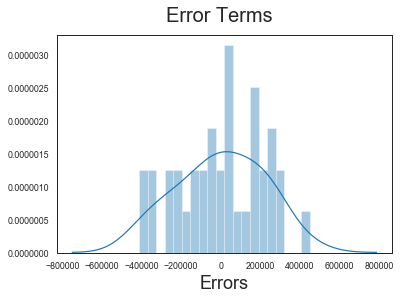

In [464]:
y_train_gmv = lr_3.predict(X_train_rfe)

# Plot the histogram of the error terms
fig = plt.figure()
sns.distplot((y_train['gmv'] - y_train_gmv), bins = 20)
fig.suptitle('Error Terms', fontsize = 20)                  # Plot heading 
plt.xlabel('Errors', fontsize = 18)                         # X-label

As we can see, the error terms are following a normal distribution with mean at 0

**Making the Predictions**

In [465]:
# Splitting the data into predictor and dependent variables
y_test = gamedfkoy_test[['gmv']]
X_test = gamedfkoy_test.drop('gmv', axis=1)

# Scaling the test variables
X_test[ls]=scaler.transform(X_test[ls])

# Now let's use our model to make predictions.

# Creating X_test_new dataframe by dropping variables from X_test
X_test_new = X_test[X_train_rfe.columns[1:]]

# Adding a constant variable 
X_test_new = sm.add_constant(X_test_new, has_constant='add')
# Making predictions
y_pred = lr_3.predict(X_test_new)
y_pred.head()

Week
52    3.776461e+06
75    4.408131e+06
79    1.791441e+06
64    3.962354e+06
33   -1.709473e+05
dtype: float64

**Evaluating the Model**

Text(0, 0.5, 'y_pred')

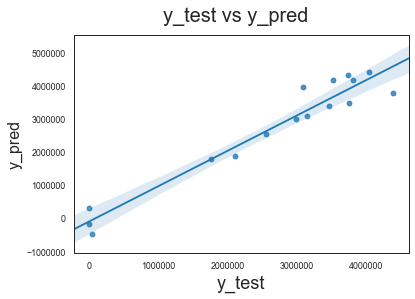

In [466]:
# plot points and fit line
# Plotting y_test and y_pred to understand the spread.
fig = plt.figure()
sns.regplot(y_test,y_pred)
fig.suptitle('y_test vs y_pred', fontsize=20)              # Plot heading 
plt.xlabel('y_test', fontsize=18)                          # X-label
plt.ylabel('y_pred', fontsize=16)                          # Y-label

Based on the above data, we can see that the model predictions seem to be pretty good

In [467]:
# Evaluation metrics
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from statistics import stdev

#Returns the mean squared error; we'll take a square root
print('RMSE:', np.sqrt(mean_squared_error(y_test, y_pred)))
print('R-Squared:', round(r2_score(y_test, y_pred),2))

# Since RMSE is relative to the scale of our y-variable, let's normalize the RMSE by dividing it with the standard deviation
print('Normalized RMSE:', np.sqrt(mean_squared_error(y_test, y_pred))/stdev(y_train['gmv']))

RMSE: 410555.1046720612
R-Squared: 0.92
Normalized RMSE: 0.3233687399104739


**Plotting the most important features for the Tuned Koyck Model of the Game Accessory Dataset**

Text(0.5, 0, 'Coefficient')

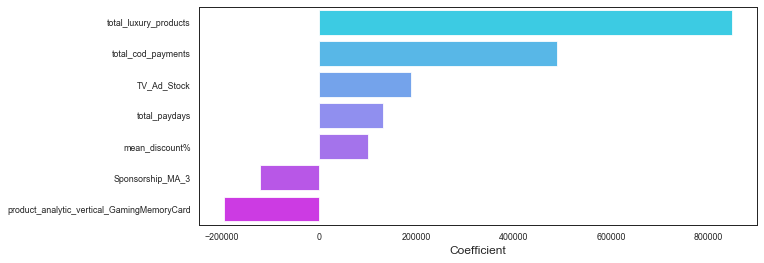

In [468]:
# Getting the coefficients from the model
# The lr_3.summary() is a set of tables, which we can export as html and then use Pandas to convert to a dataframe
df = pd.read_html(lr_3.summary().tables[1].as_html(),header=0,index_col=0)[0]
features = df.reset_index()[['index', 'coef']].sort_values('coef', ascending=False)
features = features.loc[features['index']!='const',:]

plt.figure(figsize=(10,4))
sns.barplot(y = features['index'], x = features['coef'], orient='h', palette='cool')
plt.ylabel('')
plt.xlabel('Coefficient', size=12)

### 4. Distributed Lag Model

The additive and multiplicative models built so far all help capture the current effect of the KPI's. However, it is vital that we capture the carry-over effect too.
The Koyck model that we previously built is a special type of distributed lag model that takes into account the carry-over effect of just the dependent variable to model the final output, along with the other KPI's.

In the distributed lag model, not only is the dependent variable entered in its lagged version, but the independent variables are as well. This is a more generalist model and captures the carry-over effect of all the variables. Thus as mentioned, the Koyck model is a special type of distributed lag model, which includes the lag value of only the dependent variable.

The equation of the distributed lag model is as follows: <br><br>
  __Yt__ = α+ µ1Yt-1 + µ2Yt-2 + µ3Yt-3 + ....

        + β1X1t + β1X1t-1 + β1X1t-2 + ....

        + β2X2t + β2X2t-1 + β2X2t-2 + ....

        + β3X3t + β3X3t-1 + β3X3t-2 + ....

        + β4X4t + β4X4t-1 + β4X4t-2 + ....

        + β5X5t + β5X5t-1 + β5X5t-2 + ....

        + ϵ

In [469]:
gameaccess_weekly_dis = gameaccess_weekly.copy()

# Setting the week number column as index
gameaccess_weekly_dis = gameaccess_weekly_dis.set_index('Week')

In order to create the ditributed lag model, we will create 3 lag variables for every variable in our dataset. This would mean we'll have a 1-week lag, 2-week lag, and 3 week-lag for every variable in our dataset.

In [470]:
# We'll be using the lag function defined earlier to create the lag columns
# The inputs it will take is dataframe (df), column name (col), shift count (n) and create a new column in the same df
def lag_func(df,col,n):
    for i in col:
        loc_index = df.columns.get_loc(i) + 1
        df.insert(loc=loc_index,column= i+'_lag'+np.str(n),value=df[i].shift(n))
    return df
lag_col = list(gameaccess_weekly_dis.columns)

# Introducing 1-week lag
gameaccess_weekly_dis = lag_func(gameaccess_weekly_dis,lag_col,1)

# Introducing 2-week lag
gameaccess_weekly_dis = lag_func(gameaccess_weekly_dis,lag_col,2)

# Introducing 3-week lag
gameaccess_weekly_dis = lag_func(gameaccess_weekly_dis,lag_col,3)

gameaccess_weekly_dis.head()

,gmv,gmv_lag3,gmv_lag2,gmv_lag1,mean_discount%,mean_discount%_lag3,mean_discount%_lag2,mean_discount%_lag1,mean_sla,mean_sla_lag3,...,Total Snow (cm)_lag2,Total Snow (cm)_lag1,Total Precip (mm),Total Precip (mm)_lag3,Total Precip (mm)_lag2,Total Precip (mm)_lag1,Snow on Grnd (cm),Snow on Grnd (cm)_lag3,Snow on Grnd (cm)_lag2,Snow on Grnd (cm)_lag1
Week,,,,,,,,,,,,,,,,,,,,,
27,4.035900e+04,NaN,NaN,NaN,26.106786,NaN,NaN,NaN,3.000000,NaN,...,NaN,NaN,0.000000,NaN,NaN,NaN,0.0,NaN,NaN,NaN
28,2.713578e+06,NaN,NaN,4.035900e+04,40.072949,NaN,NaN,26.106786,5.222445,NaN,...,NaN,0.0,4.416667,NaN,NaN,0.000000,0.0,NaN,NaN,0.0
29,2.292193e+06,NaN,4.035900e+04,2.713578e+06,42.438119,NaN,26.106786,40.072949,5.223435,NaN,...,0.0,0.0,1.400000,NaN,0.000000,4.416667,0.0,NaN,0.0,0.0
30,2.628684e+06,40359.0,2.713578e+06,2.292193e+06,37.051430,26.106786,40.072949,42.438119,5.330929,3.000000,...,0.0,0.0,0.900000,0.000000,4.416667,1.400000,0.0,0.0,0.0,0.0
31,1.802954e+06,2713578.0,2.292193e+06,2.628684e+06,39.901294,40.072949,42.438119,37.051430,5.736499,5.222445,...,0.0,0.0,4.633333,4.416667,1.400000,0.900000,0.0,0.0,0.0,0.0


In [471]:
# Replacing all the nan values with 0
gameaccess_weekly_dis = gameaccess_weekly_dis.fillna(0)
gameaccess_weekly_dis.head()

,gmv,gmv_lag3,gmv_lag2,gmv_lag1,mean_discount%,mean_discount%_lag3,mean_discount%_lag2,mean_discount%_lag1,mean_sla,mean_sla_lag3,...,Total Snow (cm)_lag2,Total Snow (cm)_lag1,Total Precip (mm),Total Precip (mm)_lag3,Total Precip (mm)_lag2,Total Precip (mm)_lag1,Snow on Grnd (cm),Snow on Grnd (cm)_lag3,Snow on Grnd (cm)_lag2,Snow on Grnd (cm)_lag1
Week,,,,,,,,,,,,,,,,,,,,,
27,4.035900e+04,0.0,0.000000e+00,0.000000e+00,26.106786,0.000000,0.000000,0.000000,3.000000,0.000000,...,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0
28,2.713578e+06,0.0,0.000000e+00,4.035900e+04,40.072949,0.000000,0.000000,26.106786,5.222445,0.000000,...,0.0,0.0,4.416667,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0
29,2.292193e+06,0.0,4.035900e+04,2.713578e+06,42.438119,0.000000,26.106786,40.072949,5.223435,0.000000,...,0.0,0.0,1.400000,0.000000,0.000000,4.416667,0.0,0.0,0.0,0.0
30,2.628684e+06,40359.0,2.713578e+06,2.292193e+06,37.051430,26.106786,40.072949,42.438119,5.330929,3.000000,...,0.0,0.0,0.900000,0.000000,4.416667,1.400000,0.0,0.0,0.0,0.0
31,1.802954e+06,2713578.0,2.292193e+06,2.628684e+06,39.901294,40.072949,42.438119,37.051430,5.736499,5.222445,...,0.0,0.0,4.633333,4.416667,1.400000,0.900000,0.0,0.0,0.0,0.0


**Splitting the data into test and train**

In [472]:
from sklearn.model_selection import train_test_split

# We specify this so that the train and test data set always have the same rows, respectively
np.random.seed(1)

gamedfdis_train, gamedfdis_test = train_test_split(gameaccess_weekly_dis, train_size = 0.7, test_size = 0.3, random_state = 100)

print(gamedfdis_train.shape)
print(gamedfdis_test.shape)

(37, 328)
(16, 328)


**Scaling the features** - Using Standard Scaling as explained in the previous model

In [473]:
# Splitting the data into predictor and dependent variables
y_train = gamedfdis_train[['gmv']]
X_train = gamedfdis_train.drop('gmv', axis=1)

# Identifying all the non-binary variables
ls = []

for i in range(len(X_train.columns)):
    if X_train[X_train.columns[i]].nunique()>=3:
        ls.append(X_train.columns[i])

# Applying Standard Scaling to these features
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train[ls]=scaler.fit_transform(X_train[ls])

X_train.describe()

,gmv_lag3,gmv_lag2,gmv_lag1,mean_discount%,mean_discount%_lag3,mean_discount%_lag2,mean_discount%_lag1,mean_sla,mean_sla_lag3,mean_sla_lag2,...,Total Snow (cm)_lag2,Total Snow (cm)_lag1,Total Precip (mm),Total Precip (mm)_lag3,Total Precip (mm)_lag2,Total Precip (mm)_lag1,Snow on Grnd (cm),Snow on Grnd (cm)_lag3,Snow on Grnd (cm)_lag2,Snow on Grnd (cm)_lag1
count,3.700000e+01,3.700000e+01,3.700000e+01,3.700000e+01,3.700000e+01,3.700000e+01,3.700000e+01,3.700000e+01,3.700000e+01,3.700000e+01,...,3.700000e+01,3.700000e+01,3.700000e+01,3.700000e+01,3.700000e+01,3.700000e+01,3.700000e+01,3.700000e+01,3.700000e+01,3.700000e+01
mean,3.000603e-17,1.680338e-16,-2.160434e-16,2.001402e-15,-6.601326e-16,6.451296e-16,-1.170235e-16,5.911187e-16,2.250452e-16,1.134228e-15,...,1.080217e-16,-9.601929e-17,2.400482e-17,-2.700542e-17,-8.176643e-17,-1.050211e-16,-1.500301e-17,5.701145e-17,1.140229e-16,-2.250452e-17
std,1.013794e+00,1.013794e+00,1.013794e+00,1.013794e+00,1.013794e+00,1.013794e+00,1.013794e+00,1.013794e+00,1.013794e+00,1.013794e+00,...,1.013794e+00,1.013794e+00,1.013794e+00,1.013794e+00,1.013794e+00,1.013794e+00,1.013794e+00,1.013794e+00,1.013794e+00,1.013794e+00
min,-1.951101e+00,-1.825168e+00,-2.100152e+00,-1.914893e+00,-3.718249e+00,-4.913385e+00,-3.637334e+00,-4.855100e+00,-3.631606e+00,-4.645485e+00,...,-3.829327e-01,-3.401813e-01,-7.988661e-01,-9.126764e-01,-8.438361e-01,-8.243947e-01,-2.080795e-01,-2.928769e-01,-2.619462e-01,-2.425433e-01
25%,-2.589334e-01,-2.732321e-01,-4.101256e-01,-6.576067e-01,-1.016487e-01,-1.482314e-01,-6.224445e-01,-3.076340e-01,1.281925e-01,3.030586e-02,...,-3.829327e-01,-3.401813e-01,-7.602309e-01,-8.285927e-01,-7.692114e-01,-8.243947e-01,-2.080795e-01,-2.928769e-01,-2.619462e-01,-2.425433e-01
50%,1.252272e-01,7.818906e-02,1.066801e-01,2.281114e-01,8.495413e-02,1.960318e-01,2.239437e-01,2.736343e-01,3.270350e-01,2.904931e-01,...,-3.829327e-01,-3.401813e-01,-4.382705e-01,-2.119792e-01,-2.219636e-01,-3.905678e-01,-2.080795e-01,-2.928769e-01,-2.619462e-01,-2.425433e-01
75%,6.562295e-01,4.168230e-01,4.343682e-01,6.913514e-01,4.852121e-01,4.740077e-01,5.586124e-01,4.952847e-01,4.477544e-01,4.414986e-01,...,-3.829327e-01,-3.401813e-01,3.945336e-01,4.787079e-01,3.332798e-01,4.770860e-01,-2.080795e-01,-2.928769e-01,-2.619462e-01,-2.425433e-01
max,1.840014e+00,2.679407e+00,2.666542e+00,1.932597e+00,1.270062e+00,1.451529e+00,1.801458e+00,1.303162e+00,8.081452e-01,8.759142e-01,...,3.283595e+00,3.759088e+00,3.244956e+00,2.931148e+00,3.340478e+00,3.142023e+00,5.758600e+00,3.970642e+00,5.600538e+00,5.772531e+00


**Building the distributed lag model**

In [474]:
# Fitting a regression line using statsmodels.api
import statsmodels.api as sm

# Add a constant
X_train_lm = sm.add_constant(X_train)

# Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

# Check the summary
print(lr.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                     0.000
Date:                Sun, 22 Dec 2019   Prob (F-statistic):                nan
Time:                        16:02:32   Log-Likelihood:                 633.09
No. Observations:                  37   AIC:                            -1192.
Df Residuals:                       0   BIC:                            -1133.
Df Model:                          36                                         
Covariance Type:            nonrobust                                         
                                                           coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------

**Making the Predictions**

In [475]:
# Splitting the data into predictor and dependent variables
y_test = gamedfdis_test[['gmv']]
X_test = gamedfdis_test.drop('gmv', axis=1)

# Scaling the test variables
X_test[ls]=scaler.transform(X_test[ls])

# Now let's use our model to make predictions.

# Creating X_test_new dataframe by dropping variables from X_test
X_test_new = X_test[X_train.columns[:]]

# Adding a constant variable 
X_test_new = sm.add_constant(X_test_new, has_constant='add')

# Making predictions
y_pred = lr.predict(X_test_new)
y_pred.head()

Week
52    3.947344e+06
75    4.219894e+06
79    2.068903e+06
64    3.326737e+06
33    2.412544e+05
dtype: float64

**Evaluating the model**

Text(0, 0.5, 'y_pred')

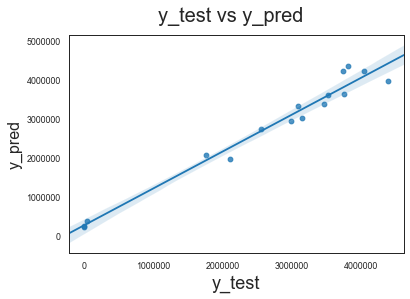

In [476]:
# plot points and fit line
# Plotting y_test and y_pred to understand the spread.
fig = plt.figure()
sns.regplot(y_test,y_pred)
fig.suptitle('y_test vs y_pred', fontsize=20)              # Plot heading 
plt.xlabel('y_test', fontsize=18)                          # X-label
plt.ylabel('y_pred', fontsize=16)                          # Y-label

In [477]:
# Evaluation metrics
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from statistics import stdev

#Returns the mean squared error; we'll take a square root
print('RMSE:', np.sqrt(mean_squared_error(y_test, y_pred)))
print('R-Squared:', round(r2_score(y_test, y_pred),2))

# Since RMSE is relative to the scale of our y-variable, let's normalize the RMSE by dividing it with the standard deviation
print('Normalized RMSE:', np.sqrt(mean_squared_error(y_test, y_pred))/stdev(y_train['gmv']))

RMSE: 275110.1244501922
R-Squared: 0.96
Normalized RMSE: 0.21668714690840934


Plotting the most important features off the back of our vanilla model

Text(0.5, 0, 'Coefficient')

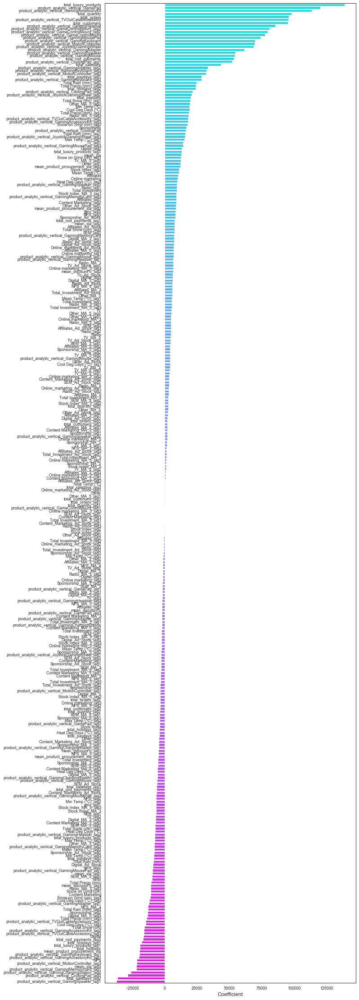

In [478]:
# Getting the coefficients from the model
# The lr_3.summary() is a set of tables, which we can export as html and then use Pandas to convert to a dataframe
df = pd.read_html(lr.summary().tables[1].as_html(),header=0,index_col=0)[0]
features = df.reset_index()[['index', 'coef']].sort_values('coef', ascending=False)
features = features.loc[features['index']!='const',:]

plt.figure(figsize=(10,40))
sns.barplot(y = features['index'], x = features['coef'], orient='h', palette='cool')
plt.ylabel('', size=12)
plt.xlabel('Coefficient', size=12)

Clearly there exists a lot of multicollinearity in our data. Let's use **VIF** to detect the correlated variables

In [479]:
# Check for the VIF values of the feature variables. 
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train.columns
vif['VIF'] = [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,gmv_lag3,inf
205,Affiliates_lag2,inf
223,SEM_MA_3,inf
222,SEM_lag1,inf
221,SEM_lag2,inf
...,...,...
107,Total Investment,inf
106,product_analytic_vertical_TVOutCableAccessory_...,inf
105,product_analytic_vertical_TVOutCableAccessory_...,inf
326,Snow on Grnd (cm)_lag1,inf


Considering we're dealing with a really large set of data, it wouldn't be feasible of treating them 1 at a time. In that case, we'll opt for **Recursive Feature Elimination** to come down to about a smaller number of variables that explain the highest variance in the data and exhibit the least multicollinearity. Post that, we'll go into fine-tuning the model manually to end up with the final set of variables

In [480]:
# Importing RFE and LinearRegression
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression

lm = LinearRegression()
lm.fit(X_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

Let's perform RFE using 20 variables and then later fine-tune the model using other features such as the VIF, P-values and adjusted R-squared to identify the final set of variables

In [481]:
# running RFE
rfe = RFE(lm, 20)
rfe = rfe.fit(X_train, y_train)

zip(X_train.columns,rfe.support_,rfe.ranking_)

In [482]:
# Identify all the columns that were returned by our RFE model
col = X_train.columns[rfe.support_]
col

Index(['mean_sla_lag3', 'total_saledays', 'total_cod_payments',
       'total_luxury_products', 'total_customers', 'total_quantity',
       'total_holidays_lag1', 'product_analytic_vertical_CoolingPad_lag1',
       'product_analytic_vertical_GamingAdapter',
       'product_analytic_vertical_GamingAdapter_lag2',
       'product_analytic_vertical_GamingHeadset',
       'product_analytic_vertical_GamingMousePad',
       'product_analytic_vertical_GamingSpeaker_lag1',
       'product_analytic_vertical_JoystickGamingWheel',
       'product_analytic_vertical_TVOutCableAccessory', 'Radio_MA_3_lag3',
       'Other_lag1', 'Heat Deg Days (°C)_lag3', 'Total Precip (mm)_lag2',
       'Snow on Grnd (cm)_lag3'],
      dtype='object')

Let's now build the model using the above features and check its performance

In [483]:
# Creating X_test dataframe with RFE selected variables
X_train_rfe = X_train[col]
X_train_rfe = sm.add_constant(X_train_rfe)

lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.996
Method:                 Least Squares   F-statistic:                     454.3
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           2.18e-18
Time:                        16:02:52   Log-Likelihood:                -454.64
No. Observations:                  37   AIC:                             951.3
Df Residuals:                      16   BIC:                             985.1
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                                                    coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------

In [484]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
5,total_customers,2446.57
6,total_quantity,1729.22
14,product_analytic_vertical_JoystickGamingWheel,22.48
11,product_analytic_vertical_GamingHeadset,22.38
3,total_cod_payments,22.26
4,total_luxury_products,18.78
12,product_analytic_vertical_GamingMousePad,16.98
18,Heat Deg Days (°C)_lag3,9.04
15,product_analytic_vertical_TVOutCableAccessory,8.34
2,total_saledays,7.18


We see that even after reducing the number of vaiables to 20 using RFE, the remaining variables are still able to explain a very high amount of variance in the y variable (evident by the very high R-squared value). Now that we've used RFE to drop all the insignificant variables, let's fine-tune our model by dropping those variable with high VIF or p values 1 at a time until we have a final set of variables that are able to explain a good amount of variance in the revenue variable.

In [485]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('total_customers', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.996
Method:                 Least Squares   F-statistic:                     465.9
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           1.96e-19
Time:                        16:02:56   Log-Likelihood:                -456.24
No. Observations:                  37   AIC:                             952.5
Df Residuals:                      17   BIC:                             984.7
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                                                    coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------

In [486]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('total_quantity', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.994
Method:                 Least Squares   F-statistic:                     340.1
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           3.81e-19
Time:                        16:02:57   Log-Likelihood:                -464.11
No. Observations:                  37   AIC:                             966.2
Df Residuals:                      18   BIC:                             996.8
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                                    coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------

In [487]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('total_luxury_products', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.992
Model:                            OLS   Adj. R-squared:                  0.984
Method:                 Least Squares   F-statistic:                     134.3
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           3.40e-16
Time:                        16:02:57   Log-Likelihood:                -483.25
No. Observations:                  37   AIC:                             1002.
Df Residuals:                      19   BIC:                             1031.
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                                                    coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------

In [488]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('product_analytic_vertical_GamingHeadset', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.987
Model:                            OLS   Adj. R-squared:                  0.977
Method:                 Least Squares   F-statistic:                     97.74
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           1.85e-15
Time:                        16:02:57   Log-Likelihood:                -491.12
No. Observations:                  37   AIC:                             1016.
Df Residuals:                      20   BIC:                             1044.
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                                                    coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------

In [489]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('total_holidays_lag1', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.987
Model:                            OLS   Adj. R-squared:                  0.978
Method:                 Least Squares   F-statistic:                     109.1
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           1.78e-16
Time:                        16:02:58   Log-Likelihood:                -491.18
No. Observations:                  37   AIC:                             1014.
Df Residuals:                      21   BIC:                             1040.
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                                                    coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------

In [490]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('product_analytic_vertical_GamingAdapter', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.987
Model:                            OLS   Adj. R-squared:                  0.979
Method:                 Least Squares   F-statistic:                     121.9
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           1.64e-17
Time:                        16:02:58   Log-Likelihood:                -491.27
No. Observations:                  37   AIC:                             1013.
Df Residuals:                      22   BIC:                             1037.
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                                                    coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------

In [491]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('Snow on Grnd (cm)_lag3', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.985
Model:                            OLS   Adj. R-squared:                  0.976
Method:                 Least Squares   F-statistic:                     114.0
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           1.09e-17
Time:                        16:02:59   Log-Likelihood:                -494.64
No. Observations:                  37   AIC:                             1017.
Df Residuals:                      23   BIC:                             1040.
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                                                    coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------

In [492]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('Radio_MA_3_lag3', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.983
Model:                            OLS   Adj. R-squared:                  0.974
Method:                 Least Squares   F-statistic:                     113.3
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           4.25e-18
Time:                        16:03:05   Log-Likelihood:                -497.00
No. Observations:                  37   AIC:                             1020.
Df Residuals:                      24   BIC:                             1041.
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                                                    coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------

The above variables seem to be significant enough, and the corresponding R-squared value is also high hence we can infer that the variance is being explained pretty well by these variables.<br>
Looking at the F-statistic, it is pretty high and the corresponding p-value is almost 0 suggesting that it is significant.<br>
We've also taken into account the multicollinearity that may exist based on the VIF values.

**Let's go ahead and perform residual analysis to ensure that the assumptions of linear regression are being satisfied**

Text(0.5, 0, 'Errors')

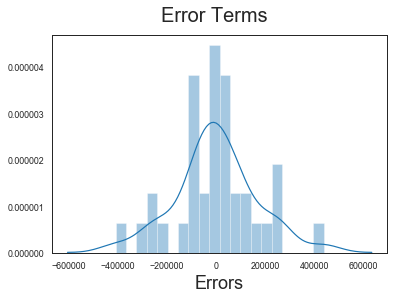

In [493]:
y_train_gmv = lr_3.predict(X_train_rfe)

# Plot the histogram of the error terms
fig = plt.figure()
sns.distplot((y_train['gmv'] - y_train_gmv), bins = 20)
fig.suptitle('Error Terms', fontsize = 20)                  # Plot heading 
plt.xlabel('Errors', fontsize = 18)                         # X-label

As we can see, the error terms are following a normal distribution with mean at 0

**Making the Predictions**

In [494]:
# Splitting the data into predictor and dependent variables
y_test = gamedfdis_test[['gmv']]
X_test = gamedfdis_test.drop('gmv', axis=1)

# Scaling the test variables
X_test[ls]=scaler.transform(X_test[ls])

# Now let's use our model to make predictions.

# Creating X_test_new dataframe by dropping variables from X_test
X_test_new = X_test[X_train_rfe.columns[1:]]

# Adding a constant variable 
X_test_new = sm.add_constant(X_test_new, has_constant='add')
# Making predictions
y_pred = lr_3.predict(X_test_new)
y_pred.head()

Week
52    3.372072e+06
75    4.159485e+06
79    2.155319e+06
64    3.489316e+06
33    4.252503e+05
dtype: float64

**Evaluating the Model**

Text(0, 0.5, 'y_pred')

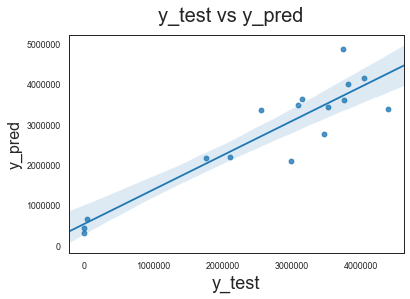

In [495]:
# plot points and fit line
# Plotting y_test and y_pred to understand the spread.
fig = plt.figure()
sns.regplot(y_test,y_pred)
fig.suptitle('y_test vs y_pred', fontsize=20)              # Plot heading 
plt.xlabel('y_test', fontsize=18)                          # X-label
plt.ylabel('y_pred', fontsize=16)                          # Y-label

Based on the above data, we can see that the model predictions seem to be pretty good

In [496]:
# Evaluation metrics
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from statistics import stdev

#Returns the mean squared error; we'll take a square root
print('RMSE:', np.sqrt(mean_squared_error(y_test, y_pred)))
print('R-Squared:', round(r2_score(y_test, y_pred),2))

# Since RMSE is relative to the scale of our y-variable, let's normalize the RMSE by dividing it with the standard deviation
print('Normalized RMSE:', round(np.sqrt(mean_squared_error(y_test, y_pred))/stdev(y_train['gmv']),2))

RMSE: 589818.1458948369
R-Squared: 0.83
Normalized RMSE: 0.46


**Plotting the most important features for the Tuned Distributed Lag Model of the Game Accessory Dataset**

Text(0.5, 0, 'Coefficient')

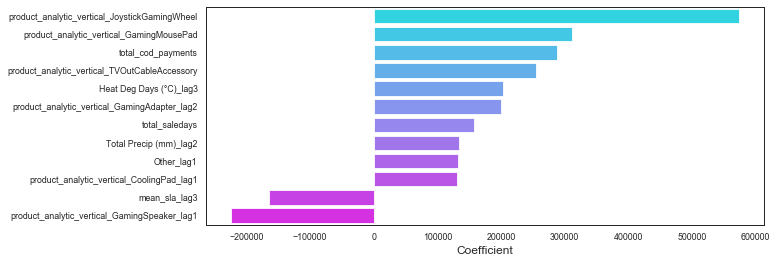

In [497]:
# Getting the coefficients from the model
# The lr_3.summary() is a set of tables, which we can export as html and then use Pandas to convert to a dataframe
df = pd.read_html(lr_3.summary().tables[1].as_html(),header=0,index_col=0)[0]
features = df.reset_index()[['index', 'coef']].sort_values('coef', ascending=False)
features = features.loc[features['index']!='const',:]

plt.figure(figsize=(10,4))
sns.barplot(y = features['index'], x = features['coef'], orient='h', palette='cool')
plt.ylabel('')
plt.xlabel('Coefficient', size=12)

------
<br>

## Home Audio Models

Let's now create the marketing mix models for the Home Audio dataset. Before we jump into the different models, we first need to ensure that the data is prepared for modelling

In [498]:
homeaud_weekly.head()

,Week,gmv,mean_discount%,mean_sla,mean_product_procurement_sla,total_paydays,total_saledays,total_cod_payments,total_luxury_products,total_orders,...,Stock Index_MA_5,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
0,27,1.147430e+05,36.795122,2.707317,3.341463,3,0,1,24,40,...,0.0,25.500000,13.200000,19.360000,0.100000,1.460000,0.000000,0.0,0.000000,0.0
1,28,4.599818e+06,32.379463,7.178711,2.753418,0,0,1534,757,2044,...,0.0,24.833333,15.333333,20.100000,0.283333,2.383333,4.416667,0.0,4.416667,0.0
2,29,5.385425e+06,33.801071,6.926139,2.673779,347,670,1845,858,2428,...,0.0,28.750000,17.583333,23.183333,0.000000,5.183333,1.400000,0.0,1.400000,0.0
3,30,4.722155e+06,33.586682,7.048438,2.739249,0,0,1722,685,2199,...,0.0,29.750000,16.600000,23.060000,0.000000,5.060000,0.900000,0.0,0.900000,0.0
4,31,3.421038e+06,33.208560,7.163882,2.670308,0,0,1192,520,1554,...,1179.9,31.583333,17.500000,24.566667,0.000000,6.566667,4.633333,0.0,4.633333,0.0


In [499]:
homeaud_weekly.describe()

,Week,gmv,mean_discount%,mean_sla,mean_product_procurement_sla,total_paydays,total_saledays,total_cod_payments,total_luxury_products,total_orders,...,Stock Index_MA_5,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
count,50.000000,5.000000e+01,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,...,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000
mean,54.140000,4.838288e+06,37.481973,5.593048,2.589098,138.560000,424.580000,1669.980000,782.680000,2196.860000,...,1066.552000,16.858833,6.439006,11.928625,7.463339,1.391964,2.594638,0.266857,2.861495,0.408333
std,15.153648,2.782645e+06,4.676400,0.975272,0.217137,193.561693,987.324546,967.109695,415.285122,1153.595497,...,323.039003,9.604773,8.297886,8.672201,7.099011,2.141026,3.281494,0.754640,3.568567,1.566754
min,27.000000,2.599000e+03,16.130000,2.707317,1.790194,0.000000,0.000000,0.000000,1.000000,1.000000,...,0.000000,-2.833333,-11.666667,-7.266667,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,42.250000,3.549343e+06,35.274719,4.984748,2.520800,0.000000,0.000000,1272.500000,559.250000,1679.000000,...,1088.625000,8.312500,-0.625000,5.808750,0.318750,0.000000,0.285000,0.000000,0.300000,0.000000
50%,54.500000,4.425740e+06,37.156335,5.597841,2.598282,0.000000,0.000000,1634.500000,678.000000,2087.000000,...,1166.900000,17.125000,6.000000,12.160000,6.567518,0.000000,1.050000,0.000000,1.560000,0.000000
75%,66.750000,5.447208e+06,39.671761,5.944337,2.686302,281.750000,173.250000,1951.750000,937.750000,2478.000000,...,1209.300000,25.333333,14.406250,20.075000,12.191250,2.485833,4.080000,0.000000,4.237500,0.000000
max,79.000000,1.958721e+07,47.160297,9.000000,3.341463,977.000000,5491.000000,5964.000000,2374.000000,8008.000000,...,1237.800000,32.250000,18.700000,24.566667,25.266667,6.566667,12.800000,3.000000,15.700000,10.333333


In [500]:
# Checking for any null values in the dataset
sum(homeaud_weekly.isnull().sum()!=0)

0

Plotting the correlation heatmap for all variables to check for any one-to-one variable collinearity

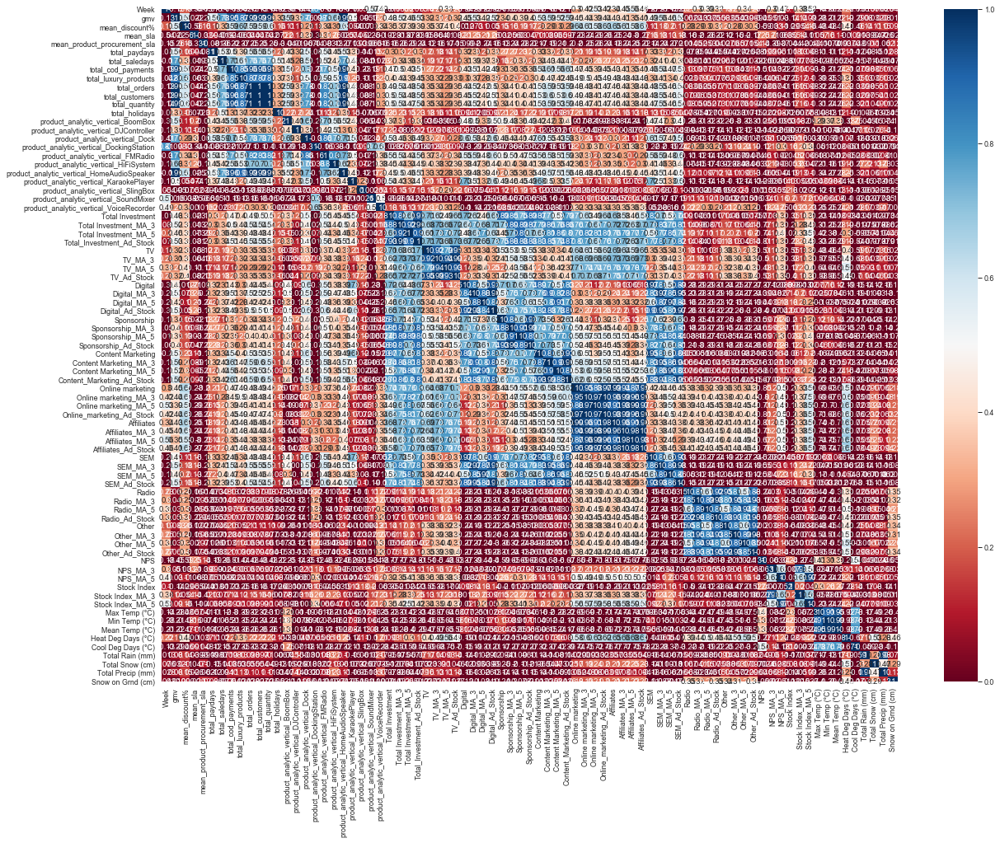

In [501]:
homeaud_corr = homeaud_weekly.corr()

plt.figure(figsize=(20,15))
sns.heatmap(homeaud_corr,vmin=0,vmax=1,annot=True,cmap='RdBu')

Considering we have about 79 variables, it won't be feasible to start looking at multicollinearity for each variable. Let's go ahead with building the model using Recursive Feature Elimination, and using the VIF metric to identify the variables show high multi-collinearity

**Splitting the data into Test and Train**

In [502]:
from sklearn.model_selection import train_test_split

# We specify this so that the train and test data set always have the same rows, respectively
np.random.seed(1)
HomeAud_train, HomeAud_test = train_test_split(homeaud_weekly, train_size = 0.7, test_size = 0.3, random_state = 100)

In [503]:
print(HomeAud_train.shape)
print(HomeAud_test.shape)

(35, 79)
(15, 79)


**Standard Scaling**

For all the non-binary features, let's use standard scaling to bring them to follow a gaussian distribution (mean-0, sigma-1). This is done to ensure all the variables will have a comparable scale, and hence the gradient descent procedure for the model will be a lot more optimized.


In [504]:
# Dropping the week variable
HomeAud_train = HomeAud_train.drop('Week', axis=1)
HomeAud_test = HomeAud_test.drop('Week', axis=1)

# Splitting the data into predictor and dependent variables
y_train = HomeAud_train[['gmv']]
X_train = HomeAud_train.drop('gmv', axis=1)

# Identifying all the non-binary variables
ls = []

for i in range(len(X_train.columns)):
    if X_train[X_train.columns[i]].nunique()>=3:
        ls.append(X_train.columns[i])

# Applying Standard Scaling to these features
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train[ls]=scaler.fit_transform(X_train[ls])

X_train.describe()

,mean_discount%,mean_sla,mean_product_procurement_sla,total_paydays,total_saledays,total_cod_payments,total_luxury_products,total_orders,total_customers,total_quantity,...,Stock Index_MA_5,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
count,3.500000e+01,3.500000e+01,3.500000e+01,3.500000e+01,3.500000e+01,3.500000e+01,3.500000e+01,3.500000e+01,3.500000e+01,3.500000e+01,...,3.500000e+01,3.500000e+01,3.500000e+01,3.500000e+01,3.500000e+01,3.500000e+01,3.500000e+01,3.500000e+01,3.500000e+01,3.500000e+01
mean,-3.616155e-16,-6.217249e-16,1.194283e-15,3.172066e-17,1.586033e-17,6.026925e-17,1.586033e-16,6.026925e-17,-6.344132e-18,-7.295751e-17,...,8.263231e-16,2.220446e-17,6.344132e-18,-1.268826e-16,-1.141944e-16,-3.489272e-17,1.903239e-17,2.537653e-17,-1.205385e-16,-1.681195e-16
std,1.014599e+00,1.014599e+00,1.014599e+00,1.014599e+00,1.014599e+00,1.014599e+00,1.014599e+00,1.014599e+00,1.014599e+00,1.014599e+00,...,1.014599e+00,1.014599e+00,1.014599e+00,1.014599e+00,1.014599e+00,1.014599e+00,1.014599e+00,1.014599e+00,1.014599e+00,1.014599e+00
min,-1.540690e+00,-2.005310e+00,-4.198316e+00,-7.281722e-01,-4.814903e-01,-2.041496e+00,-1.373387e+00,-1.499825e+00,-1.503778e+00,-1.468575e+00,...,-3.213740e+00,-1.907427e+00,-2.023723e+00,-2.059753e+00,-1.076682e+00,-6.745477e-01,-7.580783e-01,-4.016244e-01,-7.703116e-01,-3.194478e-01
25%,-6.921982e-01,-6.416639e-01,-4.401943e-01,-7.281722e-01,-4.814903e-01,-5.046531e-01,-6.395737e-01,-5.175855e-01,-5.119829e-01,-5.173913e-01,...,8.994413e-02,-8.828562e-01,-9.222353e-01,-8.394793e-01,-1.010563e+00,-6.745477e-01,-6.613067e-01,-4.016244e-01,-6.750658e-01,-3.194478e-01
50%,-1.672424e-01,-4.531255e-02,1.440282e-01,-7.281722e-01,-4.814903e-01,-1.130832e-01,-1.806254e-01,-1.793947e-01,-1.672907e-01,-1.928596e-01,...,2.987802e-01,-3.080024e-02,1.571297e-02,6.870036e-02,-1.358974e-01,-6.745477e-01,-4.647075e-01,-4.016244e-01,-3.893285e-01,-3.194478e-01
75%,5.565684e-01,7.311012e-01,5.763499e-01,7.066465e-01,-5.574391e-02,1.085287e-01,2.278891e-01,6.485424e-02,7.353435e-02,6.185250e-02,...,4.571552e-01,8.822671e-01,9.753062e-01,9.705937e-01,8.257694e-01,5.283195e-01,3.145587e-01,-4.016244e-01,3.368072e-01,-3.194478e-01
max,2.307751e+00,1.937057e+00,1.372713e+00,3.960182e+00,4.471420e+00,4.534657e+00,3.836434e+00,4.882981e+00,4.915772e+00,4.861732e+00,...,5.489580e-01,1.579901e+00,1.352891e+00,1.471646e+00,2.292613e+00,2.547272e+00,3.153532e+00,3.040870e+00,3.502142e+00,5.339342e+00


### 1. Basic Linear Additive Model

The linear model assumes that all the different KPI's are additive in nature and contribute linearly to the revenue generated by the company. The equation that the linear model follows is: <br><br>
Y = α + β1At + β2Pt + β3Dt + β4Qt + β5Tt + ϵ<br><br>
Where:<br> A - KPI's related to advertisement<br>
P - KPI's related to pricing<br>
D - KPI's related to promotion/discounts<br>
Q - KPI's related to product assortment/quality<br>
T - KPI's related to industry trends, seasonality etc.

In [505]:
# Fitting a regression line using statsmodels.api
import statsmodels.api as sm

# Add a constant
X_train_lm = sm.add_constant(X_train)

# Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

In [506]:
print(lr.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                     0.000
Date:                Sun, 22 Dec 2019   Prob (F-statistic):                nan
Time:                        16:04:33   Log-Likelihood:                 580.12
No. Observations:                  35   AIC:                            -1090.
Df Residuals:                       0   BIC:                            -1036.
Df Model:                          34                                         
Covariance Type:            nonrobust                                         
                                                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------

**Making the Predictions**

In [507]:
# Splitting the data into predictor and dependent variables
y_test = HomeAud_test[['gmv']]
X_test = HomeAud_test.drop('gmv', axis=1)

# Scaling the test variables
X_test[ls]=scaler.transform(X_test[ls])

# Now let's use our model to make predictions.

# Creating X_test_new dataframe by dropping variables from X_test
X_test_new = X_test[X_train.columns[:]]

# Adding a constant variable 
X_test_new = sm.add_constant(X_test_new, has_constant='add')

# Making predictions
y_pred = lr.predict(X_test_new)
y_pred.head()

6     3.760302e+06
36    3.435100e+06
37    2.872270e+06
28    7.561971e+06
43    3.310731e+06
dtype: float64

**Evaluating the model**

Text(0, 0.5, 'y_pred')

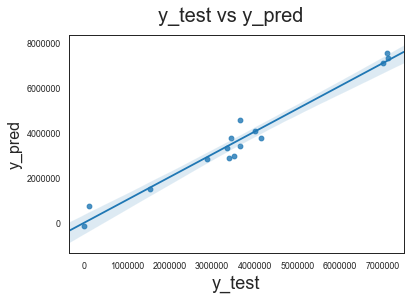

In [508]:
# plot points and fit line
# Plotting y_test and y_pred to understand the spread.
fig = plt.figure()
sns.regplot(y_test,y_pred)
fig.suptitle('y_test vs y_pred', fontsize=20)              # Plot heading 
plt.xlabel('y_test', fontsize=18)                          # X-label
plt.ylabel('y_pred', fontsize=16)                          # Y-label

In [509]:
# Evaluation metrics
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from statistics import stdev

#Returns the mean squared error; we'll take a square root
print('RMSE:', np.sqrt(mean_squared_error(y_test, y_pred)))
print('R-Squared:', round(r2_score(y_test, y_pred),2))

# Since RMSE is relative to the scale of our y-variable, let's normalize the RMSE by dividing it with the standard deviation
print('Normalized RMSE:', np.sqrt(mean_squared_error(y_test, y_pred))/stdev(y_train['gmv']))

RMSE: 400610.0055279932
R-Squared: 0.96
Normalized RMSE: 0.138810462328036


Plotting the most important features off our most basic model

Text(0.5, 0, 'Coefficient')

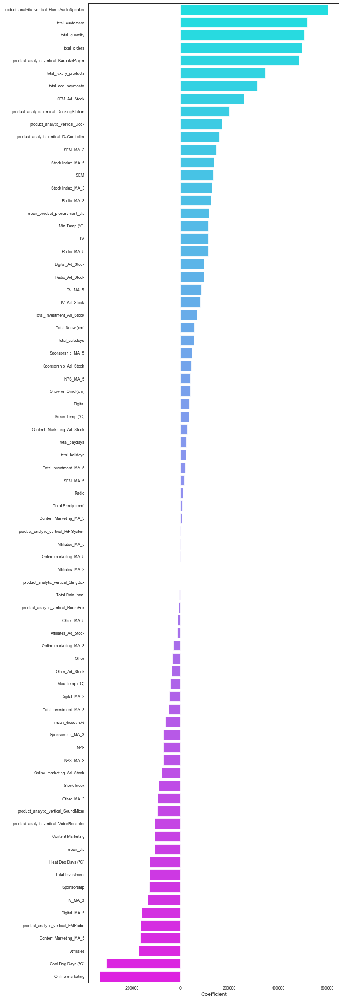

In [510]:
# Getting the coefficients from the model
# The lr_3.summary() is a set of tables, which we can export as html and then use Pandas to convert to a dataframe
df = pd.read_html(lr.summary().tables[1].as_html(),header=0,index_col=0)[0]
features = df.reset_index()[['index', 'coef']].sort_values('coef', ascending=False)
features = features.loc[features['index']!='const',:]

plt.figure(figsize=(10,40))
sns.barplot(y = features['index'], x = features['coef'], orient='h', palette='cool')
plt.ylabel('', size=12)
plt.xlabel('Coefficient', size=12)

Based on the above summary of our model, we see that the R-squared value is pretty high. However, there may be massive multi-collinearity present in the data. Also, it is not recommended to have a model with such a large number of predictors
<br>
Let's **check the VIF**
Variance Inflation Factor or VIF, gives a basic quantitative idea about how much the feature variables are correlated with each other. It is an extremely important parameter to test our linear model. The formula for calculating `VIF` is:

### $ VIF_i = \frac{1}{1 - {R_i}^2} $

In [511]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train.columns
vif['VIF'] = [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,mean_discount%,inf
49,Affiliates_Ad_Stock,inf
56,Radio_MA_5,inf
55,Radio_MA_3,inf
54,Radio,inf
...,...,...
24,Total Investment_MA_5,inf
23,Total Investment_MA_3,inf
22,Total Investment,inf
18,product_analytic_vertical_KaraokePlayer,35.0


As we see, there is very high multi-collinearity in our data, evident from the massively inflated VIF values for the features. We generally want a VIF that is less than 5. So there are clearly some variables we need to drop. 

Considering we're dealing with a really large set of data, it wouldn't be feasible of treating them 1 at a time. In that case, we'll opt for **Recursive Feature Elimination** To come down to about a smaller number of variables that explain the highest variance in the data and exhibit the least multicollinearity. Post that, we'll go into fine-tuning the model manually to end up with the final set of variables

In [512]:
# Importing RFE and LinearRegression
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression

lm = LinearRegression()
lm.fit(X_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

Let's try using the recursive feature elimination based on mean squared error to identify the optimal number of features that we should huse in our model.

Let's perform RFE using 25 variables and then later fine-tune the model using other features such as the VIF, P-values and adjusted R-squared to identify the final set of variables

In [513]:
# running RFE
rfe = RFE(lm, 25)
rfe = rfe.fit(X_train, y_train)
zip(X_train.columns,rfe.support_,rfe.ranking_)

# Identify all the columns that were returned by our RFE model
col = X_train.columns[rfe.support_]
col

Index(['mean_sla', 'mean_product_procurement_sla', 'total_cod_payments',
       'total_luxury_products', 'total_orders', 'total_customers',
       'total_quantity', 'product_analytic_vertical_DJController',
       'product_analytic_vertical_Dock',
       'product_analytic_vertical_DockingStation',
       'product_analytic_vertical_HomeAudioSpeaker',
       'product_analytic_vertical_KaraokePlayer', 'Total Investment',
       'TV_MA_5', 'TV_Ad_Stock', 'Content Marketing_MA_5',
       'Content_Marketing_Ad_Stock', 'Online marketing', 'SEM', 'Radio_MA_5',
       'Radio_Ad_Stock', 'Other_MA_3', 'NPS_MA_5', 'Min Temp (°C)',
       'Cool Deg Days (°C)'],
      dtype='object')

Let's now build the model using the above identified features

In [514]:
# Creating X_test dataframe with RFE selected variables
X_train_rfe = X_train[col]

In [515]:
# Build a fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                     3009.
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           6.53e-15
Time:                        16:05:08   Log-Likelihood:                -411.75
No. Observations:                  35   AIC:                             875.5
Df Residuals:                       9   BIC:                             915.9
Df Model:                          25                                         
Covariance Type:            nonrobust                                         
                                                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------

In [516]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('total_orders', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                     3320.
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           1.36e-16
Time:                        16:05:09   Log-Likelihood:                -412.59
No. Observations:                  35   AIC:                             875.2
Df Residuals:                      10   BIC:                             914.1
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
                                                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------

In [517]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('total_customers', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                     3712.
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           2.46e-18
Time:                        16:05:38   Log-Likelihood:                -413.05
No. Observations:                  35   AIC:                             874.1
Df Residuals:                      11   BIC:                             911.4
Df Model:                          23                                         
Covariance Type:            nonrobust                                         
                                                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------

In [518]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('total_quantity', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                     2649.
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           6.09e-19
Time:                        16:05:39   Log-Likelihood:                -421.25
No. Observations:                  35   AIC:                             888.5
Df Residuals:                      12   BIC:                             924.3
Df Model:                          22                                         
Covariance Type:            nonrobust                                         
                                                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------

In [519]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('product_analytic_vertical_HomeAudioSpeaker', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                     1419.
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           1.41e-18
Time:                        16:05:40   Log-Likelihood:                -434.38
No. Observations:                  35   AIC:                             912.8
Df Residuals:                      13   BIC:                             947.0
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

In [520]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('Content_Marketing_Ad_Stock', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                     1388.
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           9.43e-20
Time:                        16:05:41   Log-Likelihood:                -436.92
No. Observations:                  35   AIC:                             915.8
Df Residuals:                      14   BIC:                             948.5
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

In [521]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('TV_Ad_Stock', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.998
Method:                 Least Squares   F-statistic:                     898.5
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           1.48e-19
Time:                        16:05:41   Log-Likelihood:                -446.63
No. Observations:                  35   AIC:                             933.3
Df Residuals:                      15   BIC:                             964.4
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

In [522]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('Other_MA_3', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.998
Method:                 Least Squares   F-statistic:                     897.3
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           1.18e-20
Time:                        16:05:42   Log-Likelihood:                -448.73
No. Observations:                  35   AIC:                             935.5
Df Residuals:                      16   BIC:                             965.0
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

In [523]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('Online marketing', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.997
Method:                 Least Squares   F-statistic:                     767.8
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           3.66e-21
Time:                        16:05:42   Log-Likelihood:                -453.51
No. Observations:                  35   AIC:                             943.0
Df Residuals:                      17   BIC:                             971.0
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

In [524]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('total_cod_payments', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.986
Model:                            OLS   Adj. R-squared:                  0.974
Method:                 Least Squares   F-statistic:                     82.20
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           1.57e-13
Time:                        16:05:43   Log-Likelihood:                -494.46
No. Observations:                  35   AIC:                             1023.
Df Residuals:                      18   BIC:                             1049.
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

In [525]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('SEM', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.986
Model:                            OLS   Adj. R-squared:                  0.975
Method:                 Least Squares   F-statistic:                     90.90
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           1.87e-14
Time:                        16:05:47   Log-Likelihood:                -494.77
No. Observations:                  35   AIC:                             1022.
Df Residuals:                      19   BIC:                             1046.
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

In [526]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('Cool Deg Days (°C)', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.986
Model:                            OLS   Adj. R-squared:                  0.976
Method:                 Least Squares   F-statistic:                     99.10
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           2.49e-15
Time:                        16:05:48   Log-Likelihood:                -495.35
No. Observations:                  35   AIC:                             1021.
Df Residuals:                      20   BIC:                             1044.
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

In [527]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('product_analytic_vertical_DockingStation', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.986
Model:                            OLS   Adj. R-squared:                  0.977
Method:                 Least Squares   F-statistic:                     112.0
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           2.29e-16
Time:                        16:05:48   Log-Likelihood:                -495.36
No. Observations:                  35   AIC:                             1019.
Df Residuals:                      21   BIC:                             1040.
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                                              coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------

In [528]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('TV_MA_5', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.986
Model:                            OLS   Adj. R-squared:                  0.978
Method:                 Least Squares   F-statistic:                     126.9
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           1.99e-17
Time:                        16:05:48   Log-Likelihood:                -495.38
No. Observations:                  35   AIC:                             1017.
Df Residuals:                      22   BIC:                             1037.
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                                              coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------

In [529]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('NPS_MA_5', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.986
Model:                            OLS   Adj. R-squared:                  0.979
Method:                 Least Squares   F-statistic:                     144.3
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           1.66e-18
Time:                        16:05:53   Log-Likelihood:                -495.44
No. Observations:                  35   AIC:                             1015.
Df Residuals:                      23   BIC:                             1034.
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                                              coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------

In [530]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('product_analytic_vertical_DJController', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.985
Model:                            OLS   Adj. R-squared:                  0.978
Method:                 Least Squares   F-statistic:                     155.7
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           2.57e-19
Time:                        16:05:53   Log-Likelihood:                -496.51
No. Observations:                  35   AIC:                             1015.
Df Residuals:                      24   BIC:                             1032.
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                                              coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------

In [531]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('Min Temp (°C)', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.983
Model:                            OLS   Adj. R-squared:                  0.976
Method:                 Least Squares   F-statistic:                     157.7
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           9.48e-20
Time:                        16:05:55   Log-Likelihood:                -498.81
No. Observations:                  35   AIC:                             1018.
Df Residuals:                      25   BIC:                             1033.
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                                              coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------

In [532]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('mean_product_procurement_sla', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.981
Model:                            OLS   Adj. R-squared:                  0.975
Method:                 Least Squares   F-statistic:                     166.9
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           2.40e-20
Time:                        16:05:56   Log-Likelihood:                -500.53
No. Observations:                  35   AIC:                             1019.
Df Residuals:                      26   BIC:                             1033.
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                                              coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------

In [533]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('mean_sla', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.979
Model:                            OLS   Adj. R-squared:                  0.973
Method:                 Least Squares   F-statistic:                     176.1
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           7.66e-21
Time:                        16:06:01   Log-Likelihood:                -502.55
No. Observations:                  35   AIC:                             1021.
Df Residuals:                      27   BIC:                             1034.
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                              coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------

The above variables seem to be significant enough, and the corresponding R-squared value is also high hence we can infer that the varriance is being explained pretty well by these variables.<br>
Looking at the F-statistic, it is pretty high and the corresponding p-value is almost 0 suggesting that it is significant.<br>
We've also taken into account the multicollinearity that may exist based on the VIF values.

**Let's go ahead and perform residual analysis to ensure that the assumptions of linear regression are being satisfied**

Text(0.5, 0, 'Errors')

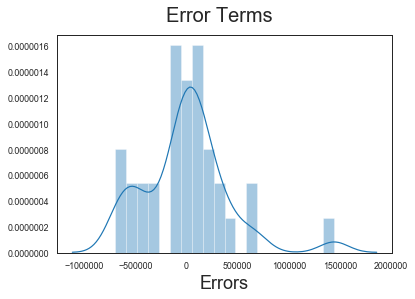

In [534]:
y_train_gmv = lr_3.predict(X_train_rfe)

# Plot the histogram of the error terms
fig = plt.figure()
sns.distplot((y_train['gmv'] - y_train_gmv), bins = 20)
fig.suptitle('Error Terms', fontsize = 20)                  # Plot heading 
plt.xlabel('Errors', fontsize = 18)                         # X-label

As we can see, the error terms are following a normal distribution with mean at 0

**Making the Predictions**

In [535]:
# Splitting the data into predictor and dependent variables
y_test = HomeAud_test[['gmv']]
X_test = HomeAud_test.drop('gmv', axis=1)

# Scaling the test variables
X_test[ls]=scaler.transform(X_test[ls])

# Now let's use our model to make predictions.

# Creating X_test_new dataframe by dropping variables from X_test
X_test_new = X_test[X_train_rfe.columns[1:]]

# Adding a constant variable 
X_test_new = sm.add_constant(X_test_new)

# Making predictions
y_pred = lr_3.predict(X_test_new)

In [536]:
y_pred.head()

6     4.109384e+06
36    3.597275e+06
37    3.377344e+06
28    6.371075e+06
43    3.260578e+06
dtype: float64

**Evaluating the Model**

Text(0, 0.5, 'y_pred')

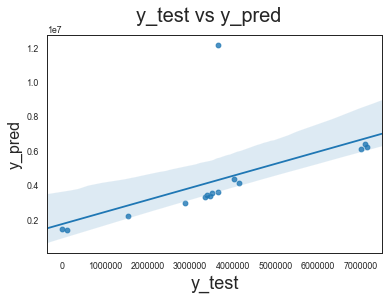

In [537]:
# plot points and fit line
# Plotting y_test and y_pred to understand the spread.
fig = plt.figure()
sns.regplot(y_test,y_pred)
fig.suptitle('y_test vs y_pred', fontsize=20)              # Plot heading 
plt.xlabel('y_test', fontsize=18)                          # X-label
plt.ylabel('y_pred', fontsize=16)                          # Y-label

Based on the above data, we can see that the model predictions seem to be pretty good

In [538]:
# Evaluation metrics
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from statistics import stdev
#Returns the mean squared error; we'll take a square root
print('RMSE:', np.sqrt(mean_squared_error(y_test, y_pred)))
print('R-Squared:', round(r2_score(y_test, y_pred),2))

# Since RMSE is relative to the scale of our y-variable, let's normalize the RMSE by dividing it with the standard deviation
print('Normalized RMSE:', round(np.sqrt(mean_squared_error(y_test, y_pred))/stdev(y_train['gmv']),2))

RMSE: 2286075.78843114
R-Squared: -0.17
Normalized RMSE: 0.79


**Plotting the most important features for the Additive Model of the Home Audio Dataset**

Text(0.5, 0, 'Coefficient')

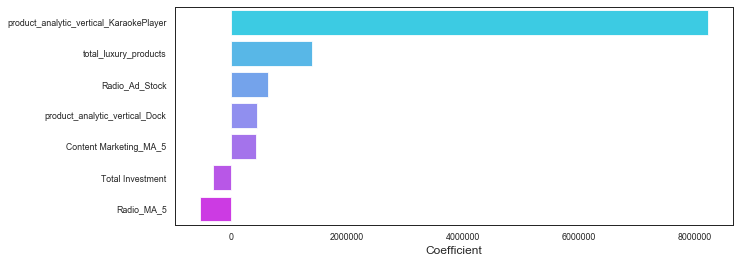

In [539]:
# Getting the coefficients from the model
# The lr_3.summary() is a set of tables, which we can export as html and then use Pandas to convert to a dataframe
df = pd.read_html(lr_3.summary().tables[1].as_html(),header=0,index_col=0)[0]
features = df.reset_index()[['index', 'coef']].sort_values('coef', ascending=False)
features = features.loc[features['index']!='const',:]

plt.figure(figsize=(10,4))
sns.barplot(y = features['index'], x = features['coef'], orient='h', palette='cool')
plt.ylabel('', size=12)
plt.xlabel('Coefficient', size=12)

### 2. Multiplicative Model

The linear additive model created above assumes that all the predictor variables contribute linearly to the revenue variable and all the KPI;s affect the revenue additively.

However, this may not be entirely true - hence we go ahead for a multiplicative model. The equation that the multiplicative model follows is: <br><br>
ln(Y) = α + β1ln(At) + β2ln(Pt) + β3ln(Dt) + β4ln(Qt) + β5ln(Tt) + ϵ'<br><br>
Where:<br> A - KPI's related to advertisement<br>
P - KPI's related to pricing<br>
D - KPI's related to promotion/discounts<br>
Q - KPI's related to product assortment/quality<br>
T - KPI's related to industry trends, seasonality etc.

In [540]:
homeaud_weekly_mul = homeaud_weekly.copy()

# Setting week number as index
homeaud_weekly_mul = homeaud_weekly_mul.set_index('Week')

In [541]:
# Applying log (ln) transform to each of the variables
# We'll exclude the binary categorical variables in this case as a log transform on those would result in loss of variance
# This is because ln(1) = 0, and ln(0)= inf

# Identifying all the non-binary variables
ls = []

for i in range(len(homeaud_weekly_mul.columns)):
    if homeaud_weekly_mul[homeaud_weekly_mul.columns[i]].nunique()>=3:
        ls.append(homeaud_weekly_mul.columns[i])

homeaud_weekly_mul[ls] = homeaud_weekly_mul[ls].applymap(lambda x:np.log(x))

# After applying log transformation to values, all the 0 values become infinity. Converting these back to 0
homeaud_weekly_mul = homeaud_weekly_mul.replace([np.inf, -np.inf], 0)
homeaud_weekly_mul = homeaud_weekly_mul.replace(np.nan, 0)
homeaud_weekly_mul.head()

,gmv,mean_discount%,mean_sla,mean_product_procurement_sla,total_paydays,total_saledays,total_cod_payments,total_luxury_products,total_orders,total_customers,...,Stock Index_MA_5,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
Week,,,,,,,,,,,,,,,,,,,,,
27,11.650450,3.605365,0.995958,1.206409,1.098612,0.000000,0.000000,3.178054,3.688879,3.688879,...,0.000000,3.238678,2.580217,2.963209,-2.302585,0.378436,0.000000,0.0,0.000000,0.0
28,15.341527,3.477524,1.971120,1.012843,0.000000,0.000000,7.335634,6.629363,7.622664,7.581720,...,0.000000,3.212187,2.730029,3.000720,-1.261131,0.868500,1.485385,0.0,1.485385,0.0
29,15.499207,3.520492,1.935302,0.983493,5.849325,6.507278,7.520235,6.754604,7.794823,7.756195,...,0.000000,3.358638,2.866951,3.143434,0.000000,1.645448,0.336472,0.0,0.336472,0.0
30,15.367776,3.514130,1.952806,1.007684,0.000000,0.000000,7.451242,6.529419,7.695758,7.660585,...,0.000000,3.392829,2.809403,3.138100,0.000000,1.621366,-0.105361,0.0,-0.105361,0.0
31,15.045455,3.502808,1.969052,0.982194,0.000000,0.000000,7.083388,6.253829,7.348588,7.312553,...,7.073185,3.452630,2.862201,3.201391,0.000000,1.882006,1.533277,0.0,1.533277,0.0


Now that we've performed the log transform for each of the variables, we can go ahead and perform a linear regression on the transformed variables which is effectively performing a multiplicative model on the actual variables

**Splitting the data into test and train**

In [542]:
from sklearn.model_selection import train_test_split

# We specify this so that the train and test data set always have the same rows, respectively
np.random.seed(1)

HomeAudmul_train, HomeAudmul_test = train_test_split(homeaud_weekly_mul, train_size = 0.7, test_size = 0.3, random_state = 100)

print(HomeAudmul_train.shape)
print(HomeAudmul_test.shape)

(35, 78)
(15, 78)


**Scaling the features** - Using Standard Scaling as explained in the previous model

In [543]:
# Splitting the data into predictor and dependent variables
y_train = HomeAudmul_train[['gmv']]
X_train = HomeAudmul_train.drop('gmv', axis=1)

# Identifying all the non-binary variables
ls = []

for i in range(len(X_train.columns)):
    if X_train[X_train.columns[i]].nunique()>=3:
        ls.append(X_train.columns[i])

# Applying Standard Scaling to these features
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train[ls]=scaler.fit_transform(X_train[ls])

X_train.describe()

,mean_discount%,mean_sla,mean_product_procurement_sla,total_paydays,total_saledays,total_cod_payments,total_luxury_products,total_orders,total_customers,total_quantity,...,Stock Index_MA_5,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
count,3.500000e+01,3.500000e+01,3.500000e+01,3.500000e+01,3.500000e+01,3.500000e+01,3.500000e+01,3.500000e+01,3.500000e+01,3.500000e+01,...,3.500000e+01,3.500000e+01,3.500000e+01,3.500000e+01,3.500000e+01,3.500000e+01,3.500000e+01,3.500000e+01,3.500000e+01,3.500000e+01
mean,1.233934e-15,2.157005e-16,-9.595499e-16,5.709718e-17,-1.141944e-16,1.340198e-16,-1.332268e-16,-1.348128e-15,1.839798e-15,-2.398082e-15,...,-3.251367e-16,-1.586033e-17,-8.247371e-17,1.998401e-16,3.806479e-17,8.564578e-17,-4.440892e-17,6.026925e-17,-5.075305e-17,-1.110223e-16
std,1.014599e+00,1.014599e+00,1.014599e+00,1.014599e+00,1.014599e+00,1.014599e+00,1.014599e+00,1.014599e+00,1.014599e+00,1.014599e+00,...,1.014599e+00,1.014599e+00,1.014599e+00,1.014599e+00,1.014599e+00,1.014599e+00,1.014599e+00,1.014599e+00,1.014599e+00,1.014599e+00
min,-1.652835e+00,-2.241720e+00,-4.520721e+00,-8.636521e-01,-6.692081e-01,-5.159830e+00,-2.490655e+00,-3.088088e+00,-3.091862e+00,-2.973424e+00,...,-3.264873e+00,-2.706866e+00,-1.336504e+00,-3.462256e+00,-2.097058e+00,-1.960333e+00,-1.734542e+00,-3.985897e-01,-1.771265e+00,-3.595293e-01
25%,-6.856324e-01,-5.959746e-01,-3.699378e-01,-8.636521e-01,-6.692081e-01,-1.915478e-01,-7.281494e-01,-5.444367e-01,-5.399468e-01,-5.493561e-01,...,2.753876e-01,-4.277646e-01,-1.336504e+00,-5.288179e-01,-1.132865e+00,-6.120633e-01,-5.756354e-01,-3.985897e-01,-5.965551e-01,-3.595293e-01
50%,-1.259051e-01,2.257763e-02,1.677565e-01,-8.636521e-01,-6.692081e-01,1.236021e-01,-2.364334e-02,-3.253367e-02,-1.926251e-02,-5.293459e-02,...,3.064482e-01,3.034952e-01,2.262155e-01,3.935641e-01,3.608605e-01,-6.120633e-01,-5.007328e-01,-3.985897e-01,-2.423410e-01,-3.595293e-01
75%,6.005601e-01,7.561816e-01,5.512549e-01,1.116429e+00,1.150492e+00,2.751498e-01,4.761058e-01,2.842241e-01,2.929116e-01,2.811899e-01,...,3.287796e-01,7.353631e-01,9.843825e-01,7.801733e-01,8.953634e-01,7.069078e-01,7.841625e-01,-3.985897e-01,8.127904e-01,-3.595293e-01
max,2.181344e+00,1.767747e+00,1.228552e+00,1.527903e+00,1.916380e+00,1.850098e+00,2.924007e+00,3.393450e+00,3.432454e+00,3.411732e+00,...,3.412902e-01,9.693628e-01,1.163966e+00,9.312194e-01,1.336226e+00,2.157201e+00,2.111893e+00,3.082577e+00,2.156769e+00,4.825620e+00


Let's first create a vanilla model using all the variables as it is. This will give us an idea on what the base statistics of our basic model looks like.

In [544]:
# Fitting a regression line using statsmodels.api
import statsmodels.api as sm

# Add a constant
X_train_lm = sm.add_constant(X_train)

# Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

# Check the summary
print(lr.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                     0.000
Date:                Sun, 22 Dec 2019   Prob (F-statistic):                nan
Time:                        16:06:43   Log-Likelihood:                 1041.4
No. Observations:                  35   AIC:                            -2013.
Df Residuals:                       0   BIC:                            -1958.
Df Model:                          34                                         
Covariance Type:            nonrobust                                         
                                                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------

**Making the Predictions**

In [545]:
# Splitting the data into predictor and dependent variables
y_test = HomeAudmul_test[['gmv']]
X_test = HomeAudmul_test.drop('gmv', axis=1)

# Scaling the test variables
X_test[ls]=scaler.transform(X_test[ls])

# Now let's use our model to make predictions.

# Creating X_test_new dataframe by dropping variables from X_test
X_test_new = X_test[X_train.columns[:]]

# Adding a constant variable 
X_test_new = sm.add_constant(X_test_new, has_constant='add')

# Making predictions
y_pred = lr.predict(X_test_new)
y_pred.head()

Week
36    15.346247
66    15.162629
67    15.007099
58    15.643674
73    14.875900
dtype: float64

**Evaluating the model**

Text(0, 0.5, 'y_pred')

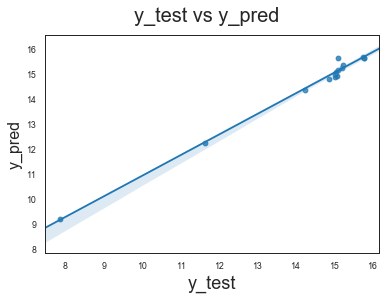

In [546]:
# plot points and fit line
# Plotting y_test and y_pred to understand the spread.
fig = plt.figure()
sns.regplot(y_test,y_pred)
fig.suptitle('y_test vs y_pred', fontsize=20)              # Plot heading 
plt.xlabel('y_test', fontsize=18)                          # X-label
plt.ylabel('y_pred', fontsize=16)                          # Y-label

In [547]:
# Evaluation metrics
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from statistics import stdev

#Returns the mean squared error; we'll take a square root
print('RMSE:', np.sqrt(mean_squared_error(y_test, y_pred)))
print('R-Squared:', round(r2_score(y_test, y_pred),2))

# Since RMSE is relative to the scale of our y-variable, let's normalize the RMSE by dividing it with the standard deviation
print('Normalized RMSE:', np.sqrt(mean_squared_error(y_test, y_pred))/stdev(y_train['gmv']))

RMSE: 0.4052103541856712
R-Squared: 0.96
Normalized RMSE: 1.0498646834153156


Plotting the most important features off the back of our vanilla model

Text(0.5, 0, 'Coefficient')

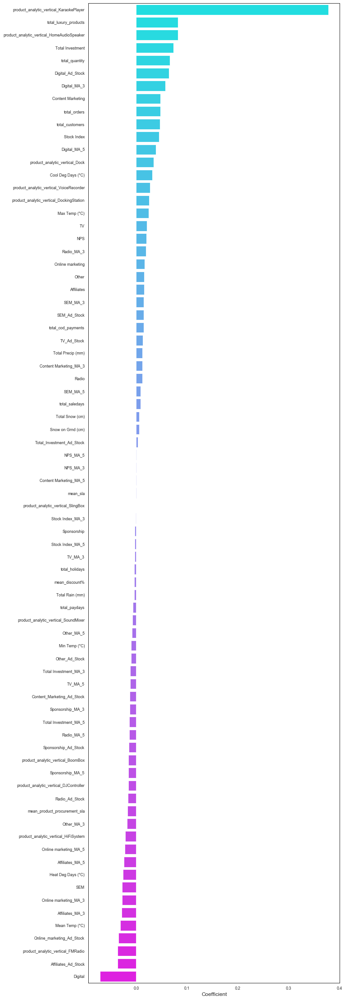

In [548]:
# Getting the coefficients from the model
# The lr_3.summary() is a set of tables, which we can export as html and then use Pandas to convert to a dataframe
df = pd.read_html(lr.summary().tables[1].as_html(),header=0,index_col=0)[0]
features = df.reset_index()[['index', 'coef']].sort_values('coef', ascending=False)
features = features.loc[features['index']!='const',:]

plt.figure(figsize=(10,40))
sns.barplot(y = features['index'], x = features['coef'], orient='h', palette='cool')
plt.ylabel('', size=12)
plt.xlabel('Coefficient', size=12)

Clearly there exists a lot of multicollinearity in our data. Let's use **VIF** to detect the correlated variables

In [549]:
# Check for the VIF values of the feature variables. 
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train.columns
vif['VIF'] = [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,mean_discount%,inf
49,Affiliates_Ad_Stock,inf
56,Radio_MA_5,inf
55,Radio_MA_3,inf
54,Radio,inf
...,...,...
24,Total Investment_MA_5,inf
23,Total Investment_MA_3,inf
22,Total Investment,inf
18,product_analytic_vertical_KaraokePlayer,36877.79


Considering we're dealing with a really large set of data, it wouldn't be feasible of treating them 1 at a time. In that case, we'll opt for **Recursive Feature Elimination** to come down to about a smaller number of variables that explain the highest variance in the data and exhibit the least multicollinearity. Post that, we'll go into fine-tuning the model manually to end up with the final set of variables

In [550]:
# Importing RFE and LinearRegression
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression

lm = LinearRegression()
lm.fit(X_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

Let's perform RFE using 25 variables and then later fine-tune the model using other features such as the VIF, P-values and adjusted R-squared to identify the final set of variables

In [551]:
# running RFE
rfe = RFE(lm, 25)
rfe = rfe.fit(X_train, y_train)

zip(X_train.columns,rfe.support_,rfe.ranking_)

In [552]:
# Identify all the columns that were returned by our RFE model
col = X_train.columns[rfe.support_]
col

Index(['mean_product_procurement_sla', 'total_luxury_products', 'total_orders',
       'total_customers', 'product_analytic_vertical_BoomBox',
       'product_analytic_vertical_DJController',
       'product_analytic_vertical_DockingStation',
       'product_analytic_vertical_HomeAudioSpeaker', 'TV', 'Digital',
       'Digital_MA_3', 'Digital_Ad_Stock', 'Sponsorship', 'Sponsorship_MA_3',
       'Content Marketing_MA_3', 'Affiliates_MA_3', 'SEM', 'SEM_MA_3',
       'SEM_Ad_Stock', 'Radio_MA_3', 'Other_MA_3', 'Stock Index',
       'Min Temp (°C)', 'Heat Deg Days (°C)', 'Total Rain (mm)'],
      dtype='object')

Let's now build the model using the above features and check its performance

In [553]:
# Creating X_test dataframe with RFE selected variables
X_train_rfe = X_train[col]
X_train_rfe = sm.add_constant(X_train_rfe)

lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.997
Method:                 Least Squares   F-statistic:                     416.5
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           4.74e-11
Time:                        16:06:57   Log-Likelihood:                 107.62
No. Observations:                  35   AIC:                            -163.2
Df Residuals:                       9   BIC:                            -122.8
Df Model:                          25                                         
Covariance Type:            nonrobust                                         
                                                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------

In [554]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
18,SEM_MA_3,45007.27
11,Digital_MA_3,32723.43
3,total_orders,31878.00
4,total_customers,29961.11
16,Affiliates_MA_3,5843.32
12,Digital_Ad_Stock,5136.69
19,SEM_Ad_Stock,4355.11
14,Sponsorship_MA_3,1267.68
10,Digital,644.37
17,SEM,575.18


We see that even after reducing the number of vaiables to 25 using RFE, the remaining variables are still able to explain a very high amount of variance in the y variable (evident by the very high R-squared value). Now that we've used RFE to drop all the insignificant variables, let's fine-tune our model by dropping those variable with high VIF or p values 1 at a time until we have a final set of variables that are able to explain a good amount of variance in the revenue variable.

In [555]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('SEM_MA_3', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.995
Method:                 Least Squares   F-statistic:                     268.7
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           3.83e-11
Time:                        16:07:13   Log-Likelihood:                 97.403
No. Observations:                  35   AIC:                            -144.8
Df Residuals:                      10   BIC:                            -105.9
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
                                                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------

In [556]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('total_orders', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.995
Method:                 Least Squares   F-statistic:                     294.3
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           2.73e-12
Time:                        16:07:14   Log-Likelihood:                 96.580
No. Observations:                  35   AIC:                            -145.2
Df Residuals:                      11   BIC:                            -107.8
Df Model:                          23                                         
Covariance Type:            nonrobust                                         
                                                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------

In [557]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('Affiliates_MA_3', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.995
Method:                 Least Squares   F-statistic:                     283.9
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           3.91e-13
Time:                        16:07:14   Log-Likelihood:                 93.660
No. Observations:                  35   AIC:                            -141.3
Df Residuals:                      12   BIC:                            -105.5
Df Model:                          22                                         
Covariance Type:            nonrobust                                         
                                                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------

In [558]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('Sponsorship_MA_3', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.995
Method:                 Least Squares   F-statistic:                     318.5
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           2.28e-14
Time:                        16:07:15   Log-Likelihood:                 93.454
No. Observations:                  35   AIC:                            -142.9
Df Residuals:                      13   BIC:                            -108.7
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
                                                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------

In [559]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('Digital_Ad_Stock', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.995
Method:                 Least Squares   F-statistic:                     321.2
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           2.59e-15
Time:                        16:07:16   Log-Likelihood:                 91.455
No. Observations:                  35   AIC:                            -140.9
Df Residuals:                      14   BIC:                            -108.2
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                                                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------

In [560]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('product_analytic_vertical_HomeAudioSpeaker', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.995
Model:                            OLS   Adj. R-squared:                  0.990
Method:                 Least Squares   F-statistic:                     172.0
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           3.40e-14
Time:                        16:07:17   Log-Likelihood:                 78.461
No. Observations:                  35   AIC:                            -116.9
Df Residuals:                      15   BIC:                            -85.82
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

In [561]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('Content Marketing_MA_3', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.993
Model:                            OLS   Adj. R-squared:                  0.985
Method:                 Least Squares   F-statistic:                     126.9
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           6.71e-14
Time:                        16:07:17   Log-Likelihood:                 71.109
No. Observations:                  35   AIC:                            -104.2
Df Residuals:                      16   BIC:                            -74.67
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

In [562]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('total_luxury_products', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.989
Model:                            OLS   Adj. R-squared:                  0.978
Method:                 Least Squares   F-statistic:                     89.94
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           2.60e-13
Time:                        16:07:18   Log-Likelihood:                 63.094
No. Observations:                  35   AIC:                            -90.19
Df Residuals:                      17   BIC:                            -62.19
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

In [563]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('Heat Deg Days (°C)', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.989
Model:                            OLS   Adj. R-squared:                  0.979
Method:                 Least Squares   F-statistic:                     98.41
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           3.21e-14
Time:                        16:07:18   Log-Likelihood:                 62.612
No. Observations:                  35   AIC:                            -91.22
Df Residuals:                      18   BIC:                            -64.78
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

In [564]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('SEM', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.989
Model:                            OLS   Adj. R-squared:                  0.979
Method:                 Least Squares   F-statistic:                     109.0
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           3.44e-15
Time:                        16:07:18   Log-Likelihood:                 62.331
No. Observations:                  35   AIC:                            -92.66
Df Residuals:                      19   BIC:                            -67.78
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

In [565]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('Other_MA_3', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.989
Model:                            OLS   Adj. R-squared:                  0.980
Method:                 Least Squares   F-statistic:                     122.9
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           3.02e-16
Time:                        16:07:41   Log-Likelihood:                 62.322
No. Observations:                  35   AIC:                            -94.64
Df Residuals:                      20   BIC:                            -71.31
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

In [566]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('TV', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.988
Model:                            OLS   Adj. R-squared:                  0.981
Method:                 Least Squares   F-statistic:                     138.7
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           2.53e-17
Time:                        16:07:41   Log-Likelihood:                 62.289
No. Observations:                  35   AIC:                            -96.58
Df Residuals:                      21   BIC:                            -74.80
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

In [567]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('product_analytic_vertical_BoomBox', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.988
Model:                            OLS   Adj. R-squared:                  0.982
Method:                 Least Squares   F-statistic:                     153.2
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           2.61e-18
Time:                        16:07:42   Log-Likelihood:                 61.823
No. Observations:                  35   AIC:                            -97.65
Df Residuals:                      22   BIC:                            -77.43
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

In [568]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('Digital', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.988
Model:                            OLS   Adj. R-squared:                  0.982
Method:                 Least Squares   F-statistic:                     171.0
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           2.44e-19
Time:                        16:07:44   Log-Likelihood:                 61.448
No. Observations:                  35   AIC:                            -98.90
Df Residuals:                      23   BIC:                            -80.23
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

In [569]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('Min Temp (°C)', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.988
Model:                            OLS   Adj. R-squared:                  0.983
Method:                 Least Squares   F-statistic:                     196.0
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           1.71e-20
Time:                        16:07:49   Log-Likelihood:                 61.424
No. Observations:                  35   AIC:                            -100.8
Df Residuals:                      24   BIC:                            -83.74
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

In [570]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('Stock Index', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.988
Model:                            OLS   Adj. R-squared:                  0.984
Method:                 Least Squares   F-statistic:                     226.8
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           1.09e-21
Time:                        16:07:50   Log-Likelihood:                 61.424
No. Observations:                  35   AIC:                            -102.8
Df Residuals:                      25   BIC:                            -87.29
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

In [571]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('product_analytic_vertical_DJController', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.986
Model:                            OLS   Adj. R-squared:                  0.982
Method:                 Least Squares   F-statistic:                     237.0
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           2.74e-22
Time:                        16:07:51   Log-Likelihood:                 59.466
No. Observations:                  35   AIC:                            -100.9
Df Residuals:                      26   BIC:                            -86.93
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

In [572]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('Digital_MA_3', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.986
Model:                            OLS   Adj. R-squared:                  0.982
Method:                 Least Squares   F-statistic:                     264.2
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           3.59e-23
Time:                        16:07:52   Log-Likelihood:                 58.387
No. Observations:                  35   AIC:                            -100.8
Df Residuals:                      27   BIC:                            -88.33
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

In [573]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('Total Rain (mm)', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.984
Model:                            OLS   Adj. R-squared:                  0.981
Method:                 Least Squares   F-statistic:                     293.6
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           6.13e-24
Time:                        16:07:53   Log-Likelihood:                 56.923
No. Observations:                  35   AIC:                            -99.85
Df Residuals:                      28   BIC:                            -88.96
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

In [574]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('mean_product_procurement_sla', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.983
Model:                            OLS   Adj. R-squared:                  0.980
Method:                 Least Squares   F-statistic:                     338.3
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           8.89e-25
Time:                        16:07:57   Log-Likelihood:                 55.620
No. Observations:                  35   AIC:                            -99.24
Df Residuals:                      29   BIC:                            -89.91
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

The above variables seem to be significant enough, and the corresponding R-squared value is also high hence we can infer that the variance is being explained pretty well by these variables.<br>
Looking at the F-statistic, it is pretty high and the corresponding p-value is almost 0 suggesting that it is significant.<br>
We've also taken into account the multicollinearity that may exist based on the VIF values.

**Let's go ahead and perform residual analysis to ensure that the assumptions of linear regression are being satisfied**

Text(0.5, 0, 'Errors')

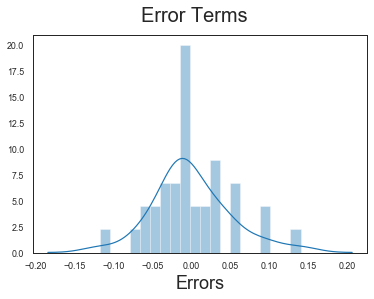

In [575]:
y_train_gmv = lr_3.predict(X_train_rfe)

# Plot the histogram of the error terms
fig = plt.figure()
sns.distplot((y_train['gmv'] - y_train_gmv), bins = 20)
fig.suptitle('Error Terms', fontsize = 20)                  # Plot heading 
plt.xlabel('Errors', fontsize = 18)                         # X-label

As we can see, the error terms are following a normal distribution with mean at 0

**Making the Predictions**

In [576]:
# Splitting the data into predictor and dependent variables
y_test = HomeAudmul_test[['gmv']]
X_test = HomeAudmul_test.drop('gmv', axis=1)

# Scaling the test variables
X_test[ls]=scaler.transform(X_test[ls])

# Now let's use our model to make predictions.

# Creating X_test_new dataframe by dropping variables from X_test
X_test_new = X_test[X_train_rfe.columns[1:]]

# Adding a constant variable 
X_test_new = sm.add_constant(X_test_new)

# Making predictions
y_pred = lr_3.predict(X_test_new)
y_pred.head()

Week
36    15.111437
66    15.125549
67    15.059460
58    15.729335
73    14.997957
dtype: float64

**Evaluating the Model**

Text(0, 0.5, 'y_pred')

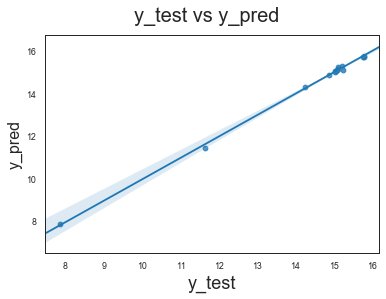

In [577]:
# plot points and fit line
# Plotting y_test and y_pred to understand the spread.
fig = plt.figure()
sns.regplot(y_test,y_pred)
fig.suptitle('y_test vs y_pred', fontsize=20)              # Plot heading 
plt.xlabel('y_test', fontsize=18)                          # X-label
plt.ylabel('y_pred', fontsize=16)                          # Y-label

Based on the above data, we can see that the model predictions seem to be pretty good

In [578]:
# Evaluation metrics
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from statistics import stdev

#Returns the mean squared error; we'll take a square root
print('RMSE:', np.sqrt(mean_squared_error(y_test, y_pred)))
print('R-Squared:', round(r2_score(y_test, y_pred),2))

# Since RMSE is relative to the scale of our y-variable, let's normalize the RMSE by dividing it with the standard deviation
print('Normalized RMSE:', np.sqrt(mean_squared_error(y_test, y_pred))/stdev(y_train['gmv']))

RMSE: 0.08305284749607181
R-Squared: 1.0
Normalized RMSE: 0.21518268361733592


**Plotting the most important features for the Multiplicative Model of the Home Audio Dataset**

Text(0.5, 0, 'Coefficient')

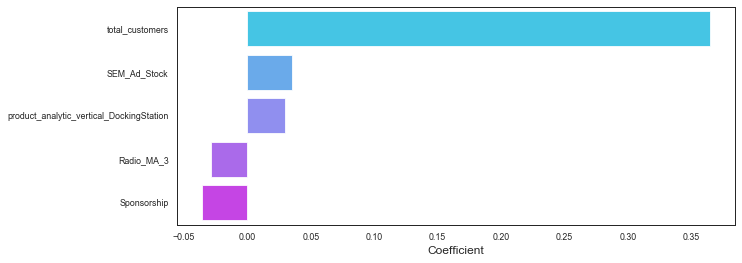

In [579]:
# Getting the coefficients from the model
# The lr_3.summary() is a set of tables, which we can export as html and then use Pandas to convert to a dataframe
df = pd.read_html(lr_3.summary().tables[1].as_html(),header=0,index_col=0)[0]
features = df.reset_index()[['index', 'coef']].sort_values('coef', ascending=False)
features = features.loc[features['index']!='const',:]

plt.figure(figsize=(10,4))
sns.barplot(y = features['index'], x = features['coef'], orient='h', palette='cool')
plt.ylabel('')
plt.xlabel('Coefficient', size=12)

### 3. Koyck Model

The additive and multiplicative models built so far all help capture the current effect of the KPI's. However, it is vital that we capture the carry-over effect too.
The Koyck model is a special type of distributed lag model taht takes into account the carry-over effect of just the dependent variable to model the final output, along with the other KPI's. Therefore, this model tells us that the revenue generated is not just dependent on the current values of the KPI's, but also on the revenue generated in previous periods. The equation that the koyck model follows is: <br><br>
Y = α + μYt-1 + β1At + β2Pt + β3Dt + β4Qt + β5Tt + ϵ<br><br>
Where:<br> A - KPI's related to advertisement<br>
P - KPI's related to pricing<br>
D - KPI's related to promotion/discounts<br>
Q - KPI's related to product assortment/quality<br>
T - KPI's related to industry trends, seasonality etc.

If X1 is the advertising effect, β1 is the current effect of advertising, carry over effect of advertising is β1 * µ/(1-µ).

Therefore the total effect of advertising  = Current effect + Carry over effect

                                            = β1 + β1 * µ/(1-µ)	

											= β1/(1-µ)

In [580]:
homeaud_weekly_koy = homeaud_weekly.copy()

**Creating a new variable which is the 1 week lag of the dependent variable (gmv)**

In [581]:
# Let's create a udf that performs the lag
# The inputs it will take is dataframe (df), column name (col), shift count (n) and create a new column in the same df
def lag_func(df,col,n):
    for i in col:
        loc_index = df.columns.get_loc(i) + 1
        df.insert(loc=loc_index,column= i+'_lag'+np.str(n),value=df[i].shift(n))
    return df

lag_col = ['gmv']

homeaud_weekly_koy = lag_func(homeaud_weekly_koy,lag_col,1) 

homeaud_weekly_koy.head()

,Week,gmv,gmv_lag1,mean_discount%,mean_sla,mean_product_procurement_sla,total_paydays,total_saledays,total_cod_payments,total_luxury_products,...,Stock Index_MA_5,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
0,27,1.147430e+05,NaN,36.795122,2.707317,3.341463,3,0,1,24,...,0.0,25.500000,13.200000,19.360000,0.100000,1.460000,0.000000,0.0,0.000000,0.0
1,28,4.599818e+06,1.147430e+05,32.379463,7.178711,2.753418,0,0,1534,757,...,0.0,24.833333,15.333333,20.100000,0.283333,2.383333,4.416667,0.0,4.416667,0.0
2,29,5.385425e+06,4.599818e+06,33.801071,6.926139,2.673779,347,670,1845,858,...,0.0,28.750000,17.583333,23.183333,0.000000,5.183333,1.400000,0.0,1.400000,0.0
3,30,4.722155e+06,5.385425e+06,33.586682,7.048438,2.739249,0,0,1722,685,...,0.0,29.750000,16.600000,23.060000,0.000000,5.060000,0.900000,0.0,0.900000,0.0
4,31,3.421038e+06,4.722155e+06,33.208560,7.163882,2.670308,0,0,1192,520,...,1179.9,31.583333,17.500000,24.566667,0.000000,6.566667,4.633333,0.0,4.633333,0.0


In [582]:
# Imputing the nan values with 0
homeaud_weekly_koy = homeaud_weekly_koy.fillna(0)

# Setting the week number column as index
homeaud_weekly_koy = homeaud_weekly_koy.set_index('Week')

homeaud_weekly_koy.head()

,gmv,gmv_lag1,mean_discount%,mean_sla,mean_product_procurement_sla,total_paydays,total_saledays,total_cod_payments,total_luxury_products,total_orders,...,Stock Index_MA_5,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
Week,,,,,,,,,,,,,,,,,,,,,
27,1.147430e+05,0.000000e+00,36.795122,2.707317,3.341463,3,0,1,24,40,...,0.0,25.500000,13.200000,19.360000,0.100000,1.460000,0.000000,0.0,0.000000,0.0
28,4.599818e+06,1.147430e+05,32.379463,7.178711,2.753418,0,0,1534,757,2044,...,0.0,24.833333,15.333333,20.100000,0.283333,2.383333,4.416667,0.0,4.416667,0.0
29,5.385425e+06,4.599818e+06,33.801071,6.926139,2.673779,347,670,1845,858,2428,...,0.0,28.750000,17.583333,23.183333,0.000000,5.183333,1.400000,0.0,1.400000,0.0
30,4.722155e+06,5.385425e+06,33.586682,7.048438,2.739249,0,0,1722,685,2199,...,0.0,29.750000,16.600000,23.060000,0.000000,5.060000,0.900000,0.0,0.900000,0.0
31,3.421038e+06,4.722155e+06,33.208560,7.163882,2.670308,0,0,1192,520,1554,...,1179.9,31.583333,17.500000,24.566667,0.000000,6.566667,4.633333,0.0,4.633333,0.0


**Splitting the data into test and train**

In [583]:
from sklearn.model_selection import train_test_split

# We specify this so that the train and test data set always have the same rows, respectively
np.random.seed(1)
HomeAudkoy_train, HomeAudkoy_test = train_test_split(homeaud_weekly_koy, train_size = 0.7, test_size = 0.3, random_state = 100)

print(HomeAudkoy_train.shape)
print(HomeAudkoy_test.shape)

(35, 79)
(15, 79)


**Scaling the features** - Using Standard Scaling as explained in the previous model

In [584]:
# Splitting the data into predictor and dependent variables
y_train = HomeAudkoy_train[['gmv']]
X_train = HomeAudkoy_train.drop('gmv', axis=1)

# Identifying all the non-binary variables
ls = []

for i in range(len(X_train.columns)):
    if X_train[X_train.columns[i]].nunique()>=3:
        ls.append(X_train.columns[i])

# Applying Standard Scaling to these features
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train[ls]=scaler.fit_transform(X_train[ls])

X_train.describe()

,gmv_lag1,mean_discount%,mean_sla,mean_product_procurement_sla,total_paydays,total_saledays,total_cod_payments,total_luxury_products,total_orders,total_customers,...,Stock Index_MA_5,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
count,3.500000e+01,3.500000e+01,3.500000e+01,3.500000e+01,3.500000e+01,3.500000e+01,3.500000e+01,3.500000e+01,3.500000e+01,3.500000e+01,...,3.500000e+01,3.500000e+01,3.500000e+01,3.500000e+01,3.500000e+01,3.500000e+01,3.500000e+01,3.500000e+01,3.500000e+01,3.500000e+01
mean,1.411569e-16,-3.616155e-16,-6.217249e-16,1.194283e-15,3.172066e-17,1.586033e-17,6.026925e-17,1.586033e-16,6.026925e-17,-6.344132e-18,...,8.263231e-16,2.220446e-17,6.344132e-18,-1.268826e-16,-1.141944e-16,-3.489272e-17,1.903239e-17,2.537653e-17,-1.205385e-16,-1.681195e-16
std,1.014599e+00,1.014599e+00,1.014599e+00,1.014599e+00,1.014599e+00,1.014599e+00,1.014599e+00,1.014599e+00,1.014599e+00,1.014599e+00,...,1.014599e+00,1.014599e+00,1.014599e+00,1.014599e+00,1.014599e+00,1.014599e+00,1.014599e+00,1.014599e+00,1.014599e+00,1.014599e+00
min,-1.758941e+00,-1.540690e+00,-2.005310e+00,-4.198316e+00,-7.281722e-01,-4.814903e-01,-2.041496e+00,-1.373387e+00,-1.499825e+00,-1.503778e+00,...,-3.213740e+00,-1.907427e+00,-2.023723e+00,-2.059753e+00,-1.076682e+00,-6.745477e-01,-7.580783e-01,-4.016244e-01,-7.703116e-01,-3.194478e-01
25%,-5.145041e-01,-6.921982e-01,-6.416639e-01,-4.401943e-01,-7.281722e-01,-4.814903e-01,-5.046531e-01,-6.395737e-01,-5.175855e-01,-5.119829e-01,...,8.994413e-02,-8.828562e-01,-9.222353e-01,-8.394793e-01,-1.010563e+00,-6.745477e-01,-6.613067e-01,-4.016244e-01,-6.750658e-01,-3.194478e-01
50%,-1.588738e-01,-1.672424e-01,-4.531255e-02,1.440282e-01,-7.281722e-01,-4.814903e-01,-1.130832e-01,-1.806254e-01,-1.793947e-01,-1.672907e-01,...,2.987802e-01,-3.080024e-02,1.571297e-02,6.870036e-02,-1.358974e-01,-6.745477e-01,-4.647075e-01,-4.016244e-01,-3.893285e-01,-3.194478e-01
75%,2.878701e-01,5.565684e-01,7.311012e-01,5.763499e-01,7.066465e-01,-5.574391e-02,1.085287e-01,2.278891e-01,6.485424e-02,7.353435e-02,...,4.571552e-01,8.822671e-01,9.753062e-01,9.705937e-01,8.257694e-01,5.283195e-01,3.145587e-01,-4.016244e-01,3.368072e-01,-3.194478e-01
max,4.697064e+00,2.307751e+00,1.937057e+00,1.372713e+00,3.960182e+00,4.471420e+00,4.534657e+00,3.836434e+00,4.882981e+00,4.915772e+00,...,5.489580e-01,1.579901e+00,1.352891e+00,1.471646e+00,2.292613e+00,2.547272e+00,3.153532e+00,3.040870e+00,3.502142e+00,5.339342e+00


**Building the koyck linear model**

In [585]:
# Fitting a regression line using statsmodels.api
import statsmodels.api as sm

# Add a constant
X_train_lm = sm.add_constant(X_train)

# Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

# Check the summary
print(lr.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                     0.000
Date:                Sun, 22 Dec 2019   Prob (F-statistic):                nan
Time:                        16:08:54   Log-Likelihood:                 596.73
No. Observations:                  35   AIC:                            -1123.
Df Residuals:                       0   BIC:                            -1069.
Df Model:                          34                                         
Covariance Type:            nonrobust                                         
                                                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------

**Making the predictions**

In [586]:
# Splitting the data into predictor and dependent variables
y_test = HomeAudkoy_test[['gmv']]
X_test = HomeAudkoy_test.drop('gmv', axis=1)

# Scaling the test variables
X_test[ls]=scaler.transform(X_test[ls])

# Now let's use our model to make predictions.

# Creating X_test_new dataframe by dropping variables from X_test
X_test_new = X_test[X_train.columns[:]]

# Adding a constant variable 
X_test_new = sm.add_constant(X_test_new, has_constant='add')

# Making predictions
y_pred = lr.predict(X_test_new)
y_pred.head()

Week
36    3.842033e+06
66    3.436822e+06
67    2.717001e+06
58    6.975328e+06
73    3.381758e+06
dtype: float64

**Evaluating the model**

Text(0, 0.5, 'y_pred')

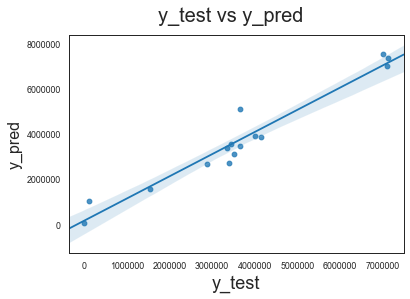

In [587]:
# plot points and fit line
# Plotting y_test and y_pred to understand the spread.
fig = plt.figure()
sns.regplot(y_test,y_pred)
fig.suptitle('y_test vs y_pred', fontsize=20)              # Plot heading 
plt.xlabel('y_test', fontsize=18)                          # X-label
plt.ylabel('y_pred', fontsize=16)                          # Y-label

In [588]:
# Evaluation metrics
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from statistics import stdev

#Returns the mean squared error; we'll take a square root
print('RMSE:', np.sqrt(mean_squared_error(y_test, y_pred)))
print('R-Squared:', round(r2_score(y_test, y_pred),2))

# Since RMSE is relative to the scale of our y-variable, let's normalize the RMSE by dividing it with the standard deviation
print('Normalized RMSE:', np.sqrt(mean_squared_error(y_test, y_pred))/stdev(y_train['gmv']))

RMSE: 524347.1777547986
R-Squared: 0.94
Normalized RMSE: 0.18168511310299393


In [589]:
# Getting the coefficients from the model
# The lr_3.summary() is a set of tables, which we can export as html and then use Pandas to convert to a dataframe
df = pd.read_html(lr.summary().tables[1].as_html(),header=0,index_col=0)[0]
features = df.reset_index()[['index', 'coef']].sort_values('coef', ascending=False)
features = features.loc[features['index']!='const',:]
features

,index,coef
19,product_analytic_vertical_HomeAudioSpeaker,512800.0
8,total_luxury_products,458300.0
10,total_customers,438900.0
11,total_quantity,430700.0
9,total_orders,428500.0
...,...,...
1,gmv_lag1,-143300.0
48,Affiliates,-158900.0
67,Stock Index,-161700.0
44,Online marketing,-267000.0


**Determining the TOTAL EFFECT of the kpi's from Koyck model**

As mentioned earlier, the total effect of advertising under koyck model = current effect + carry-over effect
= β1 + β1 * µ/(1-µ)	
= β1/(1-µ)

where µ = coefficient of lag variable

In [590]:
# The coefficient of lag variable
lag_coef = features.loc[features['index']=='gmv_lag1', 'coef']
lag_coef

1   -143300.0
Name: coef, dtype: float64

In [591]:
features['Total Effect'] = features['coef']/(1 - (-143300))
features.columns = ['KPI', 'Coefficient', 'Total Effect']
features

,KPI,Coefficient,Total Effect
19,product_analytic_vertical_HomeAudioSpeaker,512800.0,3.578482
8,total_luxury_products,458300.0,3.198163
10,total_customers,438900.0,3.062784
11,total_quantity,430700.0,3.005562
9,total_orders,428500.0,2.990209
...,...,...,...
1,gmv_lag1,-143300.0,-0.999993
48,Affiliates,-158900.0,-1.108855
67,Stock Index,-161700.0,-1.128394
44,Online marketing,-267000.0,-1.863211


Plotting the most important features off the back of our koyck model

Text(0.5, 0, 'Coefficient')

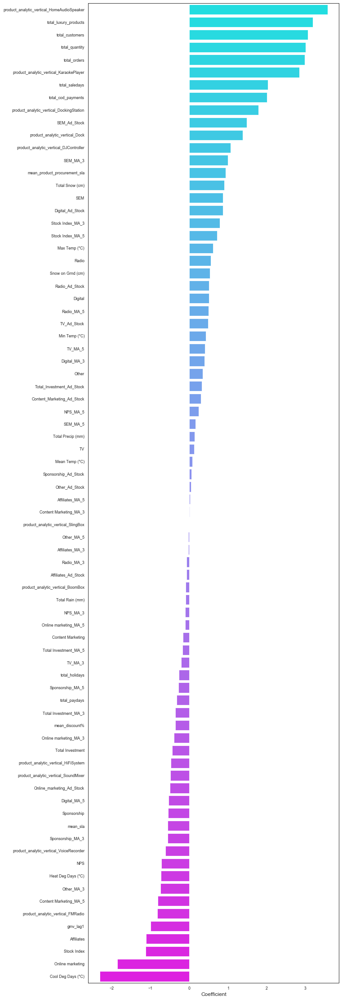

In [592]:
plt.figure(figsize=(10,40))
sns.barplot(y = features['KPI'], x = features['Total Effect'], orient='h', palette='cool')
plt.ylabel('', size=12)
plt.xlabel('Coefficient', size=12)

Clearly there exists a lot of multicollinearity in our data. Let's use **VIF** to detect the correlated variables

In [593]:
# Check for the VIF values of the feature variables. 
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train.columns
vif['VIF'] = [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,gmv_lag1,inf
50,Affiliates_Ad_Stock,inf
57,Radio_MA_5,inf
56,Radio_MA_3,inf
55,Radio,inf
...,...,...
25,Total Investment_MA_5,inf
24,Total Investment_MA_3,inf
23,Total Investment,inf
19,product_analytic_vertical_KaraokePlayer,35.0


Considering we're dealing with a really large set of data, it wouldn't be feasible of treating them 1 at a time. In that case, we'll opt for **Recursive Feature Elimination** to come down to about a smaller number of variables that explain the highest variance in the data and exhibit the least multicollinearity. Post that, we'll go into fine-tuning the model manually to end up with the final set of variables

In [594]:
# Importing RFE and LinearRegression
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression

lm = LinearRegression()
lm.fit(X_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

Let's perform RFE using 20 variables and then later fine-tune the model using other features such as the VIF, P-values and adjusted R-squared to identify the final set of variables

In [595]:
# running RFE
rfe = RFE(lm, 20)
rfe = rfe.fit(X_train, y_train)

zip(X_train.columns,rfe.support_,rfe.ranking_)

In [596]:
# Identify all the columns that were returned by our RFE model
col = X_train.columns[rfe.support_]
col

Index(['mean_product_procurement_sla', 'total_cod_payments',
       'total_luxury_products', 'total_orders', 'total_quantity',
       'product_analytic_vertical_FMRadio',
       'product_analytic_vertical_HiFiSystem',
       'product_analytic_vertical_HomeAudioSpeaker',
       'product_analytic_vertical_KaraokePlayer', 'Total Investment',
       'Total Investment_MA_3', 'Digital_MA_5', 'Digital_Ad_Stock',
       'Online marketing', 'Online_marketing_Ad_Stock', 'SEM_MA_3',
       'Radio_Ad_Stock', 'Stock Index_MA_5', 'Heat Deg Days (°C)',
       'Cool Deg Days (°C)'],
      dtype='object')

Let's now build the model using the above features and check its performance

In [597]:
# Creating X_test dataframe with RFE selected variables
X_train_rfe = X_train[col]
X_train_rfe = sm.add_constant(X_train_rfe)

lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                     3339.
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           2.03e-22
Time:                        16:09:22   Log-Likelihood:                -421.56
No. Observations:                  35   AIC:                             885.1
Df Residuals:                      14   BIC:                             917.8
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                                                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------

In [598]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
4,total_orders,15260.18
5,total_quantity,9162.25
8,product_analytic_vertical_HomeAudioSpeaker,4275.11
6,product_analytic_vertical_FMRadio,217.71
16,SEM_MA_3,112.97
14,Online marketing,101.16
13,Digital_Ad_Stock,100.69
15,Online_marketing_Ad_Stock,99.06
2,total_cod_payments,91.76
11,Total Investment_MA_3,80.73


We see that even after reducing the number of vaiables to 20 using RFE, the remaining variables are still able to explain a very high amount of variance in the y variable (evident by the very high R-squared value). Now that we've used RFE to drop all the insignificant variables, let's fine-tune our model by dropping those variable with high VIF or p values 1 at a time until we have a final set of variables that are able to explain a good amount of variance in the revenue variable.

In [599]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('total_orders', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                     2917.
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           2.18e-23
Time:                        16:09:29   Log-Likelihood:                -426.03
No. Observations:                  35   AIC:                             892.1
Df Residuals:                      15   BIC:                             923.2
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                                                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------

In [600]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('total_quantity', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                     2311.
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           6.13e-24
Time:                        16:09:29   Log-Likelihood:                -432.18
No. Observations:                  35   AIC:                             902.4
Df Residuals:                      16   BIC:                             931.9
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------

In [601]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('SEM_MA_3', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                     1811.
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           2.52e-24
Time:                        16:09:30   Log-Likelihood:                -438.51
No. Observations:                  35   AIC:                             913.0
Df Residuals:                      17   BIC:                             941.0
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                                                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------

In [602]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('Online_marketing_Ad_Stock', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                     1868.
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           1.18e-25
Time:                        16:09:30   Log-Likelihood:                -440.03
No. Observations:                  35   AIC:                             914.1
Df Residuals:                      18   BIC:                             940.5
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                                                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------

In [603]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('product_analytic_vertical_HomeAudioSpeaker', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.993
Model:                            OLS   Adj. R-squared:                  0.987
Method:                 Least Squares   F-statistic:                     172.0
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           4.81e-17
Time:                        16:09:31   Log-Likelihood:                -483.72
No. Observations:                  35   AIC:                             999.4
Df Residuals:                      19   BIC:                             1024.
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                                              coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------

In [604]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('Online marketing', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.992
Model:                            OLS   Adj. R-squared:                  0.987
Method:                 Least Squares   F-statistic:                     186.8
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           4.87e-18
Time:                        16:09:31   Log-Likelihood:                -484.38
No. Observations:                  35   AIC:                             998.8
Df Residuals:                      20   BIC:                             1022.
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                                              coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------

In [605]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('Digital_Ad_Stock', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.992
Model:                            OLS   Adj. R-squared:                  0.988
Method:                 Least Squares   F-statistic:                     211.2
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           3.25e-19
Time:                        16:09:32   Log-Likelihood:                -484.38
No. Observations:                  35   AIC:                             996.8
Df Residuals:                      21   BIC:                             1019.
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                                              coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------

In [606]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('Total Investment_MA_3', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.992
Model:                            OLS   Adj. R-squared:                  0.988
Method:                 Least Squares   F-statistic:                     233.8
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           2.67e-20
Time:                        16:09:32   Log-Likelihood:                -484.81
No. Observations:                  35   AIC:                             995.6
Df Residuals:                      22   BIC:                             1016.
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                                              coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------

In [607]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('total_cod_payments', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.977
Model:                            OLS   Adj. R-squared:                  0.965
Method:                 Least Squares   F-statistic:                     87.03
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           4.81e-16
Time:                        16:09:32   Log-Likelihood:                -504.13
No. Observations:                  35   AIC:                             1032.
Df Residuals:                      23   BIC:                             1051.
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                                              coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------

In [608]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('product_analytic_vertical_HiFiSystem', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.976
Model:                            OLS   Adj. R-squared:                  0.966
Method:                 Least Squares   F-statistic:                     98.47
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           5.48e-17
Time:                        16:09:35   Log-Likelihood:                -504.37
No. Observations:                  35   AIC:                             1031.
Df Residuals:                      24   BIC:                             1048.
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                                              coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------

In [609]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('Cool Deg Days (°C)', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.976
Model:                            OLS   Adj. R-squared:                  0.967
Method:                 Least Squares   F-statistic:                     112.2
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           5.97e-18
Time:                        16:09:36   Log-Likelihood:                -504.64
No. Observations:                  35   AIC:                             1029.
Df Residuals:                      25   BIC:                             1045.
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                                              coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------

In [610]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('Stock Index_MA_5', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.976
Model:                            OLS   Adj. R-squared:                  0.968
Method:                 Least Squares   F-statistic:                     131.2
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           5.02e-19
Time:                        16:09:39   Log-Likelihood:                -504.65
No. Observations:                  35   AIC:                             1027.
Df Residuals:                      26   BIC:                             1041.
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                                              coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------

In [611]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('Total Investment', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.974
Model:                            OLS   Adj. R-squared:                  0.967
Method:                 Least Squares   F-statistic:                     142.9
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           1.18e-19
Time:                        16:09:40   Log-Likelihood:                -506.11
No. Observations:                  35   AIC:                             1028.
Df Residuals:                      27   BIC:                             1041.
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                              coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------

In [612]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('Heat Deg Days (°C)', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.970
Model:                            OLS   Adj. R-squared:                  0.964
Method:                 Least Squares   F-statistic:                     152.7
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           4.63e-20
Time:                        16:09:40   Log-Likelihood:                -508.23
No. Observations:                  35   AIC:                             1030.
Df Residuals:                      28   BIC:                             1041.
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                                              coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------

In [613]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('mean_product_procurement_sla', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.968
Model:                            OLS   Adj. R-squared:                  0.962
Method:                 Least Squares   F-statistic:                     173.2
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           1.13e-20
Time:                        16:09:45   Log-Likelihood:                -509.77
No. Observations:                  35   AIC:                             1032.
Df Residuals:                      29   BIC:                             1041.
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                                              coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------

The above variables seem to be significant enough, and the corresponding R-squared value is also high hence we can infer that the variance is being explained pretty well by these variables.<br>
Looking at the F-statistic, it is pretty high and the corresponding p-value is almost 0 suggesting that it is significant.<br>
We've also taken into account the multicollinearity that may exist based on the VIF values.

**Let's go ahead and perform residual analysis to ensure that the assumptions of linear regression are being satisfied**

Text(0.5, 0, 'Errors')

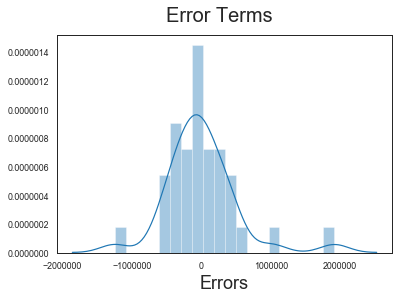

In [614]:
y_train_gmv = lr_3.predict(X_train_rfe)

# Plot the histogram of the error terms
fig = plt.figure()
sns.distplot((y_train['gmv'] - y_train_gmv), bins = 20)
fig.suptitle('Error Terms', fontsize = 20)                  # Plot heading 
plt.xlabel('Errors', fontsize = 18)                         # X-label

As we can see, the error terms are following a normal distribution with mean at 0

**Making the Predictions**

In [615]:
# Splitting the data into predictor and dependent variables
y_test = HomeAudkoy_test[['gmv']]
X_test = HomeAudkoy_test.drop('gmv', axis=1)

# Scaling the test variables
X_test[ls]=scaler.transform(X_test[ls])

# Now let's use our model to make predictions.

# Creating X_test_new dataframe by dropping variables from X_test
X_test_new = X_test[X_train_rfe.columns[1:]]

# Adding a constant variable 
X_test_new = sm.add_constant(X_test_new, has_constant='add')
# Making predictions
y_pred = lr_3.predict(X_test_new)
y_pred.head()

Week
36    3.961951e+06
66    4.224373e+06
67    3.770695e+06
58    7.417264e+06
73    3.564553e+06
dtype: float64

**Evaluating the Model**

Text(0, 0.5, 'y_pred')

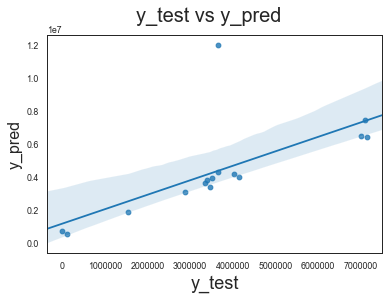

In [616]:
# plot points and fit line
# Plotting y_test and y_pred to understand the spread.
fig = plt.figure()
sns.regplot(y_test,y_pred)
fig.suptitle('y_test vs y_pred', fontsize=20)              # Plot heading 
plt.xlabel('y_test', fontsize=18)                          # X-label
plt.ylabel('y_pred', fontsize=16)                          # Y-label

Based on the above data, we can see that the model predictions seem to be pretty good

In [617]:
# Evaluation metrics
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from statistics import stdev

#Returns the mean squared error; we'll take a square root
print('RMSE:', np.sqrt(mean_squared_error(y_test, y_pred)))
print('R-Squared:', round(r2_score(y_test, y_pred),1))

# Since RMSE is relative to the scale of our y-variable, let's normalize the RMSE by dividing it with the standard deviation
print('Normalized RMSE:', np.sqrt(mean_squared_error(y_test, y_pred))/stdev(y_train['gmv']))

RMSE: 2179778.1482977076
R-Squared: -0.1
Normalized RMSE: 0.7552882063915702


**Plotting the most important features for the Tuned Koyck Model of the Home Audio Dataset**

Text(0.5, 0, 'Coefficient')

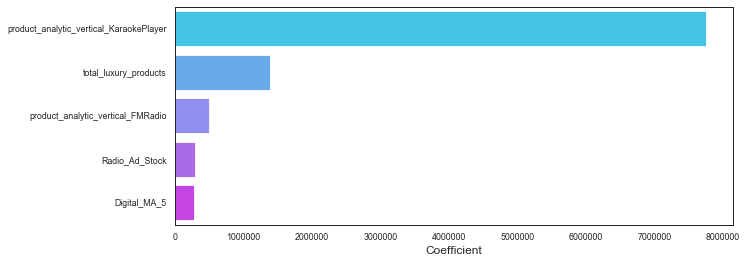

In [618]:
# Getting the coefficients from the model
# The lr_3.summary() is a set of tables, which we can export as html and then use Pandas to convert to a dataframe
df = pd.read_html(lr_3.summary().tables[1].as_html(),header=0,index_col=0)[0]
features = df.reset_index()[['index', 'coef']].sort_values('coef', ascending=False)
features = features.loc[features['index']!='const',:]

plt.figure(figsize=(10,4))
sns.barplot(y = features['index'], x = features['coef'], orient='h', palette='cool')
plt.ylabel('')
plt.xlabel('Coefficient', size=12)

### 4. Distributed Lag Model

The additive and multiplicative models built so far all help capture the current effect of the KPI's. However, it is vital that we capture the carry-over effect too.
The Koyck model that we previously built is a special type of distributed lag model that takes into account the carry-over effect of just the dependent variable to model the final output, along with the other KPI's.

In the distributed lag model, not only is the dependent variable entered in its lagged version, but the independent variables are as well. This is a more generalist model and captures the carry-over effect of all the variables. Thus as mentioned, the Koyck model is a special type of distributed lag model, which includes the lag value of only the dependent variable.

The equation of the distributed lag model is as follows: <br><br>
  __Yt__ = α+ µ1Yt-1 + µ2Yt-2 + µ3Yt-3 + ....

        + β1X1t + β1X1t-1 + β1X1t-2 + ....

        + β2X2t + β2X2t-1 + β2X2t-2 + ....

        + β3X3t + β3X3t-1 + β3X3t-2 + ....

        + β4X4t + β4X4t-1 + β4X4t-2 + ....

        + β5X5t + β5X5t-1 + β5X5t-2 + ....

        + ϵ

In [619]:
homeaud_weekly_dis = homeaud_weekly.copy()

# Setting the week number column as index
homeaud_weekly_dis = homeaud_weekly_dis.set_index('Week')

In order to create the ditributed lag model, we will create 3 lag variables for every variable in our dataset. This would mean we'll have a 1-week lag, 2-week lag, and 3 week-lag for every variable in our dataset.

In [620]:
# We'll be using the lag function defined earlier to create the lag columns
# The inputs it will take is dataframe (df), column name (col), shift count (n) and create a new column in the same df
def lag_func(df,col,n):
    for i in col:
        loc_index = df.columns.get_loc(i) + 1
        df.insert(loc=loc_index,column= i+'_lag'+np.str(n),value=df[i].shift(n))
    return df
lag_col = list(homeaud_weekly_dis.columns)

# Introducing 1-week lag
homeaud_weekly_dis = lag_func(homeaud_weekly_dis,lag_col,1)

# Introducing 2-week lag
homeaud_weekly_dis = lag_func(homeaud_weekly_dis,lag_col,2)

# Introducing 3-week lag
homeaud_weekly_dis = lag_func(homeaud_weekly_dis,lag_col,3)

homeaud_weekly_dis.head()

,gmv,gmv_lag3,gmv_lag2,gmv_lag1,mean_discount%,mean_discount%_lag3,mean_discount%_lag2,mean_discount%_lag1,mean_sla,mean_sla_lag3,...,Total Snow (cm)_lag2,Total Snow (cm)_lag1,Total Precip (mm),Total Precip (mm)_lag3,Total Precip (mm)_lag2,Total Precip (mm)_lag1,Snow on Grnd (cm),Snow on Grnd (cm)_lag3,Snow on Grnd (cm)_lag2,Snow on Grnd (cm)_lag1
Week,,,,,,,,,,,,,,,,,,,,,
27,1.147430e+05,NaN,NaN,NaN,36.795122,NaN,NaN,NaN,2.707317,NaN,...,NaN,NaN,0.000000,NaN,NaN,NaN,0.0,NaN,NaN,NaN
28,4.599818e+06,NaN,NaN,1.147430e+05,32.379463,NaN,NaN,36.795122,7.178711,NaN,...,NaN,0.0,4.416667,NaN,NaN,0.000000,0.0,NaN,NaN,0.0
29,5.385425e+06,NaN,1.147430e+05,4.599818e+06,33.801071,NaN,36.795122,32.379463,6.926139,NaN,...,0.0,0.0,1.400000,NaN,0.000000,4.416667,0.0,NaN,0.0,0.0
30,4.722155e+06,1.147430e+05,4.599818e+06,5.385425e+06,33.586682,36.795122,32.379463,33.801071,7.048438,2.707317,...,0.0,0.0,0.900000,0.000000,4.416667,1.400000,0.0,0.0,0.0,0.0
31,3.421038e+06,4.599818e+06,5.385425e+06,4.722155e+06,33.208560,32.379463,33.801071,33.586682,7.163882,7.178711,...,0.0,0.0,4.633333,4.416667,1.400000,0.900000,0.0,0.0,0.0,0.0


In [621]:
# Replacing all the nan values with 0
homeaud_weekly_dis = homeaud_weekly_dis.fillna(0)
homeaud_weekly_dis.head()

,gmv,gmv_lag3,gmv_lag2,gmv_lag1,mean_discount%,mean_discount%_lag3,mean_discount%_lag2,mean_discount%_lag1,mean_sla,mean_sla_lag3,...,Total Snow (cm)_lag2,Total Snow (cm)_lag1,Total Precip (mm),Total Precip (mm)_lag3,Total Precip (mm)_lag2,Total Precip (mm)_lag1,Snow on Grnd (cm),Snow on Grnd (cm)_lag3,Snow on Grnd (cm)_lag2,Snow on Grnd (cm)_lag1
Week,,,,,,,,,,,,,,,,,,,,,
27,1.147430e+05,0.000000e+00,0.000000e+00,0.000000e+00,36.795122,0.000000,0.000000,0.000000,2.707317,0.000000,...,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0
28,4.599818e+06,0.000000e+00,0.000000e+00,1.147430e+05,32.379463,0.000000,0.000000,36.795122,7.178711,0.000000,...,0.0,0.0,4.416667,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0
29,5.385425e+06,0.000000e+00,1.147430e+05,4.599818e+06,33.801071,0.000000,36.795122,32.379463,6.926139,0.000000,...,0.0,0.0,1.400000,0.000000,0.000000,4.416667,0.0,0.0,0.0,0.0
30,4.722155e+06,1.147430e+05,4.599818e+06,5.385425e+06,33.586682,36.795122,32.379463,33.801071,7.048438,2.707317,...,0.0,0.0,0.900000,0.000000,4.416667,1.400000,0.0,0.0,0.0,0.0
31,3.421038e+06,4.599818e+06,5.385425e+06,4.722155e+06,33.208560,32.379463,33.801071,33.586682,7.163882,7.178711,...,0.0,0.0,4.633333,4.416667,1.400000,0.900000,0.0,0.0,0.0,0.0


**Splitting the data into test and train**

In [622]:
from sklearn.model_selection import train_test_split

# We specify this so that the train and test data set always have the same rows, respectively
np.random.seed(1)

HomeAuddis_train, HomeAuddis_test = train_test_split(homeaud_weekly_dis, train_size = 0.7, test_size = 0.3, random_state = 100)

print(HomeAuddis_train.shape)
print(HomeAuddis_test.shape)

(35, 312)
(15, 312)


**Scaling the features** - Using Standard Scaling as explained in the previous model

In [623]:
# Splitting the data into predictor and dependent variables
y_train = HomeAuddis_train[['gmv']]
X_train = HomeAuddis_train.drop('gmv', axis=1)

# Identifying all the non-binary variables
ls = []

for i in range(len(X_train.columns)):
    if X_train[X_train.columns[i]].nunique()>=3:
        ls.append(X_train.columns[i])

# Applying Standard Scaling to these features
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train[ls]=scaler.fit_transform(X_train[ls])

X_train.describe()

,gmv_lag3,gmv_lag2,gmv_lag1,mean_discount%,mean_discount%_lag3,mean_discount%_lag2,mean_discount%_lag1,mean_sla,mean_sla_lag3,mean_sla_lag2,...,Total Snow (cm)_lag2,Total Snow (cm)_lag1,Total Precip (mm),Total Precip (mm)_lag3,Total Precip (mm)_lag2,Total Precip (mm)_lag1,Snow on Grnd (cm),Snow on Grnd (cm)_lag3,Snow on Grnd (cm)_lag2,Snow on Grnd (cm)_lag1
count,3.500000e+01,3.500000e+01,3.500000e+01,3.500000e+01,3.500000e+01,3.500000e+01,3.500000e+01,3.500000e+01,3.500000e+01,3.500000e+01,...,3.500000e+01,3.500000e+01,3.500000e+01,3.500000e+01,3.500000e+01,3.500000e+01,3.500000e+01,3.500000e+01,3.500000e+01,3.500000e+01
mean,-3.108624e-16,-3.251367e-16,1.411569e-16,-3.616155e-16,4.440892e-17,-1.819973e-16,1.561449e-15,-6.217249e-16,8.881784e-17,-1.704985e-17,...,-3.172066e-18,-9.516197e-18,-1.205385e-16,-4.123686e-17,-8.881784e-17,6.502735e-17,-1.681195e-16,6.344132e-18,-1.015061e-16,-1.046782e-16
std,1.014599e+00,1.014599e+00,1.014599e+00,1.014599e+00,1.014599e+00,1.014599e+00,1.014599e+00,1.014599e+00,1.014599e+00,1.014599e+00,...,1.014599e+00,1.014599e+00,1.014599e+00,1.014599e+00,1.014599e+00,1.014599e+00,1.014599e+00,1.014599e+00,1.014599e+00,1.014599e+00
min,-1.450747e+00,-1.536010e+00,-1.758941e+00,-1.540690e+00,-3.523719e+00,-4.512322e+00,-1.561119e+00,-2.005310e+00,-3.253228e+00,-3.994043e+00,...,-3.758323e-01,-3.044568e-01,-7.703116e-01,-7.790955e-01,-8.289769e-01,-7.462154e-01,-3.194478e-01,-2.995723e-01,-2.794892e-01,-2.642951e-01
25%,-3.642810e-01,-4.350406e-01,-5.145041e-01,-6.921982e-01,6.979037e-03,-1.175772e-01,-6.466759e-01,-6.416639e-01,-2.385798e-01,-3.315757e-01,...,-3.758323e-01,-3.044568e-01,-6.750658e-01,-7.577435e-01,-8.030518e-01,-7.259490e-01,-3.194478e-01,-2.995723e-01,-2.794892e-01,-2.642951e-01
50%,-1.139254e-01,-1.260119e-01,-1.588738e-01,-1.672424e-01,1.989143e-01,8.880862e-02,-1.896101e-01,-4.531255e-02,1.625872e-01,1.184346e-01,...,-3.758323e-01,-3.044568e-01,-3.893285e-01,-2.097087e-01,-3.450422e-01,-4.868054e-01,-3.194478e-01,-2.995723e-01,-2.794892e-01,-2.642951e-01
75%,1.982722e-01,3.098881e-01,2.878701e-01,5.565684e-01,3.962022e-01,4.173600e-01,5.533081e-01,7.311012e-01,4.526003e-01,3.458555e-01,...,-3.758323e-01,-3.044568e-01,3.368072e-01,3.482905e-01,3.151831e-01,4.179769e-01,-3.194478e-01,-2.995723e-01,-2.794892e-01,-2.642951e-01
max,4.542739e+00,4.468124e+00,4.697064e+00,2.307751e+00,1.164025e+00,1.250306e+00,2.281665e+00,1.937057e+00,2.197102e+00,2.625689e+00,...,3.203523e+00,3.691538e+00,3.502142e+00,3.690591e+00,2.696833e+00,3.496218e+00,5.339342e+00,4.194013e+00,5.524258e+00,5.470909e+00


**Building the distributed lag model**

In [624]:
# Fitting a regression line using statsmodels.api
import statsmodels.api as sm

# Add a constant
X_train_lm = sm.add_constant(X_train)

# Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

# Check the summary
print(lr.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                     0.000
Date:                Sun, 22 Dec 2019   Prob (F-statistic):                nan
Time:                        16:10:14   Log-Likelihood:                 577.53
No. Observations:                  35   AIC:                            -1085.
Df Residuals:                       0   BIC:                            -1031.
Df Model:                          34                                         
Covariance Type:            nonrobust                                         
                                                      coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------

**Making the Predictions**

In [625]:
# Splitting the data into predictor and dependent variables
y_test = HomeAuddis_test[['gmv']]
X_test = HomeAuddis_test.drop('gmv', axis=1)

# Scaling the test variables
X_test[ls]=scaler.transform(X_test[ls])

# Now let's use our model to make predictions.

# Creating X_test_new dataframe by dropping variables from X_test
X_test_new = X_test[X_train.columns[:]]

# Adding a constant variable 
X_test_new = sm.add_constant(X_test_new, has_constant='add')

# Making predictions
y_pred = lr.predict(X_test_new)
y_pred.head()

Week
36    4.959527e+06
66    3.813384e+06
67    3.307623e+06
58    7.227661e+06
73    3.457036e+06
dtype: float64

**Evaluating the model**

Text(0, 0.5, 'y_pred')

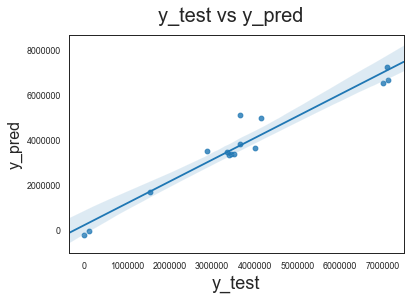

In [626]:
# plot points and fit line
# Plotting y_test and y_pred to understand the spread.
fig = plt.figure()
sns.regplot(y_test,y_pred)
fig.suptitle('y_test vs y_pred', fontsize=20)              # Plot heading 
plt.xlabel('y_test', fontsize=18)                          # X-label
plt.ylabel('y_pred', fontsize=16)                          # Y-label

In [627]:
# Evaluation metrics
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from statistics import stdev

#Returns the mean squared error; we'll take a square root
print('RMSE:', np.sqrt(mean_squared_error(y_test, y_pred)))
print('R-Squared:', round(r2_score(y_test, y_pred),2))

# Since RMSE is relative to the scale of our y-variable, let's normalize the RMSE by dividing it with the standard deviation
print('Normalized RMSE:', np.sqrt(mean_squared_error(y_test, y_pred))/stdev(y_train['gmv']))

RMSE: 517932.13072433084
R-Squared: 0.94
Normalized RMSE: 0.17946231379227354


Plotting the most important features off the back of our vanilla model

Text(0.5, 0, 'Coefficient')

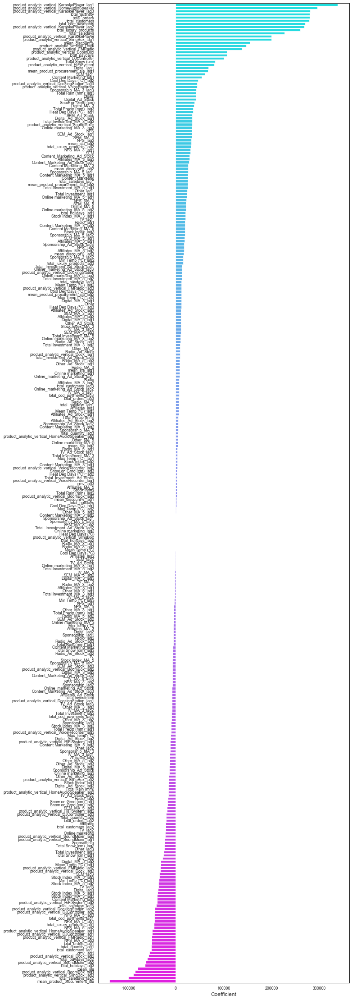

In [628]:
# Getting the coefficients from the model
# The lr_3.summary() is a set of tables, which we can export as html and then use Pandas to convert to a dataframe
df = pd.read_html(lr.summary().tables[1].as_html(),header=0,index_col=0)[0]
features = df.reset_index()[['index', 'coef']].sort_values('coef', ascending=False)
features = features.loc[features['index']!='const',:]

plt.figure(figsize=(10,40))
sns.barplot(y = features['index'], x = features['coef'], orient='h', palette='cool')
plt.ylabel('', size=12)
plt.xlabel('Coefficient', size=12)

Clearly there exists a lot of multicollinearity in our data. Let's use **VIF** to detect the correlated variables

In [629]:
# Check for the VIF values of the feature variables. 
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train.columns
vif['VIF'] = [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,gmv_lag3,inf
205,SEM_lag2,inf
212,SEM_MA_5_lag3,inf
211,SEM_MA_5,inf
210,SEM_MA_3_lag1,inf
...,...,...
102,Total Investment_MA_5_lag1,inf
101,Total Investment_MA_5_lag2,inf
100,Total Investment_MA_5_lag3,inf
310,Snow on Grnd (cm)_lag1,inf


Considering we're dealing with a really large set of data, it wouldn't be feasible of treating them 1 at a time. In that case, we'll opt for **Recursive Feature Elimination** to come down to about a smaller number of variables that explain the highest variance in the data and exhibit the least multicollinearity. Post that, we'll go into fine-tuning the model manually to end up with the final set of variables

In [630]:
# Importing RFE and LinearRegression
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression

lm = LinearRegression()
lm.fit(X_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

Let's perform RFE using 12 variables and then later fine-tune the model using other features such as the VIF, P-values and adjusted R-squared to identify the final set of variables

In [631]:
# running RFE
rfe = RFE(lm, 12)
rfe = rfe.fit(X_train, y_train)

zip(X_train.columns,rfe.support_,rfe.ranking_)

In [632]:
# Identify all the columns that were returned by our RFE model
col = X_train.columns[rfe.support_]
col

Index(['total_cod_payments', 'total_luxury_products', 'total_orders',
       'total_customers', 'total_quantity',
       'product_analytic_vertical_SlingBox_lag3', 'Total Investment_MA_5_lag1',
       'Digital_lag1', 'Digital_MA_3', 'Sponsorship_MA_3_lag3',
       'NPS_MA_5_lag1', 'Stock Index_MA_5_lag2'],
      dtype='object')

Let's now build the model using the above features and check its performance

In [633]:
# Creating X_test dataframe with RFE selected variables
X_train_rfe = X_train[col]
X_train_rfe = sm.add_constant(X_train_rfe)

lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.996
Method:                 Least Squares   F-statistic:                     727.0
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           1.10e-25
Time:                        16:10:38   Log-Likelihood:                -465.05
No. Observations:                  35   AIC:                             956.1
Df Residuals:                      22   BIC:                             976.3
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                                              coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------

In [634]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
3,total_orders,19162.40
5,total_quantity,8192.94
4,total_customers,5715.51
1,total_cod_payments,52.62
11,NPS_MA_5_lag1,50.94
12,Stock Index_MA_5_lag2,49.91
8,Digital_lag1,25.87
9,Digital_MA_3,24.76
7,Total Investment_MA_5_lag1,22.28
10,Sponsorship_MA_3_lag3,15.27


We see that even after reducing the number of vaiables to 12 using RFE, the remaining variables are still able to explain a very high amount of variance in the y variable (evident by the very high R-squared value). Now that we've used RFE to drop all the insignificant variables, let's fine-tune our model by dropping those variable with high VIF or p values 1 at a time until we have a final set of variables that are able to explain a good amount of variance in the revenue variable.

In [635]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('total_orders', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.996
Method:                 Least Squares   F-statistic:                     746.3
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           1.24e-26
Time:                        16:10:50   Log-Likelihood:                -466.89
No. Observations:                  35   AIC:                             957.8
Df Residuals:                      23   BIC:                             976.4
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                                              coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------

In [636]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('total_quantity', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.996
Method:                 Least Squares   F-statistic:                     831.2
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           5.84e-28
Time:                        16:10:51   Log-Likelihood:                -467.41
No. Observations:                  35   AIC:                             956.8
Df Residuals:                      24   BIC:                             973.9
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                                              coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------

In [637]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('total_customers', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.964
Model:                            OLS   Adj. R-squared:                  0.952
Method:                 Least Squares   F-statistic:                     75.19
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           7.38e-16
Time:                        16:10:51   Log-Likelihood:                -511.44
No. Observations:                  35   AIC:                             1043.
Df Residuals:                      25   BIC:                             1058.
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                                              coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------

In [638]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('Stock Index_MA_5_lag2', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.963
Model:                            OLS   Adj. R-squared:                  0.952
Method:                 Least Squares   F-statistic:                     85.00
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           1.16e-16
Time:                        16:10:52   Log-Likelihood:                -512.02
No. Observations:                  35   AIC:                             1042.
Df Residuals:                      26   BIC:                             1056.
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                                              coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------

In [639]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('Digital_lag1', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.961
Model:                            OLS   Adj. R-squared:                  0.951
Method:                 Least Squares   F-statistic:                     95.84
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           2.13e-17
Time:                        16:10:53   Log-Likelihood:                -512.88
No. Observations:                  35   AIC:                             1042.
Df Residuals:                      27   BIC:                             1054.
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                              coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------

In [640]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('Total Investment_MA_5_lag1', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.953
Model:                            OLS   Adj. R-squared:                  0.943
Method:                 Least Squares   F-statistic:                     94.69
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           2.79e-17
Time:                        16:10:54   Log-Likelihood:                -516.27
No. Observations:                  35   AIC:                             1047.
Df Residuals:                      28   BIC:                             1057.
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                                              coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------

In [641]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('Digital_MA_3', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.953
Model:                            OLS   Adj. R-squared:                  0.945
Method:                 Least Squares   F-statistic:                     117.7
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           2.42e-18
Time:                        16:10:55   Log-Likelihood:                -516.27
No. Observations:                  35   AIC:                             1045.
Df Residuals:                      29   BIC:                             1054.
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                                              coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------

In [642]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('Sponsorship_MA_3_lag3', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.952
Model:                            OLS   Adj. R-squared:                  0.946
Method:                 Least Squares   F-statistic:                     150.3
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           2.18e-19
Time:                        16:10:56   Log-Likelihood:                -516.48
No. Observations:                  35   AIC:                             1043.
Df Residuals:                      30   BIC:                             1051.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                                              coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------

In [643]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('total_luxury_products', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.948
Model:                            OLS   Adj. R-squared:                  0.943
Method:                 Least Squares   F-statistic:                     190.1
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           4.89e-20
Time:                        16:11:01   Log-Likelihood:                -517.91
No. Observations:                  35   AIC:                             1044.
Df Residuals:                      31   BIC:                             1050.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                                              coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------

In [644]:
# Dropping highly correlated variables and insignificant variables
X_train_rfe = X_train_rfe.drop('NPS_MA_5_lag1', 1)

# Build a second fitted model
X_train_rfe = sm.add_constant(X_train_rfe)
lr_3 = sm.OLS(y_train, X_train_rfe).fit()

# Print the summary of the model
print(lr_3.summary())

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif.reset_index(drop=True))

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.948
Model:                            OLS   Adj. R-squared:                  0.945
Method:                 Least Squares   F-statistic:                     290.6
Date:                Sun, 22 Dec 2019   Prob (F-statistic):           3.02e-21
Time:                        16:11:06   Log-Likelihood:                -518.12
No. Observations:                  35   AIC:                             1042.
Df Residuals:                      32   BIC:                             1047.
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                                              coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------

The above variables seem to be significant enough, and the corresponding R-squared value is also high hence we can infer that the variance is being explained pretty well by these variables.<br>
Looking at the F-statistic, it is pretty high and the corresponding p-value is almost 0 suggesting that it is significant.<br>
We've also taken into account the multicollinearity that may exist based on the VIF values.

**Let's go ahead and perform residual analysis to ensure that the assumptions of linear regression are being satisfied**

Text(0.5, 0, 'Errors')

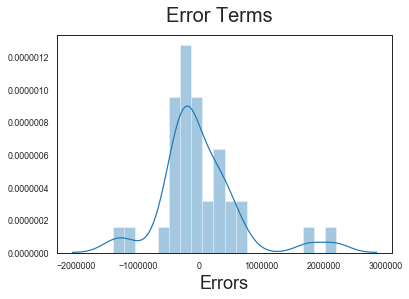

In [645]:
y_train_gmv = lr_3.predict(X_train_rfe)

# Plot the histogram of the error terms
fig = plt.figure()
sns.distplot((y_train['gmv'] - y_train_gmv), bins = 20)
fig.suptitle('Error Terms', fontsize = 20)                  # Plot heading 
plt.xlabel('Errors', fontsize = 18)                         # X-label

As we can see, the error terms are following a normal distribution with mean at 0

**Making the Predictions**

In [646]:
# Splitting the data into predictor and dependent variables
y_test = HomeAuddis_test[['gmv']]
X_test = HomeAuddis_test.drop('gmv', axis=1)

# Scaling the test variables
X_test[ls]=scaler.transform(X_test[ls])

# Now let's use our model to make predictions.

# Creating X_test_new dataframe by dropping variables from X_test
X_test_new = X_test[X_train_rfe.columns[1:]]

# Adding a constant variable 
X_test_new = sm.add_constant(X_test_new, has_constant='add')
# Making predictions
y_pred = lr_3.predict(X_test_new)
y_pred.head()

Week
36    4.063563e+06
66    2.047870e+06
67   -2.909498e+05
58    7.931848e+06
73    3.192661e+06
dtype: float64

**Evaluating the Model**

Text(0, 0.5, 'y_pred')

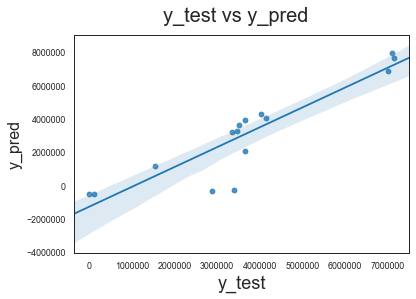

In [647]:
# plot points and fit line
# Plotting y_test and y_pred to understand the spread.
fig = plt.figure()
sns.regplot(y_test,y_pred)
fig.suptitle('y_test vs y_pred', fontsize=20)              # Plot heading 
plt.xlabel('y_test', fontsize=18)                          # X-label
plt.ylabel('y_pred', fontsize=16)                          # Y-label

Based on the above data, we can see that the model predictions seem to be pretty good

In [648]:
# Evaluation metrics
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from statistics import stdev

#Returns the mean squared error; we'll take a square root
print('RMSE:', np.sqrt(mean_squared_error(y_test, y_pred)))
print('R-Squared:', round(r2_score(y_test, y_pred),1))

# Since RMSE is relative to the scale of our y-variable, let's normalize the RMSE by dividing it with the standard deviation
print('Normalized RMSE:', round(np.sqrt(mean_squared_error(y_test, y_pred))/stdev(y_train['gmv']),2))

RMSE: 1381481.5375554885
R-Squared: 0.6
Normalized RMSE: 0.48


**Plotting the most important features for the Tuned Distributed Lag Model of the Home Audio Dataset**

Text(0.5, 0, 'Coefficient')

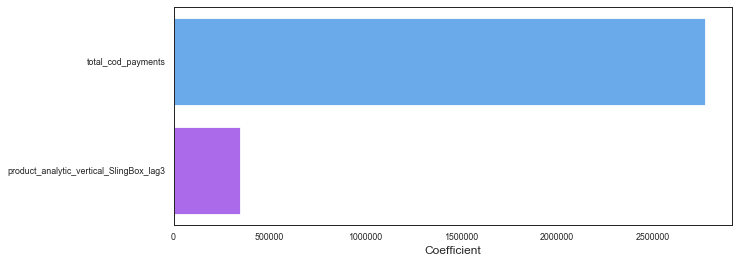

In [649]:
# Getting the coefficients from the model
# The lr_3.summary() is a set of tables, which we can export as html and then use Pandas to convert to a dataframe
df = pd.read_html(lr_3.summary().tables[1].as_html(),header=0,index_col=0)[0]
features = df.reset_index()[['index', 'coef']].sort_values('coef', ascending=False)
features = features.loc[features['index']!='const',:]

plt.figure(figsize=(10,4))
sns.barplot(y = features['index'], x = features['coef'], orient='h', palette='cool')
plt.ylabel('')
plt.xlabel('Coefficient', size=12)

-----
<br>

## Model Highlights

Let's summarize all the models that we've created for each of the 3 datasets, and their evaluation parameters. We'll be selecting the best model for each of the category based on the R-squared value (should be high) and the Normalized RMSE value (should be low) and identify the KPI's that are being considered as the impactful ones by those models.

|Product Sub-category|Regression Model|R-squared on Test Dataset|Normalized RMSE on Test Dataset|
|--------------------|-----------------------|------------------------|-----------------|
|Camera Accessory|Additive|0.96|0.22|
||<font color = blue>__Multiplicative__|<font color = blue>__0.97__|<font color = blue>__0.40__|
||Koyck|0.92|0.31|
||Distributive Lag Model|0.84|0.45|
|Game Accessory|<font color = blue>__Additive__|<font color = blue>__0.98__|<font color = blue>__0.18__|
||Multiplicative|0.94|0.33|
||Koyck|0.92|0.32|
||Distributive Lag Model|0.83|0.46|
|Home Audio|Additive|-0.17|0.79|
||<font color = blue>__Multiplicative__|<font color = blue>__0.99__|<font color = blue>__0.21__|
||Koyck|-0.10|0.76|
||Distributive Lag Model|0.60|0.48|



Highlighted in Blue above are the models identified as the best performing ones in the respective product sub-category.

Let's narrow down on the identified models within each category and see what are the top KPI's that contribute to the revenue for each category.

|Product Sub-category|Regression Model|R-squared on Test Dataset|Normalized RMSE on Test Dataset|KPI's Considered (Rank)|
|--------------------|-----------------------|------------------------|-----------------|-----------------|
|**Camera Accessory**|**Multiplicative**|0.97|0.40|<font color = blue>Product Analytic Vertical - Binoculars (1)|
|||||<font color = blue>Product Analytic Vertical - Camera Accessory (2)|
|||||<font color = red>Total Holidays (3)|
|||||<font color = red>Stock Index (4)|
|||||<font color = red>Mean SLA (5)|
||||||
|**Game Accessory**|**Additive**|0.98|0.18|<font color = blue>Product Analytic Vertical - Game Pad (1)|
|||||<font color = blue>Product Analytic Vertical - Gaming Headset (2)|
|||||<font color = blue>TV - 3-Week Moving Average (3)|
|||||<font color = blue>Product Analytic Vertical - Gaming Mouse (4)|
|||||<font color = blue>Min Temp (°C) (5)|
|||||<font color = red>Digital - Ad Stock (6)|
||||||
|**Home Audio**|**Multiplicative**|0.99|0.21|<font color = blue>Total Customers (1)|
|||||<font color = blue>SEM - Ad Stock (2)|
|||||<font color = blue>Product Analytic Vertical - Docking Station (3)|
|||||<font color = red>Radio - 3-Week Moving Average (4)|
|||||<font color = red>Sponsorship (5)|

From the above, we see that the Camera Accessory & Home Audio sub-category have a multiplicative impact of the significant KPI's on their respective revenue generated, and the Game Accessory sub-category has an additive impact of the significant KPI's on the revenue. The KPI's marked in <font color = blue>Blue</font> are those that affect the revenue positively, and those in <font color = red>Red</font> are the ones that affect the revenue negatively for their respective product sub-category

## Recommendations

### Camera Accessory:
- From EDA, we identified Lens as the highest revenue generating product & Flash as the most sought after one. From the model, we see that Binoculars contribute significantly to the revenue. ElecKart should look to market these products more in the coming year.
- We see that holidays and average SLA contribute negatively to the revenue. What this means is that consumers prefer purchasing products in this vertical during non-holidays. Also, the company should ensure that they focus on delivering the products in this category to the consumers with a small SLA.
- 'Mass-market' products are better contributors to the increased revenue in comparison to the Luxury products.
- The company should give higher percentage of 'Discounts' for this category as from the EDA we see that majority of the consumers look forward to use discount coupons for camera accessory products.


### Gaming Accessory:
- Company should promote 'Game Pad', 'Gaming Headset' & 'Gaming Mouse' as these products are the ones that significantly contribute to the revenue as per our final additive model.
- We observe that there is a positive impact of TV advertisement (3-week Moving Average), and they should invest a significant amount in TV advertising in the coming year.
- From our model, the 'Min Temp (°C)' is a significant factor in the revenue for this category. A positive impact of this means that higher min temperatures result in higher revenue, and ElecKart can use this information to shift advertising and promotional spends to times with higher temperatures.
- As opposed to TV Ad, the Digital Ad Stock tend to have a negative impact on the revenue. ElecKart can look to shift some of the ad investments out of digital, into other channels
- From the EDA, we see that 'Mass-market' products are better contributors to the increased revenue in comparison to the Luxury products.


### Home Audio:
- Company should promote 'Docking Stations' as this product appears to be contributing most significantly to the revenue compared to any other product.
- We observe several Marketing levers coming up as impactful KPI's for this category. From the multiplicative model, we can infer that SEM (Ad Stock) contributes positively to the revenue generated as opposed to Radio (3-Week Moving Average) & Sponsorship, which affect the revenue negatively. ElecKart can look to re-align their marketing budget for next year by shifting spends to the SEM strategy.
- The total customers play a significant part in generating revenue for this category according to our model. As part of the company's marketing strategy for next year, they should look to drive more traffic/footfall to their website/stores as this would have a positive impact on the revenue.
- The category has products which form the pricier section of the company. From the EDA, we see that the customers prefer paying for high-value products using prepaid modes rather than COD. Eleckart can use prepaid promotional techniques (such as cashbacks, prepaid payment mode discounts) to encourage more people to purchase these products.


### In General:
- During festive time(eg. Black Friday, Halloween, Christmas, Hanukkah, Thanksgiving) there are clear surges in sales. It is evident from the data that this forms the shopping season, and the company should focus having their sale dates around these festive seasons to garner more revenue.
- From EDA, we see that there is a clear spike in sales mid-month (potential pay-date). Eleckart should ensure that they're stocking up their inventory to prepare for the rise in sales at this time so that they're not missing out on revenue due to lack of inventory.
- From the EDA, we see that existing customers are clearly more valuable to ElecKart than any new customers (both in terms of items purchased and cart value). The company should ensure that they retain their loyal customers by providing additional benefits such as loyalty benefits, discounts with every subsequent purchase.
- ElecKart can also introduce their own wallet which can be used just to purchase their products - with added discounts. This would be another strategy to prevent existing customers from churning.
- The company should advertise for different categories of products differently. From the models we created, we figured that different categories require different channels for advertising. The advertising budget for next year should be created keeping in mind the split for each product category.